# Análise Exploratória dos Tempos de Permanência Portuária no Brasil

## 0. Preparação do notebook e premissas da análise

Este notebook inaugura uma nova etapa exploratória do projeto: em vez de apenas inspecionar tabelas e gerar estatísticas descritivas isoladas, o objetivo aqui é construir uma narrativa analítica sobre a variabilidade dos tempos portuários no Brasil.

O foco da análise é entender como a permanência de uma embarcação no porto se comporta, quais componentes formam esse tempo total, quais portos e regiões concentram maior variabilidade e quais fatores parecem influenciar o lead time observado.

A análise parte da base consolidada `eda_base.parquet`, construída previamente pela pipeline do projeto. Essa base reúne informações de eventos portuários, dados de localização dos portos, atributos temporais, variáveis climáticas e proxies de congestionamento operacional.

Do ponto de vista do TCC, esta análise é importante porque o lead time portuário representa uma fonte concreta de incerteza logística. Quanto maior a variabilidade do lead time, maior tende a ser a necessidade de buffers, estoques de segurança e capital de giro. Portanto, compreender essa variabilidade é o primeiro passo para justificar o uso de modelos preditivos na otimização de decisões de Supply Chain.

In [1]:
# 0.1. Initial Setup

# Standard library imports
from pathlib import Path
import sys
import warnings

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 100)
pd.set_option("display.float_format", lambda x: f"{x:,.2f}")

plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 11
plt.rcParams["xtick.labelsize"] = 10
plt.rcParams["ytick.labelsize"] = 10

In [2]:
# 0.2. Project root directory

def find_project_root(start_path: Path | None = None) -> Path:
    """Find the project root by looking for known project markers."""
    start_path = start_path or Path.cwd()
    start_path = start_path.resolve()

    markers = [
        "README.md",
        "src",
        "data",
    ]

    for path in [start_path, *start_path.parents]:
        if all((path / marker).exists() for marker in markers):
            return path

    raise FileNotFoundError(
        "Project root not found. Please run this notebook from inside the project repository."
    )


PROJECT_ROOT = find_project_root()

if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

PROJECT_ROOT

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction')

In [3]:
# 0.3. Paths

try:
    from src.paths import DATA_DIR, PROCESSED_DIR, OUTPUTS_DIR, FIGURES_DIR, TABLES_DIR
    from src.config import EDA_BASE_FILE
except ImportError:
    # Fallback in case the notebook is executed before the package path is properly configured
    DATA_DIR = PROJECT_ROOT / "data"
    PROCESSED_DIR = DATA_DIR / "processed"
    OUTPUTS_DIR = PROJECT_ROOT / "outputs"
    FIGURES_DIR = OUTPUTS_DIR / "figures"
    TABLES_DIR = OUTPUTS_DIR / "tables"
    EDA_BASE_FILE = PROCESSED_DIR / "eda_base.parquet"

FIGURES_DIR.mkdir(parents=True, exist_ok=True)
TABLES_DIR.mkdir(parents=True, exist_ok=True)

print(f"Project root: {PROJECT_ROOT}")
print(f"EDA base file: {EDA_BASE_FILE}")
print(f"Figures directory: {FIGURES_DIR}")
print(f"Tables directory: {TABLES_DIR}")

Project root: G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction
EDA base file: G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\data\processed\eda_base.parquet
Figures directory: G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures
Tables directory: G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\tables


In [4]:
# 0.4. Load EDA base data

if not EDA_BASE_FILE.exists():
    raise FileNotFoundError(
        f"EDA base file not found: {EDA_BASE_FILE}\n\n"
        "Run the EDA base pipeline before executing this notebook:\n"
        "python pipelines/build_eda_base.py"
    )

df = pd.read_parquet(EDA_BASE_FILE)

print(f"Rows: {len(df):,}")
print(f"Columns: {df.shape[1]:,}")

df.head()

Rows: 129,625
Columns: 126


,port_call_id,port,port_name,imo,vessel_id,vessel_name,operation_type,source_port,source_port_name,destination_port,destination_port_name,arrival_port_ts,berthing_ts,unberthing_ts,departure_port_ts,port_display,source_port_display,destination_port_display,has_arrival_port_ts,has_berthing_ts,has_unberthing_ts,has_departure_port_ts,flag_arrival_after_berthing,flag_berthing_after_unberthing,flag_unberthing_after_departure,tmp_wait_for_berthing_h,tmp_operation_h,tmp_post_operation_h,tmp_total_port_stay_h,flag_negative_tmp_wait_for_berthing_h,flag_negative_tmp_operation_h,flag_negative_tmp_post_operation_h,flag_negative_tmp_total_port_stay_h,flag_wait_too_long,flag_operation_too_long,flag_total_too_long,flag_arrival_before_min_date,eligible_for_eda,t_wait_for_berthing_h,t_operation_h,t_post_operation_h,t_total_port_stay_h,t_wait_for_berthing_d,t_operation_d,t_post_operation_d,t_total_port_stay_d,log_t_wait_for_berthing_h,log_t_operation_h,log_t_post_operation_h,log_t_total_port_stay_h,t_wait_for_berthing_h_high,t_wait_for_berthing_h_extreme,t_operation_h_high,t_operation_h_extreme,t_total_port_stay_h_high,t_total_port_stay_h_extreme,arrival_year,arrival_month,arrival_quarter,arrival_weekofyear,arrival_day,arrival_dayofweek,arrival_hour,arrival_is_weekend,arrival_shift,arrival_season,op_abastecimento_bunker,op_arribada,op_carga,op_descarga,op_desembarque_passageiros,op_embarque_passageiros,op_fundeio,op_fundeio_ship_to_ship,op_navio_estado_com_operacao_comercial,op_navio_estado_marinha_brasil,op_navio_estado_sem_operacao_comercial,op_offshore,op_reparo_manutencao,op_retirada_residuos_com_operacao_comercial,op_retirada_residuos_sem_operacao_comercial,op_solicitacao_certificado,op_tipo_operacao_nao_mapeado,avg_wait_prev_20_calls_port,avg_operation_prev_20_calls_port,std_wait_prev_20_calls_port,arrival_date,arrivals_same_day_port,arrivals_prev_day_port,arrivals_prev_7d_avg_port,port_name_ref,port_display_ref,city,state,region,latitude,longitude,latitude_r,longitude_r,date,temperature_2m_mean,temperature_2m_max,temperature_2m_min,precipitation_sum,rain_sum,precipitation_hours,wind_speed_10m_max,wind_gusts_10m_max,wind_direction_10m_dominant,rain_sum_prev_1d,precipitation_sum_prev_1d,wind_speed_10m_max_prev_1d,wind_gusts_10m_max_prev_1d,temperature_2m_mean_prev_1d,rain_sum_prev_3d,precipitation_hours_prev_3d,temperature_2m_mean_prev_3d,wind_speed_10m_max_prev_3d,wind_gusts_10m_max_prev_3d,rain_sum_prev_7d,precipitation_hours_prev_7d,temperature_2m_mean_prev_7d,wind_speed_10m_max_prev_7d,wind_gusts_10m_max_prev_7d,has_port_reference,has_weather_data
0,22023,BR052001,TERMINAL FLUVIAL DE JURUTI,9482263,11431725,FORTE DE SÃO FELIPE,Carga e Descarga,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,2023-01-04 16:17:00,2023-01-04 16:17:00,2023-01-05 21:34:00,2023-01-05 21:34:00,BR052001 - JURITI - PA,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,True,True,True,True,False,False,False,0.00,29.28,0.00,29.28,False,False,False,False,False,False,False,False,True,0.00,29.28,0.00,29.28,0.00,1.22,0.00,1.22,0.00,3.41,0.00,3.41,False,False,False,False,False,False,2023,1,1,1,4,2,16,0,afternoon,summer,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,NaN,NaN,NaN,2023-01-04,1,NaN,NaN,TERMINAL FLUVIAL DE JURUTI,BR052001 - JURITI - PA,JURITI,PA,NORTE,-2.17,-56.11,-2.17,-56.11,2023-01-04,26.60,30.70,23.10,21.90,21.90,19.00,8.90,22.30,50,22.20,22.20,5.40,22.30,26.00,41.20,45.00,25.90,10.90,24.50,82.20,114.00,25.91,10.90,29.90,1,1
1,5492023,BR052001,TERMINAL FLUVIAL DE JURUTI,9597094,<NA>,TROMBETAS,Carga e Descarga,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,2023-01-06 05:18:00,2023-01-06 05:18:00,2023-01-07 11:12:00,2023-01-07 11:12:00,BR052001 - JURITI - PA,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,True,True,True,True,False,False,False,

In [5]:
# 0.5. Data validation

required_columns = [
    "port_call_id",
    "port",
    "port_display",
    "arrival_port_ts",
    "berthing_ts",
    "unberthing_ts",
    "departure_port_ts",
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
    "t_total_port_stay_h",
]

missing_columns = [col for col in required_columns if col not in df.columns]

if missing_columns:
    raise ValueError(
        "The EDA base is missing required columns:\n"
        + "\n".join(f"- {col}" for col in missing_columns)
    )

print("All required columns are available.")

All required columns are available.


In [6]:
# 0.6. Check for datetime columns

datetime_columns = [
    "arrival_port_ts",
    "berthing_ts",
    "unberthing_ts",
    "departure_port_ts",
]

for col in datetime_columns:
    df[col] = pd.to_datetime(df[col], errors="coerce")

df[datetime_columns].dtypes

arrival_port_ts      datetime64[ns]
berthing_ts          datetime64[ns]
unberthing_ts        datetime64[ns]
departure_port_ts    datetime64[ns]
dtype: object

In [7]:
# 0.7. Main variables of interest

TARGET_COLUMNS_H = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
    "t_total_port_stay_h",
]

COMPONENT_COLUMNS_H = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
]

TARGET_LABELS = {
    "t_wait_for_berthing_h": "Espera para atracação",
    "t_operation_h": "Operação atracada",
    "t_post_operation_h": "Pós-operação",
    "t_total_port_stay_h": "Permanência total",
}

COMPONENT_ORDER_LABELS = [
    "Espera para atracação",
    "Operação atracada",
    "Pós-operação",
]

TARGET_ORDER_LABELS = [
    "Espera para atracação",
    "Operação atracada",
    "Pós-operação",
    "Permanência total",
]

TARGET_COLUMNS_D = [
    "t_wait_for_berthing_d",
    "t_operation_d",
    "t_post_operation_d",
    "t_total_port_stay_d",
]

# Create day-based columns if they are not already available
for col_h in TARGET_COLUMNS_H:
    col_d = col_h.replace("_h", "_d")
    if col_d not in df.columns:
        df[col_d] = df[col_h] / 24

print("Target columns in hours:")
display(df[TARGET_COLUMNS_H].head())

print("Target columns in days:")
display(df[[col.replace("_h", "_d") for col in TARGET_COLUMNS_H]].head())

Target columns in hours:


,t_wait_for_berthing_h,t_operation_h,t_post_operation_h,t_total_port_stay_h
0,0.00,29.28,0.00,29.28
1,0.00,29.90,0.00,29.90
2,0.00,35.10,0.00,35.10
3,0.00,31.75,0.00,31.75
4,0.00,41.15,0.00,41.15


Target columns in days:


,t_wait_for_berthing_d,t_operation_d,t_post_operation_d,t_total_port_stay_d
0,0.00,1.22,0.00,1.22
1,0.00,1.25,0.00,1.25
2,0.00,1.46,0.00,1.46
3,0.00,1.32,0.00,1.32
4,0.00,1.71,0.00,1.71


In [8]:
# 0.8. Aux summary functions

def summarize_numeric_columns(data: pd.DataFrame, columns: list[str]) -> pd.DataFrame:
    """Create a compact descriptive summary for selected numeric columns."""
    summary = []

    for col in columns:
        summary.append(
            {
                "column": col,
                "label": TARGET_LABELS.get(col, col),
                "count": data[col].count(),
                "mean": data[col].mean(),
                "median": data[col].median(),
                "std": data[col].std(),
                "min": data[col].min(),
                "p25": data[col].quantile(0.25),
                "p75": data[col].quantile(0.75),
                "p90": data[col].quantile(0.90),
                "p95": data[col].quantile(0.95),
                "max": data[col].max(),
            }
        )

    return pd.DataFrame(summary)


def save_figure(filename: str) -> Path:
    """Save current matplotlib figure to the project figures directory."""
    output_path = FIGURES_DIR / filename
    plt.tight_layout()
    plt.savefig(output_path, dpi=150, bbox_inches="tight")
    return output_path

In [9]:
# 0.9. Base summary

date_min = df["arrival_port_ts"].min()
date_max = df["arrival_port_ts"].max()

summary_cards = {
    "Escalas portuárias": df["port_call_id"].nunique(),
    "Portos": df["port"].nunique(),
    "Período inicial": date_min.date() if pd.notna(date_min) else None,
    "Período final": date_max.date() if pd.notna(date_max) else None,
}

if "region" in df.columns:
    summary_cards["Regiões"] = df["region"].nunique()

if "has_port_reference" in df.columns:
    summary_cards["% com referência geográfica"] = df["has_port_reference"].mean() * 100

if "has_weather_data" in df.columns:
    summary_cards["% com dados climáticos"] = df["has_weather_data"].mean() * 100

summary_cards_df = pd.DataFrame(
    [{"metric": key, "value": value} for key, value in summary_cards.items()]
)

summary_cards_df

,metric,value
0,Escalas portuárias,129625
1,Portos,109
2,Período inicial,2023-01-01
3,Período final,2025-12-31
4,Regiões,4
5,% com referência geográfica,100.00
6,% com dados climáticos,100.00


### Leitura inicial da base

A base analítica representa escalas portuárias consolidadas, cada uma identificada por um `port_call_id`. Para cada escala, temos os principais marcos temporais da estadia da embarcação: chegada ao porto, atracação, desatracação e saída do porto.

Esses eventos permitem decompor a permanência portuária em três componentes principais:

1. espera para atracação;
2. tempo de operação atracada;
3. tempo pós-operação até a saída do porto.

A soma desses componentes forma o tempo total de permanência no porto. Essa decomposição será usada ao longo do EDA para entender não apenas quanto tempo as embarcações permanecem nos portos, mas em qual etapa a variabilidade aparece com mais força.

---

## 1. Do evento portuário ao lead time logístico

A permanência de uma embarcação no porto pode ser interpretada como um lead time operacional. Esse lead time começa quando a embarcação chega ao porto e termina quando ela efetivamente sai.

No entanto, analisar apenas o tempo total pode esconder dinâmicas importantes. Por isso, a permanência total será decomposta em três etapas:

- **Espera para atracação:** intervalo entre a chegada ao porto e a atracação.
- **Operação atracada:** intervalo entre a atracação e a desatracação.
- **Pós-operação:** intervalo entre a desatracação e a saída do porto.

Essa decomposição é relevante porque cada etapa pode ter causas diferentes. A espera para atracação pode estar associada a fila, disponibilidade de berço ou congestionamento. O tempo de operação pode refletir o tipo de carga, complexidade da operação ou produtividade portuária. Já o pós-operação pode estar relacionado a liberação, janela de saída, condições externas ou procedimentos administrativos.

Assim, antes de prever o lead time total, é necessário entender como ele é formado.

In [10]:
# 1.1 Time definition table

duration_definitions = pd.DataFrame(
    [
        {
            "metric": "t_wait_for_berthing_h",
            "label": "Espera para atracação",
            "start_event": "arrival_port_ts",
            "end_event": "berthing_ts",
            "interpretation": "Tempo entre chegada ao porto e atracação.",
        },
        {
            "metric": "t_operation_h",
            "label": "Operação atracada",
            "start_event": "berthing_ts",
            "end_event": "unberthing_ts",
            "interpretation": "Tempo em que a embarcação permanece atracada em operação.",
        },
        {
            "metric": "t_post_operation_h",
            "label": "Pós-operação",
            "start_event": "unberthing_ts",
            "end_event": "departure_port_ts",
            "interpretation": "Tempo entre desatracação e saída efetiva do porto.",
        },
        {
            "metric": "t_total_port_stay_h",
            "label": "Permanência total no porto",
            "start_event": "arrival_port_ts",
            "end_event": "departure_port_ts",
            "interpretation": "Lead time total da escala portuária.",
        },
    ]
)

duration_definitions

,metric,label,start_event,end_event,interpretation
0,t_wait_for_berthing_h,Espera para atracação,arrival_port_ts,berthing_ts,Tempo entre chegada ao porto e atracação.
1,t_operation_h,Operação atracada,berthing_ts,unberthing_ts,Tempo em que a embarcação permanece atracada e...
2,t_post_operation_h,Pós-operação,unberthing_ts,departure_port_ts,Tempo entre desatracação e saída efetiva do po...
3,t_total_port_stay_h,Permanência total no porto,arrival_port_ts,departure_port_ts,Lead time total da escala portuária.


In [11]:
# 1.2 Duration statistical summary

duration_summary_h = summarize_numeric_columns(df, TARGET_COLUMNS_H)

duration_summary_h

# duration_summary_path = TABLES_DIR / "eda_01_duration_summary_hours.csv"
# duration_summary_h.to_csv(duration_summary_path, index=False)

# duration_summary_path

,column,label,count,mean,median,std,min,p25,p75,p90,p95,max
0,t_wait_for_berthing_h,Espera para atracação,129625,8.49,0.00,43.86,0.00,0.00,0.00,6.67,38.36,718.62
1,t_operation_h,Operação atracada,129625,61.91,34.83,82.68,0.02,17.25,71.68,139.33,210.91,719.92
2,t_post_operation_h,Pós-operação,129625,0.70,0.00,11.88,0.00,0.00,0.00,0.00,0.00,"1,129.17"
3,t_total_port_stay_h,Permanência total,129625,71.10,38.42,97.12,0.02,18.90,80.83,163.08,253.73,"1,280.08"


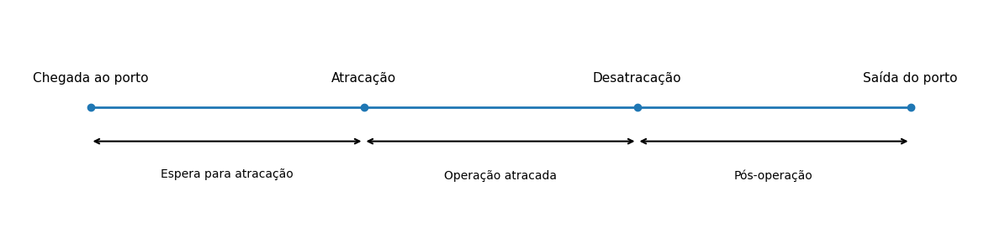

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_01_port_call_journey.png')

In [12]:
# 1.3 Conceptual diagram of port call journey and lead time decomposition

journey_steps = pd.DataFrame(
    {
        "event": [
            "Chegada ao porto",
            "Atracação",
            "Desatracação",
            "Saída do porto",
        ],
        "position": [0, 1, 2, 3],
    }
)

fig, ax = plt.subplots(figsize=(12, 3))

ax.plot(
    journey_steps["position"],
    [0] * len(journey_steps),
    marker="o",
    linewidth=2,
)

for _, row in journey_steps.iterrows():
    ax.text(
        row["position"],
        0.08,
        row["event"],
        ha="center",
        va="bottom",
        fontsize=11,
    )

intervals = [
    (0, 1, "Espera para atracação"),
    (1, 2, "Operação atracada"),
    (2, 3, "Pós-operação"),
]

for start, end, label in intervals:
    midpoint = (start + end) / 2
    ax.annotate(
        "",
        xy=(end, -0.12),
        xytext=(start, -0.12),
        arrowprops=dict(arrowstyle="<->", lw=1.5),
    )
    ax.text(
        midpoint,
        -0.22,
        label,
        ha="center",
        va="top",
        fontsize=10,
    )

# ax.set_title("Jornada da embarcação no porto e decomposição do lead time")
ax.set_yticks([])
ax.set_xticks([])
ax.set_xlim(-0.3, 3.3)
ax.set_ylim(-0.45, 0.35)

for spine in ax.spines.values():
    spine.set_visible(False)

figure_path = save_figure("eda_01_port_call_journey.png")
plt.show()

figure_path

O diagrama acima transforma os registros de data e hora em uma visão operacional da escala portuária. Cada embarcação percorre uma sequência de eventos que, juntos, formam o lead time total da permanência no porto.

Essa visão é importante porque evita tratar o lead time como uma única “caixa-preta”. Ao separar espera, operação e pós-operação, conseguimos investigar em qual etapa a incerteza aparece com mais intensidade.

In [13]:
# 1.4 Component share of mean and median total port stay

component_columns = COMPONENT_COLUMNS_H

component_summary = pd.DataFrame(
    {
        "component": [TARGET_LABELS[col] for col in component_columns],
        "mean_hours": [df[col].mean() for col in component_columns],
        "median_hours": [df[col].median() for col in component_columns],
        "p90_hours": [df[col].quantile(0.90) for col in component_columns],
    }
)

component_summary["component"] = pd.Categorical(
    component_summary["component"],
    categories=COMPONENT_ORDER_LABELS,
    ordered=True,
)

component_summary = component_summary.sort_values("component").reset_index(drop=True)

total_mean = component_summary["mean_hours"].sum()
total_median = component_summary["median_hours"].sum()

component_summary["mean_share_pct"] = component_summary["mean_hours"] / total_mean * 100
component_summary["median_share_pct"] = component_summary["median_hours"] / total_median * 100

component_summary

,component,mean_hours,median_hours,p90_hours,mean_share_pct,median_share_pct
0,Espera para atracação,8.49,0.00,6.67,11.94,0.00
1,Operação atracada,61.91,34.83,139.33,87.07,100.00
2,Pós-operação,0.70,0.00,0.00,0.99,0.00


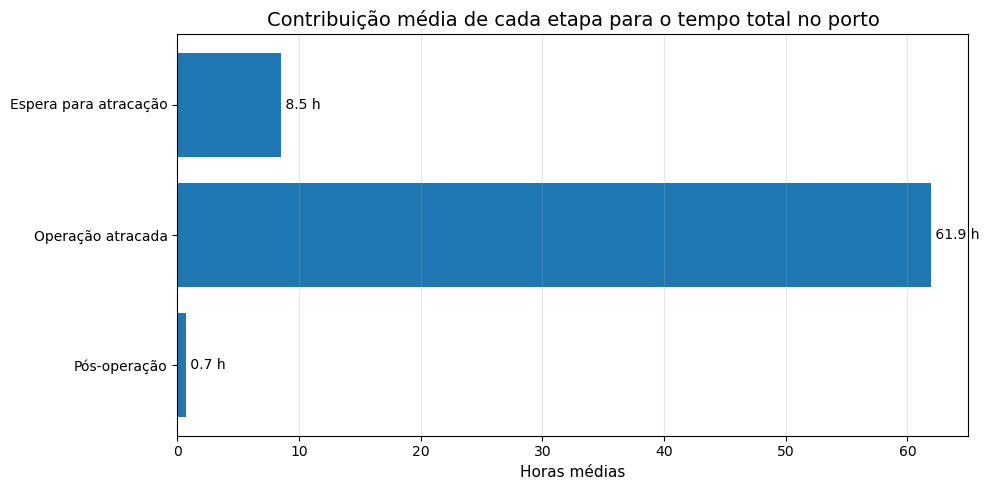

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_01_average_duration_components.png')

In [14]:
# 1.5. Bar plot of average duration by component

plot_data = component_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["component"],
    plot_data["mean_hours"],
)

for index, value in enumerate(plot_data["mean_hours"]):
    ax.text(
        value,
        index,
        f" {value:,.1f} h",
        va="center",
    )

ax.invert_yaxis()

ax.set_title("Contribuição média de cada etapa para o tempo total no porto")
ax.set_xlabel("Horas médias")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_01_average_duration_components.png")
plt.show()

figure_path

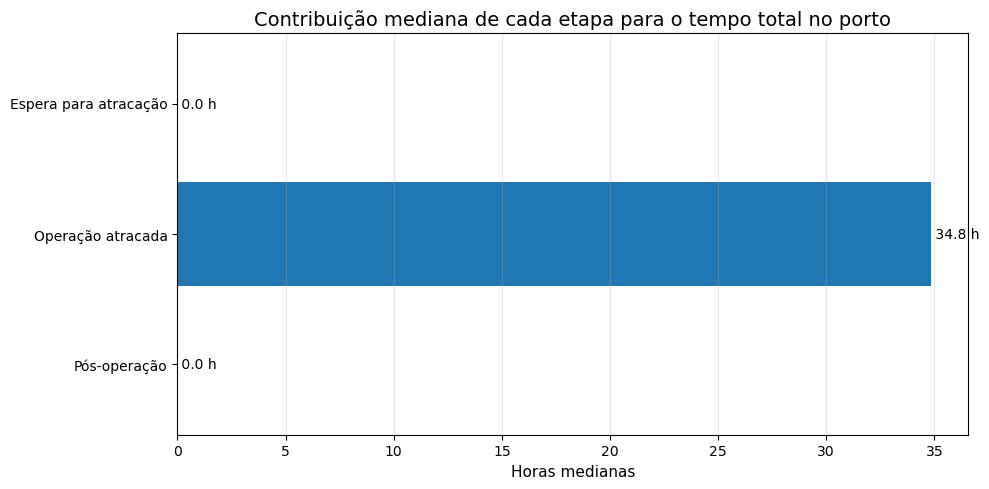

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_01_median_duration_components.png')

In [15]:
# 1.6. Bar plot of median duration by component

plot_data = component_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["component"],
    plot_data["median_hours"],
)

for index, value in enumerate(plot_data["median_hours"]):
    ax.text(
        value,
        index,
        f" {value:,.1f} h",
        va="center",
    )

ax.invert_yaxis()

ax.set_title("Contribuição mediana de cada etapa para o tempo total no porto")
ax.set_xlabel("Horas medianas")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_01_median_duration_components.png")
plt.show()

figure_path

A comparação entre média e mediana é essencial nesta análise.

A média é sensível a eventos extremos. Se poucas embarcações permanecerem tempo excepcionalmente alto no porto, a média será puxada para cima. Já a mediana representa melhor o comportamento típico da operação.

Por isso, quando a média for muito superior à mediana, teremos um primeiro indício de assimetria e presença de cauda longa. Esse tipo de comportamento é especialmente relevante para Supply Chain, porque os casos extremos são justamente os que pressionam estoques de segurança, buffers operacionais e planejamento de capacidade.

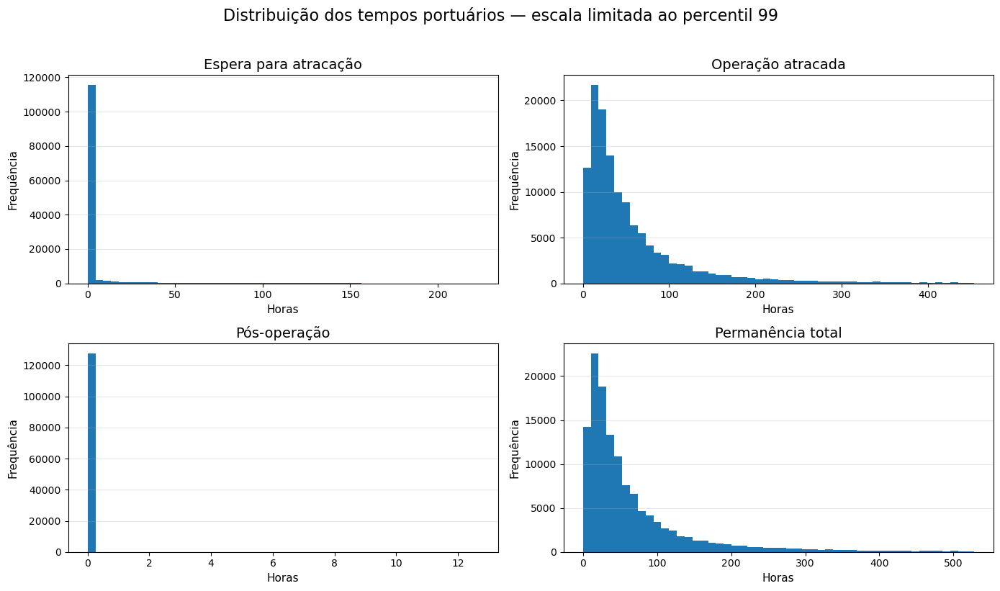

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_01_duration_distributions_p99.png')

In [16]:
# 1.7 Distribution of durations by component (limited to p99)

fig, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(14, 8),
)

axes = axes.flatten()

for ax, col in zip(axes, TARGET_COLUMNS_H):
    series = df[col].dropna()

    # Limit x-axis to p99 to avoid extreme values dominating the visual scale
    upper_limit = series.quantile(0.99)
    clipped_series = series[series <= upper_limit]

    ax.hist(clipped_series, bins=50)
    ax.set_title(TARGET_LABELS.get(col, col))
    ax.set_xlabel("Horas")
    ax.set_ylabel("Frequência")
    ax.grid(axis="y", alpha=0.3)

plt.suptitle(
    "Distribuição dos tempos portuários — escala limitada ao percentil 99",
    fontsize=16,
    y=1.02,
)

figure_path = save_figure("eda_01_duration_distributions_p99.png")
plt.show()

figure_path

As distribuições permitem avaliar se os tempos portuários se concentram em uma faixa operacional típica ou se apresentam grande dispersão.

Neste ponto, a análise deve observar três aspectos:

1. **Assimetria:** se a distribuição tem uma cauda longa à direita, alguns casos apresentam tempos muito superiores ao comportamento típico.
2. **Dispersão:** se os valores estão muito espalhados, o processo é mais difícil de prever com regras simples.
3. **Diferença entre componentes:** se uma etapa apresenta cauda mais longa que as demais, ela pode ser a principal fonte de incerteza do lead time total.

Essa leitura será aprofundada nas próximas seções, principalmente quando compararmos portos, regiões, tipos de operação, clima e congestionamento.

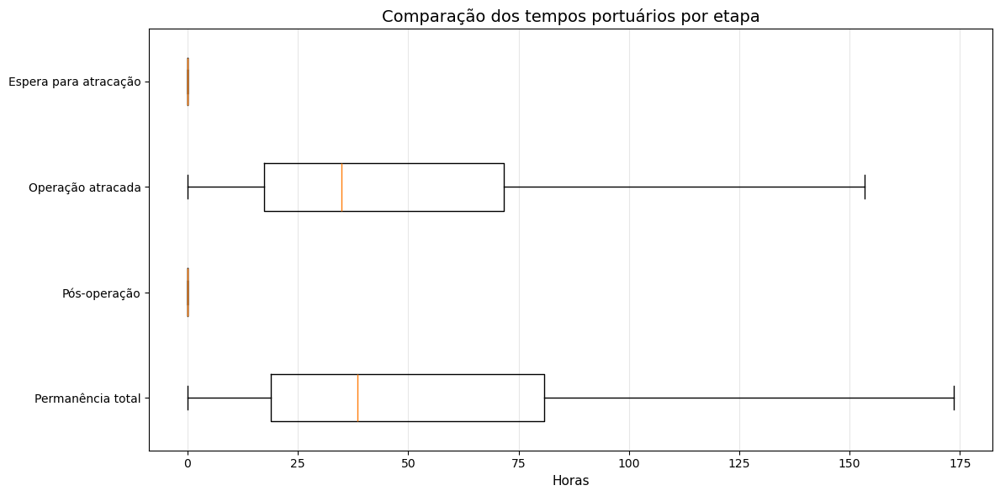

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_01_duration_boxplot_comparison.png')

In [17]:
# 1.8. Box plot comparison of durations by component (limited to p99)

boxplot_data = [
    df[col].dropna().clip(upper=df[col].quantile(0.99))
    for col in TARGET_COLUMNS_H
]

boxplot_labels = [
    TARGET_LABELS[col]
    for col in TARGET_COLUMNS_H
]

fig, ax = plt.subplots(figsize=(12, 6))

ax.boxplot(
    boxplot_data,
    labels=boxplot_labels,
    vert=False,
    showfliers=False,
)

ax.invert_yaxis()

ax.set_title("Comparação dos tempos portuários por etapa")
ax.set_xlabel("Horas")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_01_duration_boxplot_comparison.png")
plt.show()

figure_path

### Principais mensagens da seção

A permanência portuária pode ser analisada como um lead time logístico composto por três etapas: espera para atracação, operação atracada e pós-operação.

Essa decomposição é importante porque o tempo total pode esconder causas distintas de variabilidade. Uma permanência longa pode ocorrer por fila antes da atracação, por uma operação mais demorada ou por atrasos após a desatracação.

Para o objetivo do TCC, essa distinção é fundamental. Se o lead time fosse estável e previsível, médias históricas seriam suficientes para o planejamento. Porém, se os tempos apresentam dispersão, assimetria e cauda longa, modelos preditivos passam a ter valor prático, pois podem estimar melhor o risco de atraso em diferentes contextos operacionais.

Nas próximas seções, a análise passa da visão geral da jornada portuária para a qualidade dos dados e, depois, para a investigação espacial da variabilidade entre portos e regiões brasileiras.

---

## 2. Qualidade dos dados e elegibilidade para análise

Antes de interpretar os tempos portuários, é necessário avaliar a qualidade dos registros disponíveis. Como o objetivo do projeto é estudar lead time, a consistência dos eventos temporais é fundamental.

Cada escala portuária deve conter, idealmente, quatro marcos principais:

1. chegada ao porto;
2. atracação;
3. desatracação;
4. saída do porto.

A partir desses eventos, calculamos os componentes do tempo de permanência. Porém, se algum evento estiver ausente, se a ordem temporal estiver invertida ou se algum intervalo calculado for negativo, o registro deixa de ser confiável para a análise exploratória.

Esta seção avalia quantos registros são mantidos após os critérios de qualidade e quais tipos de problema aparecem na base.

In [18]:
# 2.1. Load quality control data

try:
    from src.config import MASTER_PORT_CALLS_QC_FILE
except ImportError:
    MASTER_PORT_CALLS_QC_FILE = PROJECT_ROOT / "data" / "interim" / "master_port_calls_qc.parquet"

if not MASTER_PORT_CALLS_QC_FILE.exists():
    raise FileNotFoundError(
        f"Quality control file not found: {MASTER_PORT_CALLS_QC_FILE}\n\n"
        "Run the EDA base pipeline before executing this section:\n"
        "python pipelines/build_eda_base.py"
    )

df_qc = pd.read_parquet(MASTER_PORT_CALLS_QC_FILE)

print(f"QC rows: {len(df_qc):,}")
print(f"QC columns: {df_qc.shape[1]:,}")

df_qc.head()

QC rows: 146,037
QC columns: 38


,port_call_id,port,port_name,imo,vessel_id,vessel_name,operation_type,source_port,source_port_name,destination_port,destination_port_name,arrival_port_ts,berthing_ts,unberthing_ts,departure_port_ts,port_display,source_port_display,destination_port_display,has_arrival_port_ts,has_berthing_ts,has_unberthing_ts,has_departure_port_ts,flag_arrival_after_berthing,flag_berthing_after_unberthing,flag_unberthing_after_departure,tmp_wait_for_berthing_h,tmp_operation_h,tmp_post_operation_h,tmp_total_port_stay_h,flag_negative_tmp_wait_for_berthing_h,flag_negative_tmp_operation_h,flag_negative_tmp_post_operation_h,flag_negative_tmp_total_port_stay_h,flag_wait_too_long,flag_operation_too_long,flag_total_too_long,flag_arrival_before_min_date,eligible_for_eda
0,561202021,BR052001,TERMINAL FLUVIAL DE JURUTI,9620310,<NA>,WHITE WHALE,Carga,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,BR052,JURUTI,2022-01-02 00:24:00,2022-01-02 00:24:00,2022-01-03 02:05:00,2022-01-03 02:05:00,BR052001 - TERMINAL FLUVIAL DE JURUTI,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,BR052 - JURUTI,True,True,True,True,False,False,False,0.00,25.68,0.00,25.68,False,False,False,False,False,False,False,True,False
1,4172022,BR052001,TERMINAL FLUVIAL DE JURUTI,9304241,<NA>,GOOD HOPE MAX,Carga,BR052,JURUTI,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,2022-01-06 23:54:00,2022-01-06 23:54:00,2022-01-08 17:54:00,2022-01-08 17:54:00,BR052001 - TERMINAL FLUVIAL DE JURUTI,BR052 - JURUTI,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,True,True,True,True,False,False,False,0.00,42.00,0.00,42.00,False,False,False,False,False,False,False,True,False
2,7012022,BR052001,TERMINAL FLUVIAL DE JURUTI,9628922,<NA>,AMBERJACK,Carga,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,2022-01-08 21:06:00,2022-01-08 21:06:00,2022-01-10 01:42:00,2022-01-10 01:42:00,BR052001 - TERMINAL FLUVIAL DE JURUTI,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,True,True,True,True,False,False,False,0.00,28.60,0.00,28.60,False,False,False,False,False,False,False,True,False
3,12292022,BR052001,TERMINAL FLUVIAL DE JURUTI,9473339,<NA>,JURUTI,Carga,BRAMW001,TERMINAL DA ALUMAR - SÃO LUIZ - MA,BR052,JURUTI,2022-01-13 11:50:00,2022-01-13 11:50:00,2022-01-14 21:07:00,2022-01-14 21:07:00,BR052001 - TERMINAL FLUVIAL DE JURUTI,BRAMW001 - TERMINAL DA ALUMAR - SÃO LUIZ - MA,BR052 - JURUTI,True,True,True,True,False,False,False,0.00,33.28,0.00,33.28,False,False,False,False,False,False,False,True,False
4,19472022,BR052001,TERMINAL FLUVIAL DE JURUTI,9620310,<NA>,WHITE WHALE,Carga,BR052,JURUTI,BR052,JURUTI,2022-01-17 00:18:00,2022-01-17 00:18:00,2022-01-18 01:06:00,2022-01-18 01:06:00,BR052001 - TERMINAL FLUVIAL DE JURUTI,BR052 - JURUTI,BR052 - JURUTI,True,True,True,True,False,False,False,0.00,24.80,0.00,24.80,False,False,False,False,False,False,False,True,False


In [19]:
# 2.2. Validate required QC columns

quality_required_columns = [
    "port_call_id",
    "port",
    "port_display",
    "arrival_port_ts",
    "berthing_ts",
    "unberthing_ts",
    "departure_port_ts",
    "has_arrival_port_ts",
    "has_berthing_ts",
    "has_unberthing_ts",
    "has_departure_port_ts",
    "flag_arrival_after_berthing",
    "flag_berthing_after_unberthing",
    "flag_unberthing_after_departure",
    "flag_negative_tmp_wait_for_berthing_h",
    "flag_negative_tmp_operation_h",
    "flag_negative_tmp_post_operation_h",
    "flag_negative_tmp_total_port_stay_h",
    "flag_wait_too_long",
    "flag_operation_too_long",
    "flag_total_too_long",
    "eligible_for_eda",
]

missing_quality_columns = [
    col for col in quality_required_columns
    if col not in df_qc.columns
]

if missing_quality_columns:
    raise ValueError(
        "The QC dataset is missing required columns:\n"
        + "\n".join(f"- {col}" for col in missing_quality_columns)
    )

print("All required QC columns are available.")

All required QC columns are available.


### Critérios de elegibilidade

Um registro é considerado elegível para o EDA quando atende às seguintes condições:

- possui data/hora de chegada ao porto;
- possui data/hora de atracação;
- possui data/hora de desatracação;
- possui data/hora de saída do porto;
- respeita a sequência temporal esperada;
- não gera durações negativas.

Além disso, a pipeline sinaliza durações muito longas para revisão. Esses casos extremos são importantes para a análise porque podem representar atrasos reais, eventos operacionais raros ou registros que exigem cautela interpretativa.

In [20]:
# 2.3. Quality general summary

quality_summary = pd.DataFrame(
    [
        {
            "metric": "total_rows",
            "description": "Total de registros consolidados por port_call_id",
            "count": len(df_qc),
        },
        {
            "metric": "missing_arrival_port_ts",
            "description": "Registros sem chegada ao porto",
            "count": (~df_qc["has_arrival_port_ts"].fillna(False)).sum(),
        },
        {
            "metric": "missing_berthing_ts",
            "description": "Registros sem atracação",
            "count": (~df_qc["has_berthing_ts"].fillna(False)).sum(),
        },
        {
            "metric": "missing_unberthing_ts",
            "description": "Registros sem desatracação",
            "count": (~df_qc["has_unberthing_ts"].fillna(False)).sum(),
        },
        {
            "metric": "missing_departure_port_ts",
            "description": "Registros sem saída do porto",
            "count": (~df_qc["has_departure_port_ts"].fillna(False)).sum(),
        },
        {
            "metric": "arrival_after_berthing",
            "description": "Chegada posterior à atracação",
            "count": df_qc["flag_arrival_after_berthing"].fillna(False).sum(),
        },
        {
            "metric": "berthing_after_unberthing",
            "description": "Atracação posterior à desatracação",
            "count": df_qc["flag_berthing_after_unberthing"].fillna(False).sum(),
        },
        {
            "metric": "unberthing_after_departure",
            "description": "Desatracação posterior à saída do porto",
            "count": df_qc["flag_unberthing_after_departure"].fillna(False).sum(),
        },
        {
            "metric": "negative_wait_for_berthing",
            "description": "Espera para atracação negativa",
            "count": df_qc["flag_negative_tmp_wait_for_berthing_h"].fillna(False).sum(),
        },
        {
            "metric": "negative_operation",
            "description": "Tempo de operação negativo",
            "count": df_qc["flag_negative_tmp_operation_h"].fillna(False).sum(),
        },
        {
            "metric": "negative_post_operation",
            "description": "Tempo pós-operação negativo",
            "count": df_qc["flag_negative_tmp_post_operation_h"].fillna(False).sum(),
        },
        {
            "metric": "negative_total_port_stay",
            "description": "Permanência total negativa",
            "count": df_qc["flag_negative_tmp_total_port_stay_h"].fillna(False).sum(),
        },
        {
            "metric": "wait_too_long",
            "description": "Espera para atracação sinalizada como muito longa",
            "count": df_qc["flag_wait_too_long"].fillna(False).sum(),
        },
        {
            "metric": "operation_too_long",
            "description": "Operação sinalizada como muito longa",
            "count": df_qc["flag_operation_too_long"].fillna(False).sum(),
        },
        {
            "metric": "total_too_long",
            "description": "Permanência total sinalizada como muito longa",
            "count": df_qc["flag_total_too_long"].fillna(False).sum(),
        },
        {
            "metric": "eligible_for_eda",
            "description": "Registros elegíveis para análise exploratória",
            "count": df_qc["eligible_for_eda"].fillna(False).sum(),
        },
    ]
)

quality_summary["pct_total"] = quality_summary["count"] / len(df_qc) * 100

quality_summary

,metric,description,count,pct_total
0,total_rows,Total de registros consolidados por port_call_id,146037,100.00
1,missing_arrival_port_ts,Registros sem chegada ao porto,8,0.01
2,missing_berthing_ts,Registros sem atracação,3,0.00
3,missing_unberthing_ts,Registros sem desatracação,3892,2.67
4,missing_departure_port_ts,Registros sem saída do porto,4105,2.81
5,arrival_after_berthing,Chegada posterior à atracação,1,0.00
6,berthing_after_unberthing,Atracação posterior à desatracação,0,0.00
7,unberthing_after_departure,Desatracação posterior à saída do porto,0,0.00
8,negative_wait_for_berthing,Espera para atracação negativa,1,0.00
9,negative_operation,Tempo de operação negativo,0,0.00


In [21]:
# 2.4. Save quality table

quality_summary_path = TABLES_DIR / "eda_02_quality_summary.csv"
quality_summary.to_csv(quality_summary_path, index=False)

quality_summary_path

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_02_quality_summary.csv')

In [22]:
# 2.5. Elegibility funnel

mask_total = pd.Series(True, index=df_qc.index)

mask_all_events = (
    df_qc["has_arrival_port_ts"].fillna(False)
    & df_qc["has_berthing_ts"].fillna(False)
    & df_qc["has_unberthing_ts"].fillna(False)
    & df_qc["has_departure_port_ts"].fillna(False)
)

mask_temporal_order_valid = (
    mask_all_events
    & ~df_qc["flag_arrival_after_berthing"].fillna(False)
    & ~df_qc["flag_berthing_after_unberthing"].fillna(False)
    & ~df_qc["flag_unberthing_after_departure"].fillna(False)
)

mask_no_negative_duration = (
    mask_temporal_order_valid
    & ~df_qc["flag_negative_tmp_wait_for_berthing_h"].fillna(False)
    & ~df_qc["flag_negative_tmp_operation_h"].fillna(False)
    & ~df_qc["flag_negative_tmp_post_operation_h"].fillna(False)
    & ~df_qc["flag_negative_tmp_total_port_stay_h"].fillna(False)
)

mask_no_extreme_duration = (
    mask_no_negative_duration
    & ~df_qc["flag_wait_too_long"].fillna(False)
    & ~df_qc["flag_operation_too_long"].fillna(False)
    & ~df_qc["flag_total_too_long"].fillna(False)
)

mask_eligible = df_qc["eligible_for_eda"].fillna(False)

funnel = pd.DataFrame(
    [
        {
            "step": "Registros consolidados",
            "count": mask_total.sum(),
        },
        {
            "step": "Com os 4 eventos principais",
            "count": mask_all_events.sum(),
        },
        {
            "step": "Com sequência temporal válida",
            "count": mask_temporal_order_valid.sum(),
        },
        {
            "step": "Sem durações negativas",
            "count": mask_no_negative_duration.sum(),
        },
        {
            "step": "Sem dura\u00e7\u00f5es muito longas",
            "count": mask_no_extreme_duration.sum(),
        },
        {
            "step": "Eleg\u00edveis para EDA",
            "count": mask_eligible.sum(),
        },
    ]
)

funnel["pct_total"] = funnel["count"] / funnel.loc[0, "count"] * 100
funnel["loss_vs_previous"] = funnel["count"].shift(1) - funnel["count"]
funnel["loss_vs_previous"] = funnel["loss_vs_previous"].fillna(0)
funnel["loss_vs_previous_pct"] = funnel["loss_vs_previous"] / funnel["count"].shift(1) * 100
funnel["loss_vs_previous_pct"] = funnel["loss_vs_previous_pct"].fillna(0)

funnel

,step,count,pct_total,loss_vs_previous,loss_vs_previous_pct
0,Registros consolidados,146037,100.00,0.00,0.00
1,Com os 4 eventos principais,141895,97.16,"4,142.00",2.84
2,Com sequência temporal válida,141895,97.16,0.00,0.00
3,Sem durações negativas,141895,97.16,0.00,0.00
4,Sem durações muito longas,139785,95.72,"2,110.00",1.49
5,Elegíveis para EDA,129625,88.76,"10,160.00",7.27


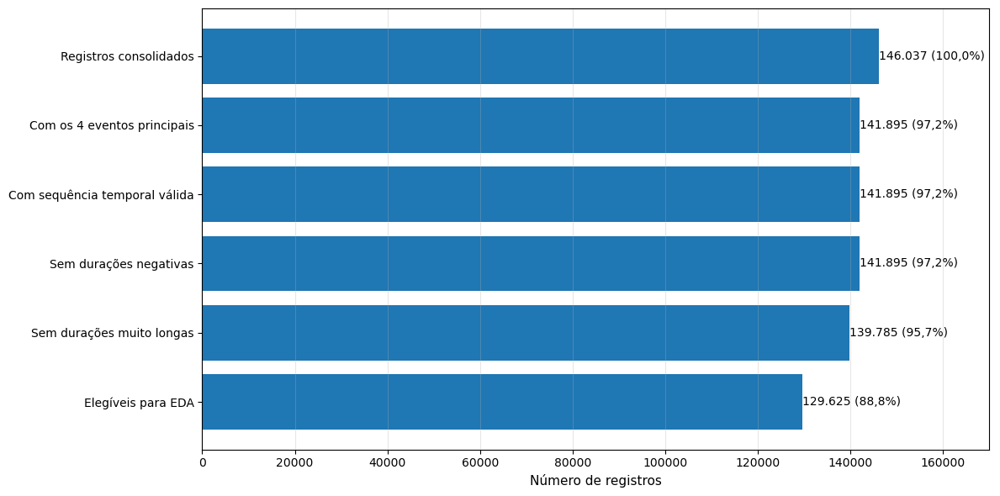

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_02_eligibility_funnel.png')

In [23]:
# 2.6. Funnel graph

plot_data = funnel.copy()

fig, ax = plt.subplots(figsize=(12, 6))

ax.barh(
    plot_data["step"],
    plot_data["count"],
)

for index, row in plot_data.iterrows():
    # 1. Formata a contagem com vírgula no milhar e depois troca por ponto
    count_str = f"{row['count']:,.0f}".replace(",", ".")
    
    # 2. Formata o percentual com ponto no decimal e depois troca por vírgula
    pct_str = f"{row['pct_total']:.1f}".replace(".", ",")
    
    # 3. Plota o texto usando as novas variáveis formatadas
    ax.text(
        row["count"],
        index,
        f"{count_str} ({pct_str}%)  ", # Usamos as variáveis tratadas aqui
        va="center",
        color="black"
    )

ax.invert_yaxis()
# ax.set_title("Funil de elegibilidade dos registros para o EDA")
ax.set_xlabel("Número de registros")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

ax.set_xlim(0, 170000)

figure_path = save_figure("eda_02_eligibility_funnel.png")
plt.show()

figure_path

O funil de elegibilidade mostra a perda de registros ao longo das etapas de controle de qualidade.

Essa visão é importante porque explicita a diferença entre a base bruta consolidada e a base efetivamente usada no EDA. Se a perda for pequena, isso reforça a confiabilidade da base. Se a perda for grande, a análise deve reconhecer que os resultados representam apenas o subconjunto de registros com eventos temporais completos e consistentes.

In [24]:
# 2.7. Main events availability

event_availability = pd.DataFrame(
    [
        {
            "event": "Chegada ao porto",
            "column": "arrival_port_ts",
            "available_count": df_qc["has_arrival_port_ts"].fillna(False).sum(),
            "available_pct": df_qc["has_arrival_port_ts"].fillna(False).mean() * 100,
        },
        {
            "event": "Atracação",
            "column": "berthing_ts",
            "available_count": df_qc["has_berthing_ts"].fillna(False).sum(),
            "available_pct": df_qc["has_berthing_ts"].fillna(False).mean() * 100,
        },
        {
            "event": "Desatracação",
            "column": "unberthing_ts",
            "available_count": df_qc["has_unberthing_ts"].fillna(False).sum(),
            "available_pct": df_qc["has_unberthing_ts"].fillna(False).mean() * 100,
        },
        {
            "event": "Saída do porto",
            "column": "departure_port_ts",
            "available_count": df_qc["has_departure_port_ts"].fillna(False).sum(),
            "available_pct": df_qc["has_departure_port_ts"].fillna(False).mean() * 100,
        },
    ]
)

event_availability

,event,column,available_count,available_pct
0,Chegada ao porto,arrival_port_ts,146029,99.99
1,Atracação,berthing_ts,146034,100.00
2,Desatracação,unberthing_ts,142145,97.33
3,Saída do porto,departure_port_ts,141932,97.19


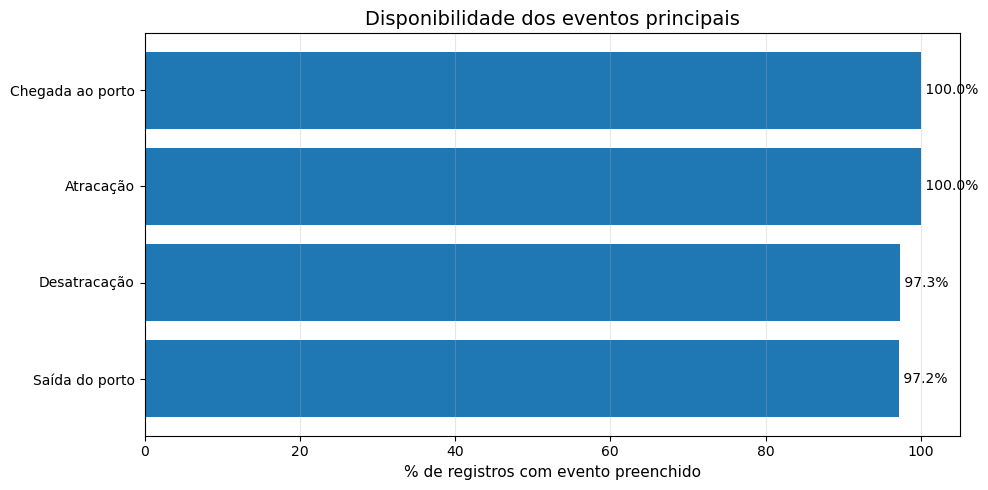

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_02_event_availability.png')

In [25]:
# 2.8. Events availability graph

plot_data = event_availability.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["event"],
    plot_data["available_pct"],
)

for index, row in plot_data.iterrows():
    ax.text(
        row["available_pct"],
        index,
        f" {row['available_pct']:.1f}%",
        va="center",
    )

ax.invert_yaxis()
ax.set_title("Disponibilidade dos eventos principais")
ax.set_xlabel("% de registros com evento preenchido")
ax.set_ylabel("")
ax.set_xlim(0, 105)
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_02_event_availability.png")
plt.show()

figure_path

A disponibilidade dos eventos principais indica se a base tem cobertura suficiente para reconstruir a jornada portuária.

Para este projeto, os eventos intermediários são tão importantes quanto os eventos inicial e final, porque permitem decompor o lead time total em espera, operação e pós-operação.

Caso algum evento tenha baixa disponibilidade, a análise dos componentes deve ser interpretada com cautela. Já o tempo total depende principalmente da chegada ao porto e da saída do porto.

In [26]:
# 2.9. Events presence patterns

presence_pattern_cols = [
    "has_arrival_port_ts",
    "has_berthing_ts",
    "has_unberthing_ts",
    "has_departure_port_ts",
]

presence_patterns = (
    df_qc[presence_pattern_cols]
    .fillna(False)
    .astype(int)
    .groupby(presence_pattern_cols)
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)

presence_patterns["pct_total"] = presence_patterns["count"] / len(df_qc) * 100

presence_patterns

,has_arrival_port_ts,has_berthing_ts,has_unberthing_ts,has_departure_port_ts,count,pct_total
8,1,1,1,1,141895,97.16
5,1,1,0,0,3858,2.64
7,1,1,1,0,243,0.17
6,1,1,0,1,31,0.02
3,0,1,1,1,3,0.00
1,0,1,0,0,3,0.00
4,1,0,1,1,2,0.00
0,0,0,1,1,1,0.00
2,0,1,1,0,1,0.00


In [27]:
# 2.10. Labels for presence patterns

presence_label_map = {
    "has_arrival_port_ts": "Chegada",
    "has_berthing_ts": "Atracação",
    "has_unberthing_ts": "Desatracação",
    "has_departure_port_ts": "Saída",
}

presence_patterns_labeled = presence_patterns.copy()

def build_presence_pattern_label(row: pd.Series) -> str:
    """Build a readable label for event presence patterns."""
    labels = []

    for col, label in presence_label_map.items():
        status = "✓" if row[col] == 1 else "×"
        labels.append(f"{status} {label}")

    return " | ".join(labels)

presence_patterns_labeled["pattern"] = presence_patterns_labeled.apply(
    build_presence_pattern_label,
    axis=1,
)

presence_patterns_labeled[
    ["pattern", "count", "pct_total"]
].head(10)

,pattern,count,pct_total
8,✓ Chegada | ✓ Atracação | ✓ Desatracação | ✓ S...,141895,97.16
5,✓ Chegada | ✓ Atracação | × Desatracação | × S...,3858,2.64
7,✓ Chegada | ✓ Atracação | ✓ Desatracação | × S...,243,0.17
6,✓ Chegada | ✓ Atracação | × Desatracação | ✓ S...,31,0.02
3,× Chegada | ✓ Atracação | ✓ Desatracação | ✓ S...,3,0.00
1,× Chegada | ✓ Atracação | × Desatracação | × S...,3,0.00
4,✓ Chegada | × Atracação | ✓ Desatracação | ✓ S...,2,0.00
0,× Chegada | × Atracação | ✓ Desatracação | ✓ S...,1,0.00
2,× Chegada | ✓ Atracação | ✓ Desatracação | × S...,1,0.00


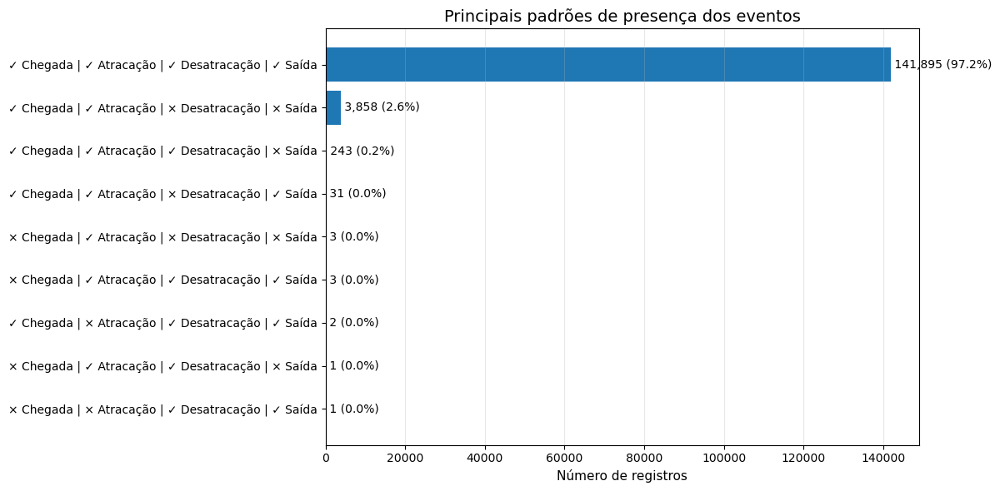

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_02_event_presence_patterns.png')

In [28]:
# 2.11. Graph for presence patterns

plot_data = presence_patterns_labeled.head(10).sort_values("count", ascending=True)

fig, ax = plt.subplots(figsize=(12, 6))

ax.barh(
    plot_data["pattern"],
    plot_data["count"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.count,
        index,
        f" {row.count:,.0f} ({row.pct_total:.1f}%)",
        va="center",
    )

ax.set_title("Principais padrões de presença dos eventos")
ax.set_xlabel("Número de registros")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_02_event_presence_patterns.png")
plt.show()

figure_path

Os padrões de presença ajudam a entender se os registros incompletos têm uma estrutura recorrente.

Por exemplo, se muitos registros possuem chegada e saída, mas não possuem atracação e desatracação, isso indicaria que o tempo total talvez ainda possa ser analisado em alguns casos, mas os componentes internos não seriam confiáveis.

No EDA principal, entretanto, manteremos a regra mais conservadora: trabalhar apenas com registros que possuem os quatro eventos principais e sequência temporal consistente.

In [29]:
# 2.12. Temporal consistency issues

temporal_issues = pd.DataFrame(
    [
        {
            "issue": "Chegada posterior à atracação",
            "flag": "flag_arrival_after_berthing",
            "count": df_qc["flag_arrival_after_berthing"].fillna(False).sum(),
        },
        {
            "issue": "Atracação posterior à desatracação",
            "flag": "flag_berthing_after_unberthing",
            "count": df_qc["flag_berthing_after_unberthing"].fillna(False).sum(),
        },
        {
            "issue": "Desatracação posterior à saída",
            "flag": "flag_unberthing_after_departure",
            "count": df_qc["flag_unberthing_after_departure"].fillna(False).sum(),
        },
        {
            "issue": "Espera para atracação negativa",
            "flag": "flag_negative_tmp_wait_for_berthing_h",
            "count": df_qc["flag_negative_tmp_wait_for_berthing_h"].fillna(False).sum(),
        },
        {
            "issue": "Operação negativa",
            "flag": "flag_negative_tmp_operation_h",
            "count": df_qc["flag_negative_tmp_operation_h"].fillna(False).sum(),
        },
        {
            "issue": "Pós-operação negativo",
            "flag": "flag_negative_tmp_post_operation_h",
            "count": df_qc["flag_negative_tmp_post_operation_h"].fillna(False).sum(),
        },
        {
            "issue": "Permanência total negativa",
            "flag": "flag_negative_tmp_total_port_stay_h",
            "count": df_qc["flag_negative_tmp_total_port_stay_h"].fillna(False).sum(),
        },
    ]
)

temporal_issues["pct_total"] = temporal_issues["count"] / len(df_qc) * 100

temporal_issues

,issue,flag,count,pct_total
0,Chegada posterior à atracação,flag_arrival_after_berthing,1,0.00
1,Atracação posterior à desatracação,flag_berthing_after_unberthing,0,0.00
2,Desatracação posterior à saída,flag_unberthing_after_departure,0,0.00
3,Espera para atracação negativa,flag_negative_tmp_wait_for_berthing_h,1,0.00
4,Operação negativa,flag_negative_tmp_operation_h,0,0.00
5,Pós-operação negativo,flag_negative_tmp_post_operation_h,0,0.00
6,Permanência total negativa,flag_negative_tmp_total_port_stay_h,0,0.00


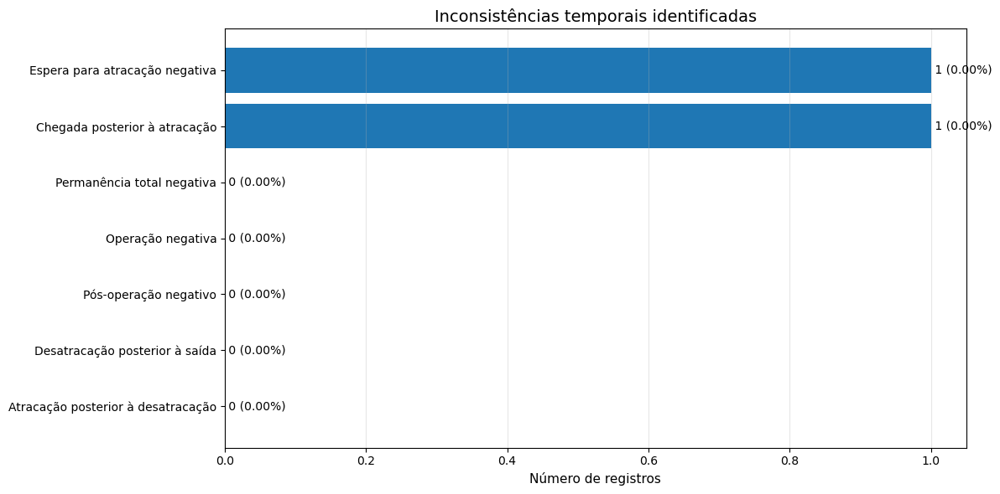

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_02_temporal_inconsistencies.png')

In [30]:
# 2.13. Temporal consistency issues graph

plot_data = temporal_issues.sort_values("count", ascending=True)

fig, ax = plt.subplots(figsize=(12, 6))

ax.barh(
    plot_data["issue"],
    plot_data["count"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.count,
        index,
        f" {row.count:,.0f} ({row.pct_total:.2f}%)",
        va="center",
    )

ax.set_title("Inconsistências temporais identificadas")
ax.set_xlabel("Número de registros")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_02_temporal_inconsistencies.png")
plt.show()

figure_path

As inconsistências temporais representam problemas mais graves do que simples ausência de dados.

Quando a chegada ocorre depois da atracação, ou a desatracação ocorre depois da saída do porto, a sequência operacional deixa de fazer sentido para o cálculo de lead time. Por isso, esses registros são excluídos da base elegível.

Esse cuidado evita que o EDA seja contaminado por durações negativas ou relações temporais impossíveis.

In [31]:
# 2.14. Extreme duration flags

extreme_duration_flags = pd.DataFrame(
    [
        {
            "flag": "flag_wait_too_long",
            "description": "Espera para atracação muito longa",
            "count": df_qc["flag_wait_too_long"].fillna(False).sum(),
        },
        {
            "flag": "flag_operation_too_long",
            "description": "Operação muito longa",
            "count": df_qc["flag_operation_too_long"].fillna(False).sum(),
        },
        {
            "flag": "flag_total_too_long",
            "description": "Permanência total muito longa",
            "count": df_qc["flag_total_too_long"].fillna(False).sum(),
        },
    ]
)

extreme_duration_flags["pct_total"] = extreme_duration_flags["count"] / len(df_qc) * 100
extreme_duration_flags

,flag,description,count,pct_total
0,flag_wait_too_long,Espera para atracação muito longa,206,0.14
1,flag_operation_too_long,Operação muito longa,1934,1.32
2,flag_total_too_long,Permanência total muito longa,897,0.61


In [32]:
# 2.15. Extreme duration examples

extreme_eligible_examples = (
    df_qc.loc[
        df_qc["eligible_for_eda"].fillna(False)
        & (
            df_qc["flag_wait_too_long"].fillna(False)
            | df_qc["flag_operation_too_long"].fillna(False)
            | df_qc["flag_total_too_long"].fillna(False)
        ),
        [
            "port_call_id",
            "port",
            "port_display",
            "arrival_port_ts",
            "berthing_ts",
            "unberthing_ts",
            "departure_port_ts",
            "tmp_wait_for_berthing_h",
            "tmp_operation_h",
            "tmp_post_operation_h",
            "tmp_total_port_stay_h",
            "flag_wait_too_long",
            "flag_operation_too_long",
            "flag_total_too_long",
        ],
    ]
    .sort_values("tmp_total_port_stay_h", ascending=False)
    .head(20)
)

extreme_eligible_examples

,port_call_id,port,port_display,arrival_port_ts,berthing_ts,unberthing_ts,departure_port_ts,tmp_wait_for_berthing_h,tmp_operation_h,tmp_post_operation_h,tmp_total_port_stay_h,flag_wait_too_long,flag_operation_too_long,flag_total_too_long


As durações extremas não são necessariamente erros. Elas podem representar eventos reais, como longas esperas, operações complexas, restrições operacionais, filas, condições externas ou particularidades de determinados portos.

Por esse motivo, nesta etapa elas são tratadas como registros que merecem atenção, não como registros automaticamente inválidos.

Essa decisão é importante para o objetivo do projeto: se o interesse é estudar incerteza de lead time, remover todos os extremos poderia eliminar justamente os casos mais relevantes para planejamento, risco e estoque de segurança.

In [33]:
# 2.16. Comparison between QC base and EDA base

eda_port_call_ids = set(df["port_call_id"].dropna())
qc_eligible_ids = set(
    df_qc.loc[
        df_qc["eligible_for_eda"].fillna(False),
        "port_call_id",
    ].dropna()
)

comparison_eda_qc = pd.DataFrame(
    [
        {
            "metric": "Registros elegíveis na base QC",
            "count": len(qc_eligible_ids),
        },
        {
            "metric": "Registros presentes na eda_base",
            "count": len(eda_port_call_ids),
        },
        {
            "metric": "Elegíveis na QC e presentes na eda_base",
            "count": len(qc_eligible_ids.intersection(eda_port_call_ids)),
        },
        {
            "metric": "Elegíveis na QC, mas ausentes na eda_base",
            "count": len(qc_eligible_ids.difference(eda_port_call_ids)),
        },
        {
            "metric": "Presentes na eda_base, mas não elegíveis na QC",
            "count": len(eda_port_call_ids.difference(qc_eligible_ids)),
        },
    ]
)

comparison_eda_qc

,metric,count
0,Registros elegíveis na base QC,129625
1,Registros presentes na eda_base,129625
2,Elegíveis na QC e presentes na eda_base,129625
3,"Elegíveis na QC, mas ausentes na eda_base",0
4,"Presentes na eda_base, mas não elegíveis na QC",0


A comparação entre a base de controle de qualidade e a `eda_base` confirma se a base usada no EDA corresponde ao conjunto de registros classificados como elegíveis.

Idealmente, a quantidade de registros elegíveis na base QC deve ser igual ou muito próxima da quantidade de registros presentes na `eda_base`. Diferenças podem ocorrer caso a `eda_base` tenha passado por integrações adicionais, como merge com portos ou clima, mas registros não deveriam se tornar inelegíveis após essa etapa.

### Principais mensagens da seção

A análise de qualidade mostra como a base usada no EDA foi construída a partir dos registros consolidados de escalas portuárias.

Os critérios de elegibilidade são baseados na presença dos quatro eventos principais, na consistência da sequência temporal e na ausência de durações negativas. Esse processo reduz o risco de interpretar como lead time válido um registro com eventos ausentes ou temporalmente incoerentes.

As durações extremas são mantidas como parte da análise, pois podem representar eventos reais de alta variabilidade operacional. Para o objetivo do TCC, esses casos são especialmente relevantes: lead times extremos são justamente os eventos que pressionam estoques de segurança, buffers logísticos e capital de giro.

A partir da próxima seção, a análise passa a focar somente nos registros elegíveis, investigando a distribuição nacional da permanência portuária e a presença de assimetria, dispersão e cauda longa.

---

## 3. Panorama nacional da permanência portuária

Após validar a qualidade dos registros e definir a base elegível para análise, o próximo passo é observar o comportamento nacional da permanência portuária.

Nesta seção, a variável central é `t_total_port_stay_h`, que representa o intervalo entre a chegada da embarcação ao porto e sua saída efetiva. Esse tempo total será interpretado como o lead time operacional da escala portuária.

A pergunta principal desta seção é:

> A permanência portuária brasileira se comporta como um processo relativamente estável ou como uma variável de alta dispersão e cauda longa?

Essa distinção é essencial para o TCC. Se o lead time fosse estável, médias históricas poderiam ser suficientes para o planejamento. Porém, se a distribuição tiver forte assimetria e casos extremos, o uso de modelos preditivos passa a ser mais relevante para capturar risco, variabilidade e necessidade de buffers.

In [34]:
# 3.1. Main target definition

MAIN_TARGET_H = "t_total_port_stay_h"
MAIN_TARGET_D = "t_total_port_stay_d"

if MAIN_TARGET_D not in df.columns:
    df[MAIN_TARGET_D] = df[MAIN_TARGET_H] / 24

target_series_h = df[MAIN_TARGET_H].dropna()
target_series_d = df[MAIN_TARGET_D].dropna()

print(f"Target: {MAIN_TARGET_H}")
print(f"Valid observations: {target_series_h.count():,}")

Target: t_total_port_stay_h
Valid observations: 129,625


In [35]:
# 3.2. Total port stay statistics

national_total_summary = pd.DataFrame(
    [
        {
            "metric": "Permanência total no porto",
            "count": target_series_h.count(),
            "mean_h": target_series_h.mean(),
            "median_h": target_series_h.median(),
            "std_h": target_series_h.std(),
            "min_h": target_series_h.min(),
            "p25_h": target_series_h.quantile(0.25),
            "p75_h": target_series_h.quantile(0.75),
            "p90_h": target_series_h.quantile(0.90),
            "p95_h": target_series_h.quantile(0.95),
            "p99_h": target_series_h.quantile(0.99),
            "max_h": target_series_h.max(),
            "mean_d": target_series_d.mean(),
            "median_d": target_series_d.median(),
            "p90_d": target_series_d.quantile(0.90),
            "p95_d": target_series_d.quantile(0.95),
            "p99_d": target_series_d.quantile(0.99),
            "max_d": target_series_d.max(),
        }
    ]
)

national_total_summary

,metric,count,mean_h,median_h,std_h,min_h,p25_h,p75_h,p90_h,p95_h,p99_h,max_h,mean_d,median_d,p90_d,p95_d,p99_d,max_d
0,Permanência total no porto,129625,71.10,38.42,97.12,0.02,18.90,80.83,163.08,253.73,527.85,"1,280.08",2.96,1.60,6.80,10.57,21.99,53.34


In [36]:
# 3.3. Tail indicators for total port stay

median_h = target_series_h.median()
mean_h = target_series_h.mean()
p75_h = target_series_h.quantile(0.75)
p90_h = target_series_h.quantile(0.90)
p95_h = target_series_h.quantile(0.95)
p99_h = target_series_h.quantile(0.99)

tail_indicators = pd.DataFrame(
    [
        {
            "indicator": "mean_to_median_ratio",
            "description": "Razão entre média e mediana",
            "value": mean_h / median_h if median_h != 0 else np.nan,
        },
        {
            "indicator": "p90_to_median_ratio",
            "description": "Razão entre p90 e mediana",
            "value": p90_h / median_h if median_h != 0 else np.nan,
        },
        {
            "indicator": "p95_to_median_ratio",
            "description": "Razão entre p95 e mediana",
            "value": p95_h / median_h if median_h != 0 else np.nan,
        },
        {
            "indicator": "p99_to_median_ratio",
            "description": "Razão entre p99 e mediana",
            "value": p99_h / median_h if median_h != 0 else np.nan,
        },
        {
            "indicator": "iqr_h",
            "description": "Intervalo interquartil em horas",
            "value": p75_h - target_series_h.quantile(0.25),
        },
    ]
)

tail_indicators

,indicator,description,value
0,mean_to_median_ratio,Razão entre média e mediana,1.85
1,p90_to_median_ratio,Razão entre p90 e mediana,4.25
2,p95_to_median_ratio,Razão entre p95 e mediana,6.60
3,p99_to_median_ratio,Razão entre p99 e mediana,13.74
4,iqr_h,Intervalo interquartil em horas,61.93


In [37]:
# 3.4. Save tables for total port stay summary and tail indicators

national_total_summary_path = TABLES_DIR / "eda_03_national_total_port_stay_summary.csv"
tail_indicators_path = TABLES_DIR / "eda_03_tail_indicators.csv"

national_total_summary.to_csv(national_total_summary_path, index=False)
tail_indicators.to_csv(tail_indicators_path, index=False)

national_total_summary_path, tail_indicators_path

(WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_03_national_total_port_stay_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_03_tail_indicators.csv'))

### Média, mediana e percentis

A média e a mediana respondem perguntas diferentes.

A mediana representa o comportamento típico: metade das escalas portuárias tem permanência abaixo desse valor e metade acima. Já a média é mais sensível a eventos extremos.

Os percentis superiores, como p90, p95 e p99, são especialmente importantes para Supply Chain porque representam cenários de risco. Em planejamento logístico, não basta conhecer o comportamento típico; é necessário entender também o que acontece nos casos mais demorados.

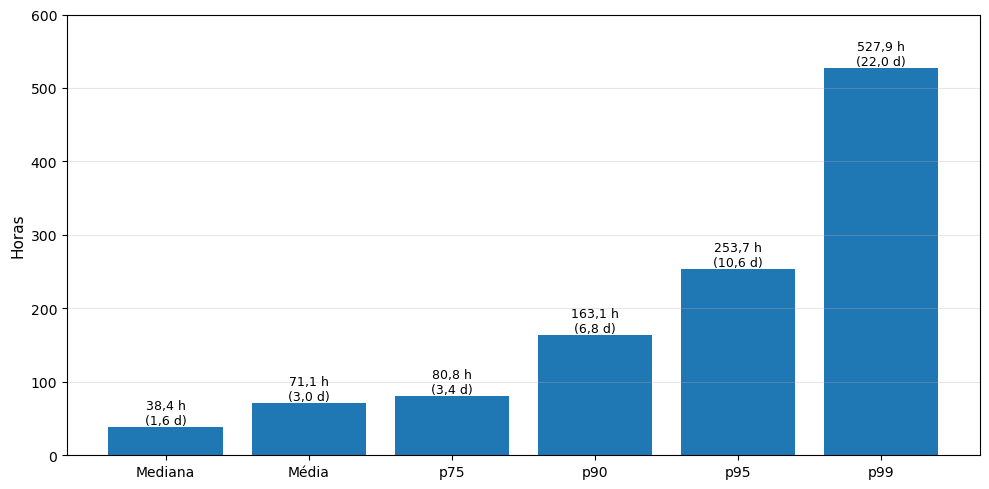

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_summary_stats.png')

In [38]:
# 3.5. Bar plot of key statistics for total port stay

summary_points = pd.DataFrame(
    [
        {"statistic": "Mediana", "hours": target_series_h.median()},
        {"statistic": "Média", "hours": target_series_h.mean()},
        {"statistic": "p75", "hours": target_series_h.quantile(0.75)},
        {"statistic": "p90", "hours": target_series_h.quantile(0.90)},
        {"statistic": "p95", "hours": target_series_h.quantile(0.95)},
        {"statistic": "p99", "hours": target_series_h.quantile(0.99)},
    ]
)

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    summary_points["statistic"],
    summary_points["hours"],
)

for index, row in summary_points.iterrows():
    # 1. Formata as horas: usa um '_' temporário para o milhar, troca o decimal por ',' e volta o '_' para '.'
    hours_str = f"{row['hours']:,.1f}".replace(",", "_").replace(".", ",").replace("_", ".")
    
    # 2. Faz a mesma formatação para os dias
    days = row['hours'] / 24
    days_str = f"{days:,.1f}".replace(",", "_").replace(".", ",").replace("_", ".")
    
    # 3. Plota o texto usando as variáveis em português
    ax.text(
        index,
        row["hours"],
        f"{hours_str} h\n({days_str} d)",
        ha="center", # Mantém o texto centralizado horizontalmente
        va="bottom",
        fontsize=9,
    )

# ax.set_title("Permanência total no porto — média, mediana e percentis")
ax.set_xlabel("")
ax.set_ylabel("Horas")
ax.grid(axis="y", alpha=0.3)

ax.set_ylim(0, 600)

figure_path = save_figure("eda_03_total_port_stay_summary_stats.png")
plt.show()

figure_path

O gráfico acima permite comparar diretamente o comportamento típico com os cenários de maior duração.

Quando p90, p95 e p99 se distanciam muito da mediana, há evidência de cauda longa. Isso significa que uma parte menor das escalas concentra tempos muito superiores ao padrão nacional.

Para o TCC, essa diferença é importante porque estoques de segurança e buffers logísticos são influenciados justamente por esses cenários de maior incerteza.

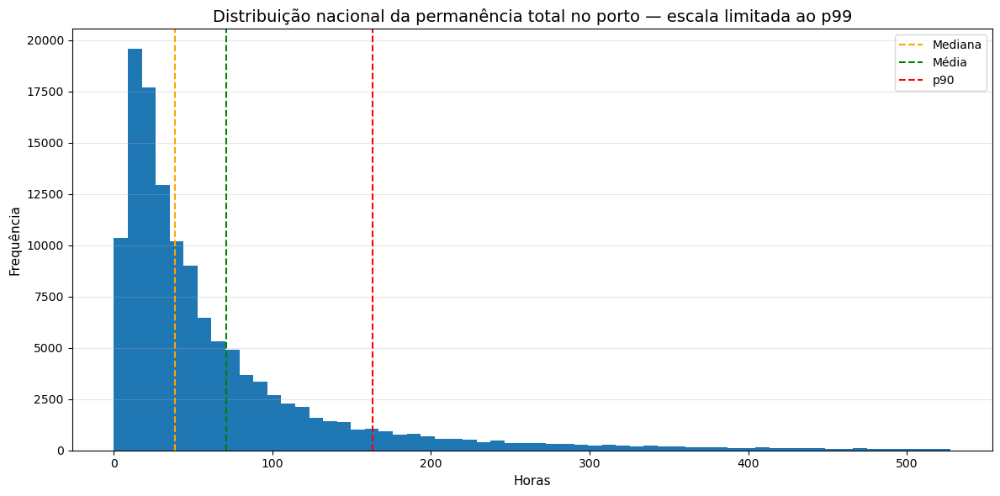

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_histogram_p99.png')

In [39]:
# 3.6. Histogram of total port stay distribution (limited to p99)

upper_limit_h = target_series_h.quantile(0.99)
plot_series_h = target_series_h[target_series_h <= upper_limit_h]

fig, ax = plt.subplots(figsize=(12, 6))

ax.hist(plot_series_h, bins=60)

ax.axvline(target_series_h.median(), linestyle="--", linewidth=1.5, label="Mediana", color="orange")
ax.axvline(target_series_h.mean(), linestyle="--", linewidth=1.5, label="Média", color="green")
ax.axvline(target_series_h.quantile(0.90), linestyle="--", linewidth=1.5, label="p90", color="red")

ax.set_title("Distribuição nacional da permanência total no porto — escala limitada ao p99")
ax.set_xlabel("Horas")
ax.set_ylabel("Frequência")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_03_total_port_stay_histogram_p99.png")
plt.show()

figure_path

O histograma foi limitado ao percentil 99 para facilitar a visualização da maior parte dos registros. Sem esse corte visual, poucos casos extremos poderiam comprimir o gráfico e dificultar a leitura do comportamento mais frequente.

Esse corte é apenas visual: os registros extremos continuam existindo na base e serão analisados como parte da cauda da distribuição.

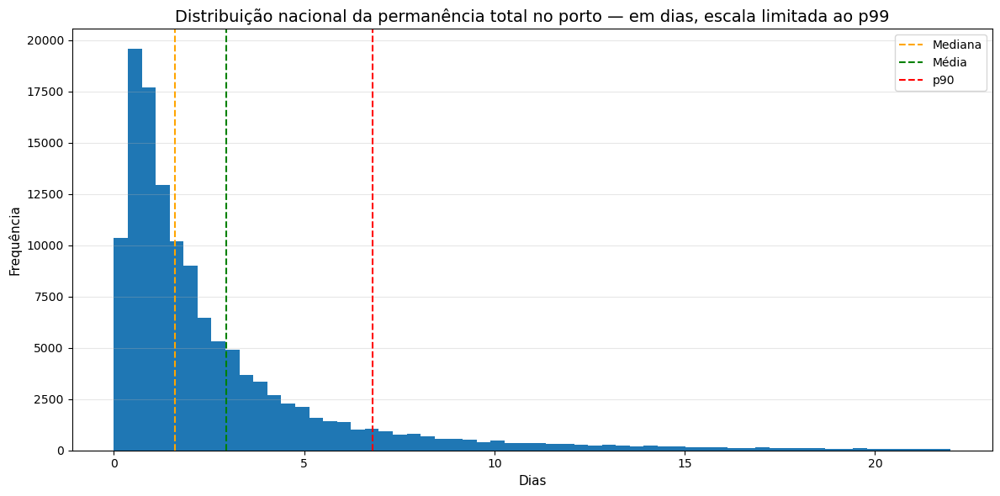

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_histogram_days_p99.png')

In [40]:
# 3.7. Histogram in days

upper_limit_d = target_series_d.quantile(0.99)
plot_series_d = target_series_d[target_series_d <= upper_limit_d]

fig, ax = plt.subplots(figsize=(12, 6))

ax.hist(plot_series_d, bins=60)

ax.axvline(target_series_d.median(), linestyle="--", linewidth=1.5, label="Mediana", color="orange")
ax.axvline(target_series_d.mean(), linestyle="--", linewidth=1.5, label="Média", color="green")
ax.axvline(target_series_d.quantile(0.90), linestyle="--", linewidth=1.5, label="p90", color="red")

ax.set_title("Distribuição nacional da permanência total no porto — em dias, escala limitada ao p99")
ax.set_xlabel("Dias")
ax.set_ylabel("Frequência")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_03_total_port_stay_histogram_days_p99.png")
plt.show()

figure_path

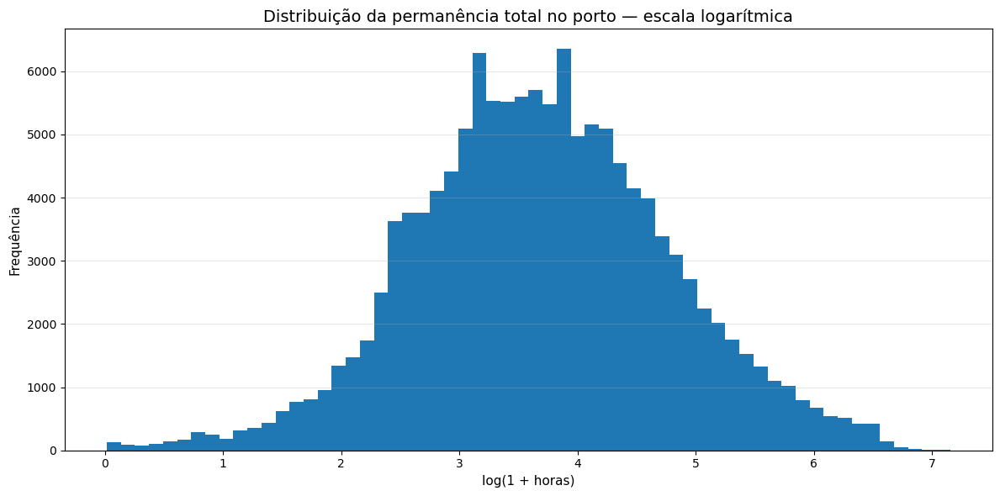

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_histogram_log.png')

In [41]:
# 3.8. Distribution in log scale

positive_series_h = target_series_h[target_series_h > 0]

fig, ax = plt.subplots(figsize=(12, 6))

ax.hist(np.log1p(positive_series_h), bins=60)

ax.set_title("Distribuição da permanência total no porto — escala logarítmica")
ax.set_xlabel("log(1 + horas)")
ax.set_ylabel("Frequência")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_03_total_port_stay_histogram_log.png")
plt.show()

figure_path

A escala logarítmica ajuda a visualizar distribuições assimétricas. Quando uma variável tem cauda longa, a escala original pode ser dominada por valores extremos. A transformação logarítmica reduz esse efeito e permite observar melhor a estrutura geral da distribuição.

Essa característica também será relevante na etapa de modelagem, pois targets assimétricos podem exigir transformações, modelos robustos ou métricas de avaliação menos sensíveis a extremos.

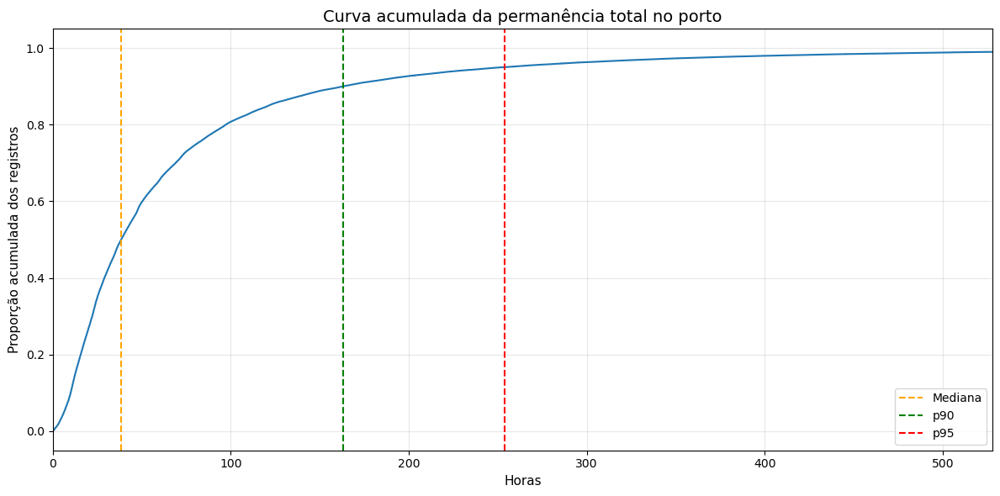

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_ecdf.png')

In [42]:
# 3.9. Total port stay ECDF

sorted_values = np.sort(target_series_h.values)
ecdf = np.arange(1, len(sorted_values) + 1) / len(sorted_values)

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(sorted_values, ecdf)

ax.axvline(target_series_h.median(), linestyle="--", linewidth=1.5, label="Mediana", color="orange")
ax.axvline(target_series_h.quantile(0.90), linestyle="--", linewidth=1.5, label="p90", color="green")
ax.axvline(target_series_h.quantile(0.95), linestyle="--", linewidth=1.5, label="p95", color="red")

ax.set_xlim(0, target_series_h.quantile(0.99))
ax.set_title("Curva acumulada da permanência total no porto")
ax.set_xlabel("Horas")
ax.set_ylabel("Proporção acumulada dos registros")
ax.grid(alpha=0.3)
ax.legend()

figure_path = save_figure("eda_03_total_port_stay_ecdf.png")
plt.show()

figure_path

A curva acumulada mostra a proporção de escalas portuárias concluídas até determinado número de horas.

Essa visualização é útil porque permite interpretar diretamente perguntas de planejamento, como:

- Até quantas horas se completam 50% das escalas?
- Qual tempo cobre 90% dos casos?
- Qual é o intervalo entre o comportamento típico e o cenário de maior risco?

Essa diferença entre mediana e percentis superiores é uma forma prática de representar a incerteza do lead time.

In [43]:
# 3.10. Percentage of records above operational thresholds

thresholds_days = [1, 2, 3, 5, 7, 10, 14, 21, 30]

threshold_summary = pd.DataFrame(
    [
        {
            "threshold_days": threshold,
            "threshold_hours": threshold * 24,
            "count_above": (target_series_h > threshold * 24).sum(),
            "pct_above": (target_series_h > threshold * 24).mean() * 100,
        }
        for threshold in thresholds_days
    ]
)

threshold_summary

,threshold_days,threshold_hours,count_above,pct_above
0,1,24,86326,66.60
1,2,48,54257,41.86
2,3,72,36891,28.46
3,5,120,19801,15.28
4,7,168,12392,9.56
5,10,240,7104,5.48
6,14,336,3833,2.96
7,21,504,1491,1.15
8,30,720,170,0.13


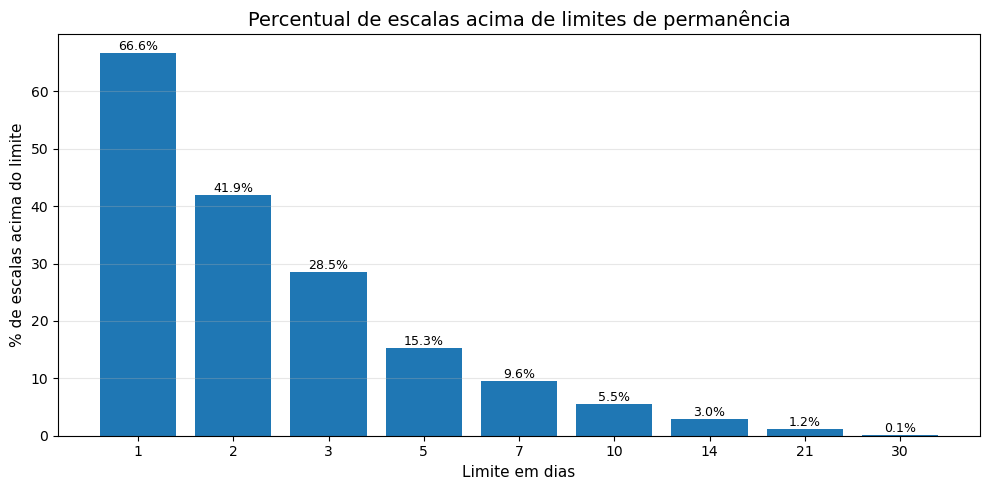

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_thresholds.png')

In [44]:
# 3.11. Graph of percentage of records above operational thresholds

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    threshold_summary["threshold_days"].astype(str),
    threshold_summary["pct_above"],
)

for index, row in threshold_summary.iterrows():
    ax.text(
        index,
        row["pct_above"],
        f"{row['pct_above']:.1f}%",
        ha="center",
        va="bottom",
        fontsize=9,
    )

ax.set_title("Percentual de escalas acima de limites de permanência")
ax.set_xlabel("Limite em dias")
ax.set_ylabel("% de escalas acima do limite")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_03_total_port_stay_thresholds.png")
plt.show()

figure_path

A análise por limites operacionais traduz a distribuição para uma linguagem mais próxima do planejamento.

Em vez de olhar apenas média e mediana, avaliamos qual parcela das escalas ultrapassa determinados patamares, como 3, 7, 14 ou 30 dias. Essa leitura ajuda a conectar a análise estatística com decisões práticas de Supply Chain, como definição de buffers, janelas logísticas e avaliação de risco.

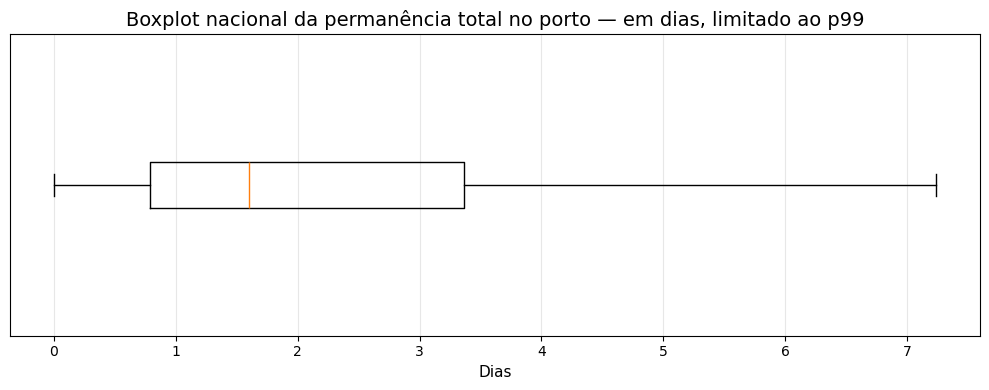

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_03_total_port_stay_boxplot_days.png')

In [45]:
# 3.12. Boxplot of total port stay in days (limited to p99)

boxplot_series = target_series_d.clip(upper=target_series_d.quantile(0.99))

fig, ax = plt.subplots(figsize=(10, 4))

ax.boxplot(
    boxplot_series,
    vert=False,
    showfliers=False,
)

ax.set_title("Boxplot nacional da permanência total no porto — em dias, limitado ao p99")
ax.set_xlabel("Dias")
ax.set_yticks([])

ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_03_total_port_stay_boxplot_days.png")
plt.show()

figure_path

In [46]:
# 3.13. Extreme cases of total port stay

extreme_total_cases = (
    df[
        [
            "port_call_id",
            "port",
            "port_display",
            "arrival_port_ts",
            "departure_port_ts",
            "t_wait_for_berthing_h",
            "t_operation_h",
            "t_post_operation_h",
            "t_total_port_stay_h",
            "t_total_port_stay_d",
        ]
    ]
    .sort_values("t_total_port_stay_h", ascending=False)
    .head(20)
)

extreme_total_cases

,port_call_id,port,port_display,arrival_port_ts,departure_port_ts,t_wait_for_berthing_h,t_operation_h,t_post_operation_h,t_total_port_stay_h,t_total_port_stay_d
93308,478362024,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,2024-10-23 06:00:00,2024-12-15 14:05:00,667.50,612.58,0.00,"1,280.08",53.34
101182,207152023,BRSSZ,BRSSZ - SANTOS - SP,2023-05-26 13:55:00,2023-07-18 14:30:00,0.00,143.42,"1,129.17","1,272.58",53.02
36291,226462024,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,2024-07-03 16:04:00,2024-08-20 08:30:00,395.22,120.60,628.62,"1,144.43",47.68
36183,191192024,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,2024-05-12 10:48:00,2024-06-28 23:30:00,641.98,498.72,0.00,"1,140.70",47.53
36184,267582024,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,2024-05-12 10:48:00,2024-06-28 23:30:00,641.98,498.72,0.00,"1,140.70",47.53
103365,472032023,BRSSZ,BRSSZ - SANTOS - SP,2023-10-27 18:00:00,2023-12-14 03:45:00,652.00,485.75,0.00,"1,137.75",47.41
120719,425692023,BRTRM001,BRTRM001 - IMBÉ - RS,2023-09-27 03:00:00,2023-11-12 18:30:00,413.30,706.20,0.00,"1,119.50",46.65
108048,460032024,BRSSZ,BRSSZ - SANTOS - SP,2024-09-14 14:54:00,2024-10-30 22:03:00,675.10,436.05,0.00,"1,111.15",46.30
108047,401772024,BRSSZ,BRSSZ - SANTOS - SP,2024-09-14 14:54:00,2024-10-30 22:03:00,675.10,436.05,0.00,"1,111.15",46.30
117568,259352024,BRSUA,BRSUA - CABO DE SANTO AGOSTINHO - PE,2024-06-07 14:01:00,2024-07-23 17:30:00,287.07,53.83,766.58,"1,107.48",46.15


Os maiores valores da permanência total devem ser interpretados com cuidado.

Eles podem representar eventos reais de longa permanência, mas também podem refletir características específicas do registro operacional, como atualizações tardias, particularidades da escala ou limitações do dado público.

Nesta análise, esses casos não são removidos automaticamente. Eles permanecem como parte da distribuição porque representam a cauda do lead time, que é justamente uma dimensão relevante para risco logístico.

In [47]:
# 3.14. Narrative summary of total port stay distribution

n_obs = target_series_h.count()
median_d = target_series_d.median()
mean_d = target_series_d.mean()
p90_d = target_series_d.quantile(0.90)
p95_d = target_series_d.quantile(0.95)
p99_d = target_series_d.quantile(0.99)

mean_median_ratio = mean_h / median_h if median_h != 0 else np.nan
p90_median_ratio = p90_h / median_h if median_h != 0 else np.nan

section_3_narrative = f"""
A base elegível possui {n_obs:,.0f} escalas portuárias para análise da permanência total.

A mediana nacional da permanência total é de {median_d:,.2f} dias, enquanto a média é de {mean_d:,.2f} dias.
A diferença entre média e mediana sugere assimetria na distribuição, com presença de valores altos puxando a média para cima.

O percentil 90 é de {p90_d:,.2f} dias, o percentil 95 é de {p95_d:,.2f} dias e o percentil 99 é de {p99_d:,.2f} dias.

A razão entre média e mediana é de {mean_median_ratio:,.2f}, enquanto a razão entre p90 e mediana é de {p90_median_ratio:,.2f}.
Quanto maiores essas razões, maior a evidência de cauda longa e de risco operacional associado ao lead time portuário.
"""

print(section_3_narrative)


A base elegível possui 129,625 escalas portuárias para análise da permanência total.

A mediana nacional da permanência total é de 1.60 dias, enquanto a média é de 2.96 dias.
A diferença entre média e mediana sugere assimetria na distribuição, com presença de valores altos puxando a média para cima.

O percentil 90 é de 6.80 dias, o percentil 95 é de 10.57 dias e o percentil 99 é de 21.99 dias.

A razão entre média e mediana é de 1.85, enquanto a razão entre p90 e mediana é de 4.25.
Quanto maiores essas razões, maior a evidência de cauda longa e de risco operacional associado ao lead time portuário.



### Principais mensagens da seção

A permanência total no porto apresenta uma distribuição que deve ser analisada além da média. A comparação entre mediana, média e percentis superiores permite avaliar se o lead time portuário possui cauda longa e se uma parcela menor dos registros concentra tempos muito elevados.

Essa característica é central para o TCC. Em cadeias de suprimento, decisões de estoque de segurança e capital de giro não dependem apenas do comportamento médio, mas também da variabilidade e do risco de atraso.

Se a diferença entre mediana, p90, p95 e p99 for expressiva, isso indica que o planejamento baseado apenas em médias históricas tende a subestimar cenários de maior risco. Nesse contexto, modelos preditivos podem ajudar a estimar melhor a permanência esperada e o risco de atraso de cada escala portuária.

A próxima seção avança da visão nacional para a visão espacial: quais portos e regiões concentram maior volume, maior tempo típico e maior variabilidade?

---

## 4. O mapa do Brasil: onde está a variabilidade?

Depois de analisar o comportamento nacional da permanência portuária, o próximo passo é investigar sua dimensão espacial.

A permanência de embarcações no porto não deve ser interpretada como um fenômeno homogêneo no território brasileiro. Portos diferentes atendem perfis operacionais distintos, estão sujeitos a diferentes níveis de demanda, infraestrutura, condições naturais, sazonalidade e especialização logística.

Nesta seção, analisamos a distribuição espacial dos tempos portuários a partir de duas perspectivas:

1. **Mapa por porto:** cada porto é representado por uma bolha, em que o tamanho indica volume de escalas e a cor representa uma métrica de tempo ou variabilidade.
2. **Mapa por região/UF:** o Brasil é representado geograficamente, permitindo observar padrões regionais de volume, tempo típico e risco de cauda.

A pergunta principal desta seção é:

> Quais portos e regiões combinam alto volume operacional com alta variabilidade de permanência portuária?

Essa pergunta é importante porque portos de alto volume e alta variabilidade tendem a ter maior impacto logístico. Eles não apenas movimentam mais embarcações, mas também introduzem mais incerteza no planejamento da cadeia.

In [48]:
# 4.1. Geo maps dependencies

# Optional dependencies for geographic maps.
# If needed, install them in your environment:
# pip install geopandas geobr mapclassify

try:
    import geopandas as gpd
    import geobr

    GEO_STACK_AVAILABLE = True
except ImportError:
    GEO_STACK_AVAILABLE = False

print(f"Geographic stack available: {GEO_STACK_AVAILABLE}")

Geographic stack available: True


In [49]:
# 4.2. Validate geographic columns

geo_required_columns = [
    "port",
    "port_display",
    "state",
    "region",
    "latitude",
    "longitude",
    "t_total_port_stay_h",
    "t_total_port_stay_d",
]

missing_geo_columns = [
    col for col in geo_required_columns
    if col not in df.columns
]

if missing_geo_columns:
    raise ValueError(
        "The EDA base is missing required geographic columns:\n"
        + "\n".join(f"- {col}" for col in missing_geo_columns)
    )

df_geo = df.dropna(
    subset=[
        "port",
        "latitude",
        "longitude",
        "t_total_port_stay_h",
    ]
).copy()

print(f"Rows with geographic reference: {len(df_geo):,}")
print(f"Ports with geographic reference: {df_geo['port'].nunique():,}")

Rows with geographic reference: 129,625
Ports with geographic reference: 109


In [50]:
# 4.3. Aggregate geographic statistics by port

MIN_PORT_CALLS_FOR_PORT_MAP = 30

port_geo_stats = (
    df_geo
    .groupby(
        [
            "port",
            "port_display",
            "city",
            "state",
            "region",
            "latitude",
            "longitude",
        ],
        dropna=False,
    )
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        std_total_h=("t_total_port_stay_h", "std"),
        p75_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.75)),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
)

port_geo_stats["mean_total_d"] = port_geo_stats["mean_total_h"] / 24
port_geo_stats["median_total_d"] = port_geo_stats["median_total_h"] / 24
port_geo_stats["std_total_d"] = port_geo_stats["std_total_h"] / 24
port_geo_stats["p75_total_d"] = port_geo_stats["p75_total_h"] / 24
port_geo_stats["p90_total_d"] = port_geo_stats["p90_total_h"] / 24
port_geo_stats["p95_total_d"] = port_geo_stats["p95_total_h"] / 24

port_geo_stats["iqr_total_d"] = port_geo_stats["p75_total_d"] - port_geo_stats["median_total_d"]
port_geo_stats["p90_minus_median_d"] = (
    port_geo_stats["p90_total_d"] - port_geo_stats["median_total_d"]
)

port_geo_stats["cv_total"] = (
    port_geo_stats["std_total_h"] / port_geo_stats["mean_total_h"]
)

port_geo_stats_filtered = port_geo_stats.loc[
    port_geo_stats["n_calls"] >= MIN_PORT_CALLS_FOR_PORT_MAP
].copy()

print(f"Ports before minimum volume filter: {len(port_geo_stats):,}")
print(f"Ports after minimum volume filter: {len(port_geo_stats_filtered):,}")

port_geo_stats_filtered.head()

Ports before minimum volume filter: 109
Ports after minimum volume filter: 91


,port,port_display,city,state,region,latitude,longitude,n_calls,mean_total_h,median_total_h,std_total_h,p75_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,std_total_d,p75_total_d,p90_total_d,p95_total_d,iqr_total_d,p90_minus_median_d,cv_total
0,BR052001,BR052001 - JURITI - PA,JURITI,PA,NORTE,-2.17,-56.11,386,32.26,26.50,32.63,32.07,39.50,47.68,1.34,1.10,1.36,1.34,1.65,1.99,0.23,0.54,1.01
1,BR147001,BR147001 - TRIUNFO - RS,TRIUNFO,RS,SUL,-29.95,-51.62,86,88.18,53.48,91.69,113.00,229.50,301.62,3.67,2.23,3.82,4.71,9.56,12.57,2.48,7.33,1.04
2,BR252001,BR252001 - GUAMARÉ - RN,GUAMARÉ,RN,NORDESTE,-4.87,-36.37,153,102.59,70.20,103.84,117.50,211.52,300.20,4.27,2.93,4.33,4.90,8.81,12.51,1.97,5.89,1.01
3,BR252002,BR252002 - GUAMARÉ - RN,GUAMARÉ,RN,NORDESTE,-5.11,-36.32,43,107.16,92.20,81.41,152.90,231.02,256.37,4.46,3.84,3.39,6.37,9.63,10.68,2.53,5.78,0.76
4,BR302002,BR302002 - NOVA SANTA RITA - RS,NOVA SANTA RITA,RS,SUL,-29.93,-51.28,81,58.43,50.00,37.16,66.75,88.75,117.50,2.43,2.08,1.55,2.78,3.70,4.90,0.70,1.61,0.64


### Métricas usadas no mapa

Para cada porto, calculamos:

- **número de escalas**, representando volume operacional;
- **mediana da permanência total**, representando o comportamento típico;
- **p90 da permanência total**, representando cenário de risco;
- **diferença entre p90 e mediana**, representando a amplitude da cauda operacional;
- **desvio padrão e coeficiente de variação**, representando dispersão.

Para evitar interpretações instáveis, os mapas por porto usam apenas portos com um volume mínimo de escalas. Nesta análise inicial, foi usado um limite mínimo de 30 escalas por porto.

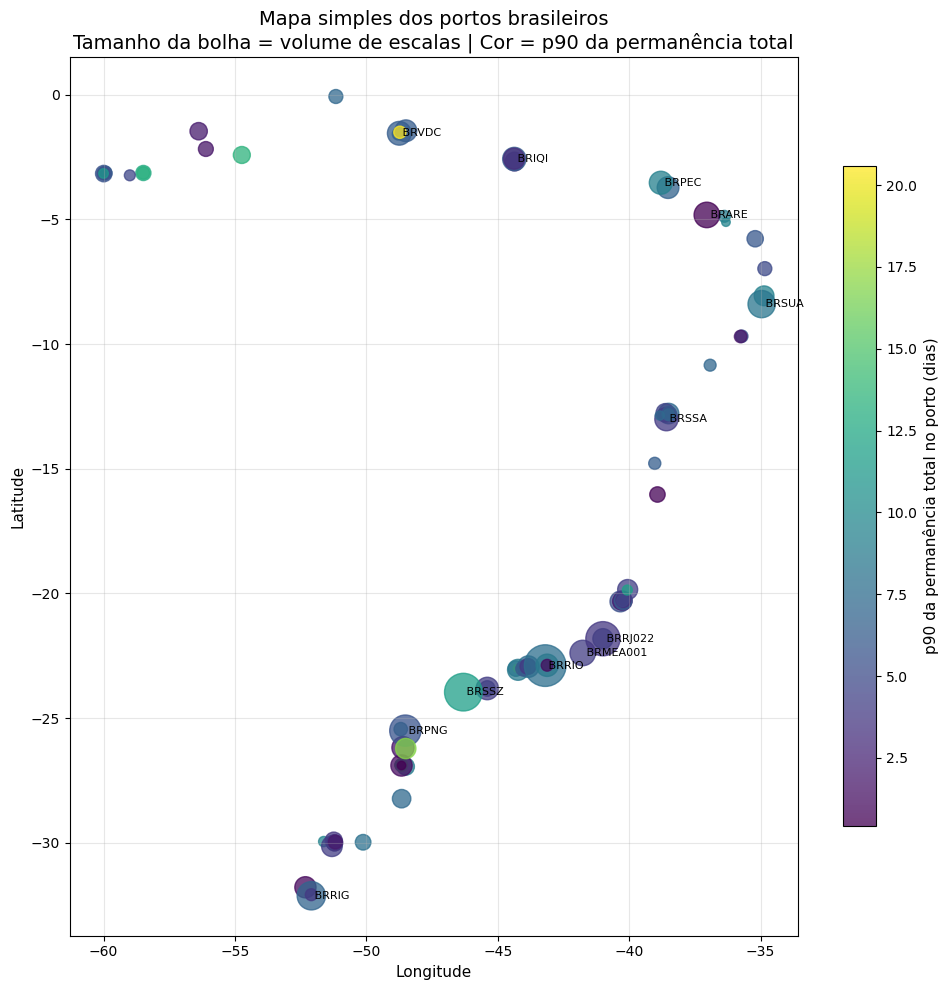

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_simple_bubble_map_ports_p90.png')

In [51]:
# 4.4. Simple bubble map: bubble = volume, color = p90

plot_data = port_geo_stats_filtered.copy()

bubble_size = (
    np.sqrt(plot_data["n_calls"]) / np.sqrt(plot_data["n_calls"].max()) * 900
)

fig, ax = plt.subplots(figsize=(10, 10))

scatter = ax.scatter(
    plot_data["longitude"],
    plot_data["latitude"],
    s=bubble_size,
    c=plot_data["p90_total_d"],
    alpha=0.75,
)

cbar = plt.colorbar(scatter, ax=ax, shrink=0.75)
cbar.set_label("p90 da permanência total no porto (dias)")

ax.set_title(
    "Mapa simples dos portos brasileiros\n"
    "Tamanho da bolha = volume de escalas | Cor = p90 da permanência total"
)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(alpha=0.3)

# Label top ports by volume
top_label_ports = plot_data.sort_values("n_calls", ascending=False).head(12)

for _, row in top_label_ports.iterrows():
    ax.text(
        row["longitude"],
        row["latitude"],
        f" {row['port']}",
        fontsize=8,
        va="center",
    )

figure_path = save_figure("eda_04_simple_bubble_map_ports_p90.png")
plt.show()

figure_path

O mapa simples permite uma primeira leitura espacial sem depender de arquivos geográficos externos.

Cada bolha representa um porto. O tamanho indica o número de escalas observadas, enquanto a cor representa o p90 da permanência total. Assim, portos grandes e com cores mais intensas indicam locais que combinam relevância operacional com maior risco de permanência elevada.

Essa visualização é útil para identificar rapidamente portos prioritários para análise mais detalhada.

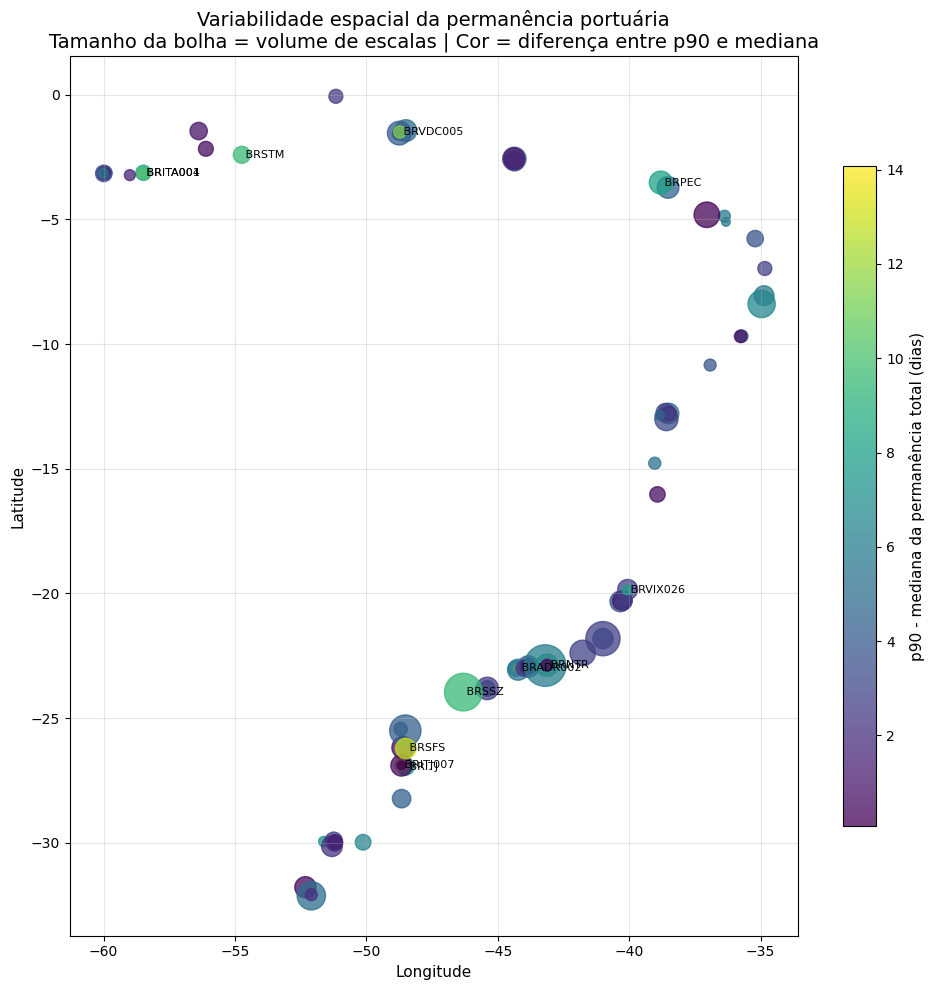

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_simple_bubble_map_ports_variability.png')

In [52]:
# 4.5. Simple bubble map: bubble = volume, color = p90 - median

plot_data = port_geo_stats_filtered.copy()

bubble_size = (
    np.sqrt(plot_data["n_calls"]) / np.sqrt(plot_data["n_calls"].max()) * 900
)

fig, ax = plt.subplots(figsize=(10, 10))

scatter = ax.scatter(
    plot_data["longitude"],
    plot_data["latitude"],
    s=bubble_size,
    c=plot_data["p90_minus_median_d"],
    alpha=0.75,
)

cbar = plt.colorbar(scatter, ax=ax, shrink=0.75)
cbar.set_label("p90 - mediana da permanência total (dias)")

ax.set_title(
    "Variabilidade espacial da permanência portuária\n"
    "Tamanho da bolha = volume de escalas | Cor = diferença entre p90 e mediana"
)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(alpha=0.3)

top_variability_ports = plot_data.sort_values(
    "p90_minus_median_d",
    ascending=False,
).head(12)

for _, row in top_variability_ports.iterrows():
    ax.text(
        row["longitude"],
        row["latitude"],
        f" {row['port']}",
        fontsize=8,
        va="center",
    )

figure_path = save_figure("eda_04_simple_bubble_map_ports_variability.png")
plt.show()

figure_path

A diferença entre p90 e mediana ajuda a separar portos apenas lentos de portos imprevisíveis.

Um porto pode ter uma mediana relativamente controlada, mas apresentar p90 muito superior. Isso indica que, embora o comportamento típico não seja necessariamente problemático, existe uma cauda de casos com permanência elevada.

Para Supply Chain, essa diferença é relevante porque o planejamento precisa lidar não apenas com o tempo esperado, mas também com o risco de atrasos extremos.

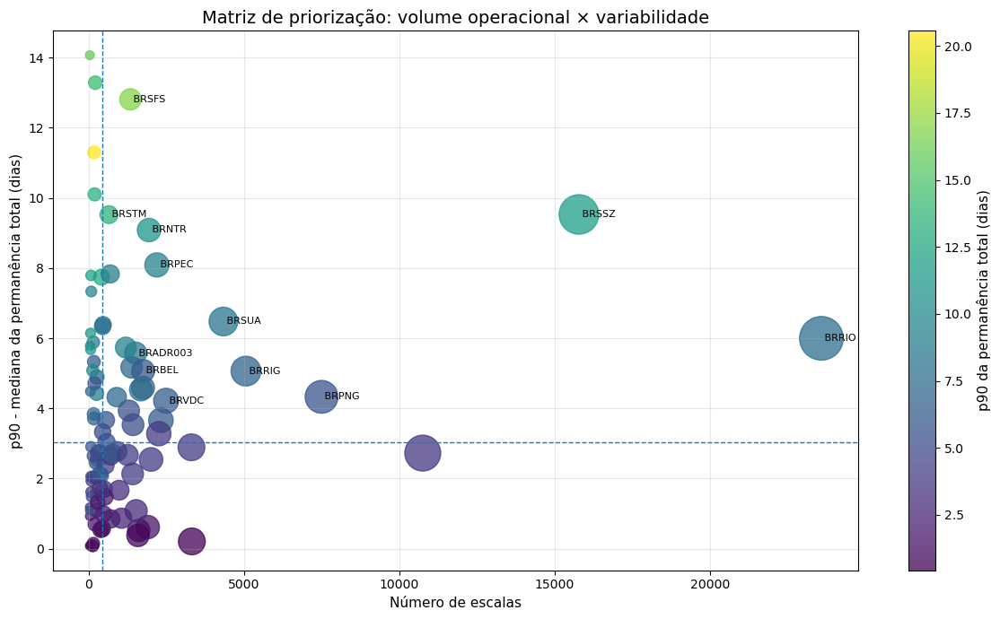

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_port_volume_vs_variability.png')

In [53]:
# 4.6. Spatial ranking: volume vs variability

plot_data = port_geo_stats_filtered.copy()

fig, ax = plt.subplots(figsize=(12, 7))

scatter = ax.scatter(
    plot_data["n_calls"],
    plot_data["p90_minus_median_d"],
    s=np.sqrt(plot_data["n_calls"]) * 8,
    c=plot_data["p90_total_d"],
    alpha=0.75,
)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label("p90 da permanência total (dias)")

ax.set_title("Matriz de priorização: volume operacional × variabilidade")
ax.set_xlabel("Número de escalas")
ax.set_ylabel("p90 - mediana da permanência total (dias)")
ax.grid(alpha=0.3)

# Reference lines
ax.axvline(plot_data["n_calls"].median(), linestyle="--", linewidth=1)
ax.axhline(plot_data["p90_minus_median_d"].median(), linestyle="--", linewidth=1)

# Label ports with high volume and high variability
priority_ports = (
    plot_data
    .assign(
        priority_score=lambda x: (
            x["n_calls"].rank(pct=True)
            + x["p90_minus_median_d"].rank(pct=True)
        )
    )
    .sort_values("priority_score", ascending=False)
    .head(12)
)

for _, row in priority_ports.iterrows():
    ax.text(
        row["n_calls"],
        row["p90_minus_median_d"],
        f" {row['port']}",
        fontsize=8,
        va="center",
    )

figure_path = save_figure("eda_04_port_volume_vs_variability.png")
plt.show()

figure_path

A matriz volume × variabilidade ajuda a priorizar portos para investigação.

O quadrante mais relevante é aquele que combina:

- alto número de escalas;
- alta diferença entre p90 e mediana.

Portos nesse quadrante são logisticamente importantes porque concentram volume e incerteza. Eles podem ter impacto maior sobre decisões de planejamento, previsão de lead time, buffers e estoques de segurança.

### Mapa geográfico com contorno do Brasil

O mapa anterior usa coordenadas diretamente, mas não apresenta o contorno territorial do Brasil. Para uma visualização mais adequada ao capítulo do TCC, vamos usar um mapa geográfico com as Unidades Federativas brasileiras.

Essa visualização permite combinar duas camadas:

1. o território brasileiro, representado por UFs ou regiões;
2. os portos, representados por bolhas sobre o mapa.

Com isso, conseguimos conectar volume e variabilidade portuária à geografia nacional.

In [54]:
# 4.7. Load Brazilian states geospatial data

if not GEO_STACK_AVAILABLE:
    raise ImportError(
        "Geographic dependencies are not available.\n"
        "Install them with:\n"
        "pip install geopandas geobr mapclassify"
    )

br_states = geobr.read_state(year=2020)

print(br_states.shape)
br_states.head()

(27, 6)


,code_state,abbrev_state,name_state,code_region,name_region,geometry
0,11.00,RO,Rondônia,1.00,Norte,"MULTIPOLYGON (((-65.3815 -10.42907, -65.38013 ..."
1,12.00,AC,Acre,1.00,Norte,"MULTIPOLYGON (((-71.07772 -9.82774, -71.07817 ..."
2,13.00,AM,Amazônas,1.00,Norte,"MULTIPOLYGON (((-69.83766 -3.68659, -69.82555 ..."
3,14.00,RR,Roraima,1.00,Norte,"MULTIPOLYGON (((-63.96008 2.47313, -63.96041 2..."
4,15.00,PA,Pará,1.00,Norte,"MULTIPOLYGON (((-51.43248 -0.47334, -51.42949 ..."


In [55]:
# 4.8. Standardize geobr column names

br_states_cols = br_states.columns.tolist()
br_states_cols

# geobr usually returns columns such as:
# code_state, abbrev_state, name_state, code_region, name_region, geometry

required_geobr_cols = [
    "abbrev_state",
    "name_state",
    "name_region",
    "geometry",
]

missing_geobr_cols = [
    col for col in required_geobr_cols
    if col not in br_states.columns
]

if missing_geobr_cols:
    raise ValueError(
        "Unexpected geobr state schema. Missing columns:\n"
        + "\n".join(f"- {col}" for col in missing_geobr_cols)
    )

br_states = br_states[
    [
        "abbrev_state",
        "name_state",
        "name_region",
        "geometry",
    ]
].copy()

br_states.head()

,abbrev_state,name_state,name_region,geometry
0,RO,Rondônia,Norte,"MULTIPOLYGON (((-65.3815 -10.42907, -65.38013 ..."
1,AC,Acre,Norte,"MULTIPOLYGON (((-71.07772 -9.82774, -71.07817 ..."
2,AM,Amazônas,Norte,"MULTIPOLYGON (((-69.83766 -3.68659, -69.82555 ..."
3,RR,Roraima,Norte,"MULTIPOLYGON (((-63.96008 2.47313, -63.96041 2..."
4,PA,Pará,Norte,"MULTIPOLYGON (((-51.43248 -0.47334, -51.42949 ..."


In [56]:
# 4.9. Create GeoDataFrame for ports

ports_gdf = gpd.GeoDataFrame(
    port_geo_stats_filtered.copy(),
    geometry=gpd.points_from_xy(
        port_geo_stats_filtered["longitude"],
        port_geo_stats_filtered["latitude"],
    ),
    crs="EPSG:4326",
)

# Match CRS with the Brazil states GeoDataFrame
ports_gdf = ports_gdf.to_crs(br_states.crs)

ports_gdf.head()

,port,port_display,city,state,region,latitude,longitude,n_calls,mean_total_h,median_total_h,std_total_h,p75_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,std_total_d,p75_total_d,p90_total_d,p95_total_d,iqr_total_d,p90_minus_median_d,cv_total,geometry
0,BR052001,BR052001 - JURITI - PA,JURITI,PA,NORTE,-2.17,-56.11,386,32.26,26.50,32.63,32.07,39.50,47.68,1.34,1.10,1.36,1.34,1.65,1.99,0.23,0.54,1.01,POINT (-56.10598 -2.17378)
1,BR147001,BR147001 - TRIUNFO - RS,TRIUNFO,RS,SUL,-29.95,-51.62,86,88.18,53.48,91.69,113.00,229.50,301.62,3.67,2.23,3.82,4.71,9.56,12.57,2.48,7.33,1.04,POINT (-51.62389 -29.94861)
2,BR252001,BR252001 - GUAMARÉ - RN,GUAMARÉ,RN,NORDESTE,-4.87,-36.37,153,102.59,70.20,103.84,117.50,211.52,300.20,4.27,2.93,4.33,4.90,8.81,12.51,1.97,5.89,1.01,POINT (-36.37417 -4.87361)
3,BR252002,BR252002 - GUAMARÉ - RN,GUAMARÉ,RN,NORDESTE,-5.11,-36.32,43,107.16,92.20,81.41,152.90,231.02,256.37,4.46,3.84,3.39,6.37,9.63,10.68,2.53,5.78,0.76,POINT (-36.31792 -5.10639)
4,BR302002,BR302002 - NOVA SANTA RITA - RS,NOVA SANTA RITA,RS,SUL,-29.93,-51.28,81,58.43,50.00,37.16,66.75,88.75,117.50,2.43,2.08,1.55,2.78,3.70,4.90,0.70,1.61,0.64,POINT (-51.28278 -29.9312)


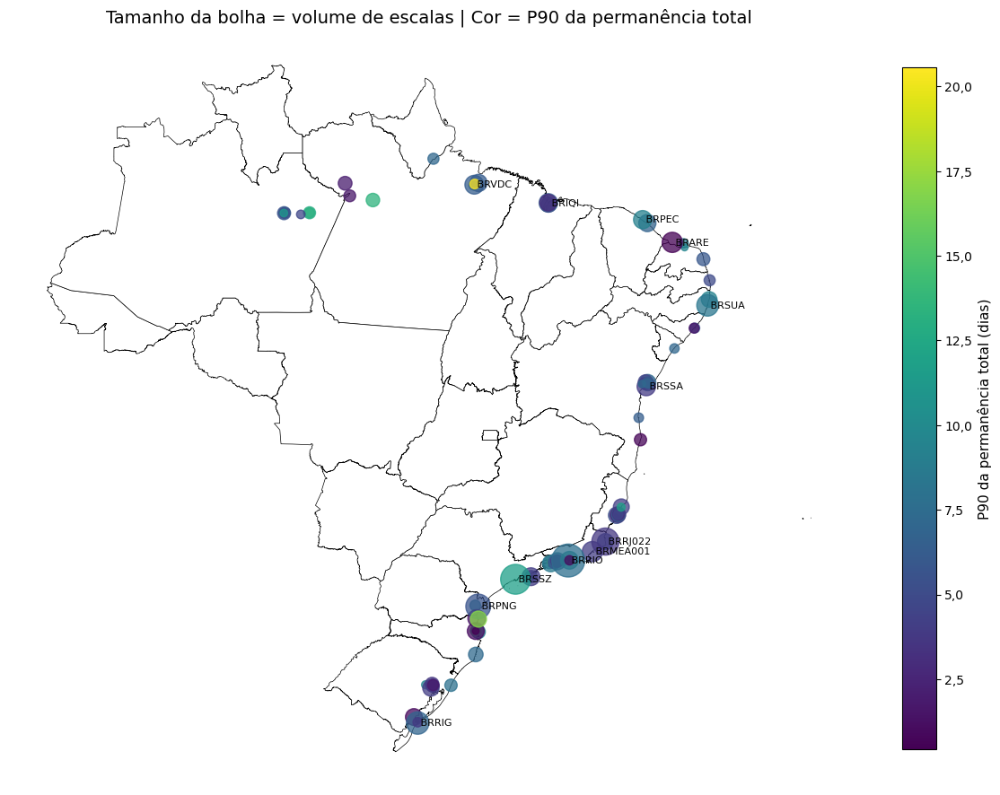

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_brazil_map_ports_bubbles_p90.png')

In [284]:
# 4.10. Bubble map of ports over Brazilian states map
import matplotlib.ticker as mticker

def formatar_virgula(x, pos):
    return f"{x:.1f}".replace(".", ",")

plot_ports = ports_gdf.copy()

bubble_size = (
    np.sqrt(plot_ports["n_calls"]) / np.sqrt(plot_ports["n_calls"].max()) * 700
)

fig, ax = plt.subplots(figsize=(12, 12))

br_states.plot(
    ax=ax,
    linewidth=0.5,
    edgecolor="black",
    facecolor="white",
)

plot_ports.plot(
    ax=ax,
    markersize=bubble_size,
    column="p90_total_d",
    legend=True,
    alpha=0.75,
    legend_kwds={
        "label": "P90 da permanência total (dias)",
        "shrink": 0.65,
        "format": mticker.FuncFormatter(formatar_virgula), # <--- NOVA LINHA AQUI
    },
)

top_label_ports = plot_ports.sort_values("n_calls", ascending=False).head(12)

for _, row in top_label_ports.iterrows():
    ax.text(
        row.geometry.x,
        row.geometry.y,
        f" {row['port']}",
        fontsize=8,
        va="center",
    )

ax.set_title(
    #"Mapa geográfico dos portos brasileiros\n"
    "Tamanho da bolha = volume de escalas | Cor = P90 da permanência total"
)
ax.set_axis_off()

figure_path = save_figure("eda_04_brazil_map_ports_bubbles_p90.png")
plt.show()

figure_path

Este mapa adiciona contexto geográfico à análise por porto.

Ao sobrepor as bolhas ao contorno das UFs brasileiras, fica mais fácil identificar se os portos com maior volume e maior risco estão concentrados em determinadas partes do território.

Esse tipo de visualização é especialmente útil para o storytelling do TCC, porque transforma a análise de lead time em uma leitura espacial do sistema logístico brasileiro.

In [58]:
# 4.11. Regional summary statistics

region_stats = (
    df_geo
    .groupby("region", dropna=False)
    .agg(
        n_calls=("port_call_id", "nunique"),
        n_ports=("port", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        std_total_h=("t_total_port_stay_h", "std"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
)

region_stats["mean_total_d"] = region_stats["mean_total_h"] / 24
region_stats["median_total_d"] = region_stats["median_total_h"] / 24
region_stats["std_total_d"] = region_stats["std_total_h"] / 24
region_stats["p90_total_d"] = region_stats["p90_total_h"] / 24
region_stats["p95_total_d"] = region_stats["p95_total_h"] / 24
region_stats["p90_minus_median_d"] = (
    region_stats["p90_total_d"] - region_stats["median_total_d"]
)
region_stats["cv_total"] = (
    region_stats["std_total_h"] / region_stats["mean_total_h"]
)

region_stats = region_stats.sort_values("n_calls", ascending=False)

region_stats

,region,n_calls,n_ports,mean_total_h,median_total_h,std_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,std_total_d,p90_total_d,p95_total_d,p90_minus_median_d,cv_total
2,SUDESTE,69845,27,75.79,39.92,103.59,174.67,277.07,3.16,1.66,4.32,7.28,11.54,5.61,1.37
3,SUL,25762,28,60.96,29.20,88.27,137.33,214.58,2.54,1.22,3.68,5.72,8.94,4.51,1.45
0,NORDESTE,25236,28,64.47,38.17,86.61,147.84,221.08,2.69,1.59,3.61,6.16,9.21,4.57,1.34
1,NORTE,8782,26,82.68,53.03,93.36,185.13,261.87,3.44,2.21,3.89,7.71,10.91,5.50,1.13


In [59]:
# 4.12. Normalize region names for matching with geobr regions

def normalize_region_name(value: object) -> str:
    """Normalize region names to match geobr region names."""
    if pd.isna(value):
        return np.nan

    text = str(value).strip().lower()

    mapping = {
        "norte": "Norte",
        "north": "Norte",
        "nordeste": "Nordeste",
        "northeast": "Nordeste",
        "centro-oeste": "Centro Oeste",
        "centro oeste": "Centro Oeste",
        "center-west": "Centro Oeste",
        "central-west": "Centro Oeste",
        "sudeste": "Sudeste",
        "southeast": "Sudeste",
        "sul": "Sul",
        "south": "Sul",
    }

    return mapping.get(text, str(value).strip())


region_stats["region_norm"] = region_stats["region"].apply(normalize_region_name)
br_states["region_norm"] = br_states["name_region"].apply(normalize_region_name)

region_stats[["region", "region_norm", "n_calls", "median_total_d", "p90_total_d"]]

,region,region_norm,n_calls,median_total_d,p90_total_d
2,SUDESTE,Sudeste,69845,1.66,7.28
3,SUL,Sul,25762,1.22,5.72
0,NORDESTE,Nordeste,25236,1.59,6.16
1,NORTE,Norte,8782,2.21,7.71


In [60]:
# 4.13. Create GeoDataFrame for Brazilian regions with aggregated statistics

br_regions = (
    br_states
    .dissolve(by="region_norm", as_index=False)
    [["region_norm", "geometry"]]
)

br_regions_stats = br_regions.merge(
    region_stats,
    on="region_norm",
    how="left",
)

br_regions_stats

,region_norm,geometry,region,n_calls,n_ports,mean_total_h,median_total_h,std_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,std_total_d,p90_total_d,p95_total_d,p90_minus_median_d,cv_total
0,Centro Oeste,"POLYGON ((-57.83804 -20.94006, -57.84168 -20.9...",<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Nordeste,"MULTIPOLYGON (((-46.15405 -1.5994, -46.15503 -...",NORDESTE,"25,236.00",28.00,64.47,38.17,86.61,147.84,221.08,2.69,1.59,3.61,6.16,9.21,4.57,1.34
2,Norte,"MULTIPOLYGON (((-65.37908 -10.409, -65.38035 -...",NORTE,"8,782.00",26.00,82.68,53.03,93.36,185.13,261.87,3.44,2.21,3.89,7.71,10.91,5.50,1.13
3,Sudeste,"MULTIPOLYGON (((-48.03773 -25.35624, -48.03747...",SUDESTE,"69,845.00",27.00,75.79,39.92,103.59,174.67,277.07,3.16,1.66,4.32,7.28,11.54,5.61,1.37
4,Sul,"MULTIPOLYGON (((-52.09577 -31.7923, -52.09423 ...",SUL,"25,762.00",28.00,60.96,29.20,88.27,137.33,214.58,2.54,1.22,3.68,5.72,8.94,4.51,1.45


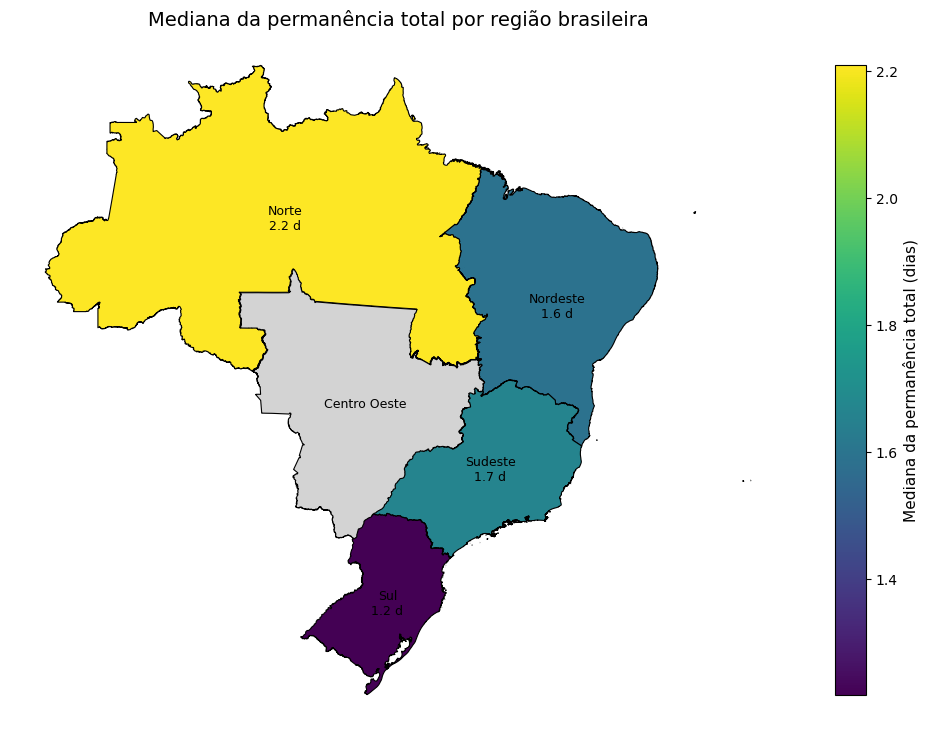

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_brazil_region_choropleth_median.png')

In [61]:
# 4.14. Choropleth map of median total port stay by Brazilian region

fig, ax = plt.subplots(figsize=(10, 10))

br_regions_stats.plot(
    ax=ax,
    column="median_total_d",
    legend=True,
    edgecolor="black",
    linewidth=0.8,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sem dados",
    },
    legend_kwds={
        "label": "Mediana da permanência total (dias)",
        "shrink": 0.65,
    },
)

for _, row in br_regions_stats.iterrows():
    centroid = row.geometry.representative_point()
    label = row["region_norm"]

    if pd.notna(row["median_total_d"]):
        label = f"{label}\n{row['median_total_d']:.1f} d"

    ax.text(
        centroid.x,
        centroid.y,
        label,
        ha="center",
        va="center",
        fontsize=9,
    )

ax.set_title("Mediana da permanência total por região brasileira")
ax.set_axis_off()

figure_path = save_figure("eda_04_brazil_region_choropleth_median.png")
plt.show()

figure_path

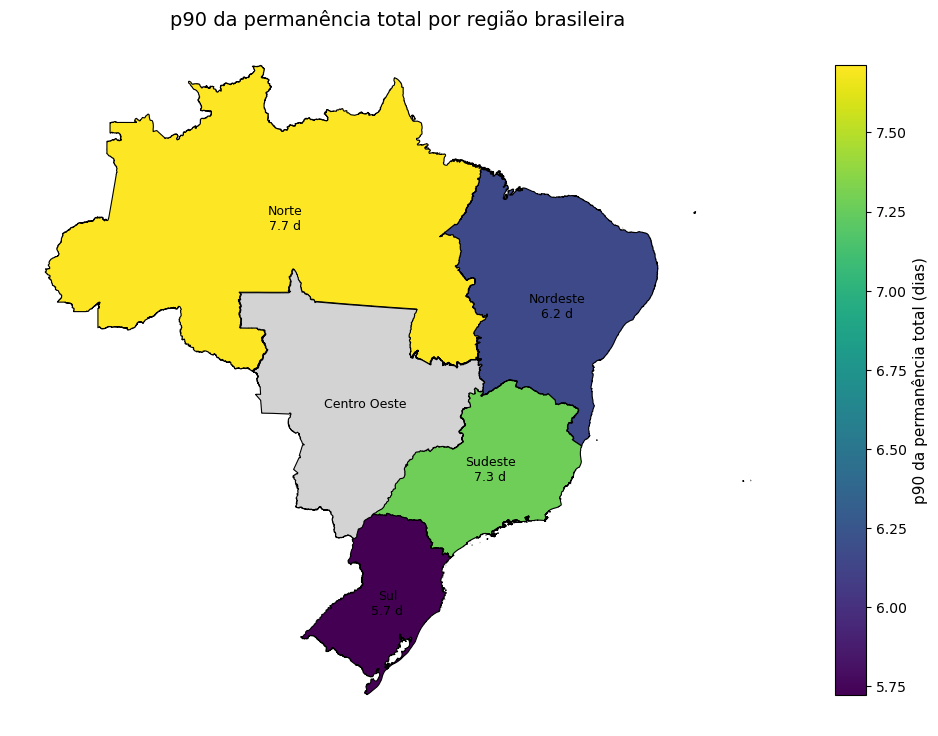

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_brazil_region_choropleth_p90.png')

In [62]:
# 4.15. Choropleth map of p90 by Brazilian region

fig, ax = plt.subplots(figsize=(10, 10))

br_regions_stats.plot(
    ax=ax,
    column="p90_total_d",
    legend=True,
    edgecolor="black",
    linewidth=0.8,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sem dados",
    },
    legend_kwds={
        "label": "p90 da permanência total (dias)",
        "shrink": 0.65,
    },
)

for _, row in br_regions_stats.iterrows():
    centroid = row.geometry.representative_point()
    label = row["region_norm"]

    if pd.notna(row["p90_total_d"]):
        label = f"{label}\n{row['p90_total_d']:.1f} d"

    ax.text(
        centroid.x,
        centroid.y,
        label,
        ha="center",
        va="center",
        fontsize=9,
    )

ax.set_title("p90 da permanência total por região brasileira")
ax.set_axis_off()

figure_path = save_figure("eda_04_brazil_region_choropleth_p90.png")
plt.show()

figure_path

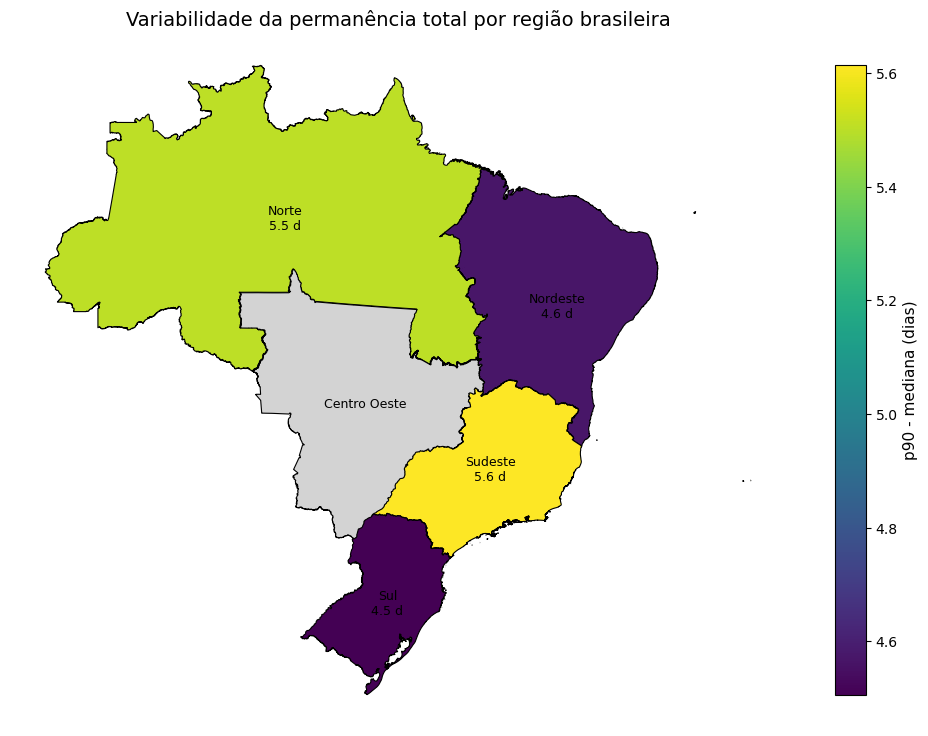

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_brazil_region_choropleth_variability.png')

In [63]:
# 4.16. Choropleth map of p90 - median by Brazilian region

fig, ax = plt.subplots(figsize=(10, 10))

br_regions_stats.plot(
    ax=ax,
    column="p90_minus_median_d",
    legend=True,
    edgecolor="black",
    linewidth=0.8,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sem dados",
    },
    legend_kwds={
        "label": "p90 - mediana (dias)",
        "shrink": 0.65,
    },
)

for _, row in br_regions_stats.iterrows():
    centroid = row.geometry.representative_point()
    label = row["region_norm"]

    if pd.notna(row["p90_minus_median_d"]):
        label = f"{label}\n{row['p90_minus_median_d']:.1f} d"

    ax.text(
        centroid.x,
        centroid.y,
        label,
        ha="center",
        va="center",
        fontsize=9,
    )

ax.set_title("Variabilidade da permanência total por região brasileira")
ax.set_axis_off()

figure_path = save_figure("eda_04_brazil_region_choropleth_variability.png")
plt.show()

figure_path

Os mapas regionais ajudam a diferenciar três conceitos:

- **volume**, associado à concentração de escalas;
- **tempo típico**, representado pela mediana;
- **risco operacional**, representado pelo p90 ou pela diferença entre p90 e mediana.

Uma região pode ter grande volume, mas variabilidade moderada. Outra pode ter menor volume, mas uma cauda mais longa. Essa distinção é importante porque o impacto logístico não depende apenas da quantidade de escalas, mas também da incerteza associada a elas.

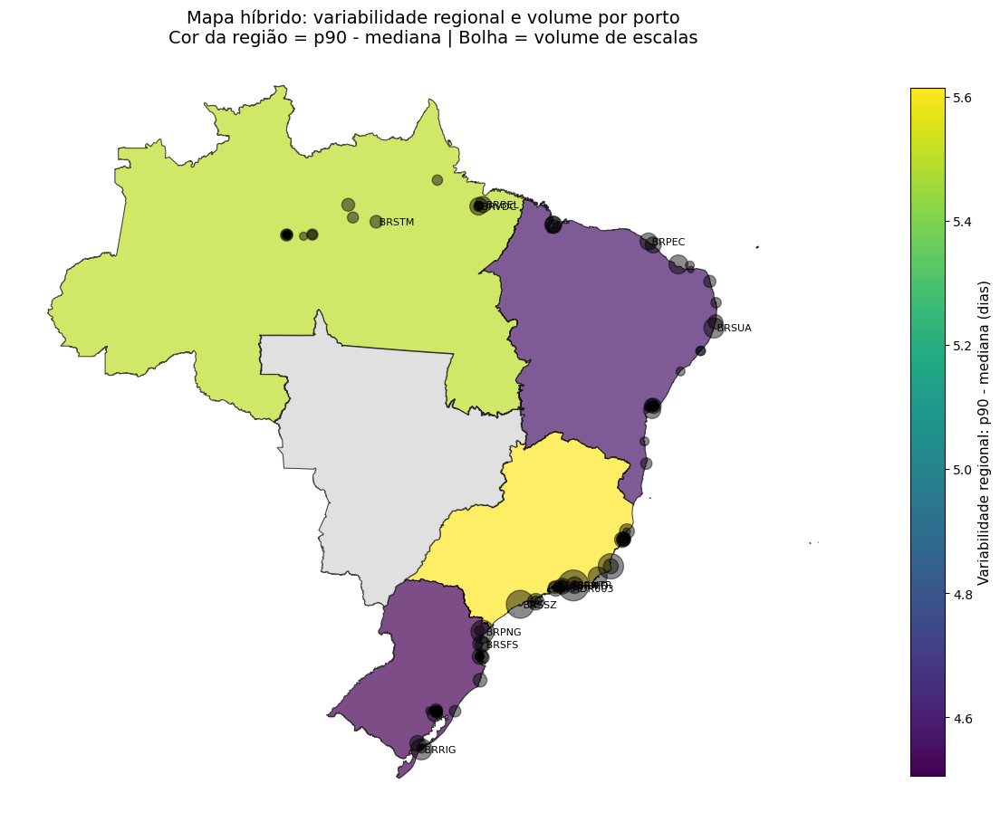

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_04_brazil_hybrid_region_variability_port_volume.png')

In [64]:
# 4.17. Hybrid map: regional variability (p90 - median) with port volume bubbles

plot_ports = ports_gdf.copy()

bubble_size = (
    np.sqrt(plot_ports["n_calls"]) / np.sqrt(plot_ports["n_calls"].max()) * 600
)

fig, ax = plt.subplots(figsize=(12, 12))

br_regions_stats.plot(
    ax=ax,
    column="p90_minus_median_d",
    legend=True,
    edgecolor="black",
    linewidth=0.8,
    alpha=0.7,
    missing_kwds={
        "color": "lightgrey",
        "label": "Sem dados",
    },
    legend_kwds={
        "label": "Variabilidade regional: p90 - mediana (dias)",
        "shrink": 0.65,
    },
)

plot_ports.plot(
    ax=ax,
    markersize=bubble_size,
    color="black",
    alpha=0.45,
)

priority_ports = (
    plot_ports
    .assign(
        priority_score=lambda x: (
            x["n_calls"].rank(pct=True)
            + x["p90_minus_median_d"].rank(pct=True)
        )
    )
    .sort_values("priority_score", ascending=False)
    .head(12)
)

for _, row in priority_ports.iterrows():
    ax.text(
        row.geometry.x,
        row.geometry.y,
        f" {row['port']}",
        fontsize=8,
        va="center",
    )

ax.set_title(
    "Mapa híbrido: variabilidade regional e volume por porto\n"
    "Cor da região = p90 - mediana | Bolha = volume de escalas"
)
ax.set_axis_off()

figure_path = save_figure("eda_04_brazil_hybrid_region_variability_port_volume.png")
plt.show()

figure_path

O mapa híbrido combina duas leituras:

- a **cor da região** mostra a variabilidade agregada do lead time;
- as **bolhas dos portos** mostram onde está concentrado o volume operacional.

Esse gráfico é útil para storytelling porque conecta o risco agregado regional com os pontos físicos da malha portuária.

Para o TCC, essa visualização reforça que o lead time portuário é um fenômeno espacialmente heterogêneo. A incerteza não está distribuída de forma uniforme: ela se concentra em determinados portos e regiões.

In [65]:
# 4.18. Regional ranking by variability (p90 - median)

region_ranking = region_stats[
    [
        "region",
        "n_calls",
        "n_ports",
        "median_total_d",
        "p90_total_d",
        "p95_total_d",
        "p90_minus_median_d",
        "std_total_d",
        "cv_total",
    ]
].sort_values("p90_minus_median_d", ascending=False)

region_ranking

,region,n_calls,n_ports,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d,std_total_d,cv_total
2,SUDESTE,69845,27,1.66,7.28,11.54,5.61,4.32,1.37
1,NORTE,8782,26,2.21,7.71,10.91,5.50,3.89,1.13
0,NORDESTE,25236,28,1.59,6.16,9.21,4.57,3.61,1.34
3,SUL,25762,28,1.22,5.72,8.94,4.51,3.68,1.45


In [66]:
# 4.19. Crtical ports ranking: combining volume, p90 and variability

critical_ports_ranking = (
    port_geo_stats_filtered
    .assign(
        volume_rank_pct=lambda x: x["n_calls"].rank(pct=True),
        variability_rank_pct=lambda x: x["p90_minus_median_d"].rank(pct=True),
        p90_rank_pct=lambda x: x["p90_total_d"].rank(pct=True),
    )
)

critical_ports_ranking["criticality_score"] = (
    critical_ports_ranking["volume_rank_pct"]
    + critical_ports_ranking["variability_rank_pct"]
    + critical_ports_ranking["p90_rank_pct"]
)

critical_ports_ranking = critical_ports_ranking[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p95_total_d",
        "p90_minus_median_d",
        "std_total_d",
        "cv_total",
        "criticality_score",
    ]
].sort_values("criticality_score", ascending=False)

critical_ports_ranking.head(20)

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d,std_total_d,cv_total,criticality_score
89,BRSSZ,BRSSZ - SANTOS - SP,SANTOS,SP,SUDESTE,15773,2.17,11.70,17.36,9.53,5.80,1.29,2.85
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SÃO FRANCISCO DO SUL,SC,SUL,1345,4.09,16.91,22.29,12.81,7.00,0.97,2.69
57,BRNTR,BRNTR - NITERÓI - RJ,NITERÓI,RJ,SUDESTE,1943,1.76,10.85,16.48,9.08,5.49,1.36,2.66
61,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,SÃO GONÇALO DO AMARANTE,CE,NORDESTE,2195,1.08,9.17,13.17,8.09,5.36,1.55,2.62
92,BRSUA,BRSUA - CABO DE SANTO AGOSTINHO - PE,CABO DE SANTO AGOSTINHO,PE,NORDESTE,4336,1.89,8.37,11.83,6.48,4.23,1.21,2.57
72,BRRIO,BRRIO - RIO DE JANEIRO - RJ,RIO DE JANEIRO,RJ,SUDESTE,23575,1.70,7.70,11.82,6.00,4.37,1.35,2.55
90,BRSTM,BRSTM - SANTARÉM - PA,SANTARÉM,PA,NORTE,654,3.87,13.39,16.34,9.53,5.60,0.98,2.48
70,BRREC,BRREC - RECIFE - PE,RECIFE,PE,NORDESTE,1197,3.51,9.25,13.30,5.74,4.60,0.96,2.31
71,BRRIG,BRRIG - SÃO JOSÉ DO NORTE - RS,SÃO JOSÉ DO NORTE,RS,SUL,5061,1.87,6.93,9.85,5.06,3.71,1.21,2.31
38,BRITJ,BRITJ - ITAJAÍ - SC,ITAJAÍ,SC,SUL,695,1.05,8.88,17.07,7.83,5.66,1.76,2.31


In [67]:
# 4.20. Save geographic statistics tables

port_geo_stats_path = TABLES_DIR / "eda_04_port_geo_stats.csv"
region_stats_path = TABLES_DIR / "eda_04_region_stats.csv"
critical_ports_path = TABLES_DIR / "eda_04_critical_ports_ranking.csv"

port_geo_stats_filtered.to_csv(port_geo_stats_path, index=False)
region_stats.to_csv(region_stats_path, index=False)
critical_ports_ranking.to_csv(critical_ports_path, index=False)

port_geo_stats_path, region_stats_path, critical_ports_path

(WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_04_port_geo_stats.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_04_region_stats.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_04_critical_ports_ranking.csv'))

### Principais mensagens da seção

A análise espacial mostra que a permanência portuária não é homogênea no território brasileiro.

Os mapas por porto revelam diferenças importantes entre volume operacional, tempo típico e risco de cauda. Portos com muitas escalas e alta diferença entre p90 e mediana merecem atenção especial, pois combinam relevância logística com imprevisibilidade operacional.

Os mapas regionais reforçam a mesma mensagem em escala agregada. Algumas regiões podem apresentar maior tempo típico, enquanto outras podem se destacar pela variabilidade. Essa diferença é relevante porque o planejamento logístico precisa considerar tanto o comportamento esperado quanto os cenários de maior risco.

Para o TCC, esta seção sustenta uma conclusão importante: modelos de lead time não devem tratar todos os portos brasileiros como equivalentes. A localização geográfica, o porto e a região são candidatos naturais a variáveis explicativas na etapa de modelagem.

A próxima seção aprofunda essa análise no nível dos portos, comparando volume, mediana, p90 e risco de cauda para identificar quais portos concentram maior criticidade operacional.

---

## 5. Ranking dos portos: volume, tempo típico e risco de cauda

A análise espacial mostrou que a permanência portuária varia de forma relevante entre diferentes pontos do território brasileiro. Nesta seção, aprofundamos essa análise no nível dos portos.

O objetivo não é apenas identificar quais portos têm maior permanência média, mas separar dimensões distintas de criticidade operacional:

- **Volume operacional:** portos com maior número de escalas observadas.
- **Tempo típico:** portos com maior mediana de permanência total.
- **Risco de cauda:** portos com maior p90 da permanência total.
- **Imprevisibilidade:** portos com maior diferença entre p90 e mediana.

Essa distinção é importante porque um porto pode ser relevante por diferentes razões. Alguns portos podem concentrar grande volume, mas apresentar tempos relativamente estáveis. Outros podem ter menor volume, mas maior risco de permanências muito longas.

Para Supply Chain, os portos mais críticos são aqueles que combinam volume elevado com alta variabilidade, pois eles têm maior potencial de impactar planejamento, buffers, estoques de segurança e capital de giro.

In [68]:
# 5.1. Prepare ranking base by port

MIN_PORT_CALLS_FOR_PORT_RANKING = 30
TOP_N_PORTS = 20

if "port_geo_stats" not in globals():
    port_required_columns = [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "latitude",
        "longitude",
        "t_total_port_stay_h",
        "t_total_port_stay_d",
    ]

    missing_port_columns = [
        col for col in port_required_columns
        if col not in df.columns
    ]

    if missing_port_columns:
        raise ValueError(
            "The EDA base is missing required port ranking columns:\n"
            + "\n".join(f"- {col}" for col in missing_port_columns)
        )

    df_geo = df.dropna(
        subset=[
            "port",
            "latitude",
            "longitude",
            "t_total_port_stay_h",
        ]
    ).copy()

    port_geo_stats = (
        df_geo
        .groupby(
            [
                "port",
                "port_display",
                "city",
                "state",
                "region",
                "latitude",
                "longitude",
            ],
            dropna=False,
        )
        .agg(
            n_calls=("port_call_id", "nunique"),
            mean_total_h=("t_total_port_stay_h", "mean"),
            median_total_h=("t_total_port_stay_h", "median"),
            std_total_h=("t_total_port_stay_h", "std"),
            p75_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.75)),
            p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
            p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
        )
        .reset_index()
    )

    port_geo_stats["mean_total_d"] = port_geo_stats["mean_total_h"] / 24
    port_geo_stats["median_total_d"] = port_geo_stats["median_total_h"] / 24
    port_geo_stats["std_total_d"] = port_geo_stats["std_total_h"] / 24
    port_geo_stats["p75_total_d"] = port_geo_stats["p75_total_h"] / 24
    port_geo_stats["p90_total_d"] = port_geo_stats["p90_total_h"] / 24
    port_geo_stats["p95_total_d"] = port_geo_stats["p95_total_h"] / 24

    port_geo_stats["p90_minus_median_d"] = (
        port_geo_stats["p90_total_d"] - port_geo_stats["median_total_d"]
    )

    port_geo_stats["cv_total"] = (
        port_geo_stats["std_total_h"] / port_geo_stats["mean_total_h"]
    )

port_ranking_base = port_geo_stats.loc[
    port_geo_stats["n_calls"] >= MIN_PORT_CALLS_FOR_PORT_RANKING
].copy()

print(f"Ports available before volume filter: {len(port_geo_stats):,}")
print(f"Ports used in ranking: {len(port_ranking_base):,}")
print(f"Minimum calls per port: {MIN_PORT_CALLS_FOR_PORT_RANKING:,}")

port_ranking_base.head()

Ports available before volume filter: 109
Ports used in ranking: 91
Minimum calls per port: 30


,port,port_display,city,state,region,latitude,longitude,n_calls,mean_total_h,median_total_h,std_total_h,p75_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,std_total_d,p75_total_d,p90_total_d,p95_total_d,iqr_total_d,p90_minus_median_d,cv_total
0,BR052001,BR052001 - JURITI - PA,JURITI,PA,NORTE,-2.17,-56.11,386,32.26,26.50,32.63,32.07,39.50,47.68,1.34,1.10,1.36,1.34,1.65,1.99,0.23,0.54,1.01
1,BR147001,BR147001 - TRIUNFO - RS,TRIUNFO,RS,SUL,-29.95,-51.62,86,88.18,53.48,91.69,113.00,229.50,301.62,3.67,2.23,3.82,4.71,9.56,12.57,2.48,7.33,1.04
2,BR252001,BR252001 - GUAMARÉ - RN,GUAMARÉ,RN,NORDESTE,-4.87,-36.37,153,102.59,70.20,103.84,117.50,211.52,300.20,4.27,2.93,4.33,4.90,8.81,12.51,1.97,5.89,1.01
3,BR252002,BR252002 - GUAMARÉ - RN,GUAMARÉ,RN,NORDESTE,-5.11,-36.32,43,107.16,92.20,81.41,152.90,231.02,256.37,4.46,3.84,3.39,6.37,9.63,10.68,2.53,5.78,0.76
4,BR302002,BR302002 - NOVA SANTA RITA - RS,NOVA SANTA RITA,RS,SUL,-29.93,-51.28,81,58.43,50.00,37.16,66.75,88.75,117.50,2.43,2.08,1.55,2.78,3.70,4.90,0.70,1.61,0.64


### Filtro mínimo de volume

Os rankings usam apenas portos com pelo menos 30 escalas observadas.

Esse filtro evita destacar portos com poucos registros, nos quais métricas como mediana, p90 e desvio padrão podem ser instáveis. O objetivo não é excluir portos pequenos da análise, mas garantir que os rankings principais sejam interpretáveis e comparáveis.

In [69]:
# 5.2. Top ports by volume

top_ports_volume = (
    port_ranking_base
    .sort_values("n_calls", ascending=False)
    .head(TOP_N_PORTS)
    .copy()
)

top_ports_volume[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p90_minus_median_d",
    ]
]

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p90_minus_median_d
72,BRRIO,BRRIO - RIO DE JANEIRO - RJ,RIO DE JANEIRO,RJ,SUDESTE,23575,1.70,7.70,6.00
89,BRSSZ,BRSSZ - SANTOS - SP,SANTOS,SP,SUDESTE,15773,2.17,11.70,9.53
73,BRRJ022,BRRJ022 - SÃO JOÃO DA BARRA - RJ,SÃO JOÃO DA BARRA,RJ,SUDESTE,10750,0.97,3.70,2.73
64,BRPNG,BRPNG - PARANAGUÁ - PR,PARANAGUÁ,PR,SUL,7495,1.29,5.62,4.33
71,BRRIG,BRRIG - SÃO JOSÉ DO NORTE - RS,SÃO JOSÉ DO NORTE,RS,SUL,5061,1.87,6.93,5.06
92,BRSUA,BRSUA - CABO DE SANTO AGOSTINHO - PE,CABO DE SANTO AGOSTINHO,PE,NORDESTE,4336,1.89,8.37,6.48
17,BRARE,BRARE - AREIA BRANCA - RN,AREIA BRANCA,RN,NORDESTE,3321,0.22,0.43,0.21
54,BRMEA001,BRMEA001 - MACAÉ - RJ,MACAÉ,RJ,SUDESTE,3308,1.20,4.09,2.89
95,BRVDC,BRVDC - BARCARENA - PA,BARCARENA,PA,NORTE,2493,2.08,6.30,4.22
31,BRIQI,BRIQI - SÃO LUIZ - MA,SÃO LUIZ,MA,NORDESTE,2326,2.54,6.20,3.66


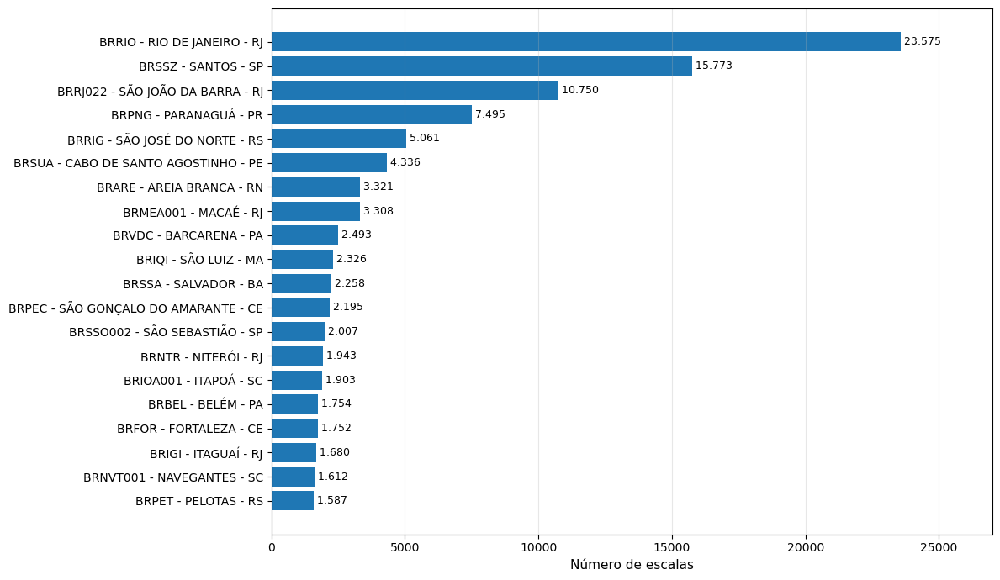

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_top_ports_by_volume.png')

In [70]:
# 5.3. Bar plot of top ports by volume

plot_data = top_ports_volume.sort_values("n_calls", ascending=True)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["n_calls"],
)

for index, row in enumerate(plot_data.itertuples()):

    # 1. Formata o milhar com vírgula e depois troca por ponto
    calls_str = f"{row.n_calls:,.0f}".replace(",", ".")
    
    ax.text(
        row.n_calls,
        index,
        f" {calls_str} ",
        va="center",
        fontsize=9
    )

# ax.set_title(f"Top {TOP_N_PORTS} portos por número de escalas")
ax.set_xlabel("Número de escalas")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

ax.set_xlim(0, 27000)

figure_path = save_figure("eda_05_top_ports_by_volume.png")
plt.show()

figure_path

O ranking por volume identifica os portos com maior representatividade na base.

Esses portos são importantes para a modelagem porque concentram mais observações e, portanto, têm maior influência no comportamento agregado da permanência portuária. Além disso, do ponto de vista de Supply Chain, portos com alto volume tendem a ter maior impacto operacional.

In [71]:
# 5.4. Top ports by median

top_ports_median = (
    port_ranking_base
    .sort_values("median_total_d", ascending=False)
    .head(TOP_N_PORTS)
    .copy()
)

top_ports_median[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p90_minus_median_d",
    ]
]

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p90_minus_median_d
98,BRVDC005,BRVDC005 - BARCARENA - PA,BARCARENA,PA,NORTE,177,9.27,20.57,11.30
50,BRMAO017,BRMAO017 - MANAUS - AM,MANAUS,AM,NORTE,66,5.48,11.16,5.68
39,BRITJ002,BRITJ002 - ITAJAÍ - SC,ITAJAÍ,SC,SUL,61,5.09,11.24,6.15
32,BRITA001,BRITA001 - ITACOATIARA - AM,ITACOATIARA,AM,NORTE,414,5.09,12.83,7.74
12,BRANT,BRANT - ANTONINA - PR,ANTONINA,PR,SUL,256,4.72,9.15,4.43
51,BRMCP,BRMCP - MACAPÁ - AP,MACAPÁ,AP,NORTE,299,4.61,7.16,2.55
84,BRSSA004,BRSSA004 - SALVADOR - BA,SALVADOR,BA,NORDESTE,133,4.51,9.60,5.08
49,BRMAO007,BRMAO007 - MANAUS - AM,MANAUS,AM,NORTE,36,4.31,5.41,1.09
108,BRVIX026,BRVIX026 - ARACRUZ - ES,ARACRUZ,ES,SUDESTE,78,4.12,11.91,7.79
27,BRIGI008,BRIGI008 - ITAGUAÍ - RJ,ITAGUAÍ,RJ,SUDESTE,389,4.11,6.20,2.09


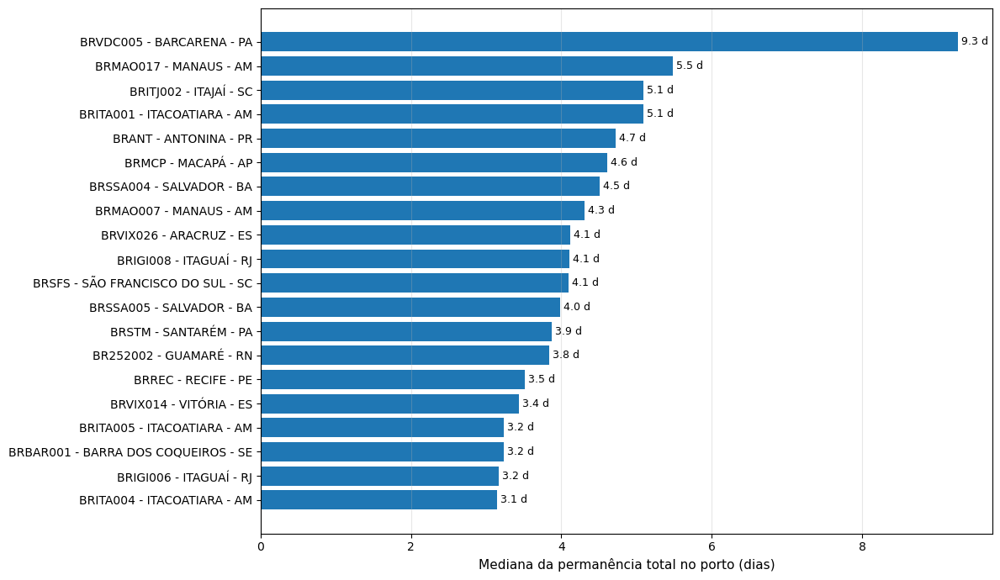

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_top_ports_by_median_total_stay.png')

In [72]:
# 5.5. Graph of top ports by median

plot_data = top_ports_median.sort_values("median_total_d", ascending=True)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["median_total_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.median_total_d,
        index,
        f" {row.median_total_d:,.1f} d",
        va="center",
        fontsize=9,
    )

# ax.set_title(f"Top {TOP_N_PORTS} portos por mediana da permanência total")
ax.set_xlabel("Mediana da permanência total no porto (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_05_top_ports_by_median_total_stay.png")
plt.show()

figure_path

A mediana representa o comportamento típico de cada porto.

Portos com mediana elevada tendem a apresentar permanência estruturalmente mais longa. Isso pode estar associado ao perfil das operações, infraestrutura, especialização do porto, tipo de carga, processos locais ou características da navegação.

No contexto do TCC, esses portos indicam onde o lead time esperado já é naturalmente mais alto.

In [73]:
# 5.6. Top ports with tail risk: p90

top_ports_p90 = (
    port_ranking_base
    .sort_values("p90_total_d", ascending=False)
    .head(TOP_N_PORTS)
    .copy()
)

top_ports_p90[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p95_total_d",
        "p90_minus_median_d",
    ]
]

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d
98,BRVDC005,BRVDC005 - BARCARENA - PA,BARCARENA,PA,NORTE,177,9.27,20.57,23.84,11.30
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SÃO FRANCISCO DO SUL,SC,SUL,1345,4.09,16.91,22.29,12.81
8,BRADR002,BRADR002 - ANGRA DOS REIS - RJ,ANGRA DOS REIS,RJ,SUDESTE,39,1.76,15.84,19.44,14.07
43,BRITJ007,BRITJ007 - ITAJAÍ - SC,ITAJAÍ,SC,SUL,213,0.96,14.24,19.19,13.29
90,BRSTM,BRSTM - SANTARÉM - PA,SANTARÉM,PA,NORTE,654,3.87,13.39,16.34,9.53
33,BRITA004,BRITA004 - ITACOATIARA - AM,ITACOATIARA,AM,NORTE,192,3.14,13.25,15.93,10.10
32,BRITA001,BRITA001 - ITACOATIARA - AM,ITACOATIARA,AM,NORTE,414,5.09,12.83,16.16,7.74
108,BRVIX026,BRVIX026 - ARACRUZ - ES,ARACRUZ,ES,SUDESTE,78,4.12,11.91,14.39,7.79
89,BRSSZ,BRSSZ - SANTOS - SP,SANTOS,SP,SUDESTE,15773,2.17,11.70,17.36,9.53
39,BRITJ002,BRITJ002 - ITAJAÍ - SC,ITAJAÍ,SC,SUL,61,5.09,11.24,12.62,6.15


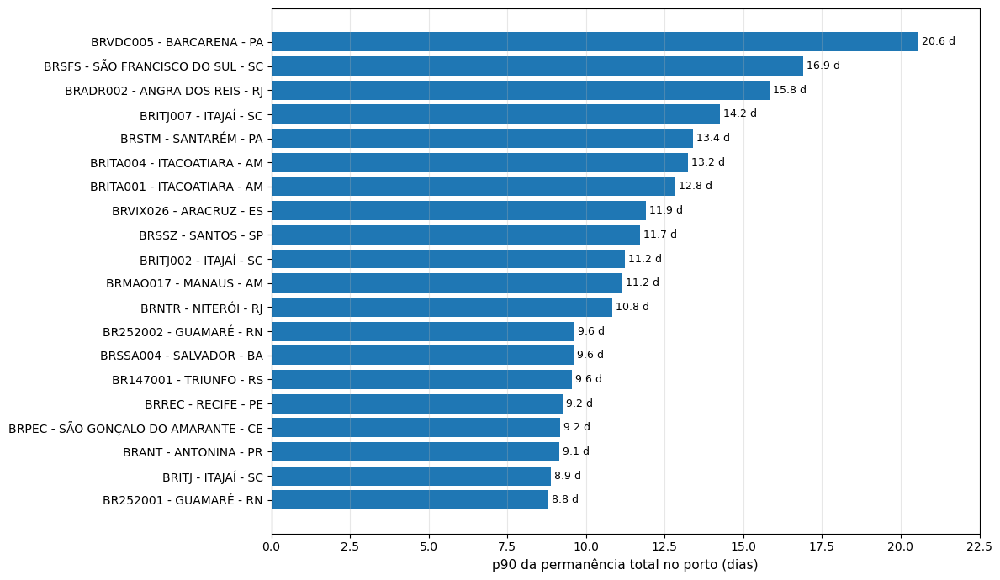

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_top_ports_by_p90_total_stay.png')

In [74]:
# 5.7. Graph of top ports with tail risk: p90

plot_data = top_ports_p90.sort_values("p90_total_d", ascending=True)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["p90_total_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    p90_str = f"{row.p90_total_d:,.1f}".replace(",", ".")
    
    ax.text(
        row.p90_total_d,
        index,
        f" {p90_str} d ",
        va="center",
        fontsize=9,
    )

# ax.set_title(f"Top {TOP_N_PORTS} portos por p90 da permanência total")
ax.set_xlabel("p90 da permanência total no porto (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

ax.set_xlim(0, 22.5)

figure_path = save_figure("eda_05_top_ports_by_p90_total_stay.png")
plt.show()

figure_path

A mediana representa o comportamento típico de cada porto.

Portos com mediana elevada tendem a apresentar permanência estruturalmente mais longa. Isso pode estar associado ao perfil das operações, infraestrutura, especialização do porto, tipo de carga, processos locais ou características da navegação.

No contexto do TCC, esses portos indicam onde o lead time esperado já é naturalmente mais alto.

In [75]:
# 5.8. Top ports with tail risk: p90

top_ports_p90 = (
    port_ranking_base
    .sort_values("p90_total_d", ascending=False)
    .head(TOP_N_PORTS)
    .copy()
)

top_ports_p90[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p95_total_d",
        "p90_minus_median_d",
    ]
]

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d
98,BRVDC005,BRVDC005 - BARCARENA - PA,BARCARENA,PA,NORTE,177,9.27,20.57,23.84,11.30
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SÃO FRANCISCO DO SUL,SC,SUL,1345,4.09,16.91,22.29,12.81
8,BRADR002,BRADR002 - ANGRA DOS REIS - RJ,ANGRA DOS REIS,RJ,SUDESTE,39,1.76,15.84,19.44,14.07
43,BRITJ007,BRITJ007 - ITAJAÍ - SC,ITAJAÍ,SC,SUL,213,0.96,14.24,19.19,13.29
90,BRSTM,BRSTM - SANTARÉM - PA,SANTARÉM,PA,NORTE,654,3.87,13.39,16.34,9.53
33,BRITA004,BRITA004 - ITACOATIARA - AM,ITACOATIARA,AM,NORTE,192,3.14,13.25,15.93,10.10
32,BRITA001,BRITA001 - ITACOATIARA - AM,ITACOATIARA,AM,NORTE,414,5.09,12.83,16.16,7.74
108,BRVIX026,BRVIX026 - ARACRUZ - ES,ARACRUZ,ES,SUDESTE,78,4.12,11.91,14.39,7.79
89,BRSSZ,BRSSZ - SANTOS - SP,SANTOS,SP,SUDESTE,15773,2.17,11.70,17.36,9.53
39,BRITJ002,BRITJ002 - ITAJAÍ - SC,ITAJAÍ,SC,SUL,61,5.09,11.24,12.62,6.15


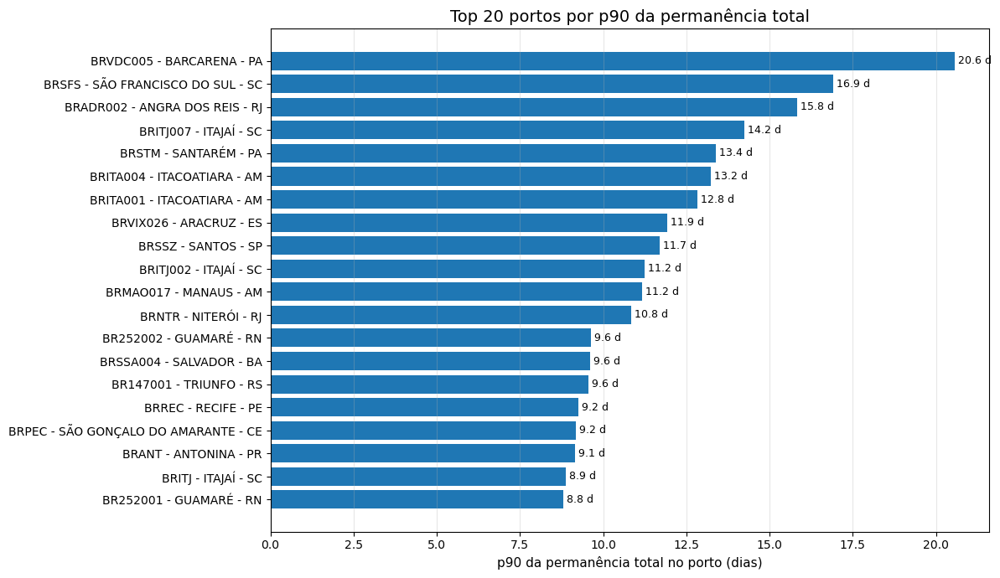

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_top_ports_by_p90_total_stay.png')

In [76]:
# 5.9. Graph of top ports with tail risk: p90

plot_data = top_ports_p90.sort_values("p90_total_d", ascending=True)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["p90_total_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.p90_total_d,
        index,
        f" {row.p90_total_d:,.1f} d",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_PORTS} portos por p90 da permanência total")
ax.set_xlabel("p90 da permanência total no porto (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_05_top_ports_by_p90_total_stay.png")
plt.show()

figure_path

O p90 mostra um cenário de maior risco: 90% das escalas daquele porto ficam abaixo desse valor, enquanto 10% ficam acima.

Essa métrica é mais útil para planejamento do que a média quando o objetivo é entender risco de atraso. Em cadeias de suprimento, os casos da cauda superior são os que mais pressionam buffers, janelas logísticas e estoques de segurança.

In [77]:
# 5.10. Top ports with tail risk: p90 - median

top_ports_tail_gap = (
    port_ranking_base
    .sort_values("p90_minus_median_d", ascending=False)
    .head(TOP_N_PORTS)
    .copy()
)

top_ports_tail_gap[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p90_minus_median_d",
        "cv_total",
    ]
]

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p90_minus_median_d,cv_total
8,BRADR002,BRADR002 - ANGRA DOS REIS - RJ,ANGRA DOS REIS,RJ,SUDESTE,39,1.76,15.84,14.07,1.43
43,BRITJ007,BRITJ007 - ITAJAÍ - SC,ITAJAÍ,SC,SUL,213,0.96,14.24,13.29,1.71
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SÃO FRANCISCO DO SUL,SC,SUL,1345,4.09,16.91,12.81,0.97
98,BRVDC005,BRVDC005 - BARCARENA - PA,BARCARENA,PA,NORTE,177,9.27,20.57,11.30,0.61
33,BRITA004,BRITA004 - ITACOATIARA - AM,ITACOATIARA,AM,NORTE,192,3.14,13.25,10.10,0.93
89,BRSSZ,BRSSZ - SANTOS - SP,SANTOS,SP,SUDESTE,15773,2.17,11.70,9.53,1.29
90,BRSTM,BRSTM - SANTARÉM - PA,SANTARÉM,PA,NORTE,654,3.87,13.39,9.53,0.98
57,BRNTR,BRNTR - NITERÓI - RJ,NITERÓI,RJ,SUDESTE,1943,1.76,10.85,9.08,1.36
61,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,SÃO GONÇALO DO AMARANTE,CE,NORDESTE,2195,1.08,9.17,8.09,1.55
38,BRITJ,BRITJ - ITAJAÍ - SC,ITAJAÍ,SC,SUL,695,1.05,8.88,7.83,1.76


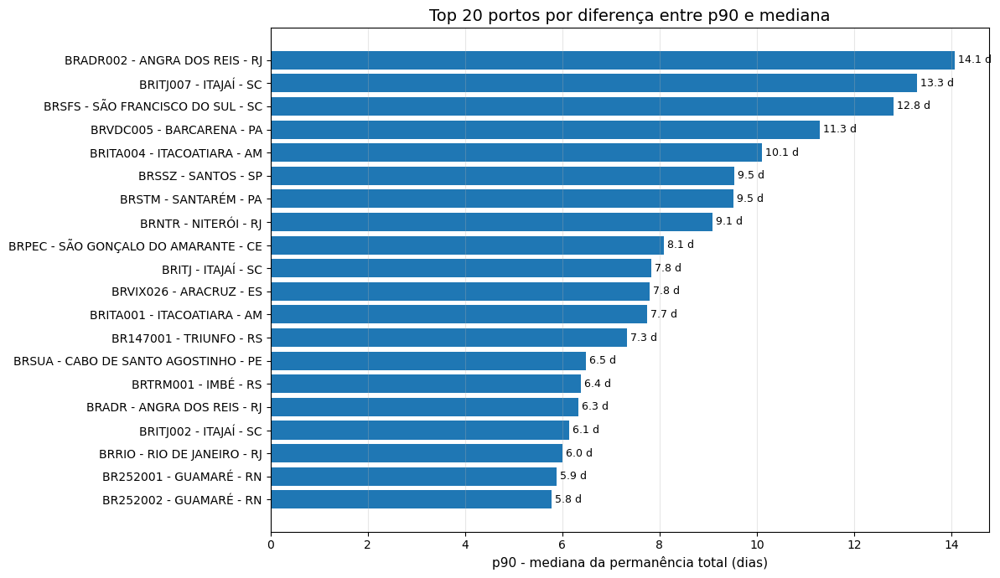

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_top_ports_by_tail_gap.png')

In [78]:
# 5.11. Graph of top ports with tail risk: p90 - median

plot_data = top_ports_tail_gap.sort_values("p90_minus_median_d", ascending=True)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["p90_minus_median_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.p90_minus_median_d,
        index,
        f" {row.p90_minus_median_d:,.1f} d",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_PORTS} portos por diferença entre p90 e mediana")
ax.set_xlabel("p90 - mediana da permanência total (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_05_top_ports_by_tail_gap.png")
plt.show()

figure_path

A diferença entre p90 e mediana mede a abertura da cauda superior da distribuição.

Essa métrica ajuda a identificar portos que não são necessariamente lentos na maior parte do tempo, mas que apresentam risco relevante de permanências muito acima do comportamento típico.

Esse tipo de porto é particularmente importante para planejamento: ele pode parecer controlado quando analisado pela mediana, mas gerar atrasos significativos em uma parcela menor das escalas.

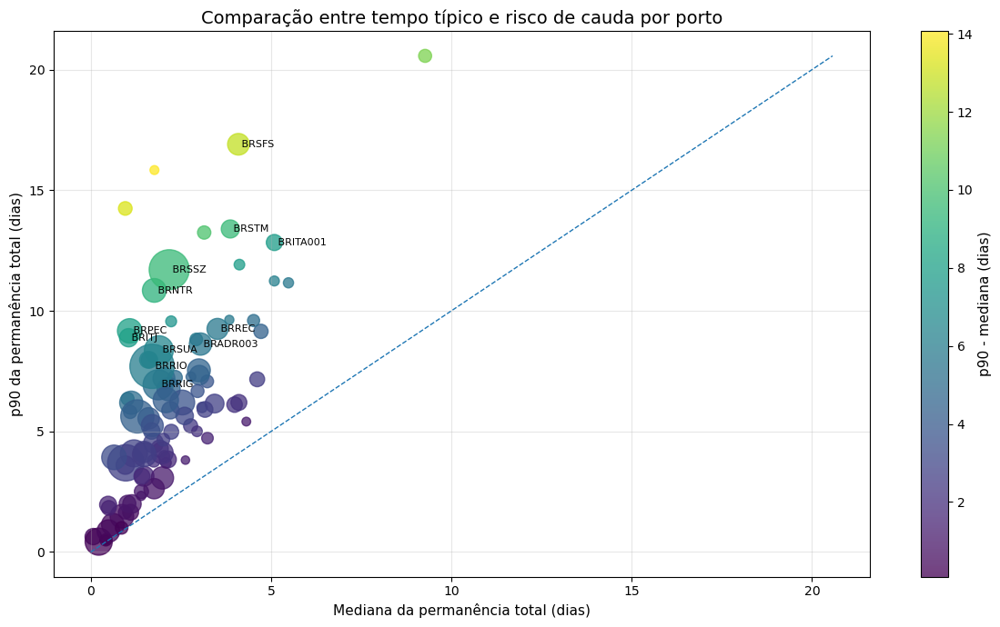

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_ports_median_vs_p90_scatter.png')

In [79]:
# 5.12. Median scatter vs p90

plot_data = port_ranking_base.copy()

fig, ax = plt.subplots(figsize=(12, 7))

scatter = ax.scatter(
    plot_data["median_total_d"],
    plot_data["p90_total_d"],
    s=np.sqrt(plot_data["n_calls"]) * 8,
    c=plot_data["p90_minus_median_d"],
    alpha=0.75,
)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label("p90 - mediana (dias)")

max_axis_value = max(
    plot_data["median_total_d"].max(),
    plot_data["p90_total_d"].max(),
)

ax.plot(
    [0, max_axis_value],
    [0, max_axis_value],
    linestyle="--",
    linewidth=1,
)

ax.set_title("Comparação entre tempo típico e risco de cauda por porto")
ax.set_xlabel("Mediana da permanência total (dias)")
ax.set_ylabel("p90 da permanência total (dias)")
ax.grid(alpha=0.3)

priority_ports = (
    plot_data
    .assign(
        priority_score=lambda x: (
            x["n_calls"].rank(pct=True)
            + x["p90_total_d"].rank(pct=True)
            + x["p90_minus_median_d"].rank(pct=True)
        )
    )
    .sort_values("priority_score", ascending=False)
    .head(12)
)

for _, row in priority_ports.iterrows():
    ax.text(
        row["median_total_d"],
        row["p90_total_d"],
        f" {row['port']}",
        fontsize=8,
        va="center",
    )

figure_path = save_figure("eda_05_ports_median_vs_p90_scatter.png")
plt.show()

figure_path

O gráfico compara o comportamento típico com o cenário de risco.

A linha diagonal representa a situação em que p90 e mediana seriam iguais. Quanto mais distante um porto está acima dessa linha, maior é a diferença entre o tempo típico e o tempo observado nos casos mais demorados.

Portos no canto superior direito combinam mediana elevada e p90 elevado. Portos muito acima da diagonal possuem forte cauda superior, mesmo que sua mediana não seja a maior.

In [80]:
# 5.13. Final ranking of critical ports for slope analysis

critical_ports_for_slope = (
    port_ranking_base
    .assign(
        priority_score=lambda x: (
            x["n_calls"].rank(pct=True)
            + x["p90_total_d"].rank(pct=True)
            + x["p90_minus_median_d"].rank(pct=True)
        )
    )
    .sort_values("priority_score", ascending=False)
    .head(15)
    .copy()
)

critical_ports_for_slope[
    [
        "port",
        "port_display",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p90_minus_median_d",
        "priority_score",
    ]
]

,port,port_display,state,region,n_calls,median_total_d,p90_total_d,p90_minus_median_d,priority_score
89,BRSSZ,BRSSZ - SANTOS - SP,SP,SUDESTE,15773,2.17,11.70,9.53,2.85
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SC,SUL,1345,4.09,16.91,12.81,2.69
57,BRNTR,BRNTR - NITERÓI - RJ,RJ,SUDESTE,1943,1.76,10.85,9.08,2.66
61,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,CE,NORDESTE,2195,1.08,9.17,8.09,2.62
92,BRSUA,BRSUA - CABO DE SANTO AGOSTINHO - PE,PE,NORDESTE,4336,1.89,8.37,6.48,2.57
72,BRRIO,BRRIO - RIO DE JANEIRO - RJ,RJ,SUDESTE,23575,1.70,7.70,6.00,2.55
90,BRSTM,BRSTM - SANTARÉM - PA,PA,NORTE,654,3.87,13.39,9.53,2.48
71,BRRIG,BRRIG - SÃO JOSÉ DO NORTE - RS,RS,SUL,5061,1.87,6.93,5.06,2.31
9,BRADR003,BRADR003 - ANGRA DOS REIS - RJ,RJ,SUDESTE,1511,3.04,8.62,5.58,2.31
70,BRREC,BRREC - RECIFE - PE,PE,NORDESTE,1197,3.51,9.25,5.74,2.31


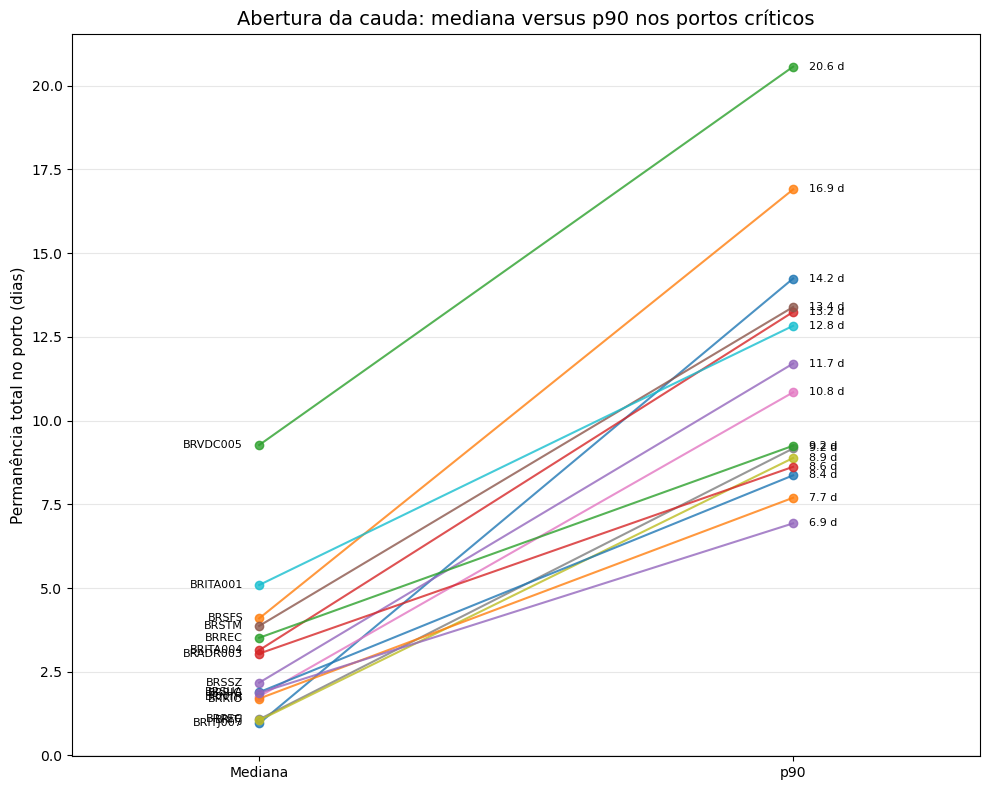

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_ports_slope_median_vs_p90.png')

In [81]:
# 5.14. Slope graph comparing median and p90 for critical ports

plot_data = critical_ports_for_slope.sort_values(
    "p90_minus_median_d",
    ascending=False,
).copy()

fig, ax = plt.subplots(figsize=(10, 8))

x_positions = [0, 1]
x_labels = ["Mediana", "p90"]

for _, row in plot_data.iterrows():
    y_values = [row["median_total_d"], row["p90_total_d"]]

    ax.plot(
        x_positions,
        y_values,
        marker="o",
        linewidth=1.5,
        alpha=0.8,
    )

    ax.text(
        -0.03,
        y_values[0],
        row["port"],
        ha="right",
        va="center",
        fontsize=8,
    )

    ax.text(
        1.03,
        y_values[1],
        f"{row['p90_total_d']:.1f} d",
        ha="left",
        va="center",
        fontsize=8,
    )

ax.set_xticks(x_positions)
ax.set_xticklabels(x_labels)
ax.set_xlim(-0.35, 1.35)

ax.set_title("Abertura da cauda: mediana versus p90 nos portos críticos")
ax.set_ylabel("Permanência total no porto (dias)")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_05_ports_slope_median_vs_p90.png")
plt.show()

figure_path

O slope chart destaca a distância entre o comportamento típico e o cenário de risco em portos selecionados.

Quanto maior a inclinação da linha, maior a diferença entre mediana e p90. Essa visualização é útil porque evidencia o quanto o planejamento baseado apenas na mediana poderia subestimar o risco de permanência elevada.

### Score de criticidade operacional

Para sintetizar as dimensões analisadas, criamos um score simples de criticidade por porto.

O score combina três rankings percentuais:

1. volume de escalas;
2. p90 da permanência total;
3. diferença entre p90 e mediana.

Esse score não deve ser interpretado como um modelo estatístico definitivo, mas como uma ferramenta exploratória para priorização. Ele ajuda a identificar portos que combinam relevância operacional e risco de cauda.

In [82]:
# 5.15 Calculate criticality score by port

port_criticality = port_ranking_base.copy()

port_criticality["volume_rank_pct"] = port_criticality["n_calls"].rank(pct=True)
port_criticality["p90_rank_pct"] = port_criticality["p90_total_d"].rank(pct=True)
port_criticality["tail_gap_rank_pct"] = port_criticality["p90_minus_median_d"].rank(pct=True)

port_criticality["criticality_score"] = (
    port_criticality["volume_rank_pct"]
    + port_criticality["p90_rank_pct"]
    + port_criticality["tail_gap_rank_pct"]
)

port_criticality = port_criticality.sort_values(
    "criticality_score",
    ascending=False,
)

port_criticality[
    [
        "port",
        "port_display",
        "city",
        "state",
        "region",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p95_total_d",
        "p90_minus_median_d",
        "cv_total",
        "criticality_score",
    ]
].head(20)

,port,port_display,city,state,region,n_calls,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d,cv_total,criticality_score
89,BRSSZ,BRSSZ - SANTOS - SP,SANTOS,SP,SUDESTE,15773,2.17,11.70,17.36,9.53,1.29,2.85
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SÃO FRANCISCO DO SUL,SC,SUL,1345,4.09,16.91,22.29,12.81,0.97,2.69
57,BRNTR,BRNTR - NITERÓI - RJ,NITERÓI,RJ,SUDESTE,1943,1.76,10.85,16.48,9.08,1.36,2.66
61,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,SÃO GONÇALO DO AMARANTE,CE,NORDESTE,2195,1.08,9.17,13.17,8.09,1.55,2.62
92,BRSUA,BRSUA - CABO DE SANTO AGOSTINHO - PE,CABO DE SANTO AGOSTINHO,PE,NORDESTE,4336,1.89,8.37,11.83,6.48,1.21,2.57
72,BRRIO,BRRIO - RIO DE JANEIRO - RJ,RIO DE JANEIRO,RJ,SUDESTE,23575,1.70,7.70,11.82,6.00,1.35,2.55
90,BRSTM,BRSTM - SANTARÉM - PA,SANTARÉM,PA,NORTE,654,3.87,13.39,16.34,9.53,0.98,2.48
71,BRRIG,BRRIG - SÃO JOSÉ DO NORTE - RS,SÃO JOSÉ DO NORTE,RS,SUL,5061,1.87,6.93,9.85,5.06,1.21,2.31
9,BRADR003,BRADR003 - ANGRA DOS REIS - RJ,ANGRA DOS REIS,RJ,SUDESTE,1511,3.04,8.62,11.25,5.58,0.94,2.31
70,BRREC,BRREC - RECIFE - PE,RECIFE,PE,NORDESTE,1197,3.51,9.25,13.30,5.74,0.96,2.31


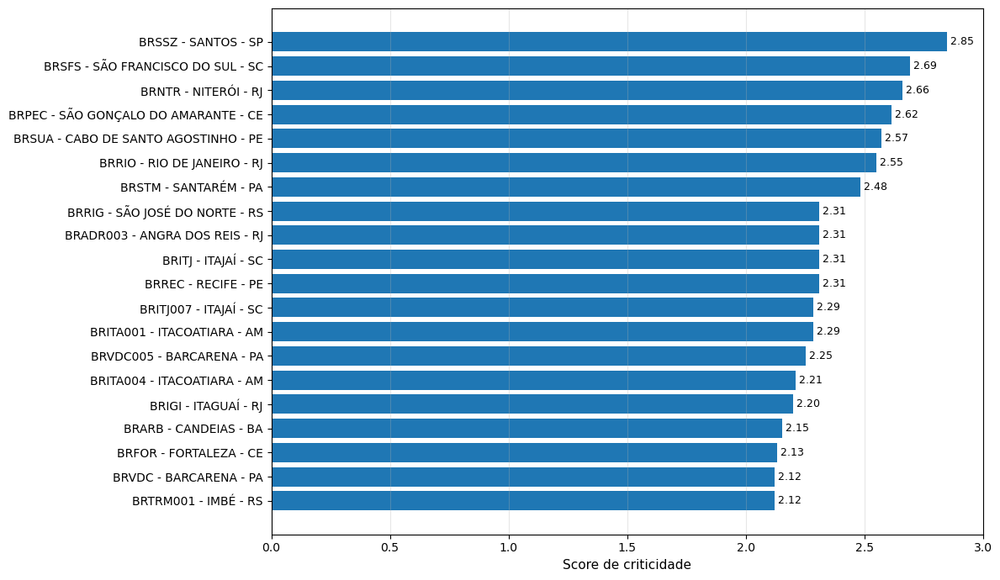

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_05_port_criticality_score.png')

In [83]:
# 5.16 Criticality score graph

plot_data = port_criticality.head(TOP_N_PORTS).sort_values(
    "criticality_score",
    ascending=True,
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["criticality_score"],
)

for index, row in enumerate(plot_data.itertuples()):
    criticality_score_str = f"{row.criticality_score:.2f}".replace(",", ".")
    
    ax.text(
        row.criticality_score,
        index,
        f" {criticality_score_str} ",
        va="center",
        fontsize=9,
    )

# ax.set_title(f"Top {TOP_N_PORTS} portos por score exploratório de criticidade")
ax.set_xlabel("Score de criticidade")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

ax.set_xlim(0, 3)

figure_path = save_figure("eda_05_port_criticality_score.png")
plt.show()

figure_path

In [84]:
# 5.17 Saving section tables

top_ports_volume_path = TABLES_DIR / "eda_05_top_ports_by_volume.csv"
top_ports_median_path = TABLES_DIR / "eda_05_top_ports_by_median.csv"
top_ports_p90_path = TABLES_DIR / "eda_05_top_ports_by_p90.csv"
top_ports_tail_gap_path = TABLES_DIR / "eda_05_top_ports_by_tail_gap.csv"
port_criticality_path = TABLES_DIR / "eda_05_port_criticality_score.csv"

top_ports_volume.to_csv(top_ports_volume_path, index=False)
top_ports_median.to_csv(top_ports_median_path, index=False)
top_ports_p90.to_csv(top_ports_p90_path, index=False)
top_ports_tail_gap.to_csv(top_ports_tail_gap_path, index=False)
port_criticality.to_csv(port_criticality_path, index=False)

[
    top_ports_volume_path,
    top_ports_median_path,
    top_ports_p90_path,
    top_ports_tail_gap_path,
    port_criticality_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_05_top_ports_by_volume.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_05_top_ports_by_median.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_05_top_ports_by_p90.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_05_top_ports_by_tail_gap.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_05_port_criticality_score.csv')]

In [85]:
# 5.18 Generate section summary text 

largest_port = top_ports_volume.iloc[0]
highest_median_port = top_ports_median.iloc[0]
highest_p90_port = top_ports_p90.iloc[0]
highest_tail_gap_port = top_ports_tail_gap.iloc[0]
highest_criticality_port = port_criticality.iloc[0]

section_5_narrative = f"""
A análise por porto mostra diferentes dimensões de criticidade operacional.

O porto com maior número de escalas na base filtrada é {largest_port['port_display']}, com {largest_port['n_calls']:,.0f} escalas.
O porto com maior mediana de permanência total é {highest_median_port['port_display']}, com mediana de {highest_median_port['median_total_d']:,.2f} dias.
O maior p90 foi observado em {highest_p90_port['port_display']}, com p90 de {highest_p90_port['p90_total_d']:,.2f} dias.
Já a maior diferença entre p90 e mediana aparece em {highest_tail_gap_port['port_display']}, com abertura de cauda de {highest_tail_gap_port['p90_minus_median_d']:,.2f} dias.

Combinando volume, p90 e diferença entre p90 e mediana, o porto com maior score exploratório de criticidade é {highest_criticality_port['port_display']}.
"""

print(section_5_narrative)


A análise por porto mostra diferentes dimensões de criticidade operacional.

O porto com maior número de escalas na base filtrada é BRRIO - RIO DE JANEIRO - RJ, com 23,575 escalas.
O porto com maior mediana de permanência total é BRVDC005 - BARCARENA - PA, com mediana de 9.27 dias.
O maior p90 foi observado em BRVDC005 - BARCARENA - PA, com p90 de 20.57 dias.
Já a maior diferença entre p90 e mediana aparece em BRADR002 - ANGRA DOS REIS - RJ, com abertura de cauda de 14.07 dias.

Combinando volume, p90 e diferença entre p90 e mediana, o porto com maior score exploratório de criticidade é BRSSZ - SANTOS - SP.



### Principais mensagens da seção

A análise por ranking mostra que criticidade portuária não é um conceito único.

Um porto pode ser crítico por volume, por tempo típico elevado, por risco de cauda ou por alta imprevisibilidade. Por isso, rankings baseados apenas na média ou no maior tempo observado podem levar a conclusões incompletas.

Para o objetivo do TCC, os resultados desta seção reforçam que o porto é uma variável explicativa fundamental para a modelagem de lead time. A heterogeneidade entre portos sugere que modelos preditivos devem capturar diferenças estruturais e operacionais entre localidades.

Além disso, a diferença entre mediana e p90 mostra que o planejamento baseado apenas no comportamento típico pode subestimar o risco de permanências elevadas. Essa evidência conecta diretamente o EDA ao problema de estoques de segurança e capital de giro: quanto maior a incerteza do lead time, maior tende a ser a necessidade de buffers.

A próxima seção aprofunda a decomposição do tempo total, investigando se a variabilidade vem principalmente da espera para atracação, da operação atracada ou do pós-operação.

---

## 6. Decomposição do atraso: espera, operação ou pós-operação?

Até aqui, a permanência total no porto foi analisada como o lead time operacional da escala portuária. Porém, esse tempo total é formado por três componentes:

1. **Espera para atracação:** da chegada ao porto até a atracação.
2. **Operação atracada:** da atracação até a desatracação.
3. **Pós-operação:** da desatracação até a saída efetiva do porto.

Nesta seção, o objetivo é entender qual desses componentes mais contribui para o tempo total e, principalmente, qual deles concentra maior variabilidade.

Essa distinção é importante porque diferentes componentes podem ter causas operacionais diferentes. Uma permanência longa pode ser consequência de fila para atracação, de uma operação de carga/descarga mais demorada ou de atrasos após a desatracação.

Para o TCC, essa decomposição ajuda a interpretar o lead time não como uma métrica única, mas como o resultado de diferentes etapas do processo portuário.

In [86]:
# 6.1 Define time components sequence

COMPONENT_COLUMNS_H = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
]

COMPONENT_LABELS = {
    "t_wait_for_berthing_h": "Espera para atracação",
    "t_operation_h": "Operação atracada",
    "t_post_operation_h": "Pós-operação",
}

COMPONENT_ORDER_LABELS = [
    "Espera para atracação",
    "Operação atracada",
    "Pós-operação",
]

TOTAL_TARGET_H = "t_total_port_stay_h"
TOTAL_TARGET_D = "t_total_port_stay_d"

for col in COMPONENT_COLUMNS_H + [TOTAL_TARGET_H]:
    if col not in df.columns:
        raise ValueError(f"Required column not found: {col}")

if TOTAL_TARGET_D not in df.columns:
    df[TOTAL_TARGET_D] = df[TOTAL_TARGET_H] / 24

for col in COMPONENT_COLUMNS_H:
    col_d = col.replace("_h", "_d")
    if col_d not in df.columns:
        df[col_d] = df[col] / 24

print("Component columns are available and ordered.")

Component columns are available and ordered.


In [87]:
# 6.2. Components long base

component_long = (
    df[
        [
            "port_call_id",
            "port",
            "port_display",
            "state",
            "region",
            TOTAL_TARGET_H,
            TOTAL_TARGET_D,
            *COMPONENT_COLUMNS_H,
        ]
    ]
    .melt(
        id_vars=[
            "port_call_id",
            "port",
            "port_display",
            "state",
            "region",
            TOTAL_TARGET_H,
            TOTAL_TARGET_D,
        ],
        value_vars=COMPONENT_COLUMNS_H,
        var_name="component",
        value_name="duration_h",
    )
)

component_long["duration_d"] = component_long["duration_h"] / 24
component_long["component_label"] = component_long["component"].map(COMPONENT_LABELS)

component_long["component_label"] = pd.Categorical(
    component_long["component_label"],
    categories=COMPONENT_ORDER_LABELS,
    ordered=True,
)

component_long = component_long.sort_values("component_label").reset_index(drop=True)

component_long.head()

,port_call_id,port,port_display,state,region,t_total_port_stay_h,t_total_port_stay_d,component,duration_h,duration_d,component_label
0,22023,BR052001,BR052001 - JURITI - PA,PA,NORTE,29.28,1.22,t_wait_for_berthing_h,0.00,0.00,Espera para atracação
1,368032024,BRRJ022,BRRJ022 - SÃO JOÃO DA BARRA - RJ,RJ,SUDESTE,70.00,2.92,t_wait_for_berthing_h,48.17,2.01,Espera para atracação
2,374392024,BRRJ022,BRRJ022 - SÃO JOÃO DA BARRA - RJ,RJ,SUDESTE,229.58,9.57,t_wait_for_berthing_h,53.62,2.23,Espera para atracação
3,374142024,BRRJ022,BRRJ022 - SÃO JOÃO DA BARRA - RJ,RJ,SUDESTE,160.45,6.69,t_wait_for_berthing_h,0.00,0.00,Espera para atracação
4,348432024,BRRJ022,BRRJ022 - SÃO JOÃO DA BARRA - RJ,RJ,SUDESTE,13.83,0.58,t_wait_for_berthing_h,0.00,0.00,Espera para atracação


### 6.1 Contribuição nacional dos componentes

Primeiro, analisamos a decomposição em nível nacional. O objetivo é entender quanto cada etapa contribui para a permanência total no porto quando observamos a base completa.

Serão comparadas três métricas:

- **média**, sensível a casos extremos;
- **mediana**, representando o comportamento típico;
- **p90**, representando o cenário de risco.

Essa comparação é importante porque um componente pode ter mediana baixa, mas ainda assim apresentar cauda longa em alguns portos ou operações.

In [88]:
# 6.3. Component national summary

component_national_summary = (
    component_long
    .groupby(["component", "component_label"], observed=True)
    .agg(
        count=("duration_h", "count"),
        mean_h=("duration_h", "mean"),
        median_h=("duration_h", "median"),
        std_h=("duration_h", "std"),
        p75_h=("duration_h", lambda x: x.quantile(0.75)),
        p90_h=("duration_h", lambda x: x.quantile(0.90)),
        p95_h=("duration_h", lambda x: x.quantile(0.95)),
        zero_pct=("duration_h", lambda x: (x == 0).mean() * 100),
    )
    .reset_index()
)

for col in ["mean_h", "median_h", "std_h", "p75_h", "p90_h", "p95_h"]:
    component_national_summary[col.replace("_h", "_d")] = (
        component_national_summary[col] / 24
    )

component_national_summary = component_national_summary.sort_values(
    "component_label"
).reset_index(drop=True)

component_national_summary

,component,component_label,count,mean_h,median_h,std_h,p75_h,p90_h,p95_h,zero_pct,mean_d,median_d,std_d,p75_d,p90_d,p95_d
0,t_wait_for_berthing_h,Espera para atracação,129625,8.49,0.00,43.86,0.00,6.67,38.36,87.00,0.35,0.00,1.83,0.00,0.28,1.60
1,t_operation_h,Operação atracada,129625,61.91,34.83,82.68,71.68,139.33,210.91,0.00,2.58,1.45,3.44,2.99,5.81,8.79
2,t_post_operation_h,Pós-operação,129625,0.70,0.00,11.88,0.00,0.00,0.00,98.45,0.03,0.00,0.49,0.00,0.00,0.00


In [89]:
component_national_summary_path = TABLES_DIR / "eda_06_component_national_summary.csv"
component_national_summary.to_csv(component_national_summary_path, index=False)

component_national_summary_path

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_06_component_national_summary.csv')

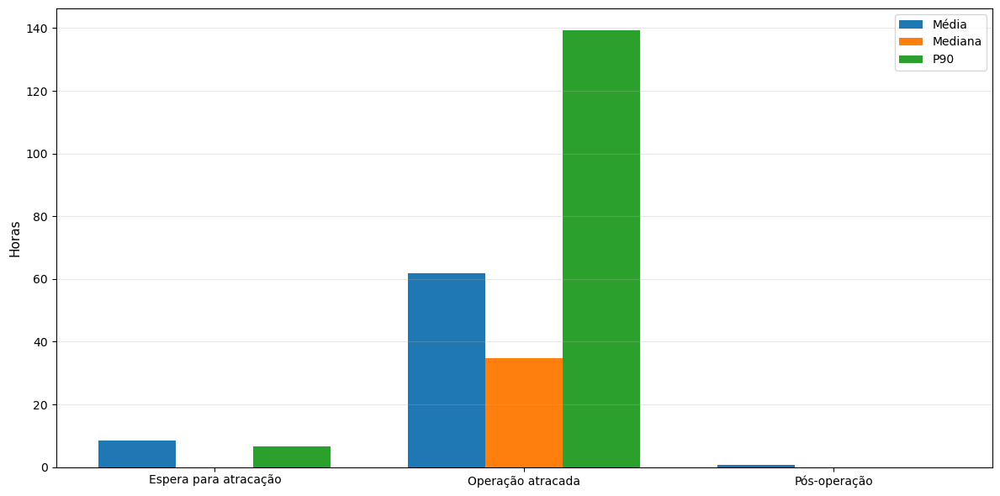

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_component_mean_median_p90.png')

In [90]:
# 6.4. Mean, Median and p90 by component graph

plot_data = component_national_summary.copy()

x = np.arange(len(plot_data))
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))

ax.bar(
    x - width,
    plot_data["mean_h"],
    width,
    label="Média",
)

ax.bar(
    x,
    plot_data["median_h"],
    width,
    label="Mediana",
)

ax.bar(
    x + width,
    plot_data["p90_h"],
    width,
    label="P90",
)

ax.set_xticks(x)
ax.set_xticklabels(plot_data["component_label"], rotation=0)

# ax.set_title("Comparação nacional dos componentes da permanência portuária")
ax.set_xlabel("")
ax.set_ylabel("Horas")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_06_component_mean_median_p90.png")
plt.show()

figure_path

A comparação entre média, mediana e p90 por componente mostra onde está concentrado o comportamento típico e onde aparece a cauda de risco.

Se a mediana de um componente for zero, isso indica que pelo menos metade dos registros possui aquele intervalo igual a zero. Porém, se o p90 for relevante, isso significa que o componente ainda pode representar risco operacional em uma parcela dos casos.

Essa distinção é importante principalmente para espera de atracação e pós-operação, que podem ter muitos registros iguais a zero, mas ainda assim contribuir para atrasos em situações específicas.

### 6.2 Participação percentual de cada componente no tempo total

Além de comparar as durações absolutas, também é útil medir quanto cada componente representa dentro da permanência total de cada escala.

Essa visão responde à pergunta:

> Em média, qual parcela do lead time portuário vem da espera, da operação e do pós-operação?

Essa análise será feita apenas para registros com permanência total positiva.

In [91]:
# 6.5. Component share calculation

df_component_share = df.loc[df[TOTAL_TARGET_H] > 0].copy()

for col in COMPONENT_COLUMNS_H:
    share_col = col.replace("_h", "_share_pct")
    df_component_share[share_col] = (
        df_component_share[col] / df_component_share[TOTAL_TARGET_H] * 100
    )

share_columns = [
    col.replace("_h", "_share_pct")
    for col in COMPONENT_COLUMNS_H
]

component_share_summary = pd.DataFrame(
    [
        {
            "component": col,
            "component_label": COMPONENT_LABELS[col],
            "mean_share_pct": df_component_share[col.replace("_h", "_share_pct")].mean(),
            "median_share_pct": df_component_share[col.replace("_h", "_share_pct")].median(),
            "p90_share_pct": df_component_share[col.replace("_h", "_share_pct")].quantile(0.90),
        }
        for col in COMPONENT_COLUMNS_H
    ]
)

component_share_summary["component_label"] = pd.Categorical(
    component_share_summary["component_label"],
    categories=COMPONENT_ORDER_LABELS,
    ordered=True,
)

component_share_summary = component_share_summary.sort_values(
    "component_label"
).reset_index(drop=True)

component_share_summary

,component,component_label,mean_share_pct,median_share_pct,p90_share_pct
0,t_wait_for_berthing_h,Espera para atracação,5.84,0.00,18.27
1,t_operation_h,Operação atracada,93.59,100.00,100.00
2,t_post_operation_h,Pós-operação,0.57,0.00,0.00


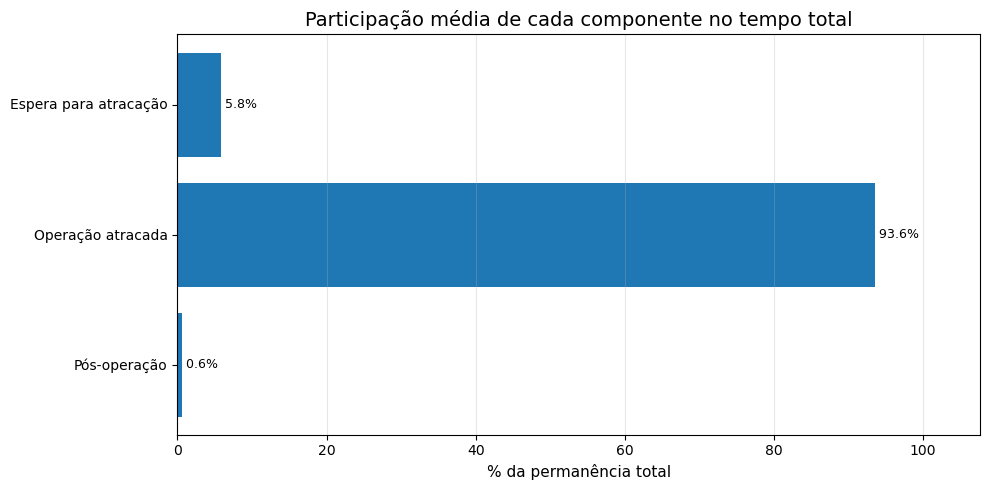

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_component_average_share.png')

In [92]:
# 6.6. Component share graph

plot_data = component_share_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["component_label"],
    plot_data["mean_share_pct"],
)

for index, row in plot_data.iterrows():
    ax.text(
        row["mean_share_pct"],
        index,
        f" {row['mean_share_pct']:.1f}%",
        va="center",
        fontsize=9,
    )

ax.invert_yaxis()
ax.set_title("Participação média de cada componente no tempo total")
ax.set_xlabel("% da permanência total")
ax.set_ylabel("")
ax.set_xlim(0, max(100, plot_data["mean_share_pct"].max() * 1.15))
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_06_component_average_share.png")
plt.show()

figure_path

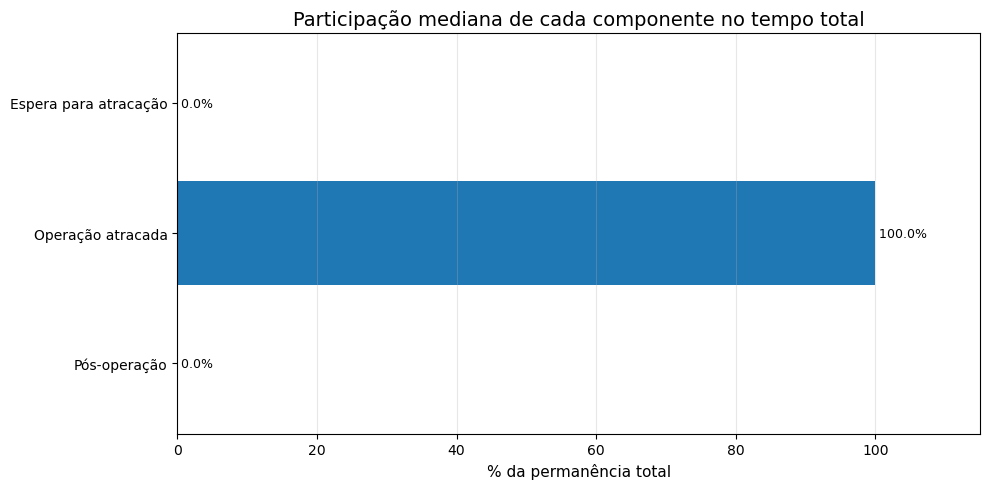

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_component_median_share.png')

In [93]:
plot_data = component_share_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["component_label"],
    plot_data["median_share_pct"],
)

for index, row in plot_data.iterrows():
    ax.text(
        row["median_share_pct"],
        index,
        f" {row['median_share_pct']:.1f}%",
        va="center",
        fontsize=9,
    )

ax.invert_yaxis()
ax.set_title("Participação mediana de cada componente no tempo total")
ax.set_xlabel("% da permanência total")
ax.set_ylabel("")
ax.set_xlim(0, max(100, plot_data["median_share_pct"].max() * 1.15))
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_06_component_median_share.png")
plt.show()

figure_path

A participação percentual ajuda a identificar qual etapa domina o lead time total.

Se a operação atracada representar a maior parte da permanência, isso indica que o tempo total é fortemente influenciado pelo período em que a embarcação está efetivamente em operação.

Por outro lado, se a espera para atracação tiver participação elevada em certos portos ou regiões, isso pode indicar congestionamento, restrições de berço ou janelas operacionais. Já uma participação elevada do pós-operação pode indicar atrasos após a conclusão da operação, como liberação, documentação, janelas de saída ou outras restrições.

### 6.3 Decomposição por região

Agora avaliamos se a composição do tempo total muda entre regiões brasileiras.

Essa visão ajuda a responder se a variabilidade espacial observada nos mapas está associada a diferentes perfis de etapa: algumas regiões podem ter maior peso da operação, enquanto outras podem apresentar maior espera ou pós-operação.

In [94]:
region_component_summary = (
    component_long
    .dropna(subset=["region"])
    .groupby(["region", "component", "component_label"], observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_h=("duration_h", "mean"),
        median_h=("duration_h", "median"),
        p90_h=("duration_h", lambda x: x.quantile(0.90)),
        zero_pct=("duration_h", lambda x: (x == 0).mean() * 100),
    )
    .reset_index()
)

for col in ["mean_h", "median_h", "p90_h"]:
    region_component_summary[col.replace("_h", "_d")] = (
        region_component_summary[col] / 24
    )

region_component_summary = region_component_summary.sort_values(
    ["region", "component_label"]
).reset_index(drop=True)

region_component_summary.head(15)

,region,component,component_label,n_calls,mean_h,median_h,p90_h,zero_pct,mean_d,median_d,p90_d
0,NORDESTE,t_wait_for_berthing_h,Espera para atracação,25236,7.77,0.00,9.61,88.58,0.32,0.00,0.40
1,NORDESTE,t_operation_h,Operação atracada,25236,56.46,34.83,126.42,0.00,2.35,1.45,5.27
2,NORDESTE,t_post_operation_h,Pós-operação,25236,0.24,0.00,0.00,99.75,0.01,0.00,0.00
3,NORTE,t_wait_for_berthing_h,Espera para atracação,8782,7.16,0.00,10.58,87.78,0.30,0.00,0.44
4,NORTE,t_operation_h,Operação atracada,8782,75.32,47.50,172.08,0.00,3.14,1.98,7.17
5,NORTE,t_post_operation_h,Pós-operação,8782,0.21,0.00,0.00,99.42,0.01,0.00,0.00
6,SUDESTE,t_wait_for_berthing_h,Espera para atracação,69845,10.37,0.00,12.36,83.26,0.43,0.00,0.51
7,SUDESTE,t_operation_h,Operação atracada,69845,64.31,35.45,143.79,0.00,2.68,1.48,5.99
8,SUDESTE,t_post_operation_h,Pós-operação,69845,1.11,0.00,0.00,97.45,0.05,0.00,0.00
9,SUL,t_wait_for_berthing_h,Espera para atracação,25762,4.56,0.00,0.00,95.30,0.19,0.00,0.00


In [95]:
region_component_median_pivot = (
    region_component_summary
    .pivot(
        index="region",
        columns="component_label",
        values="median_h",
    )
    .reindex(columns=COMPONENT_ORDER_LABELS)
)

region_component_median_pivot

component_label,Espera para atracação,Operação atracada,Pós-operação
region,,,
NORDESTE,0.00,34.83,0.00
NORTE,0.00,47.50,0.00
SUDESTE,0.00,35.45,0.00
SUL,0.00,28.50,0.00


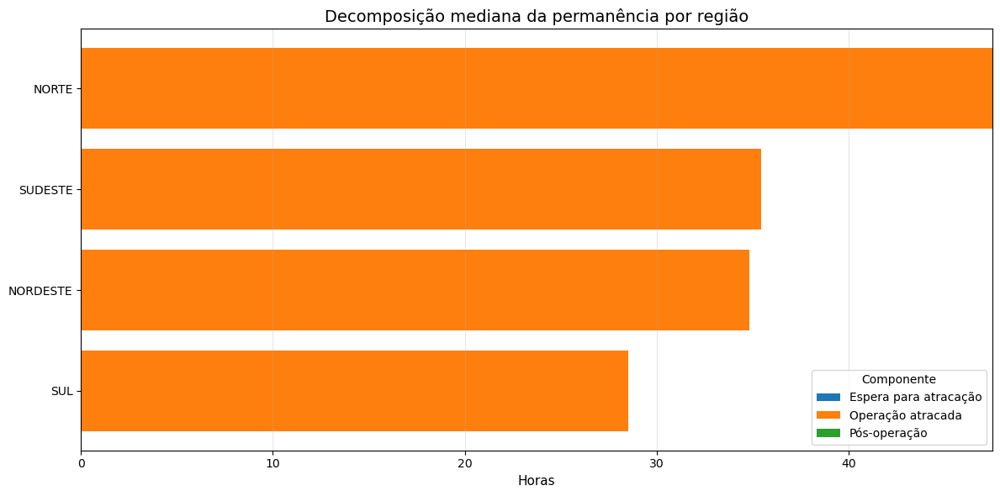

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_region_component_median_stacked.png')

In [96]:
plot_data = region_component_median_pivot.copy()

# Sort regions by total median component time
plot_data["total_component_median_h"] = plot_data.sum(axis=1)
plot_data = plot_data.sort_values("total_component_median_h", ascending=True)

fig, ax = plt.subplots(figsize=(12, 6))

left = np.zeros(len(plot_data))

for component_label in COMPONENT_ORDER_LABELS:
    values = plot_data[component_label].fillna(0).values

    ax.barh(
        plot_data.index,
        values,
        left=left,
        label=component_label,
    )

    left += values

ax.set_title("Decomposição mediana da permanência por região")
ax.set_xlabel("Horas")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)
ax.legend(title="Componente", loc="lower right")

figure_path = save_figure("eda_06_region_component_median_stacked.png")
plt.show()

figure_path

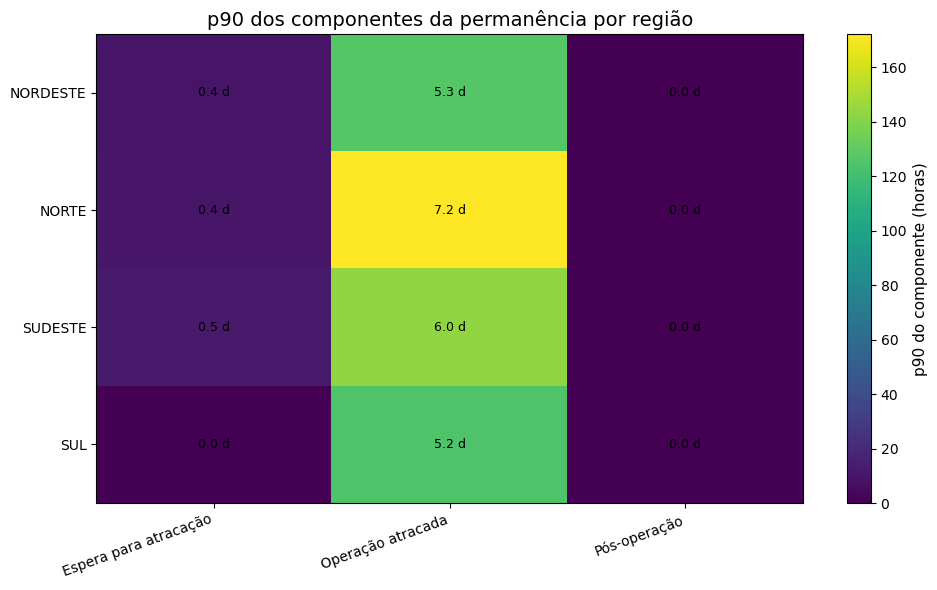

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_region_component_p90_heatmap.png')

In [97]:
region_component_p90_pivot = (
    region_component_summary
    .pivot(
        index="region",
        columns="component_label",
        values="p90_h",
    )
    .reindex(columns=COMPONENT_ORDER_LABELS)
)

plot_data = region_component_p90_pivot.copy()

fig, ax = plt.subplots(figsize=(10, 6))

im = ax.imshow(plot_data.values, aspect="auto")

ax.set_xticks(np.arange(len(plot_data.columns)))
ax.set_xticklabels(plot_data.columns, rotation=20, ha="right")

ax.set_yticks(np.arange(len(plot_data.index)))
ax.set_yticklabels(plot_data.index)

for i in range(plot_data.shape[0]):
    for j in range(plot_data.shape[1]):
        value = plot_data.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value / 24:.1f} d",
                ha="center",
                va="center",
                fontsize=9,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("p90 do componente (horas)")

ax.set_title("p90 dos componentes da permanência por região")

figure_path = save_figure("eda_06_region_component_p90_heatmap.png")
plt.show()

figure_path

A decomposição por região permite observar se a diferença espacial do lead time está concentrada em uma etapa específica.

Se a operação atracada domina em todas as regiões, o modelo pode depender fortemente de variáveis associadas ao tipo de operação e ao perfil do porto. Se a espera para atracação se destaca em algumas regiões, fatores como congestionamento, capacidade e janelas operacionais podem ter maior peso. Se o pós-operação aparece como relevante, pode haver uma dimensão adicional relacionada à liberação ou saída da embarcação.

### 6.4 Decomposição por porto

A análise por região ainda é agregada. Para entender melhor a origem da variabilidade, descemos ao nível dos portos.

Aqui, o objetivo é identificar se os portos críticos têm perfis diferentes de decomposição. Alguns podem ser críticos por longa operação; outros, por espera para atracação; outros, por pós-operação.

In [98]:
MIN_PORT_CALLS_FOR_COMPONENT_ANALYSIS = 30

port_component_summary = (
    component_long
    .groupby(["port", "port_display", "region", "component", "component_label"], observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_h=("duration_h", "mean"),
        median_h=("duration_h", "median"),
        p90_h=("duration_h", lambda x: x.quantile(0.90)),
        zero_pct=("duration_h", lambda x: (x == 0).mean() * 100),
    )
    .reset_index()
)

port_component_summary = port_component_summary.loc[
    port_component_summary["n_calls"] >= MIN_PORT_CALLS_FOR_COMPONENT_ANALYSIS
].copy()

for col in ["mean_h", "median_h", "p90_h"]:
    port_component_summary[col.replace("_h", "_d")] = (
        port_component_summary[col] / 24
    )

port_component_summary.head()

,port,port_display,region,component,component_label,n_calls,mean_h,median_h,p90_h,zero_pct,mean_d,median_d,p90_d
0,BR052001,BR052001 - JURITI - PA,NORTE,t_operation_h,Operação atracada,386,32.22,26.50,39.00,0.00,1.34,1.10,1.62
1,BR052001,BR052001 - JURITI - PA,NORTE,t_post_operation_h,Pós-operação,386,0.00,0.00,0.00,100.00,0.00,0.00,0.00
2,BR052001,BR052001 - JURITI - PA,NORTE,t_wait_for_berthing_h,Espera para atracação,386,0.05,0.00,0.00,99.74,0.00,0.00,0.00
3,BR147001,BR147001 - TRIUNFO - RS,SUL,t_operation_h,Operação atracada,86,88.18,53.48,229.50,0.00,3.67,2.23,9.56
4,BR147001,BR147001 - TRIUNFO - RS,SUL,t_post_operation_h,Pós-operação,86,0.00,0.00,0.00,100.00,0.00,0.00,0.00


In [99]:
# Selecting critical ports

if "port_criticality" not in globals():
    port_criticality = port_ranking_base.copy()
    port_criticality["volume_rank_pct"] = port_criticality["n_calls"].rank(pct=True)
    port_criticality["p90_rank_pct"] = port_criticality["p90_total_d"].rank(pct=True)
    port_criticality["tail_gap_rank_pct"] = port_criticality["p90_minus_median_d"].rank(pct=True)
    port_criticality["criticality_score"] = (
        port_criticality["volume_rank_pct"]
        + port_criticality["p90_rank_pct"]
        + port_criticality["tail_gap_rank_pct"]
    )

critical_ports_list = (
    port_criticality
    .sort_values("criticality_score", ascending=False)
    .head(15)["port"]
    .tolist()
)

critical_ports_list

['BRSSZ',
 'BRSFS',
 'BRNTR',
 'BRPEC',
 'BRSUA',
 'BRRIO',
 'BRSTM',
 'BRRIG',
 'BRADR003',
 'BRREC',
 'BRITJ',
 'BRITA001',
 'BRITJ007',
 'BRVDC005',
 'BRITA004']

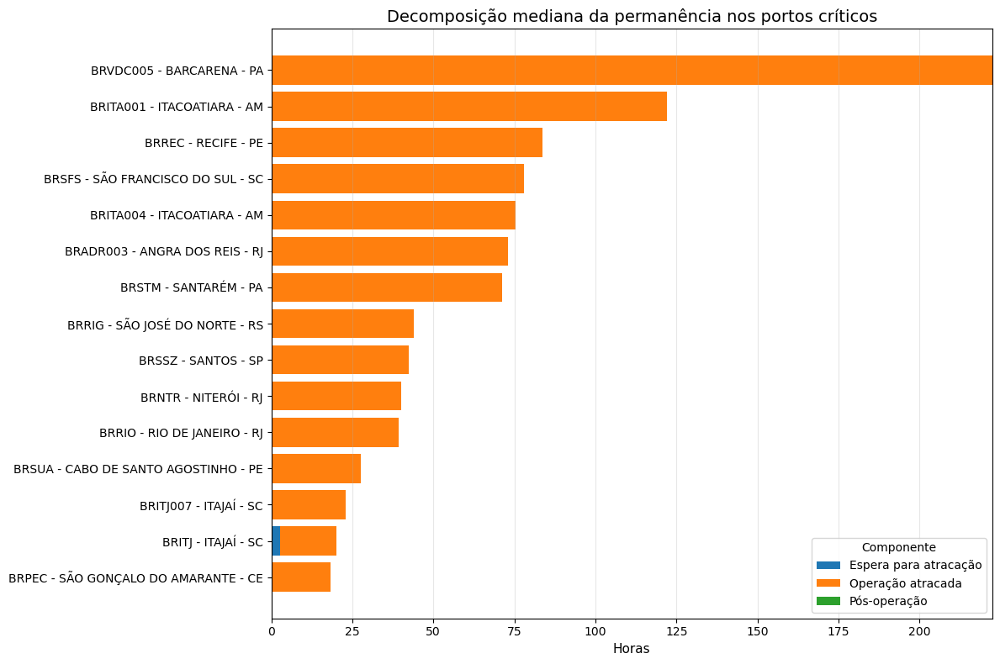

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_critical_ports_component_median_stacked.png')

In [100]:
critical_port_component_median = (
    port_component_summary
    .loc[port_component_summary["port"].isin(critical_ports_list)]
    .pivot_table(
        index=["port", "port_display"],
        columns="component_label",
        values="median_h",
        aggfunc="first",
        observed=True,
    )
    .reindex(columns=COMPONENT_ORDER_LABELS)
    .reset_index()
)

critical_port_component_median["total_component_median_h"] = (
    critical_port_component_median[COMPONENT_ORDER_LABELS].sum(axis=1)
)

critical_port_component_median = critical_port_component_median.sort_values(
    "total_component_median_h",
    ascending=True,
)

fig, ax = plt.subplots(figsize=(12, 8))

left = np.zeros(len(critical_port_component_median))

for component_label in COMPONENT_ORDER_LABELS:
    values = critical_port_component_median[component_label].fillna(0).values

    ax.barh(
        critical_port_component_median["port_display"],
        values,
        left=left,
        label=component_label,
    )

    left += values

ax.set_title("Decomposição mediana da permanência nos portos críticos")
ax.set_xlabel("Horas")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)
ax.legend(title="Componente", loc="lower right")

figure_path = save_figure("eda_06_critical_ports_component_median_stacked.png")
plt.show()

figure_path

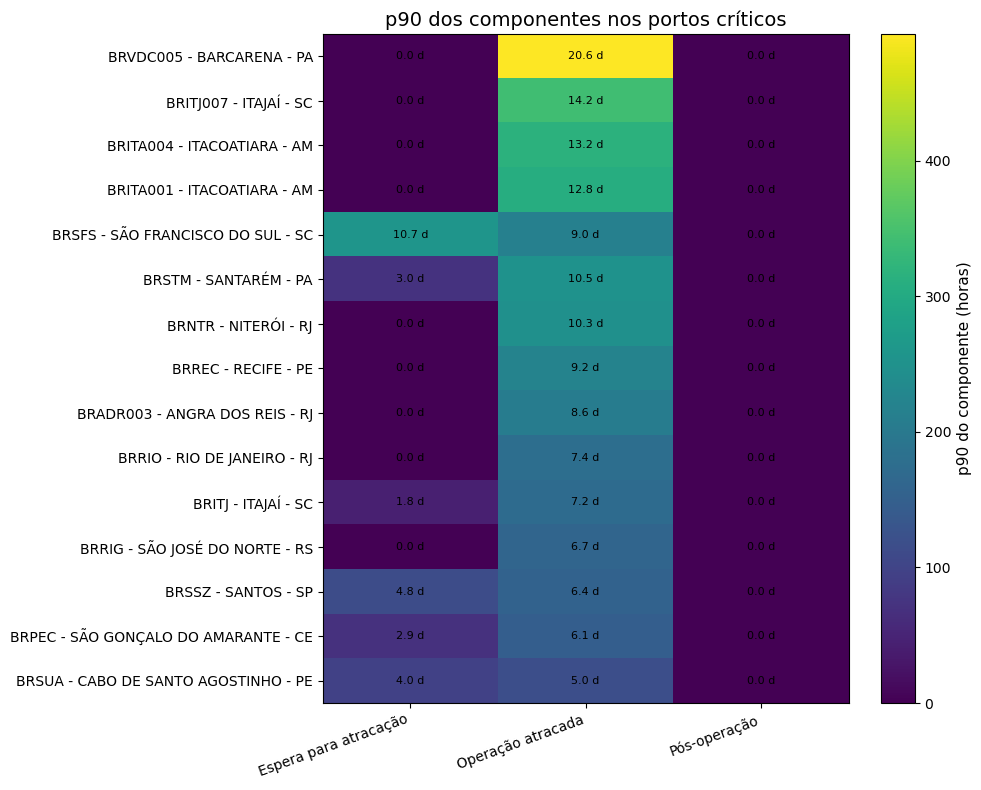

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_critical_ports_component_p90_heatmap.png')

In [101]:
critical_port_component_p90 = (
    port_component_summary
    .loc[port_component_summary["port"].isin(critical_ports_list)]
    .pivot_table(
        index=["port", "port_display"],
        columns="component_label",
        values="p90_h",
        aggfunc="first",
        observed=True,
    )
    .reindex(columns=COMPONENT_ORDER_LABELS)
    .reset_index()
)

critical_port_component_p90["max_component_p90_h"] = (
    critical_port_component_p90[COMPONENT_ORDER_LABELS].max(axis=1)
)

critical_port_component_p90 = critical_port_component_p90.sort_values(
    "max_component_p90_h",
    ascending=False,
)

plot_matrix = critical_port_component_p90.set_index("port_display")[COMPONENT_ORDER_LABELS]

fig, ax = plt.subplots(figsize=(10, 8))

im = ax.imshow(plot_matrix.values, aspect="auto")

ax.set_xticks(np.arange(len(plot_matrix.columns)))
ax.set_xticklabels(plot_matrix.columns, rotation=20, ha="right")

ax.set_yticks(np.arange(len(plot_matrix.index)))
ax.set_yticklabels(plot_matrix.index)

for i in range(plot_matrix.shape[0]):
    for j in range(plot_matrix.shape[1]):
        value = plot_matrix.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value / 24:.1f} d",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("p90 do componente (horas)")

ax.set_title("p90 dos componentes nos portos críticos")

figure_path = save_figure("eda_06_critical_ports_component_p90_heatmap.png")
plt.show()

figure_path

A análise por porto evidencia se os portos críticos têm a mesma causa de permanência elevada.

Portos com maior componente de operação podem exigir análise do tipo de carga, produtividade ou complexidade operacional. Portos com maior espera para atracação podem indicar filas, capacidade limitada ou congestionamento. Portos com pós-operação relevante podem demandar investigação sobre liberação, documentação ou condições de saída.

Essa distinção é importante porque um modelo preditivo pode capturar o lead time total, mas a interpretação operacional depende de entender qual etapa está gerando o atraso.

### 6.5 Relação entre cada componente e o tempo total

Nesta etapa, avaliamos quais componentes estão mais associados à permanência total.

A correlação não implica causalidade, mas ajuda a indicar quais etapas variam junto com o tempo total. Se um componente tem alta correlação com a permanência total, ele pode ser uma fonte importante de variabilidade.

In [102]:
component_correlation = pd.DataFrame(
    [
        {
            "component": col,
            "component_label": COMPONENT_LABELS[col],
            "pearson_corr_with_total": df[[col, TOTAL_TARGET_H]].corr(method="pearson").iloc[0, 1],
            "spearman_corr_with_total": df[[col, TOTAL_TARGET_H]].corr(method="spearman").iloc[0, 1],
        }
        for col in COMPONENT_COLUMNS_H
    ]
)

component_correlation["component_label"] = pd.Categorical(
    component_correlation["component_label"],
    categories=COMPONENT_ORDER_LABELS,
    ordered=True,
)

component_correlation = component_correlation.sort_values(
    "component_label"
).reset_index(drop=True)

component_correlation

,component,component_label,pearson_corr_with_total,spearman_corr_with_total
0,t_wait_for_berthing_h,Espera para atracação,0.51,0.22
1,t_operation_h,Operação atracada,0.88,0.95
2,t_post_operation_h,Pós-operação,0.16,0.08


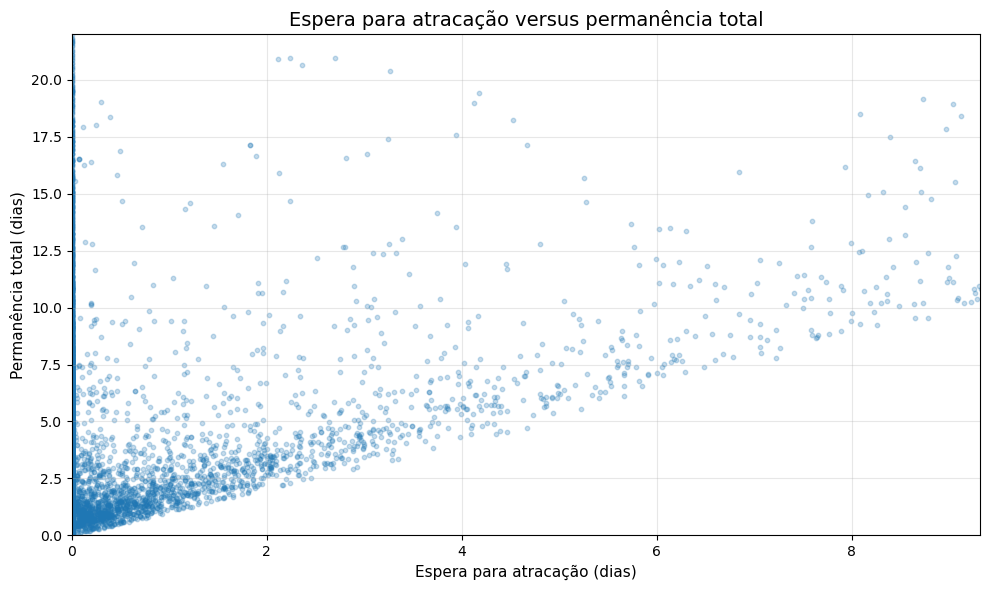

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_scatter_wait_vs_total.png')

In [103]:
sample_size = min(20000, len(df))
plot_sample = df.sample(sample_size, random_state=42)

fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(
    plot_sample["t_wait_for_berthing_h"] / 24,
    plot_sample[TOTAL_TARGET_H] / 24,
    alpha=0.25,
    s=10,
)

ax.set_title("Espera para atracação versus permanência total")
ax.set_xlabel("Espera para atracação (dias)")
ax.set_ylabel("Permanência total (dias)")
ax.grid(alpha=0.3)

ax.set_xlim(0, df["t_wait_for_berthing_h"].quantile(0.99) / 24)
ax.set_ylim(0, df[TOTAL_TARGET_H].quantile(0.99) / 24)

figure_path = save_figure("eda_06_scatter_wait_vs_total.png")
plt.show()

figure_path

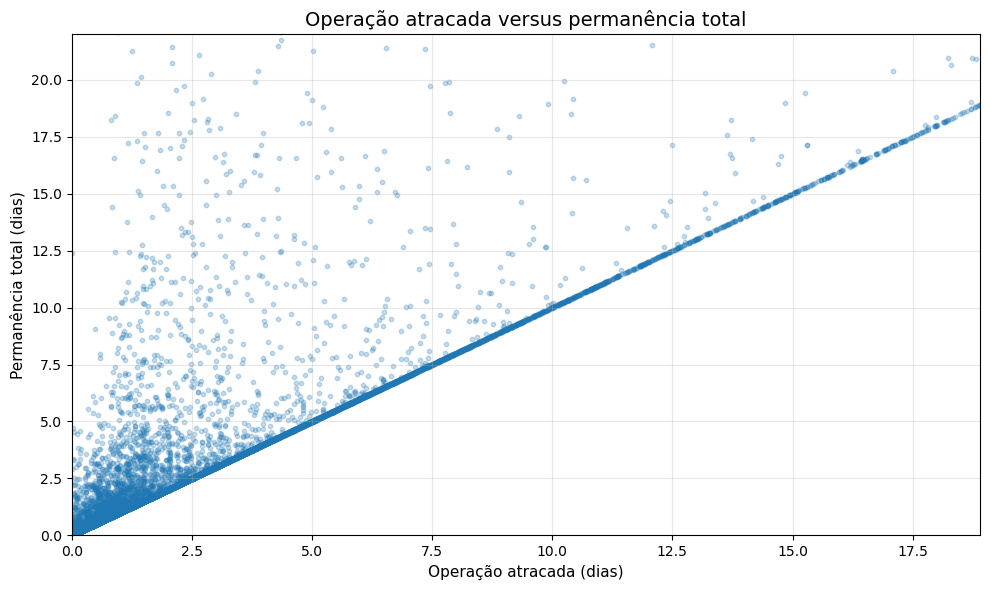

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_scatter_operation_vs_total.png')

In [104]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(
    plot_sample["t_operation_h"] / 24,
    plot_sample[TOTAL_TARGET_H] / 24,
    alpha=0.25,
    s=10,
)

ax.set_title("Operação atracada versus permanência total")
ax.set_xlabel("Operação atracada (dias)")
ax.set_ylabel("Permanência total (dias)")
ax.grid(alpha=0.3)

ax.set_xlim(0, df["t_operation_h"].quantile(0.99) / 24)
ax.set_ylim(0, df[TOTAL_TARGET_H].quantile(0.99) / 24)

figure_path = save_figure("eda_06_scatter_operation_vs_total.png")
plt.show()

figure_path

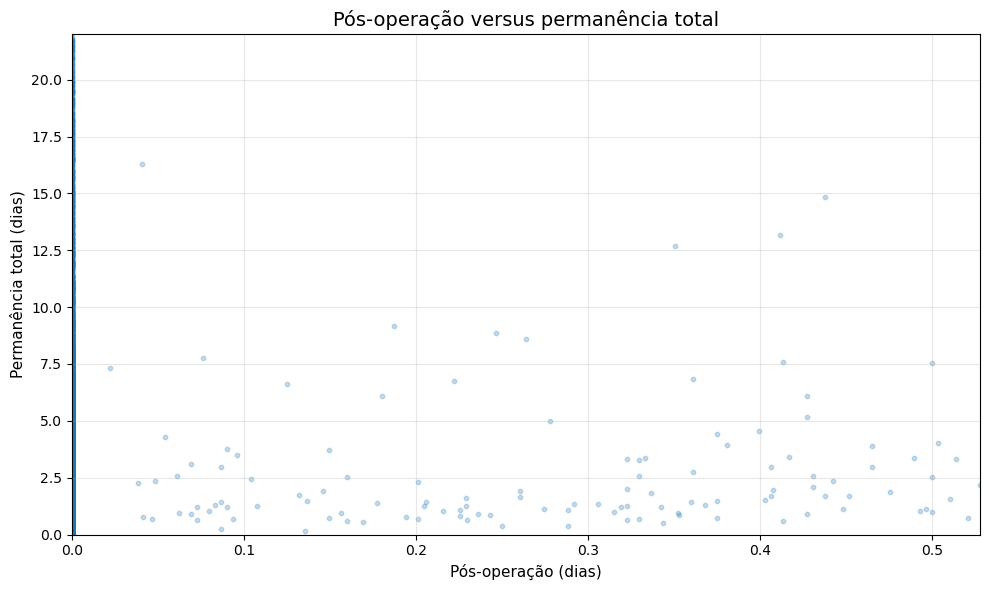

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_scatter_post_operation_vs_total.png')

In [105]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(
    plot_sample["t_post_operation_h"] / 24,
    plot_sample[TOTAL_TARGET_H] / 24,
    alpha=0.25,
    s=10,
)

ax.set_title("Pós-operação versus permanência total")
ax.set_xlabel("Pós-operação (dias)")
ax.set_ylabel("Permanência total (dias)")
ax.grid(alpha=0.3)

ax.set_xlim(0, df["t_post_operation_h"].quantile(0.99) / 24)
ax.set_ylim(0, df[TOTAL_TARGET_H].quantile(0.99) / 24)

figure_path = save_figure("eda_06_scatter_post_operation_vs_total.png")
plt.show()

figure_path

Os gráficos de dispersão ajudam a visualizar a relação entre cada componente e a permanência total.

Quando os pontos se aproximam de uma relação crescente clara, o componente tende a explicar parte relevante da variação do total. Quando há muitos valores concentrados em zero, mas ainda existem casos altos, isso indica que o componente pode ter baixa relevância típica, mas importância em situações específicas de atraso.

### 6.6 Qual componente domina os casos extremos?

Uma análise nacional pode mostrar que um componente domina em média, mas o mais importante para risco logístico é entender o que acontece nos casos extremos.

Nesta etapa, vamos analisar apenas escalas acima do p90 da permanência total e verificar qual componente representa a maior parcela do tempo total.

In [106]:
total_p90_h = df[TOTAL_TARGET_H].quantile(0.90)

df_extreme_total = df.loc[df[TOTAL_TARGET_H] >= total_p90_h].copy()

def identify_dominant_component(row: pd.Series) -> str:
    """Identify which component has the largest duration in a row."""
    values = {
        COMPONENT_LABELS[col]: row[col]
        for col in COMPONENT_COLUMNS_H
    }

    return max(values, key=values.get)

df_extreme_total["dominant_component"] = df_extreme_total.apply(
    identify_dominant_component,
    axis=1,
)

dominant_component_extreme_summary = (
    df_extreme_total["dominant_component"]
    .value_counts()
    .reindex(COMPONENT_ORDER_LABELS)
    .reset_index()
)

dominant_component_extreme_summary.columns = [
    "dominant_component",
    "count",
]

dominant_component_extreme_summary["pct_extreme_cases"] = (
    dominant_component_extreme_summary["count"] / len(df_extreme_total) * 100
)

dominant_component_extreme_summary

,dominant_component,count,pct_extreme_cases
0,Espera para atracação,2450,18.90
1,Operação atracada,10359,79.91
2,Pós-operação,155,1.20


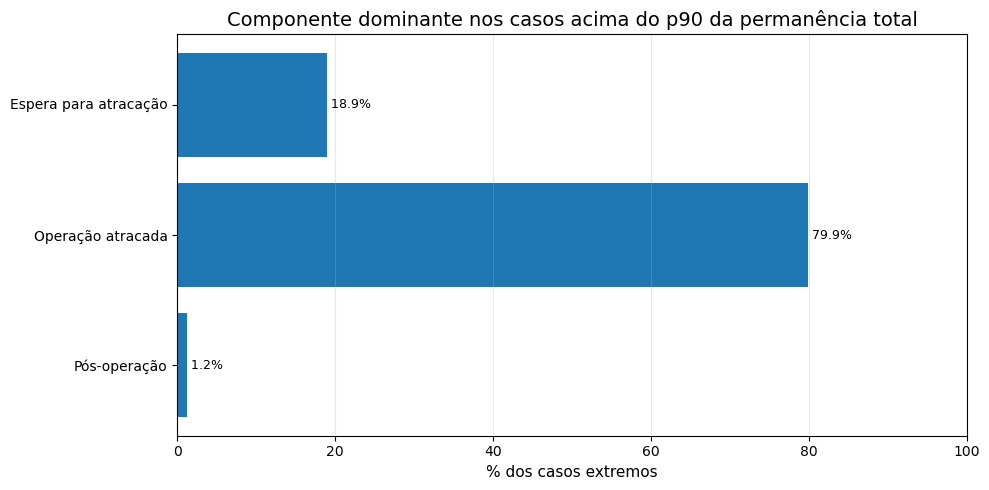

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_dominant_component_extreme_cases.png')

In [107]:
plot_data = dominant_component_extreme_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["dominant_component"],
    plot_data["pct_extreme_cases"],
)

for index, row in plot_data.iterrows():
    ax.text(
        row["pct_extreme_cases"],
        index,
        f" {row['pct_extreme_cases']:.1f}%",
        va="center",
        fontsize=9,
    )

ax.invert_yaxis()
ax.set_title("Componente dominante nos casos acima do p90 da permanência total")
ax.set_xlabel("% dos casos extremos")
ax.set_ylabel("")
ax.set_xlim(0, max(100, plot_data["pct_extreme_cases"].max() * 1.15))
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_06_dominant_component_extreme_cases.png")
plt.show()

figure_path

In [108]:
dominant_component_by_region = (
    df_extreme_total
    .dropna(subset=["region"])
    .groupby(["region", "dominant_component"])
    .size()
    .reset_index(name="count")
)

dominant_component_by_region["pct_region_extreme_cases"] = (
    dominant_component_by_region["count"]
    / dominant_component_by_region.groupby("region")["count"].transform("sum")
    * 100
)

dominant_component_by_region_pivot = (
    dominant_component_by_region
    .pivot(
        index="region",
        columns="dominant_component",
        values="pct_region_extreme_cases",
    )
    .reindex(columns=COMPONENT_ORDER_LABELS)
    .fillna(0)
)

dominant_component_by_region_pivot

dominant_component,Espera para atracação,Operação atracada,Pós-operação
region,,,
NORDESTE,18.46,80.89,0.64
NORTE,11.40,88.42,0.18
SUDESTE,20.87,77.49,1.64
SUL,15.94,83.41,0.65


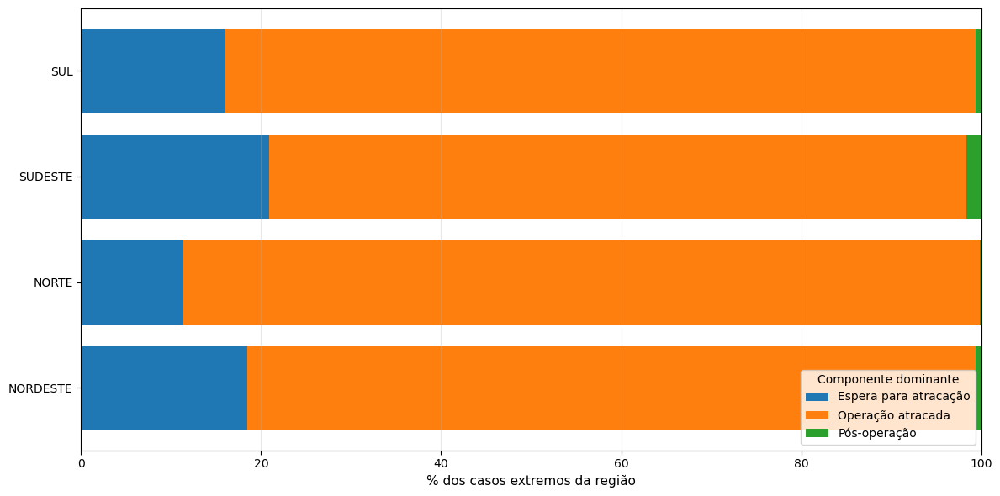

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_06_dominant_component_extreme_cases_by_region.png')

In [109]:
plot_data = dominant_component_by_region_pivot.copy()

fig, ax = plt.subplots(figsize=(12, 6))

left = np.zeros(len(plot_data))

for component_label in COMPONENT_ORDER_LABELS:
    values = plot_data[component_label].values

    ax.barh(
        plot_data.index,
        values,
        left=left,
        label=component_label,
    )

    left += values

# ax.set_title("Componente dominante nos casos extremos por região")
ax.set_xlabel("% dos casos extremos da região")
ax.set_ylabel("")
ax.set_xlim(0, 100)
ax.grid(axis="x", alpha=0.3)
ax.legend(title="Componente dominante", loc="lower right")

figure_path = save_figure("eda_06_dominant_component_extreme_cases_by_region.png")
plt.show()

figure_path

A análise dos casos extremos mostra qual componente aparece como principal responsável nas escalas mais longas.

Se a operação atracada domina os casos extremos, a cauda do lead time pode estar mais associada à duração da operação. Se a espera para atracação domina, o risco extremo pode estar mais relacionado a fila e congestionamento. Se o pós-operação aparece com peso relevante, pode haver atrasos após a conclusão da operação que merecem investigação adicional.

Essa análise conecta diretamente o EDA à modelagem: talvez seja útil prever não apenas o tempo total, mas também os componentes ou pelo menos incluir variáveis que capturem as diferenças entre essas etapas.

In [110]:
largest_mean_component = component_national_summary.sort_values(
    "mean_h",
    ascending=False,
).iloc[0]

largest_median_component = component_national_summary.sort_values(
    "median_h",
    ascending=False,
).iloc[0]

largest_p90_component = component_national_summary.sort_values(
    "p90_h",
    ascending=False,
).iloc[0]

largest_corr_component = component_correlation.sort_values(
    "spearman_corr_with_total",
    ascending=False,
).iloc[0]

dominant_extreme_component = dominant_component_extreme_summary.sort_values(
    "pct_extreme_cases",
    ascending=False,
).iloc[0]

section_6_narrative = f"""
A decomposição da permanência portuária mostra que os componentes não contribuem de forma homogênea para o lead time total.

Em média, o maior componente é {largest_mean_component['component_label']}, com {largest_mean_component['mean_h']:,.1f} horas.
Pela mediana, o maior componente é {largest_median_component['component_label']}, com {largest_median_component['median_h']:,.1f} horas.
No p90, o maior componente é {largest_p90_component['component_label']}, com {largest_p90_component['p90_h']:,.1f} horas.

O componente mais correlacionado com a permanência total, usando correlação de Spearman, é {largest_corr_component['component_label']}, com correlação de {largest_corr_component['spearman_corr_with_total']:,.2f}.

Entre as escalas acima do p90 da permanência total, o componente dominante mais frequente é {dominant_extreme_component['dominant_component']}, presente em {dominant_extreme_component['pct_extreme_cases']:,.1f}% dos casos extremos.
"""

print(section_6_narrative)


A decomposição da permanência portuária mostra que os componentes não contribuem de forma homogênea para o lead time total.

Em média, o maior componente é Operação atracada, com 61.9 horas.
Pela mediana, o maior componente é Operação atracada, com 34.8 horas.
No p90, o maior componente é Operação atracada, com 139.3 horas.

O componente mais correlacionado com a permanência total, usando correlação de Spearman, é Operação atracada, com correlação de 0.95.

Entre as escalas acima do p90 da permanência total, o componente dominante mais frequente é Operação atracada, presente em 79.9% dos casos extremos.



In [111]:
component_share_summary_path = TABLES_DIR / "eda_06_component_share_summary.csv"
region_component_summary_path = TABLES_DIR / "eda_06_region_component_summary.csv"
port_component_summary_path = TABLES_DIR / "eda_06_port_component_summary.csv"
component_correlation_path = TABLES_DIR / "eda_06_component_correlation.csv"
dominant_component_extreme_path = TABLES_DIR / "eda_06_dominant_component_extreme_cases.csv"

component_share_summary.to_csv(component_share_summary_path, index=False)
region_component_summary.to_csv(region_component_summary_path, index=False)
port_component_summary.to_csv(port_component_summary_path, index=False)
component_correlation.to_csv(component_correlation_path, index=False)
dominant_component_extreme_summary.to_csv(dominant_component_extreme_path, index=False)

[
    component_share_summary_path,
    region_component_summary_path,
    port_component_summary_path,
    component_correlation_path,
    dominant_component_extreme_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_06_component_share_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_06_region_component_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_06_port_component_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_06_component_correlation.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_06_dominant_component_extreme_cases.csv')]

### Principais mensagens da seção

A decomposição da permanência portuária mostra que o lead time total é resultado de etapas com comportamentos distintos.

A espera para atracação, a operação atracada e o pós-operação não têm necessariamente a mesma relevância em todos os contextos. Alguns componentes podem dominar o comportamento típico, enquanto outros podem ser mais importantes nos casos extremos.

Essa distinção é fundamental para o TCC. Se a permanência total fosse analisada apenas como uma variável única, perderíamos a capacidade de interpretar onde a variabilidade é gerada. Ao decompor o lead time, conseguimos aproximar a análise estatística da realidade operacional dos portos.

Para a modelagem, os resultados desta seção sugerem dois caminhos complementares:

1. usar a permanência total como target principal, por ser a métrica mais robusta para planejamento;
2. manter os componentes como variáveis interpretativas ou como targets auxiliares, caso a modelagem futura busque explicar separadamente espera, operação e pós-operação.

A próxima seção investigará se o tipo de operação ajuda a explicar diferenças relevantes nos tempos portuários.

---

## 7. Tipo de operação e perfil operacional

A permanência de uma embarcação no porto depende não apenas do porto em que ela opera, mas também do tipo de operação realizada.

Uma escala associada a carga, descarga, fundeio, offshore, manutenção, passageiros ou bunker pode ter perfis de tempo muito diferentes. Por isso, esta seção investiga se o tipo de operação ajuda a explicar diferenças na permanência total e em seus componentes.

A pergunta principal desta seção é:

> Determinados tipos de operação estão associados a maior tempo típico, maior risco de cauda ou maior variabilidade?

Essa análise é relevante para o TCC porque o tipo de operação pode funcionar como uma variável explicativa importante na modelagem de lead time. Se operações diferentes têm distribuições de tempo distintas, o modelo precisa capturar essa heterogeneidade para gerar previsões mais úteis.

In [112]:
# Operation type flags are expected to be boolean columns created from operation_type.
operation_flag_columns = [
    col for col in df.columns
    if col.startswith("op_")
]

operation_flag_columns = sorted(operation_flag_columns)

if not operation_flag_columns:
    raise ValueError(
        "No operation type flag columns were found. "
        "Expected columns starting with 'op_'."
    )

operation_flag_columns

['op_abastecimento_bunker',
 'op_arribada',
 'op_carga',
 'op_descarga',
 'op_desembarque_passageiros',
 'op_embarque_passageiros',
 'op_fundeio',
 'op_fundeio_ship_to_ship',
 'op_navio_estado_com_operacao_comercial',
 'op_navio_estado_marinha_brasil',
 'op_navio_estado_sem_operacao_comercial',
 'op_offshore',
 'op_reparo_manutencao',
 'op_retirada_residuos_com_operacao_comercial',
 'op_retirada_residuos_sem_operacao_comercial',
 'op_solicitacao_certificado',
 'op_tipo_operacao_nao_mapeado']

In [113]:
OPERATION_LABELS = {
    "op_abastecimento_bunker": "Abastecimento / bunker",
    "op_arribada": "Arribada",
    "op_carga": "Carga",
    "op_descarga": "Descarga",
    "op_desembarque_passageiros": "Desembarque de passageiros",
    "op_embarque_passageiros": "Embarque de passageiros",
    "op_fundeio": "Fundeio",
    "op_fundeio_ship_to_ship": "Fundeio ship-to-ship",
    "op_navio_estado_com_operacao_comercial": "Navio de Estado com operação comercial",
    "op_navio_estado_marinha_brasil": "Navio de Estado - Marinha do Brasil",
    "op_navio_estado_sem_operacao_comercial": "Navio de Estado sem operação comercial",
    "op_offshore": "Offshore",
    "op_reparo_manutencao": "Reparo / manutenção",
    "op_retirada_residuos_com_operacao_comercial": "Retirada de resíduos com operação comercial",
    "op_retirada_residuos_sem_operacao_comercial": "Retirada de resíduos sem operação comercial",
    "op_solicitacao_certificado": "Solicitação de certificado",
    "op_tipo_operacao_nao_mapeado": "Tipo de operação não mapeado",
}

operation_labels = {
    col: OPERATION_LABELS.get(col, col.replace("op_", "").replace("_", " ").title())
    for col in operation_flag_columns
}

operation_labels

{'op_abastecimento_bunker': 'Abastecimento / bunker',
 'op_arribada': 'Arribada',
 'op_carga': 'Carga',
 'op_descarga': 'Descarga',
 'op_desembarque_passageiros': 'Desembarque de passageiros',
 'op_embarque_passageiros': 'Embarque de passageiros',
 'op_fundeio': 'Fundeio',
 'op_fundeio_ship_to_ship': 'Fundeio ship-to-ship',
 'op_navio_estado_com_operacao_comercial': 'Navio de Estado com operação comercial',
 'op_navio_estado_marinha_brasil': 'Navio de Estado - Marinha do Brasil',
 'op_navio_estado_sem_operacao_comercial': 'Navio de Estado sem operação comercial',
 'op_offshore': 'Offshore',
 'op_reparo_manutencao': 'Reparo / manutenção',
 'op_retirada_residuos_com_operacao_comercial': 'Retirada de resíduos com operação comercial',
 'op_retirada_residuos_sem_operacao_comercial': 'Retirada de resíduos sem operação comercial',
 'op_solicitacao_certificado': 'Solicitação de certificado',
 'op_tipo_operacao_nao_mapeado': 'Tipo de operação não mapeado'}

In [114]:
# Make sure that flags are in boolean format

df_operations = df.copy()

for col in operation_flag_columns:
    df_operations[col] = df_operations[col].fillna(False).astype(bool)

df_operations[operation_flag_columns].head()

,op_abastecimento_bunker,op_arribada,op_carga,op_descarga,op_desembarque_passageiros,op_embarque_passageiros,op_fundeio,op_fundeio_ship_to_ship,op_navio_estado_com_operacao_comercial,op_navio_estado_marinha_brasil,op_navio_estado_sem_operacao_comercial,op_offshore,op_reparo_manutencao,op_retirada_residuos_com_operacao_comercial,op_retirada_residuos_sem_operacao_comercial,op_solicitacao_certificado,op_tipo_operacao_nao_mapeado
0,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False


### Observação metodológica

Uma mesma escala portuária pode estar associada a mais de um tipo de operação. Por exemplo, uma escala pode envolver carga e descarga, ou algum tipo de operação comercial combinada com outro motivo de atracação.

Por isso, as análises por flag de operação não devem ser interpretadas como categorias mutuamente exclusivas. Quando somamos as quantidades por tipo de operação, uma mesma escala pode aparecer em mais de uma categoria.

Essa abordagem é adequada para análise exploratória porque queremos entender se a presença de determinado tipo de operação está associada a tempos diferentes, mesmo quando ela aparece combinada com outras operações.

In [115]:
# Flags count by record 

df_operations["n_operation_flags"] = df_operations[operation_flag_columns].sum(axis=1)

operation_flag_count_summary = (
    df_operations["n_operation_flags"]
    .value_counts()
    .sort_index()
    .reset_index()
)

operation_flag_count_summary.columns = [
    "n_operation_flags",
    "n_calls",
]

operation_flag_count_summary["pct_calls"] = (
    operation_flag_count_summary["n_calls"] / len(df_operations) * 100
)

operation_flag_count_summary

,n_operation_flags,n_calls,pct_calls
0,0,20,0.02
1,1,94822,73.15
2,2,34041,26.26
3,3,322,0.25
4,4,118,0.09
5,5,13,0.01
6,6,9,0.01
7,8,2,0.00
8,9,88,0.07
9,10,2,0.00


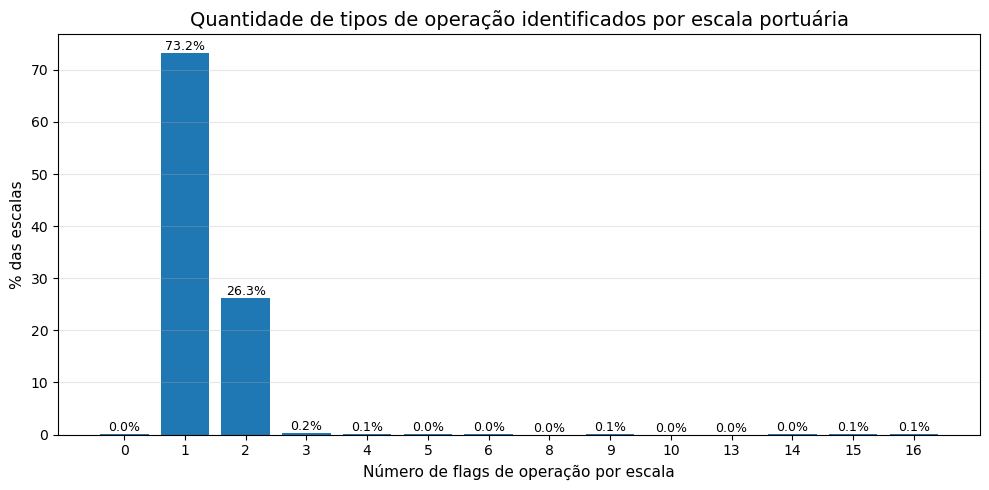

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operation_flags_per_call.png')

In [116]:
plot_data = operation_flag_count_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    plot_data["n_operation_flags"].astype(str),
    plot_data["pct_calls"],
)

for index, row in plot_data.iterrows():
    ax.text(
        index,
        row["pct_calls"],
        f"{row['pct_calls']:.1f}%",
        ha="center",
        va="bottom",
        fontsize=9,
    )

ax.set_title("Quantidade de tipos de operação identificados por escala portuária")
ax.set_xlabel("Número de flags de operação por escala")
ax.set_ylabel("% das escalas")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_07_operation_flags_per_call.png")
plt.show()

figure_path

In [117]:
operation_frequency = pd.DataFrame(
    [
        {
            "operation_flag": col,
            "operation_label": operation_labels[col],
            "n_calls": df_operations[col].sum(),
            "pct_calls": df_operations[col].mean() * 100,
        }
        for col in operation_flag_columns
    ]
)

operation_frequency = operation_frequency.sort_values(
    "n_calls",
    ascending=False,
).reset_index(drop=True)

operation_frequency

,operation_flag,operation_label,n_calls,pct_calls
0,op_carga,Carga,63445,48.95
1,op_descarga,Descarga,57279,44.19
2,op_offshore,Offshore,33700,26.00
3,op_abastecimento_bunker,Abastecimento / bunker,3780,2.92
4,op_desembarque_passageiros,Desembarque de passageiros,2484,1.92
5,op_embarque_passageiros,Embarque de passageiros,2471,1.91
6,op_solicitacao_certificado,Solicitação de certificado,1885,1.45
7,op_fundeio,Fundeio,1305,1.01
8,op_arribada,Arribada,432,0.33
9,op_reparo_manutencao,Reparo / manutenção,317,0.24


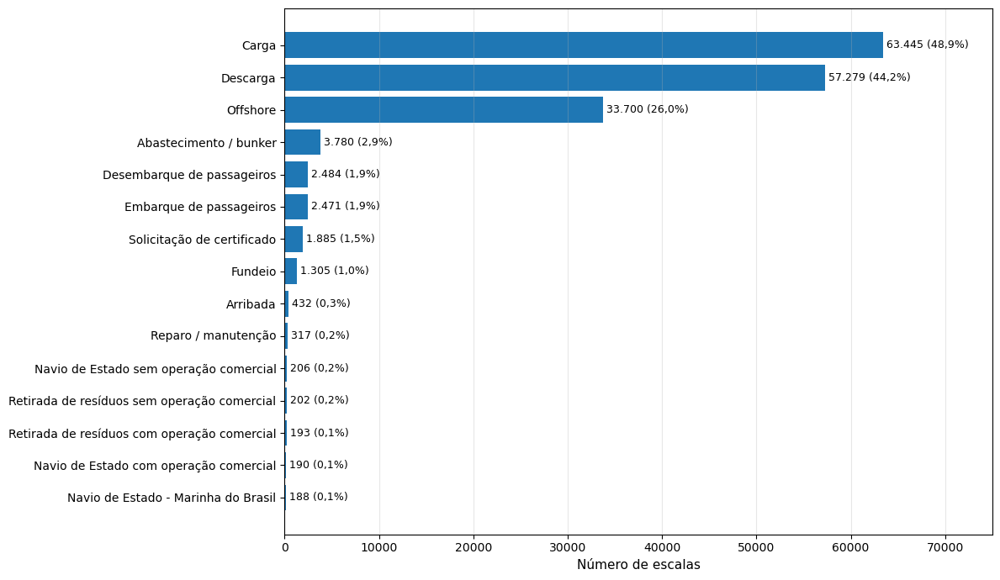

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_top_operation_types_by_volume.png')

In [118]:
TOP_N_OPERATIONS = 15

plot_data = (
    operation_frequency
    .head(TOP_N_OPERATIONS)
    .sort_values("n_calls", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["operation_label"],
    plot_data["n_calls"],
)

for index, row in enumerate(plot_data.itertuples()):
    # 1. Formata a contagem com vírgula no milhar e depois troca por ponto
    calls_str = f"{row.n_calls:,.0f}".replace(",", ".")
    
    # 2. Formata o percentual com ponto no decimal e depois troca por vírgula
    pct_str = f"{row.pct_calls:.1f}".replace(".", ",")
    
    # 3. Plota o texto usando as novas variáveis formatadas
    ax.text(
        row.n_calls,
        index,
        f" {calls_str} ({pct_str}%)",
        va="center",
        fontsize=9,
    )

# ax.set_title(f"Top {TOP_N_OPERATIONS} tipos de operação por número de escalas")
ax.set_xlabel("Número de escalas")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

ax.set_xlim(0, 75000)

figure_path = save_figure("eda_07_top_operation_types_by_volume.png")
plt.show()

figure_path

A frequência dos tipos de operação mostra quais perfis operacionais são mais representativos na base.

Operações muito frequentes tendem a influenciar mais o comportamento agregado do lead time. Operações pouco frequentes podem ainda ser relevantes, mas suas estatísticas devem ser interpretadas com cautela porque poucos registros podem gerar medianas e percentis menos estáveis.

### 7.2 Permanência total por tipo de operação

Nesta etapa, comparamos a permanência total entre os tipos de operação.

Para cada flag operacional, calculamos:

- número de escalas;
- média;
- mediana;
- p90;
- p95;
- diferença entre p90 e mediana;
- percentual de escalas acima do p90 nacional.

O objetivo é identificar quais operações estão associadas a maior tempo típico e quais apresentam maior risco de cauda.

In [119]:
MIN_CALLS_FOR_OPERATION_ANALYSIS = 100

national_p90_total_h = df_operations["t_total_port_stay_h"].quantile(0.90)

operation_total_summary_rows = []

for col in operation_flag_columns:
    subset = df_operations.loc[df_operations[col]].copy()

    if len(subset) == 0:
        continue

    operation_total_summary_rows.append(
        {
            "operation_flag": col,
            "operation_label": operation_labels[col],
            "n_calls": subset["port_call_id"].nunique(),
            "mean_total_h": subset["t_total_port_stay_h"].mean(),
            "median_total_h": subset["t_total_port_stay_h"].median(),
            "std_total_h": subset["t_total_port_stay_h"].std(),
            "p75_total_h": subset["t_total_port_stay_h"].quantile(0.75),
            "p90_total_h": subset["t_total_port_stay_h"].quantile(0.90),
            "p95_total_h": subset["t_total_port_stay_h"].quantile(0.95),
            "pct_above_national_p90": (
                subset["t_total_port_stay_h"] >= national_p90_total_h
            ).mean() * 100,
        }
    )

operation_total_summary = pd.DataFrame(operation_total_summary_rows)

for col in [
    "mean_total_h",
    "median_total_h",
    "std_total_h",
    "p75_total_h",
    "p90_total_h",
    "p95_total_h",
]:
    operation_total_summary[col.replace("_h", "_d")] = (
        operation_total_summary[col] / 24
    )

operation_total_summary["p90_minus_median_d"] = (
    operation_total_summary["p90_total_d"]
    - operation_total_summary["median_total_d"]
)

operation_total_summary["cv_total"] = (
    operation_total_summary["std_total_h"]
    / operation_total_summary["mean_total_h"]
)

operation_total_summary_filtered = operation_total_summary.loc[
    operation_total_summary["n_calls"] >= MIN_CALLS_FOR_OPERATION_ANALYSIS
].copy()

operation_total_summary_filtered = operation_total_summary_filtered.sort_values(
    "n_calls",
    ascending=False,
).reset_index(drop=True)

operation_total_summary_filtered

,operation_flag,operation_label,n_calls,mean_total_h,median_total_h,std_total_h,p75_total_h,p90_total_h,p95_total_h,pct_above_national_p90,mean_total_d,median_total_d,std_total_d,p75_total_d,p90_total_d,p95_total_d,p90_minus_median_d,cv_total
0,op_carga,Carga,63445,68.18,38.88,91.01,75.98,149.27,232.71,8.87,2.84,1.62,3.79,3.17,6.22,9.70,4.60,1.33
1,op_descarga,Descarga,57279,64.13,33.58,88.14,72.50,146.50,225.54,8.59,2.67,1.40,3.67,3.02,6.10,9.40,4.70,1.37
2,op_offshore,Offshore,33700,65.29,33.50,94.72,72.42,148.84,240.75,8.78,2.72,1.40,3.95,3.02,6.20,10.03,4.81,1.45
3,op_abastecimento_bunker,Abastecimento / bunker,3780,51.90,23.33,81.98,52.53,119.55,190.52,6.40,2.16,0.97,3.42,2.19,4.98,7.94,4.01,1.58
4,op_desembarque_passageiros,Desembarque de passageiros,2484,44.51,11.75,86.52,35.33,119.85,181.70,5.96,1.85,0.49,3.60,1.47,4.99,7.57,4.50,1.94
5,op_embarque_passageiros,Embarque de passageiros,2471,45.12,11.83,87.03,36.46,122.00,184.62,6.07,1.88,0.49,3.63,1.52,5.08,7.69,4.59,1.93
6,op_solicitacao_certificado,Solicitação de certificado,1885,68.04,14.00,122.39,73.33,196.00,331.88,12.10,2.83,0.58,5.10,3.06,8.17,13.83,7.58,1.80
7,op_fundeio,Fundeio,1305,97.52,42.08,136.32,123.00,248.61,395.35,18.16,4.06,1.75,5.68,5.12,10.36,16.47,8.61,1.40
8,op_arribada,Arribada,432,77.17,50.58,96.26,104.15,159.70,232.01,9.49,3.22,2.11,4.01,4.34,6.65,9.67,4.55,1.25
9,op_reparo_manutencao,Reparo / manutenção,317,142.41,91.75,162.09,176.33,375.45,482.25,26.50,5.93,3.82,6.75,7.35,15.64,20.09,11.82,1.14


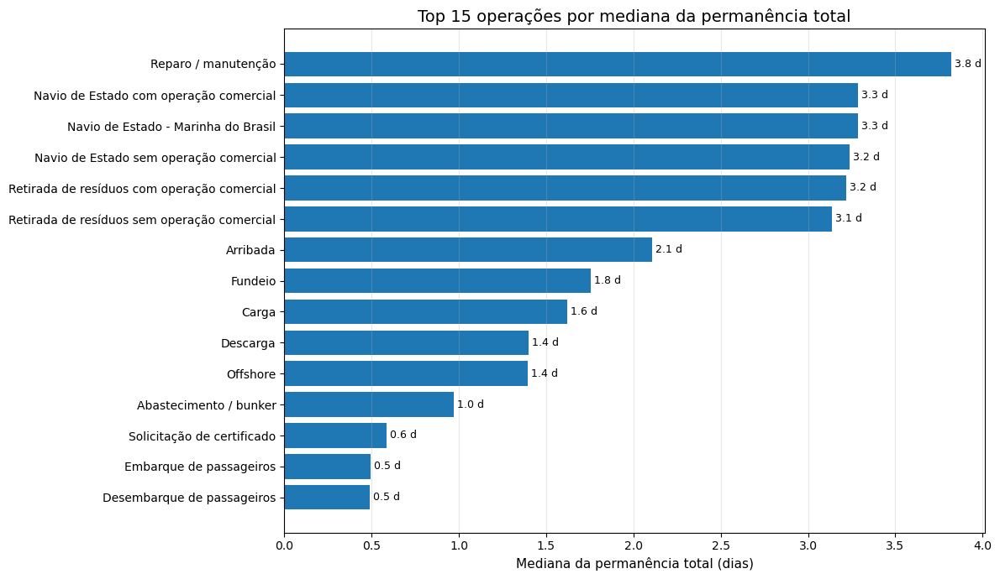

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operations_by_median_total_stay.png')

In [120]:
plot_data = (
    operation_total_summary_filtered
    .sort_values("median_total_d", ascending=False)
    .head(TOP_N_OPERATIONS)
    .sort_values("median_total_d", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["operation_label"],
    plot_data["median_total_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.median_total_d,
        index,
        f" {row.median_total_d:.1f} d",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_OPERATIONS} operações por mediana da permanência total")
ax.set_xlabel("Mediana da permanência total (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_07_operations_by_median_total_stay.png")
plt.show()

figure_path

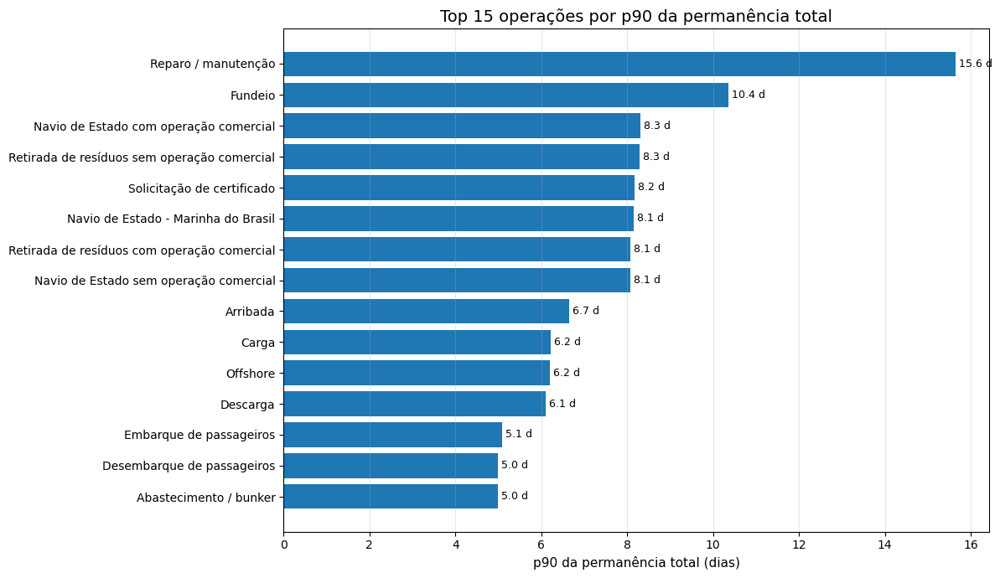

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operations_by_p90_total_stay.png')

In [121]:
plot_data = (
    operation_total_summary_filtered
    .sort_values("p90_total_d", ascending=False)
    .head(TOP_N_OPERATIONS)
    .sort_values("p90_total_d", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["operation_label"],
    plot_data["p90_total_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.p90_total_d,
        index,
        f" {row.p90_total_d:.1f} d",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_OPERATIONS} operações por p90 da permanência total")
ax.set_xlabel("p90 da permanência total (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_07_operations_by_p90_total_stay.png")
plt.show()

figure_path

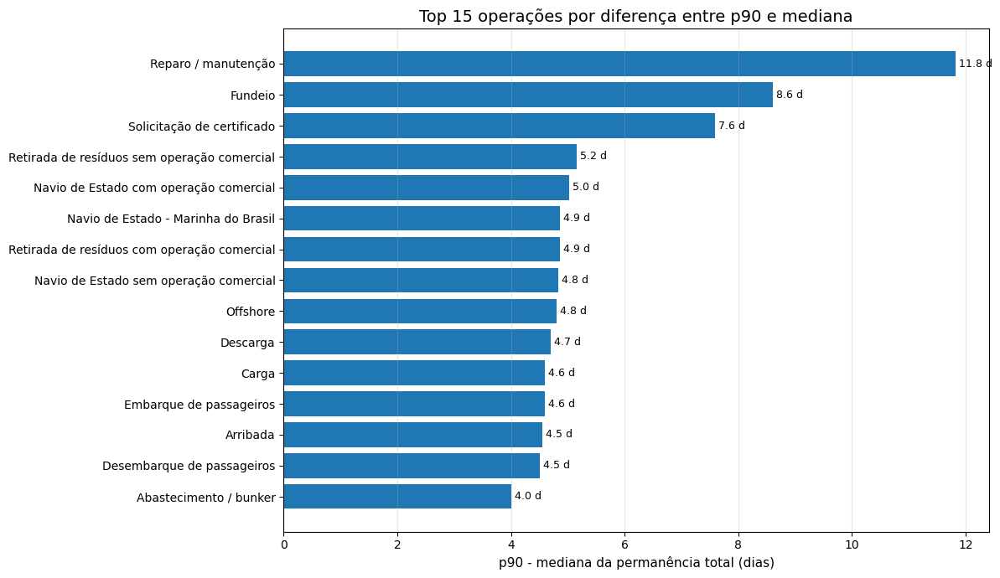

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operations_by_tail_gap.png')

In [122]:
plot_data = (
    operation_total_summary_filtered
    .sort_values("p90_minus_median_d", ascending=False)
    .head(TOP_N_OPERATIONS)
    .sort_values("p90_minus_median_d", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["operation_label"],
    plot_data["p90_minus_median_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.p90_minus_median_d,
        index,
        f" {row.p90_minus_median_d:.1f} d",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_OPERATIONS} operações por diferença entre p90 e mediana")
ax.set_xlabel("p90 - mediana da permanência total (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_07_operations_by_tail_gap.png")
plt.show()

figure_path

A comparação entre mediana, p90 e diferença entre p90 e mediana permite distinguir operações estruturalmente demoradas de operações imprevisíveis.

Uma operação com mediana elevada tende a ter lead time típico maior. Já uma operação com grande diferença entre p90 e mediana pode não ser lenta na maioria dos casos, mas apresenta risco relevante de permanências muito longas.

Essa distinção é importante para planejamento: operações imprevisíveis podem exigir buffers maiores mesmo quando seu comportamento mediano parece controlado.

In [123]:
selected_operations_for_boxplot = (
    operation_total_summary_filtered
    .sort_values("n_calls", ascending=False)
    .head(10)["operation_flag"]
    .tolist()
)

selected_operations_for_boxplot

['op_carga',
 'op_descarga',
 'op_offshore',
 'op_abastecimento_bunker',
 'op_desembarque_passageiros',
 'op_embarque_passageiros',
 'op_solicitacao_certificado',
 'op_fundeio',
 'op_arribada',
 'op_reparo_manutencao']

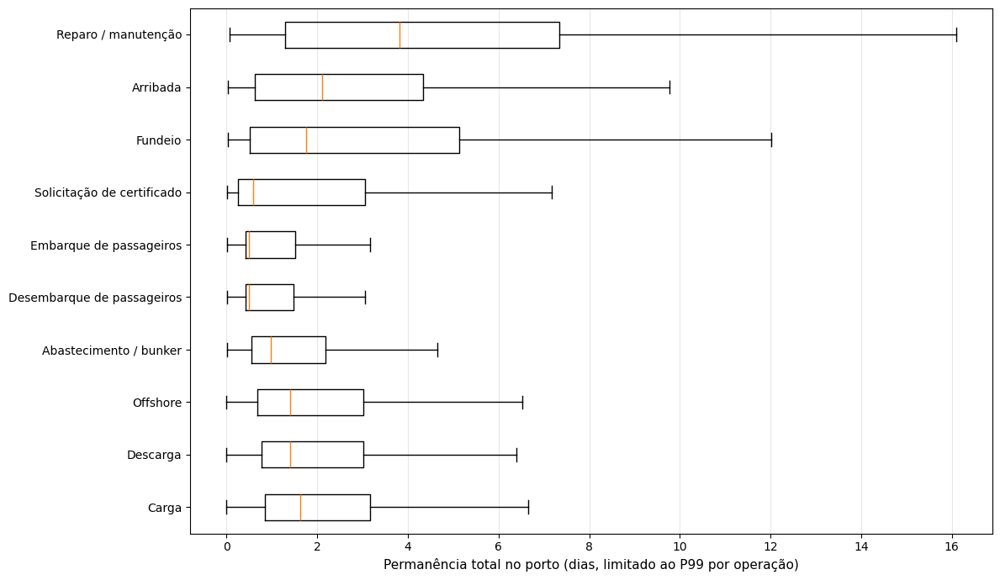

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operation_total_stay_boxplot.png')

In [124]:
boxplot_data = []
boxplot_labels = []

for col in selected_operations_for_boxplot:
    values = (
        df_operations.loc[df_operations[col], "t_total_port_stay_d"]
        .dropna()
    )

    # Clip only for visualization to avoid extreme values compressing the chart.
    values = values.clip(upper=values.quantile(0.99))

    boxplot_data.append(values)
    boxplot_labels.append(operation_labels[col])

fig, ax = plt.subplots(figsize=(12, 7))

ax.boxplot(
    boxplot_data,
    labels=boxplot_labels,
    vert=False,
    showfliers=False,
)

# ax.set_title("Distribuição da permanência total por tipo de operação")
ax.set_xlabel("Permanência total no porto (dias, limitado ao P99 por operação)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_07_operation_total_stay_boxplot.png")
plt.show()

figure_path

O boxplot permite comparar a dispersão da permanência total entre os tipos de operação mais frequentes.

Mesmo quando duas operações têm medianas próximas, a amplitude do intervalo interquartil pode ser diferente. Isso indica níveis distintos de variabilidade operacional.

O gráfico está limitado visualmente ao percentil 99 de cada operação para evitar que poucos valores extremos comprimam a visualização.

### 7.4 Componentes de tempo por tipo de operação

Até aqui, comparamos apenas a permanência total. Agora analisamos como cada operação se comporta em relação aos três componentes do lead time:

1. espera para atracação;
2. operação atracada;
3. pós-operação.

Essa decomposição ajuda a entender se determinado tipo de operação está associado a espera, operação ou pós-operação mais longas.

In [125]:
component_columns_h = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
]

component_labels = {
    "t_wait_for_berthing_h": "Espera para atracação",
    "t_operation_h": "Operação atracada",
    "t_post_operation_h": "Pós-operação",
}

component_order_labels = [
    "Espera para atracação",
    "Operação atracada",
    "Pós-operação",
]

operation_component_rows = []

for op_col in operation_flag_columns:
    subset = df_operations.loc[df_operations[op_col]].copy()

    if len(subset) == 0:
        continue

    for component_col in component_columns_h:
        operation_component_rows.append(
            {
                "operation_flag": op_col,
                "operation_label": operation_labels[op_col],
                "component": component_col,
                "component_label": component_labels[component_col],
                "n_calls": subset["port_call_id"].nunique(),
                "mean_h": subset[component_col].mean(),
                "median_h": subset[component_col].median(),
                "p90_h": subset[component_col].quantile(0.90),
                "zero_pct": (subset[component_col] == 0).mean() * 100,
            }
        )

operation_component_summary = pd.DataFrame(operation_component_rows)

for col in ["mean_h", "median_h", "p90_h"]:
    operation_component_summary[col.replace("_h", "_d")] = (
        operation_component_summary[col] / 24
    )

operation_component_summary["component_label"] = pd.Categorical(
    operation_component_summary["component_label"],
    categories=component_order_labels,
    ordered=True,
)

operation_component_summary_filtered = operation_component_summary.loc[
    operation_component_summary["n_calls"] >= MIN_CALLS_FOR_OPERATION_ANALYSIS
].copy()

operation_component_summary_filtered.head()

,operation_flag,operation_label,component,component_label,n_calls,mean_h,median_h,p90_h,zero_pct,mean_d,median_d,p90_d
0,op_abastecimento_bunker,Abastecimento / bunker,t_wait_for_berthing_h,Espera para atracação,3780,1.13,0.00,0.00,98.07,0.05,0.00,0.00
1,op_abastecimento_bunker,Abastecimento / bunker,t_operation_h,Operação atracada,3780,50.57,23.17,117.76,0.00,2.11,0.97,4.91
2,op_abastecimento_bunker,Abastecimento / bunker,t_post_operation_h,Pós-operação,3780,0.20,0.00,0.00,99.47,0.01,0.00,0.00
3,op_arribada,Arribada,t_wait_for_berthing_h,Espera para atracação,432,4.66,0.00,0.00,95.83,0.19,0.00,0.00
4,op_arribada,Arribada,t_operation_h,Operação atracada,432,72.11,50.40,149.51,0.00,3.00,2.10,6.23


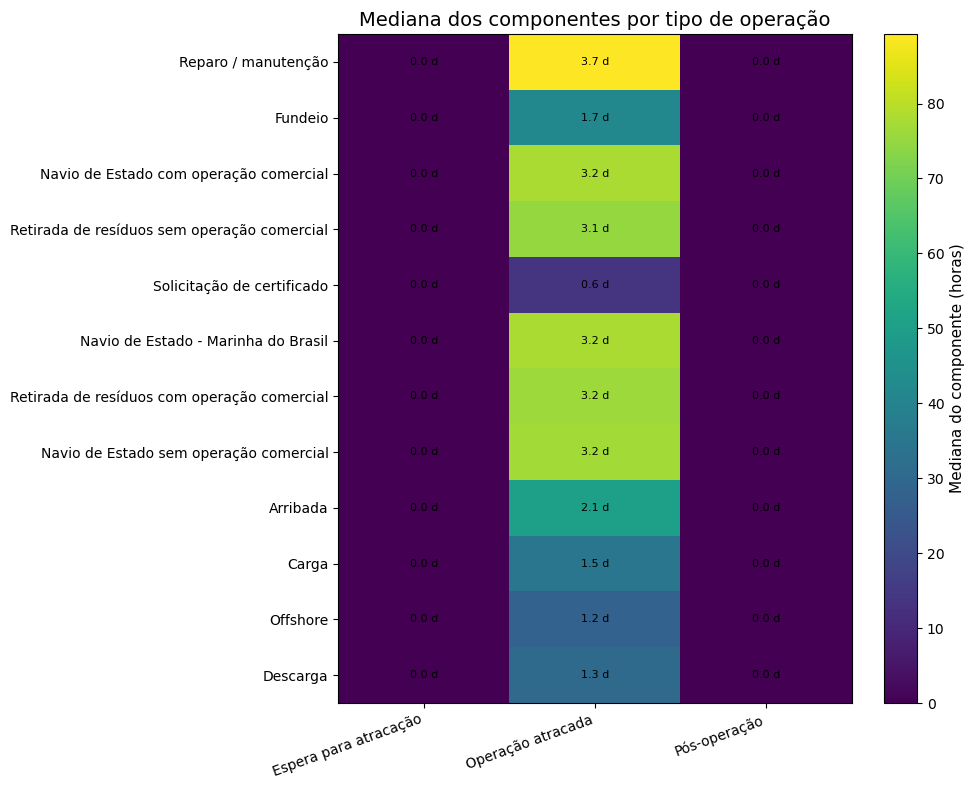

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operation_component_median_heatmap.png')

In [126]:
selected_operations_for_heatmap = (
    operation_total_summary_filtered
    .sort_values("p90_total_d", ascending=False)
    .head(12)["operation_label"]
    .tolist()
)

operation_component_median_pivot = (
    operation_component_summary_filtered
    .loc[
        operation_component_summary_filtered["operation_label"].isin(
            selected_operations_for_heatmap
        )
    ]
    .pivot_table(
        index="operation_label",
        columns="component_label",
        values="median_h",
        aggfunc="first",
        observed=True,
    )
    .reindex(columns=component_order_labels)
)

operation_component_median_pivot = operation_component_median_pivot.loc[
    selected_operations_for_heatmap
]

fig, ax = plt.subplots(figsize=(10, 8))

im = ax.imshow(operation_component_median_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(operation_component_median_pivot.columns)))
ax.set_xticklabels(
    operation_component_median_pivot.columns,
    rotation=20,
    ha="right",
)

ax.set_yticks(np.arange(len(operation_component_median_pivot.index)))
ax.set_yticklabels(operation_component_median_pivot.index)

for i in range(operation_component_median_pivot.shape[0]):
    for j in range(operation_component_median_pivot.shape[1]):
        value = operation_component_median_pivot.iloc[i, j]

        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value / 24:.1f} d",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Mediana do componente (horas)")

ax.set_title("Mediana dos componentes por tipo de operação")

figure_path = save_figure("eda_07_operation_component_median_heatmap.png")
plt.show()

figure_path

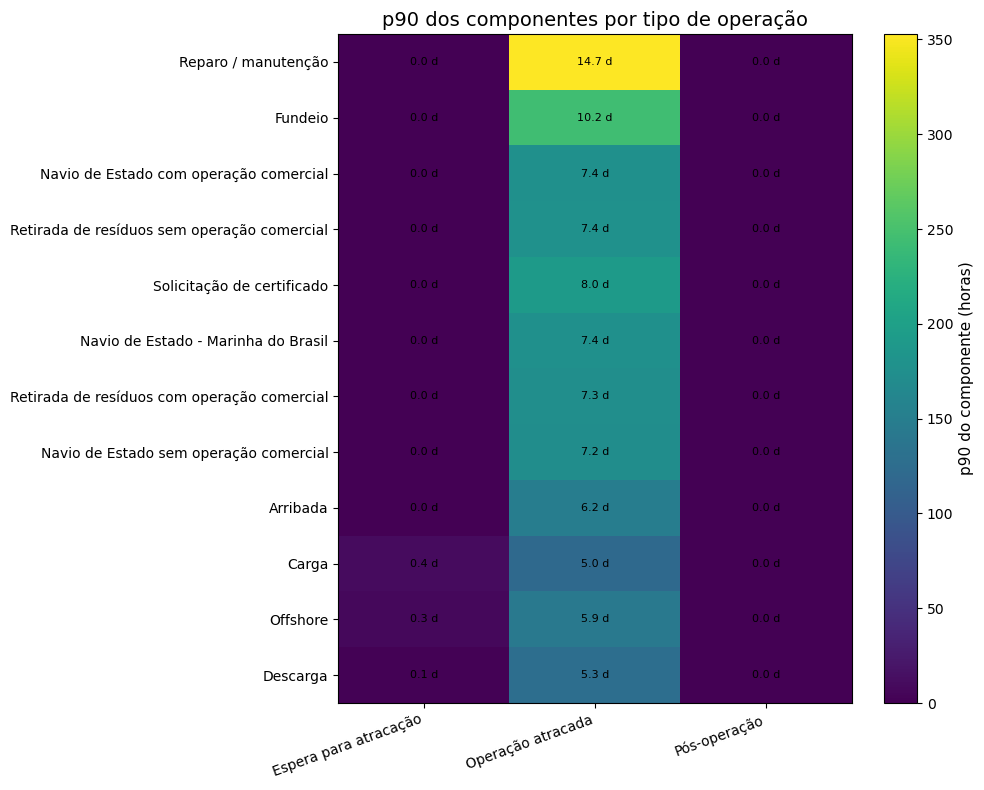

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operation_component_p90_heatmap.png')

In [127]:
operation_component_p90_pivot = (
    operation_component_summary_filtered
    .loc[
        operation_component_summary_filtered["operation_label"].isin(
            selected_operations_for_heatmap
        )
    ]
    .pivot_table(
        index="operation_label",
        columns="component_label",
        values="p90_h",
        aggfunc="first",
        observed=True,
    )
    .reindex(columns=component_order_labels)
)

operation_component_p90_pivot = operation_component_p90_pivot.loc[
    selected_operations_for_heatmap
]

fig, ax = plt.subplots(figsize=(10, 8))

im = ax.imshow(operation_component_p90_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(operation_component_p90_pivot.columns)))
ax.set_xticklabels(
    operation_component_p90_pivot.columns,
    rotation=20,
    ha="right",
)

ax.set_yticks(np.arange(len(operation_component_p90_pivot.index)))
ax.set_yticklabels(operation_component_p90_pivot.index)

for i in range(operation_component_p90_pivot.shape[0]):
    for j in range(operation_component_p90_pivot.shape[1]):
        value = operation_component_p90_pivot.iloc[i, j]

        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value / 24:.1f} d",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("p90 do componente (horas)")

ax.set_title("p90 dos componentes por tipo de operação")

figure_path = save_figure("eda_07_operation_component_p90_heatmap.png")
plt.show()

figure_path

Os heatmaps por componente ajudam a identificar se o impacto de cada operação está concentrado em uma etapa específica.

Se uma operação aparece com valores elevados principalmente em **operação atracada**, isso sugere que sua complexidade está no período em que a embarcação está efetivamente em operação.

Se o destaque aparece em **espera para atracação**, pode haver associação com fila, capacidade, berço ou janelas de atracação. Se aparece em **pós-operação**, pode haver atrasos após a desatracação, possivelmente ligados a liberação, condições de saída ou procedimentos complementares.

### 7.5 Operações e casos extremos

Além de comparar médias, medianas e p90, é útil medir quais tipos de operação aparecem com maior frequência entre os casos extremos.

Nesta análise, um caso extremo é definido como uma escala com permanência total igual ou superior ao p90 nacional.

In [128]:
operation_extreme_rows = []

for col in operation_flag_columns:
    subset = df_operations.loc[df_operations[col]].copy()

    if len(subset) == 0:
        continue

    operation_extreme_rows.append(
        {
            "operation_flag": col,
            "operation_label": operation_labels[col],
            "n_calls": subset["port_call_id"].nunique(),
            "n_extreme_cases": (
                subset["t_total_port_stay_h"] >= national_p90_total_h
            ).sum(),
            "pct_extreme_cases": (
                subset["t_total_port_stay_h"] >= national_p90_total_h
            ).mean() * 100,
        }
    )

operation_extreme_summary = pd.DataFrame(operation_extreme_rows)

operation_extreme_summary = operation_extreme_summary.loc[
    operation_extreme_summary["n_calls"] >= MIN_CALLS_FOR_OPERATION_ANALYSIS
].copy()

operation_extreme_summary = operation_extreme_summary.sort_values(
    "pct_extreme_cases",
    ascending=False,
).reset_index(drop=True)

operation_extreme_summary

,operation_flag,operation_label,n_calls,n_extreme_cases,pct_extreme_cases
0,op_reparo_manutencao,Reparo / manutenção,317,84,26.50
1,op_fundeio,Fundeio,1305,237,18.16
2,op_retirada_residuos_sem_operacao_comercial,Retirada de resíduos sem operação comercial,202,29,14.36
3,op_navio_estado_com_operacao_comercial,Navio de Estado com operação comercial,190,27,14.21
4,op_navio_estado_marinha_brasil,Navio de Estado - Marinha do Brasil,188,26,13.83
5,op_retirada_residuos_com_operacao_comercial,Retirada de resíduos com operação comercial,193,26,13.47
6,op_navio_estado_sem_operacao_comercial,Navio de Estado sem operação comercial,206,27,13.11
7,op_solicitacao_certificado,Solicitação de certificado,1885,228,12.10
8,op_arribada,Arribada,432,41,9.49
9,op_carga,Carga,63445,5626,8.87


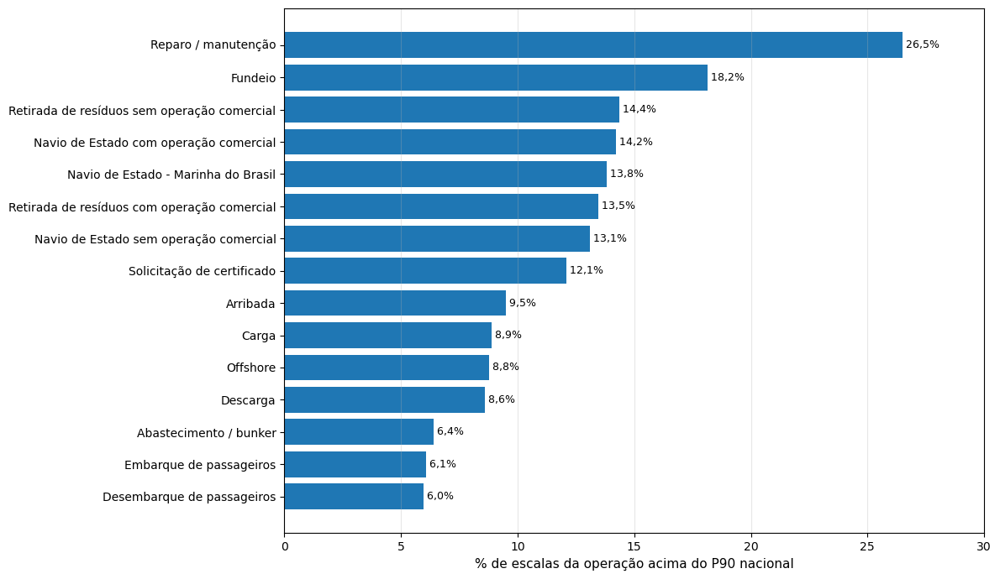

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operations_extreme_case_pct.png')

In [129]:
plot_data = (
    operation_extreme_summary
    .head(TOP_N_OPERATIONS)
    .sort_values("pct_extreme_cases", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["operation_label"],
    plot_data["pct_extreme_cases"],
)

for index, row in enumerate(plot_data.itertuples()):

    pct_extreme_cases_str = f"{row.pct_extreme_cases:.1f}".replace(".", ",")
    
    ax.text(
        row.pct_extreme_cases,
        index,
        f" {pct_extreme_cases_str}% ",
        va="center",
        fontsize=9,
    )

# ax.set_title(
#     f"Top {TOP_N_OPERATIONS} operações por percentual de casos acima do p90 nacional"
# )
ax.set_xlabel("% de escalas da operação acima do P90 nacional")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

ax.set_xlim(0, 30)

figure_path = save_figure("eda_07_operations_extreme_case_pct.png")
plt.show()

figure_path

O percentual de casos extremos por operação mostra quais perfis operacionais têm maior probabilidade de gerar permanências muito longas.

Essa visão é complementar ao p90. Enquanto o p90 mostra o valor de tempo associado à cauda de cada operação, o percentual acima do p90 nacional mostra se aquela operação aparece desproporcionalmente entre os maiores lead times da base.

### 7.6 Combinações de tipos de operação

Como uma escala pode ter mais de um tipo de operação, também é útil observar as combinações mais frequentes.

Essa análise ajuda a identificar se determinados perfis compostos, como carga + descarga, aparecem com frequência relevante na base.

In [130]:
def build_operation_combination_label(row: pd.Series) -> str:
    """Build a readable label with all active operation flags."""
    active_labels = [
        operation_labels[col]
        for col in operation_flag_columns
        if row[col]
    ]

    if not active_labels:
        return "Sem tipo de operação mapeado"

    return " + ".join(active_labels)


df_operations["operation_combination"] = df_operations.apply(
    build_operation_combination_label,
    axis=1,
)

operation_combination_summary = (
    df_operations
    .groupby("operation_combination", dropna=False)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
    )
    .reset_index()
)

operation_combination_summary["mean_total_d"] = (
    operation_combination_summary["mean_total_h"] / 24
)
operation_combination_summary["median_total_d"] = (
    operation_combination_summary["median_total_h"] / 24
)
operation_combination_summary["p90_total_d"] = (
    operation_combination_summary["p90_total_h"] / 24
)

operation_combination_summary["p90_minus_median_d"] = (
    operation_combination_summary["p90_total_d"]
    - operation_combination_summary["median_total_d"]
)

operation_combination_summary = operation_combination_summary.sort_values(
    "n_calls",
    ascending=False,
).reset_index(drop=True)

operation_combination_summary.head(20)

,operation_combination,n_calls,mean_total_h,median_total_h,p90_total_h,mean_total_d,median_total_d,p90_total_d,p90_minus_median_d
0,Offshore,33143,64.97,33.25,148.48,2.71,1.39,6.19,4.80
1,Carga,31394,94.46,59.77,205.87,3.94,2.49,8.58,6.09
2,Carga + Descarga,31316,41.29,24.20,83.92,1.72,1.01,3.50,2.49
3,Descarga,25251,92.18,56.00,213.17,3.84,2.33,8.88,6.55
4,Abastecimento / bunker,2698,39.77,20.00,81.33,1.66,0.83,3.39,2.56
5,Desembarque de passageiros + Embarque de passa...,1914,31.48,11.12,58.95,1.31,0.46,2.46,1.99
6,Solicitação de certificado,1293,66.45,9.33,215.92,2.77,0.39,9.00,8.61
7,Fundeio,781,106.27,35.00,315.33,4.43,1.46,13.14,11.68
8,Abastecimento / bunker + Carga,228,88.15,59.84,177.30,3.67,2.49,7.39,4.89
9,Descarga + Solicitação de certificado,137,7.19,4.75,8.27,0.30,0.20,0.34,0.15


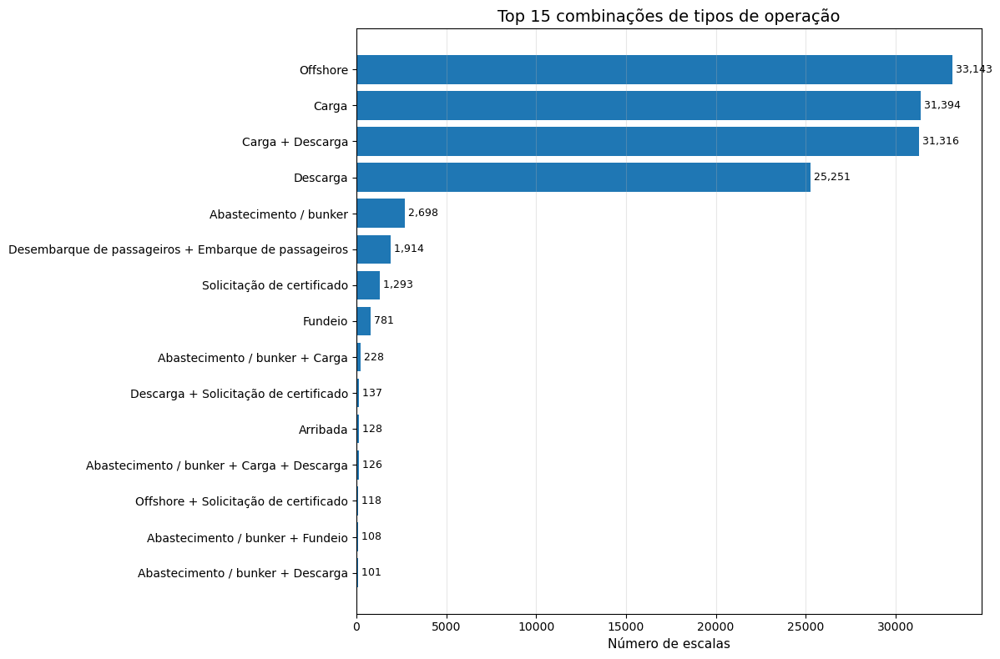

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_top_operation_combinations.png')

In [131]:
TOP_N_COMBINATIONS = 15

plot_data = (
    operation_combination_summary
    .head(TOP_N_COMBINATIONS)
    .sort_values("n_calls", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 8))

ax.barh(
    plot_data["operation_combination"],
    plot_data["n_calls"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.n_calls,
        index,
        f" {row.n_calls:,.0f}",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_COMBINATIONS} combinações de tipos de operação")
ax.set_xlabel("Número de escalas")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_07_top_operation_combinations.png")
plt.show()

figure_path

A análise de combinações mostra que o campo de tipo de operação pode representar múltiplos motivos ou atividades em uma mesma escala.

Para modelagem, isso justifica o uso de flags independentes em vez de uma única variável categórica exclusiva. Dessa forma, o modelo consegue capturar a presença simultânea de múltiplos tipos de operação.

### 7.7 Score exploratório de risco por operação

Para sintetizar a análise, criamos um score exploratório por tipo de operação.

O score combina três dimensões:

1. volume de escalas;
2. p90 da permanência total;
3. diferença entre p90 e mediana.

Esse score não é um modelo estatístico, mas ajuda a priorizar operações que combinam relevância na base e risco de permanência elevada.

In [132]:
operation_risk_score = operation_total_summary_filtered.copy()

operation_risk_score["volume_rank_pct"] = operation_risk_score["n_calls"].rank(pct=True)
operation_risk_score["p90_rank_pct"] = operation_risk_score["p90_total_d"].rank(pct=True)
operation_risk_score["tail_gap_rank_pct"] = (
    operation_risk_score["p90_minus_median_d"].rank(pct=True)
)

operation_risk_score["operation_risk_score"] = (
    operation_risk_score["volume_rank_pct"]
    + operation_risk_score["p90_rank_pct"]
    + operation_risk_score["tail_gap_rank_pct"]
)

operation_risk_score = operation_risk_score.sort_values(
    "operation_risk_score",
    ascending=False,
).reset_index(drop=True)

operation_risk_score[
    [
        "operation_label",
        "n_calls",
        "median_total_d",
        "p90_total_d",
        "p90_minus_median_d",
        "pct_above_national_p90",
        "operation_risk_score",
    ]
].head(20)

,operation_label,n_calls,median_total_d,p90_total_d,p90_minus_median_d,pct_above_national_p90,operation_risk_score
0,Fundeio,1305,1.75,10.36,8.61,18.16,2.40
1,Reparo / manutenção,317,3.82,15.64,11.82,26.50,2.40
2,Solicitação de certificado,1885,0.58,8.17,7.58,12.10,2.20
3,Retirada de resíduos sem operação comercial,202,3.14,8.29,5.15,14.36,1.87
4,Navio de Estado com operação comercial,190,3.29,8.32,5.03,14.21,1.73
5,Carga,63445,1.62,6.22,4.60,8.87,1.73
6,Offshore,33700,1.40,6.20,4.81,8.78,1.67
7,Descarga,57279,1.40,6.10,4.70,8.59,1.60
8,Retirada de resíduos com operação comercial,193,3.22,8.08,4.86,13.47,1.40
9,Navio de Estado - Marinha do Brasil,188,3.29,8.15,4.86,13.83,1.40


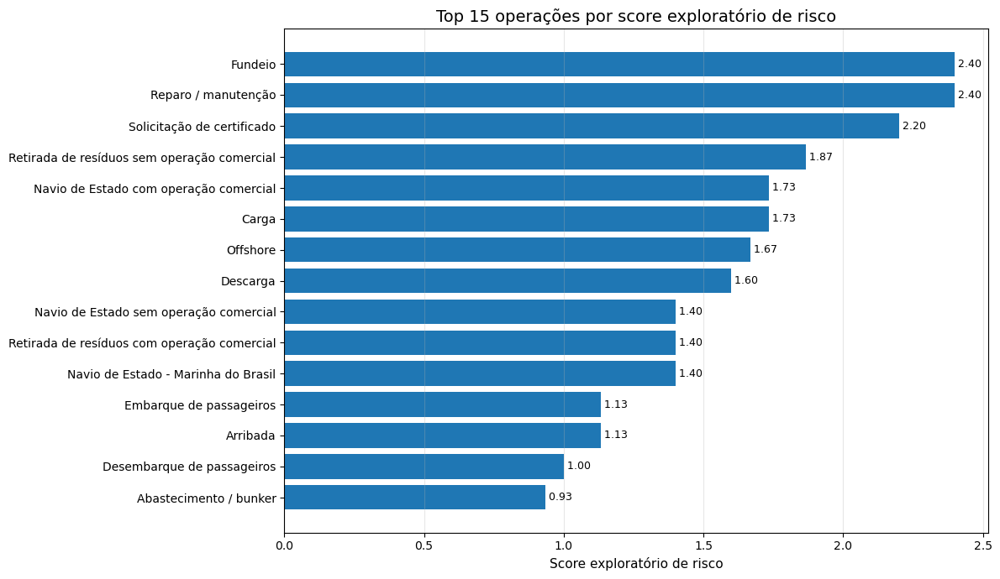

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_07_operation_risk_score.png')

In [133]:
plot_data = (
    operation_risk_score
    .head(TOP_N_OPERATIONS)
    .sort_values("operation_risk_score", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["operation_label"],
    plot_data["operation_risk_score"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.operation_risk_score,
        index,
        f" {row.operation_risk_score:.2f}",
        va="center",
        fontsize=9,
    )

ax.set_title(f"Top {TOP_N_OPERATIONS} operações por score exploratório de risco")
ax.set_xlabel("Score exploratório de risco")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_07_operation_risk_score.png")
plt.show()

figure_path

In [134]:
most_common_operation = operation_frequency.iloc[0]
highest_median_operation = operation_total_summary_filtered.sort_values(
    "median_total_d",
    ascending=False,
).iloc[0]
highest_p90_operation = operation_total_summary_filtered.sort_values(
    "p90_total_d",
    ascending=False,
).iloc[0]
highest_tail_gap_operation = operation_total_summary_filtered.sort_values(
    "p90_minus_median_d",
    ascending=False,
).iloc[0]
highest_extreme_pct_operation = operation_extreme_summary.iloc[0]
highest_risk_score_operation = operation_risk_score.iloc[0]

section_7_narrative = f"""
A análise por tipo de operação mostra diferenças importantes no perfil de permanência portuária.

A operação mais frequente na base é {most_common_operation['operation_label']}, presente em {most_common_operation['n_calls']:,.0f} escalas ({most_common_operation['pct_calls']:.1f}% da base).

A maior mediana de permanência total aparece em {highest_median_operation['operation_label']}, com {highest_median_operation['median_total_d']:.2f} dias.
O maior p90 aparece em {highest_p90_operation['operation_label']}, com {highest_p90_operation['p90_total_d']:.2f} dias.
A maior diferença entre p90 e mediana aparece em {highest_tail_gap_operation['operation_label']}, com abertura de cauda de {highest_tail_gap_operation['p90_minus_median_d']:.2f} dias.

A operação com maior percentual de casos acima do p90 nacional é {highest_extreme_pct_operation['operation_label']}, com {highest_extreme_pct_operation['pct_extreme_cases']:.1f}% de suas escalas acima desse limite.

Combinando volume, p90 e diferença entre p90 e mediana, a operação com maior score exploratório de risco é {highest_risk_score_operation['operation_label']}.
"""

print(section_7_narrative)


A análise por tipo de operação mostra diferenças importantes no perfil de permanência portuária.

A operação mais frequente na base é Carga, presente em 63,445 escalas (48.9% da base).

A maior mediana de permanência total aparece em Reparo / manutenção, com 3.82 dias.
O maior p90 aparece em Reparo / manutenção, com 15.64 dias.
A maior diferença entre p90 e mediana aparece em Reparo / manutenção, com abertura de cauda de 11.82 dias.

A operação com maior percentual de casos acima do p90 nacional é Reparo / manutenção, com 26.5% de suas escalas acima desse limite.

Combinando volume, p90 e diferença entre p90 e mediana, a operação com maior score exploratório de risco é Fundeio.



In [135]:
operation_frequency_path = TABLES_DIR / "eda_07_operation_frequency.csv"
operation_total_summary_path = TABLES_DIR / "eda_07_operation_total_summary.csv"
operation_component_summary_path = TABLES_DIR / "eda_07_operation_component_summary.csv"
operation_extreme_summary_path = TABLES_DIR / "eda_07_operation_extreme_summary.csv"
operation_combination_summary_path = TABLES_DIR / "eda_07_operation_combination_summary.csv"
operation_risk_score_path = TABLES_DIR / "eda_07_operation_risk_score.csv"

operation_frequency.to_csv(operation_frequency_path, index=False)
operation_total_summary_filtered.to_csv(operation_total_summary_path, index=False)
operation_component_summary_filtered.to_csv(operation_component_summary_path, index=False)
operation_extreme_summary.to_csv(operation_extreme_summary_path, index=False)
operation_combination_summary.to_csv(operation_combination_summary_path, index=False)
operation_risk_score.to_csv(operation_risk_score_path, index=False)

[
    operation_frequency_path,
    operation_total_summary_path,
    operation_component_summary_path,
    operation_extreme_summary_path,
    operation_combination_summary_path,
    operation_risk_score_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_07_operation_frequency.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_07_operation_total_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_07_operation_component_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_07_operation_extreme_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_07_operation_combination_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_07_operation_risk_score.csv')]

### Principais mensagens da seção

A análise por tipo de operação mostra que o perfil operacional da escala é uma dimensão relevante para explicar a permanência portuária.

Operações diferentes apresentam comportamentos distintos em volume, tempo típico, p90, cauda e participação entre os casos extremos. Isso reforça que a permanência no porto não depende apenas da localização geográfica, mas também da natureza da operação realizada.

A análise dos componentes mostra que determinados tipos de operação podem estar mais associados à operação atracada, enquanto outros podem apresentar maior espera para atracação ou pós-operação. Essa distinção ajuda a aproximar a análise estatística da interpretação operacional.

Para a etapa de modelagem, os tipos de operação devem ser considerados como features relevantes. Como uma mesma escala pode ter múltiplos tipos de operação, a representação por flags independentes parece mais adequada do que uma única variável categórica exclusiva.

A próxima seção investigará a dimensão temporal da permanência portuária: sazonalidade, mês, dia da semana, turno de chegada e possíveis padrões de calendário.

---

## 8. Sazonalidade e calendário operacional

Depois de analisar diferenças por porto, região e tipo de operação, esta seção investiga a dimensão temporal da permanência portuária.

A pergunta principal é:

> O lead time portuário varia de acordo com o calendário?

Essa pergunta pode ser explorada em diferentes níveis:

- evolução ao longo dos anos;
- comportamento mensal;
- diferenças entre dias úteis e finais de semana;
- diferenças por dia da semana;
- diferenças por hora ou turno de chegada;
- possíveis padrões sazonais por região.

Essa análise é relevante porque variações temporais podem indicar efeitos de sazonalidade, ciclos operacionais, concentração de demanda, restrições de capacidade, janelas portuárias ou padrões climáticos indiretos.

Para o TCC, identificar padrões de calendário é importante porque variáveis temporais são candidatas naturais para modelos preditivos de lead time.

In [136]:
# Ensure arrival timestamp is available and parsed
if "arrival_port_ts" not in df.columns:
    raise ValueError("Required column not found: arrival_port_ts")

df_time = df.copy()
df_time["arrival_port_ts"] = pd.to_datetime(df_time["arrival_port_ts"], errors="coerce")

# Create calendar features if they are not already available
if "arrival_year" not in df_time.columns:
    df_time["arrival_year"] = df_time["arrival_port_ts"].dt.year

if "arrival_month" not in df_time.columns:
    df_time["arrival_month"] = df_time["arrival_port_ts"].dt.month

if "arrival_quarter" not in df_time.columns:
    df_time["arrival_quarter"] = df_time["arrival_port_ts"].dt.quarter

if "arrival_weekofyear" not in df_time.columns:
    df_time["arrival_weekofyear"] = df_time["arrival_port_ts"].dt.isocalendar().week.astype("Int64")

if "arrival_dayofweek" not in df_time.columns:
    df_time["arrival_dayofweek"] = df_time["arrival_port_ts"].dt.dayofweek

if "arrival_hour" not in df_time.columns:
    df_time["arrival_hour"] = df_time["arrival_port_ts"].dt.hour

if "arrival_is_weekend" not in df_time.columns:
    df_time["arrival_is_weekend"] = df_time["arrival_dayofweek"].isin([5, 6]).astype("Int64")

# Create month-start period for time series
df_time["arrival_month_start"] = df_time["arrival_port_ts"].dt.to_period("M").dt.to_timestamp()

print(f"Rows with valid arrival timestamp: {df_time['arrival_port_ts'].notna().sum():,}")
print(f"Period: {df_time['arrival_port_ts'].min()} to {df_time['arrival_port_ts'].max()}")

Rows with valid arrival timestamp: 129,625
Period: 2023-01-01 00:08:00 to 2025-12-31 23:00:00


In [137]:
MONTH_LABELS_PT = {
    1: "Jan",
    2: "Fev",
    3: "Mar",
    4: "Abr",
    5: "Mai",
    6: "Jun",
    7: "Jul",
    8: "Ago",
    9: "Set",
    10: "Out",
    11: "Nov",
    12: "Dez",
}

DAY_OF_WEEK_LABELS_PT = {
    0: "Segunda",
    1: "Terça",
    2: "Quarta",
    3: "Quinta",
    4: "Sexta",
    5: "Sábado",
    6: "Domingo",
}

SHIFT_LABELS_PT = {
    "night": "Madrugada",
    "morning": "Manhã",
    "afternoon": "Tarde",
    "evening": "Noite",
}

SEASON_LABELS_PT = {
    "summer": "Verão",
    "autumn": "Outono",
    "winter": "Inverno",
    "spring": "Primavera",
}

SHIFT_ORDER = ["Madrugada", "Manhã", "Tarde", "Noite"]
SEASON_ORDER = ["Verão", "Outono", "Inverno", "Primavera"]

df_time["arrival_month_label"] = df_time["arrival_month"].map(MONTH_LABELS_PT)
df_time["arrival_dayofweek_label"] = df_time["arrival_dayofweek"].map(DAY_OF_WEEK_LABELS_PT)

if "arrival_shift" in df_time.columns:
    df_time["arrival_shift_label"] = df_time["arrival_shift"].map(SHIFT_LABELS_PT)
else:
    def map_shift_pt(hour: int) -> str:
        """Map hour of day to Portuguese shift label."""
        if pd.isna(hour):
            return np.nan
        if 0 <= hour < 6:
            return "Madrugada"
        if 6 <= hour < 12:
            return "Manhã"
        if 12 <= hour < 18:
            return "Tarde"
        return "Noite"

    df_time["arrival_shift_label"] = df_time["arrival_hour"].apply(map_shift_pt)

if "arrival_season" in df_time.columns:
    df_time["arrival_season_label"] = df_time["arrival_season"].map(SEASON_LABELS_PT)
else:
    def map_season_pt(month: int) -> str:
        """Map month to season label for the Southern Hemisphere."""
        if pd.isna(month):
            return np.nan
        if month in [12, 1, 2]:
            return "Verão"
        if month in [3, 4, 5]:
            return "Outono"
        if month in [6, 7, 8]:
            return "Inverno"
        return "Primavera"

    df_time["arrival_season_label"] = df_time["arrival_month"].apply(map_season_pt)

df_time["arrival_month_label"] = pd.Categorical(
    df_time["arrival_month_label"],
    categories=list(MONTH_LABELS_PT.values()),
    ordered=True,
)

df_time["arrival_dayofweek_label"] = pd.Categorical(
    df_time["arrival_dayofweek_label"],
    categories=list(DAY_OF_WEEK_LABELS_PT.values()),
    ordered=True,
)

df_time["arrival_shift_label"] = pd.Categorical(
    df_time["arrival_shift_label"],
    categories=SHIFT_ORDER,
    ordered=True,
)

df_time["arrival_season_label"] = pd.Categorical(
    df_time["arrival_season_label"],
    categories=SEASON_ORDER,
    ordered=True,
)

### Métricas analisadas

Nesta seção, a análise temporal será feita principalmente sobre a permanência total no porto, medida em dias.

As principais métricas serão:

- número de escalas;
- mediana da permanência total;
- p90 da permanência total;
- diferença entre p90 e mediana.

A mediana representa o comportamento típico, enquanto o p90 representa o cenário de maior risco operacional.

In [138]:
monthly_summary = (
    df_time
    .dropna(subset=["arrival_month_start"])
    .groupby("arrival_month_start")
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p75_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.75)),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
)

for col in ["mean_total_h", "median_total_h", "p75_total_h", "p90_total_h", "p95_total_h"]:
    monthly_summary[col.replace("_h", "_d")] = monthly_summary[col] / 24

monthly_summary["p90_minus_median_d"] = (
    monthly_summary["p90_total_d"] - monthly_summary["median_total_d"]
)

monthly_summary.head()

,arrival_month_start,n_calls,mean_total_h,median_total_h,p75_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,p75_total_d,p90_total_d,p95_total_d,p90_minus_median_d
0,2023-01-01,3698,68.45,34.82,76.40,162.66,261.68,2.85,1.45,3.18,6.78,10.90,5.33
1,2023-02-01,3410,70.07,34.25,77.57,168.43,260.92,2.92,1.43,3.23,7.02,10.87,5.59
2,2023-03-01,3909,69.14,34.90,77.83,160.49,258.45,2.88,1.45,3.24,6.69,10.77,5.23
3,2023-04-01,3723,72.14,35.67,79.68,167.74,273.85,3.01,1.49,3.32,6.99,11.41,5.50
4,2023-05-01,3877,75.60,37.75,81.25,184.30,295.28,3.15,1.57,3.39,7.68,12.30,6.11


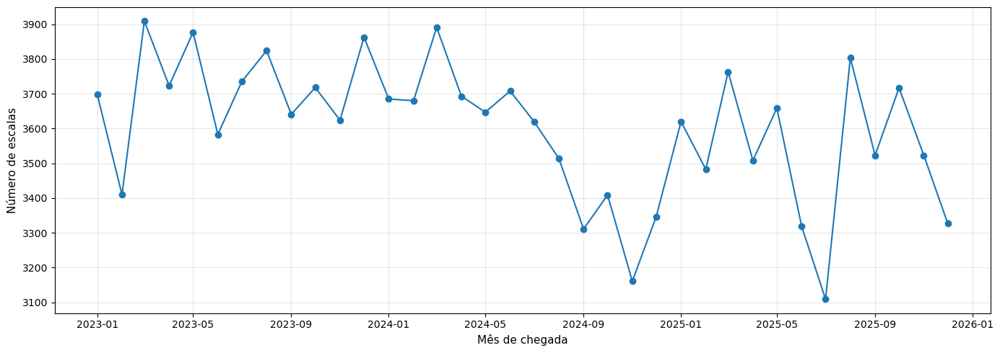

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_monthly_call_volume.png')

In [139]:
fig, ax = plt.subplots(figsize=(14, 5))

ax.plot(
    monthly_summary["arrival_month_start"],
    monthly_summary["n_calls"],
    marker="o",
    linewidth=1.5,
)

# ax.set_title("Volume mensal de escalas portuárias na base elegível")
ax.set_xlabel("Mês de chegada")
ax.set_ylabel("Número de escalas")
ax.grid(alpha=0.3)

figure_path = save_figure("eda_08_monthly_call_volume.png")
plt.show()

figure_path

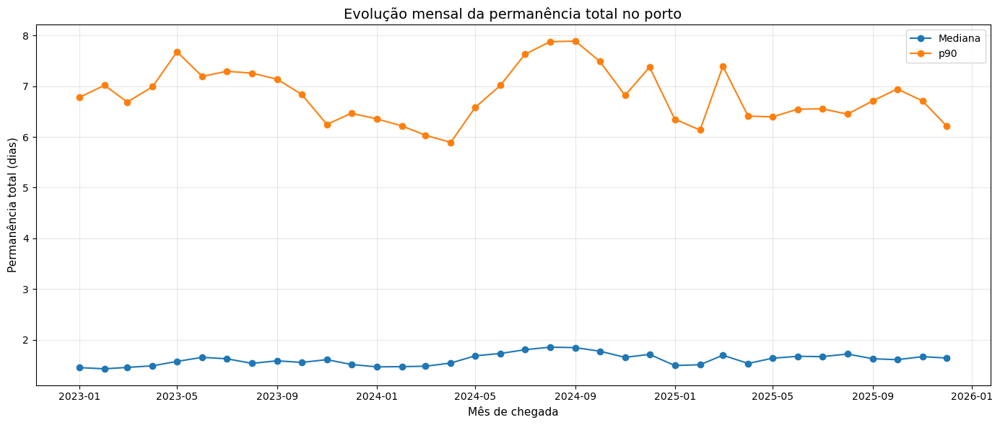

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_monthly_median_p90_total_stay.png')

In [140]:
fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(
    monthly_summary["arrival_month_start"],
    monthly_summary["median_total_d"],
    marker="o",
    linewidth=1.5,
    label="Mediana",
)

ax.plot(
    monthly_summary["arrival_month_start"],
    monthly_summary["p90_total_d"],
    marker="o",
    linewidth=1.5,
    label="p90",
)

ax.set_title("Evolução mensal da permanência total no porto")
ax.set_xlabel("Mês de chegada")
ax.set_ylabel("Permanência total (dias)")
ax.grid(alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_monthly_median_p90_total_stay.png")
plt.show()

figure_path

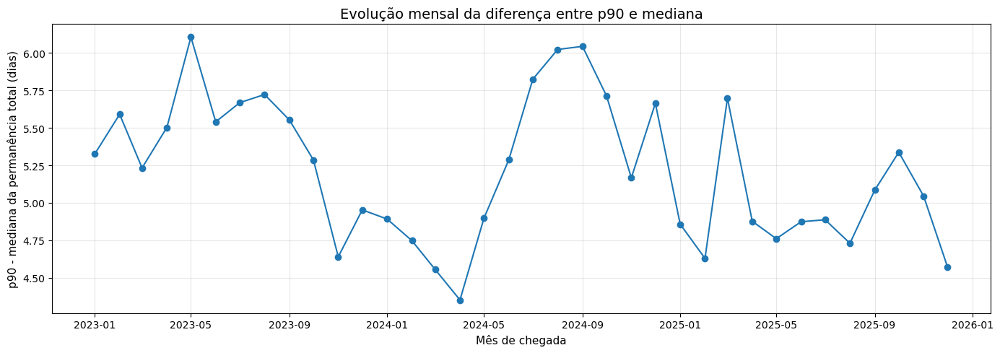

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_monthly_tail_gap.png')

In [141]:
fig, ax = plt.subplots(figsize=(14, 5))

ax.plot(
    monthly_summary["arrival_month_start"],
    monthly_summary["p90_minus_median_d"],
    marker="o",
    linewidth=1.5,
)

ax.set_title("Evolução mensal da diferença entre p90 e mediana")
ax.set_xlabel("Mês de chegada")
ax.set_ylabel("p90 - mediana da permanência total (dias)")
ax.grid(alpha=0.3)

figure_path = save_figure("eda_08_monthly_tail_gap.png")
plt.show()

figure_path

A evolução mensal ajuda a verificar se a permanência portuária apresenta tendência ou períodos de maior risco.

O volume mensal mostra se a base tem cobertura relativamente estável ao longo do tempo. Já a comparação entre mediana e p90 mostra se os meses de maior risco estão associados a aumento generalizado do tempo típico ou apenas ao alongamento da cauda.

Quando a diferença entre p90 e mediana aumenta, isso sugere que o comportamento típico pode continuar relativamente estável, mas os casos extremos ficam mais severos.

In [142]:
month_summary = (
    df_time
    .dropna(subset=["arrival_month"])
    .groupby(["arrival_month", "arrival_month_label"], observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p75_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.75)),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
    .sort_values("arrival_month")
)

for col in ["mean_total_h", "median_total_h", "p75_total_h", "p90_total_h", "p95_total_h"]:
    month_summary[col.replace("_h", "_d")] = month_summary[col] / 24

month_summary["p90_minus_median_d"] = (
    month_summary["p90_total_d"] - month_summary["median_total_d"]
)

month_summary

,arrival_month,arrival_month_label,n_calls,mean_total_h,median_total_h,p75_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,p75_total_d,p90_total_d,p95_total_d,p90_minus_median_d
0,1,Jan,11003,67.31,35.23,77.04,154.58,240.50,2.80,1.47,3.21,6.44,10.02,4.97
1,2,Fev,10573,67.55,35.40,75.83,156.00,237.70,2.81,1.47,3.16,6.50,9.90,5.03
2,3,Mar,11563,69.17,36.50,79.82,159.73,245.00,2.88,1.52,3.33,6.66,10.21,5.13
3,4,Abr,10924,67.49,36.50,78.88,153.49,230.88,2.81,1.52,3.29,6.40,9.62,4.87
4,5,Mai,11183,72.10,39.08,81.39,162.58,261.97,3.00,1.63,3.39,6.77,10.92,5.15
5,6,Jun,10610,72.19,40.41,82.92,165.53,258.92,3.01,1.68,3.45,6.90,10.79,5.21
6,7,Jul,10464,75.50,40.77,84.25,172.30,274.13,3.15,1.70,3.51,7.18,11.42,5.48
7,8,Ago,11141,74.57,40.85,82.92,172.25,273.88,3.11,1.70,3.45,7.18,11.41,5.47
8,9,Set,10475,75.31,40.25,83.58,175.32,279.22,3.14,1.68,3.48,7.31,11.63,5.63
9,10,Out,10844,73.71,39.25,82.00,168.47,265.68,3.07,1.64,3.42,7.02,11.07,5.38


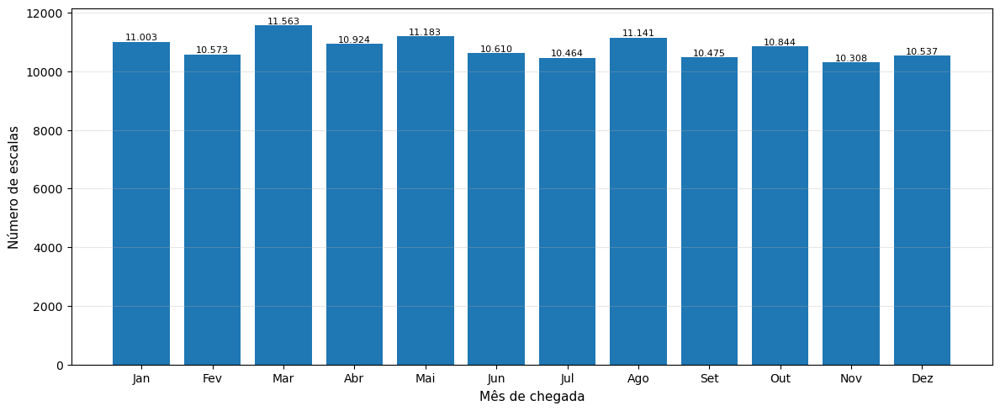

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_volume_by_month_of_year.png')

In [143]:
plot_data = month_summary.copy()

fig, ax = plt.subplots(figsize=(12, 5))

ax.bar(
    plot_data["arrival_month_label"],
    plot_data["n_calls"],
)

for index, row in plot_data.iterrows():

    n_calls_str = f"{row['n_calls']:,.0f}".replace(",", ".")
    
    ax.text(
        index,
        row["n_calls"],
        n_calls_str,
        ha="center",
        va="bottom",
        fontsize=8,
    )

# ax.set_title("Volume de escalas por mês do ano")
ax.set_xlabel("Mês de chegada")
ax.set_ylabel("Número de escalas")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_08_volume_by_month_of_year.png")
plt.show()

figure_path

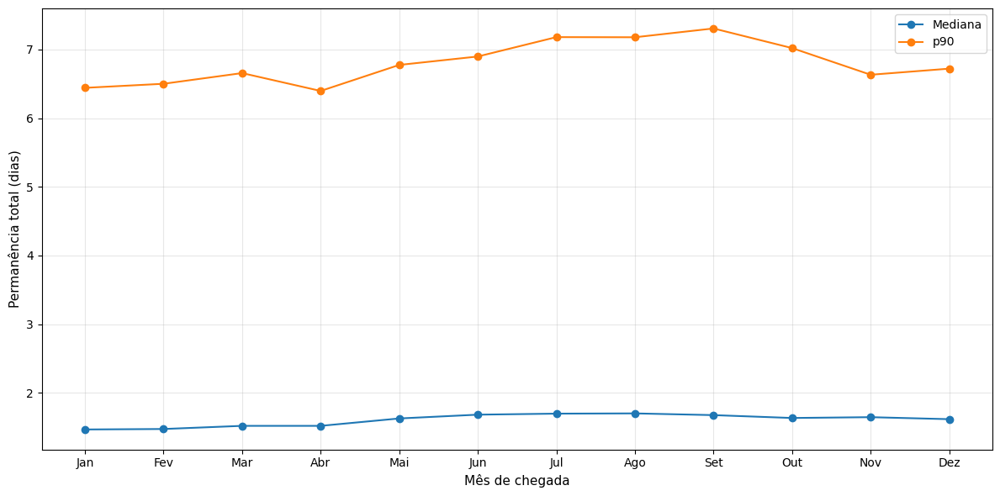

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_median_p90_by_month_of_year.png')

In [144]:
plot_data = month_summary.copy()

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(
    plot_data["arrival_month_label"],
    plot_data["median_total_d"],
    marker="o",
    linewidth=1.5,
    label="Mediana",
)

ax.plot(
    plot_data["arrival_month_label"],
    plot_data["p90_total_d"],
    marker="o",
    linewidth=1.5,
    label="p90",
)

# ax.set_title("Permanência total por mês do ano")
ax.set_xlabel("Mês de chegada")
ax.set_ylabel("Permanência total (dias)")
ax.grid(alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_median_p90_by_month_of_year.png")
plt.show()

figure_path

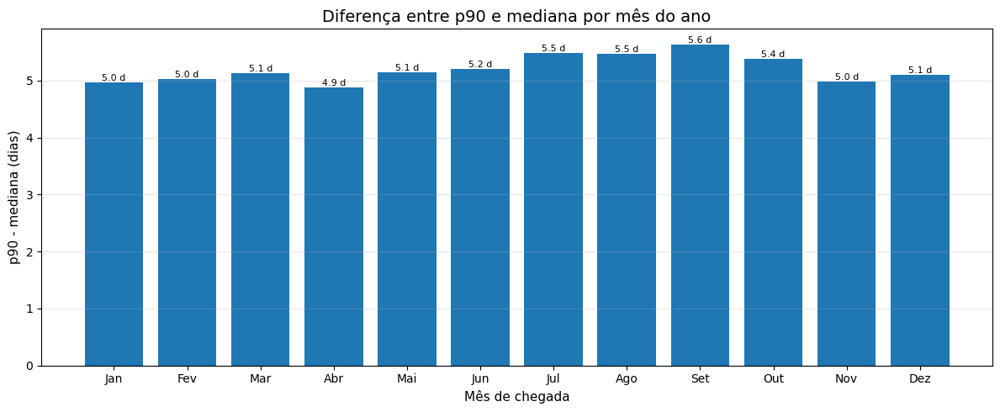

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_tail_gap_by_month_of_year.png')

In [145]:
plot_data = month_summary.copy()

fig, ax = plt.subplots(figsize=(12, 5))

ax.bar(
    plot_data["arrival_month_label"],
    plot_data["p90_minus_median_d"],
)

for index, row in plot_data.iterrows():
    ax.text(
        index,
        row["p90_minus_median_d"],
        f"{row['p90_minus_median_d']:.1f} d",
        ha="center",
        va="bottom",
        fontsize=8,
    )

ax.set_title("Diferença entre p90 e mediana por mês do ano")
ax.set_xlabel("Mês de chegada")
ax.set_ylabel("p90 - mediana (dias)")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_08_tail_gap_by_month_of_year.png")
plt.show()

figure_path

A análise por mês do ano busca identificar sazonalidade recorrente.

Se determinados meses apresentam mediana mais alta, pode haver um aumento estrutural do tempo típico nesses períodos. Se o p90 aumenta mais do que a mediana, o efeito parece estar mais associado à cauda de risco do que ao comportamento típico.

Esse tipo de padrão é relevante para modelos preditivos porque o mês de chegada pode carregar informações sobre demanda, safra, clima, sazonalidade de cargas ou restrições operacionais.

In [146]:
month_region_summary = (
    df_time
    .dropna(subset=["arrival_month", "region"])
    .groupby(["region", "arrival_month", "arrival_month_label"], observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
    )
    .reset_index()
)

month_region_summary["median_total_d"] = month_region_summary["median_total_h"] / 24
month_region_summary["p90_total_d"] = month_region_summary["p90_total_h"] / 24
month_region_summary["p90_minus_median_d"] = (
    month_region_summary["p90_total_d"] - month_region_summary["median_total_d"]
)

month_region_summary.head()

,region,arrival_month,arrival_month_label,n_calls,median_total_h,p90_total_h,median_total_d,p90_total_d,p90_minus_median_d
0,NORDESTE,1,Jan,2138,35.23,138.60,1.47,5.78,4.31
1,NORDESTE,2,Fev,2040,32.92,148.59,1.37,6.19,4.82
2,NORDESTE,3,Mar,2233,34.85,145.03,1.45,6.04,4.59
3,NORDESTE,4,Abr,2036,37.41,146.38,1.56,6.10,4.54
4,NORDESTE,5,Mai,2208,40.00,159.49,1.67,6.65,4.98


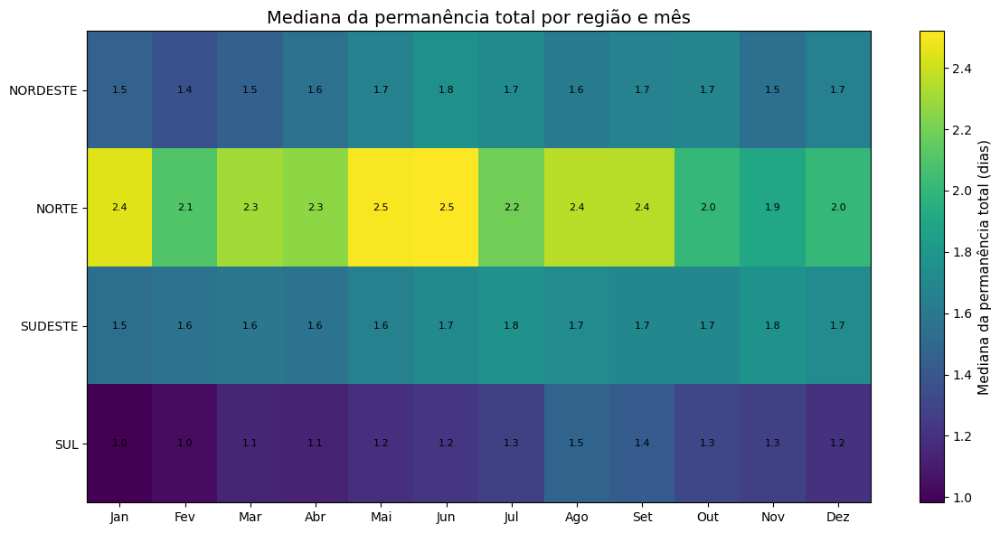

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_heatmap_region_month_median.png')

In [147]:
month_region_median_pivot = (
    month_region_summary
    .pivot_table(
        index="region",
        columns="arrival_month_label",
        values="median_total_d",
        aggfunc="first",
        observed=True,
    )
    .reindex(columns=list(MONTH_LABELS_PT.values()))
)

fig, ax = plt.subplots(figsize=(12, 6))

im = ax.imshow(month_region_median_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(month_region_median_pivot.columns)))
ax.set_xticklabels(month_region_median_pivot.columns)

ax.set_yticks(np.arange(len(month_region_median_pivot.index)))
ax.set_yticklabels(month_region_median_pivot.index)

for i in range(month_region_median_pivot.shape[0]):
    for j in range(month_region_median_pivot.shape[1]):
        value = month_region_median_pivot.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value:.1f}",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Mediana da permanência total (dias)")

ax.set_title("Mediana da permanência total por região e mês")

figure_path = save_figure("eda_08_heatmap_region_month_median.png")
plt.show()

figure_path

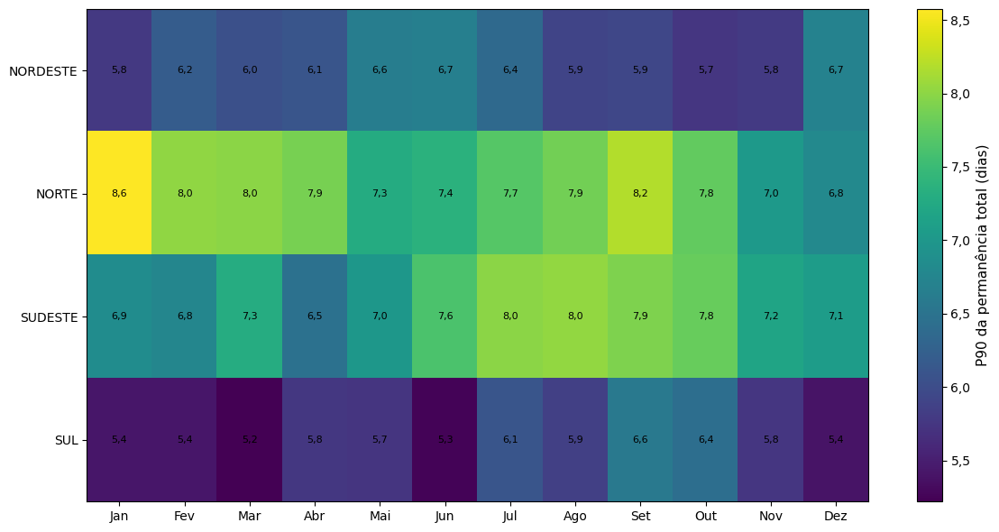

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_heatmap_region_month_p90.png')

In [148]:
import matplotlib.ticker as mticker

month_region_p90_pivot = (
    month_region_summary
    .pivot_table(
        index="region",
        columns="arrival_month_label",
        values="p90_total_d",
        aggfunc="first",
        observed=True,
    )
    .reindex(columns=list(MONTH_LABELS_PT.values()))
)

fig, ax = plt.subplots(figsize=(12, 6))

im = ax.imshow(month_region_p90_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(month_region_p90_pivot.columns)))
ax.set_xticklabels(month_region_p90_pivot.columns)

ax.set_yticks(np.arange(len(month_region_p90_pivot.index)))
ax.set_yticklabels(month_region_p90_pivot.index)

for i in range(month_region_p90_pivot.shape[0]):
    for j in range(month_region_p90_pivot.shape[1]):
        value = month_region_p90_pivot.iloc[i, j]
        value_str = f"{value:.1f}".replace(".", ",")
        if pd.notna(value):
            ax.text(
                j,
                i,
                value_str,
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("P90 da permanência total (dias)")

# --- NOVA PARTE: Formatação da barra lateral ---
def formatar_virgula(x, pos):
    # Formata com 1 casa decimal e troca o ponto pela vírgula
    return f"{x:.1f}".replace(".", ",")

# Aplica a função formatadora aos números (ticks) da colorbar
cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(formatar_virgula))
# -----------------------------------------------

# ax.set_title("P90 da permanência total por região e mês")

figure_path = save_figure("eda_08_heatmap_region_month_p90.png")
plt.show()

figure_path

O heatmap região × mês permite observar se a sazonalidade é homogênea no país ou se determinados padrões aparecem apenas em algumas regiões.

Essa distinção é importante porque um efeito mensal nacional pode esconder comportamentos regionais diferentes. Para modelagem, isso sugere que interações entre região, porto e mês podem ser relevantes.

In [149]:
dayofweek_summary = (
    df_time
    .dropna(subset=["arrival_dayofweek"])
    .groupby(["arrival_dayofweek", "arrival_dayofweek_label"], observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
    .sort_values("arrival_dayofweek")
)

for col in ["mean_total_h", "median_total_h", "p90_total_h", "p95_total_h"]:
    dayofweek_summary[col.replace("_h", "_d")] = dayofweek_summary[col] / 24

dayofweek_summary["p90_minus_median_d"] = (
    dayofweek_summary["p90_total_d"] - dayofweek_summary["median_total_d"]
)

dayofweek_summary

,arrival_dayofweek,arrival_dayofweek_label,n_calls,mean_total_h,median_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d
0,0,Segunda,18495,72.67,39.92,166.45,257.72,3.03,1.66,6.94,10.74,5.27
1,1,Terça,19481,70.11,38.62,161.42,247.87,2.92,1.61,6.73,10.33,5.12
2,2,Quarta,19679,70.22,38.30,161.75,246.51,2.93,1.60,6.74,10.27,5.14
3,3,Quinta,19506,70.15,37.23,162.04,253.71,2.92,1.55,6.75,10.57,5.20
4,4,Sexta,18822,71.10,37.32,162.25,257.48,2.96,1.55,6.76,10.73,5.21
5,5,Sábado,16967,70.46,38.25,161.04,252.44,2.94,1.59,6.71,10.52,5.12
6,6,Domingo,16675,73.36,39.75,167.71,260.34,3.06,1.66,6.99,10.85,5.33


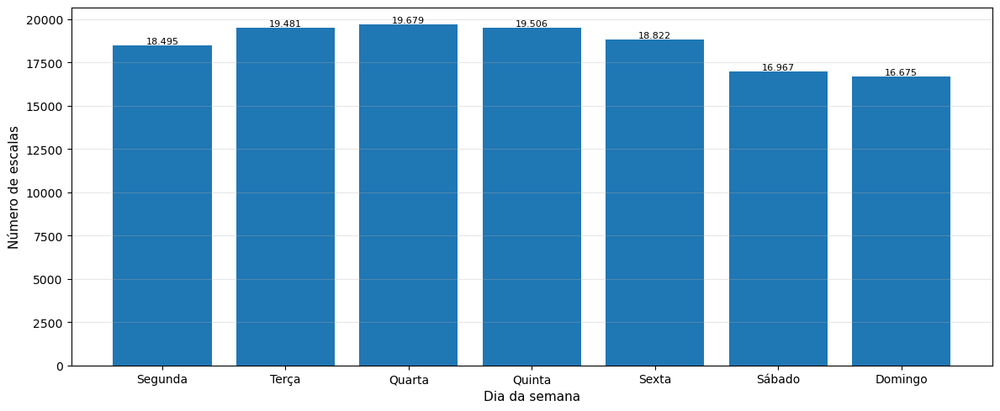

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_volume_by_day_of_week.png')

In [150]:
plot_data = dayofweek_summary.copy()

fig, ax = plt.subplots(figsize=(12, 5))

ax.bar(
    plot_data["arrival_dayofweek_label"],
    plot_data["n_calls"],
)

for index, row in plot_data.iterrows():
    n_calls_str = f"{row['n_calls']:,.0f}".replace(",", ".")
    ax.text(
        index,
        row["n_calls"],
        n_calls_str,
        ha="center",
        va="bottom",
        fontsize=8,
    )

# ax.set_title("Volume de escalas por dia da semana de chegada")
ax.set_xlabel("Dia da semana")
ax.set_ylabel("Número de escalas")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_08_volume_by_day_of_week.png")
plt.show()

figure_path

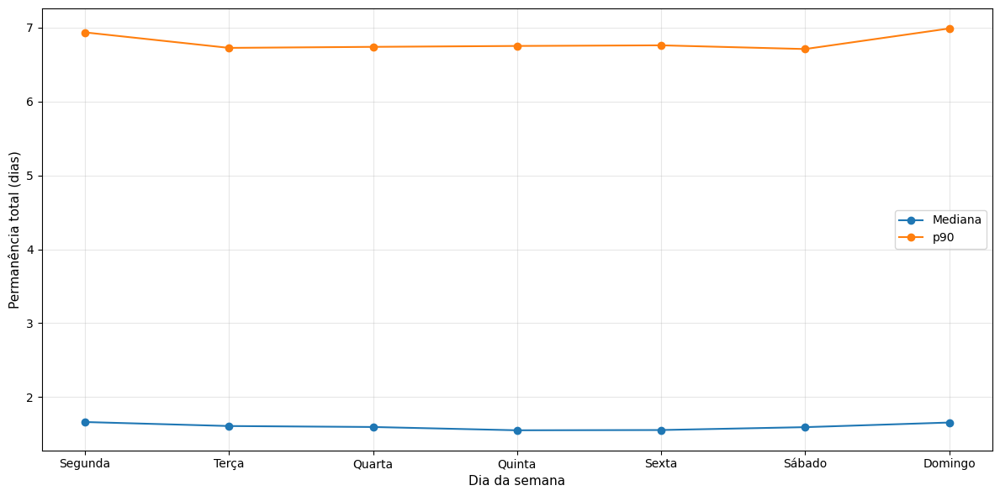

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_median_p90_by_day_of_week.png')

In [151]:
plot_data = dayofweek_summary.copy()

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(
    plot_data["arrival_dayofweek_label"],
    plot_data["median_total_d"],
    marker="o",
    linewidth=1.5,
    label="Mediana",
)

ax.plot(
    plot_data["arrival_dayofweek_label"],
    plot_data["p90_total_d"],
    marker="o",
    linewidth=1.5,
    label="p90",
)

# ax.set_title("Permanência total por dia da semana de chegada")
ax.set_xlabel("Dia da semana")
ax.set_ylabel("Permanência total (dias)")
ax.grid(alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_median_p90_by_day_of_week.png")
plt.show()

figure_path

In [152]:
df_time["arrival_weekend_label"] = np.where(
    df_time["arrival_is_weekend"].astype("Int64") == 1,
    "Final de semana",
    "Dia útil",
)

weekend_summary = (
    df_time
    .groupby("arrival_weekend_label")
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
)

for col in ["mean_total_h", "median_total_h", "p90_total_h", "p95_total_h"]:
    weekend_summary[col.replace("_h", "_d")] = weekend_summary[col] / 24

weekend_summary["p90_minus_median_d"] = (
    weekend_summary["p90_total_d"] - weekend_summary["median_total_d"]
)

weekend_summary

,arrival_weekend_label,n_calls,mean_total_h,median_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d
0,Dia útil,95983,70.83,38.25,162.67,252.32,2.95,1.59,6.78,10.51,5.18
1,Final de semana,33642,71.90,39.00,164.19,255.67,3.00,1.62,6.84,10.65,5.22


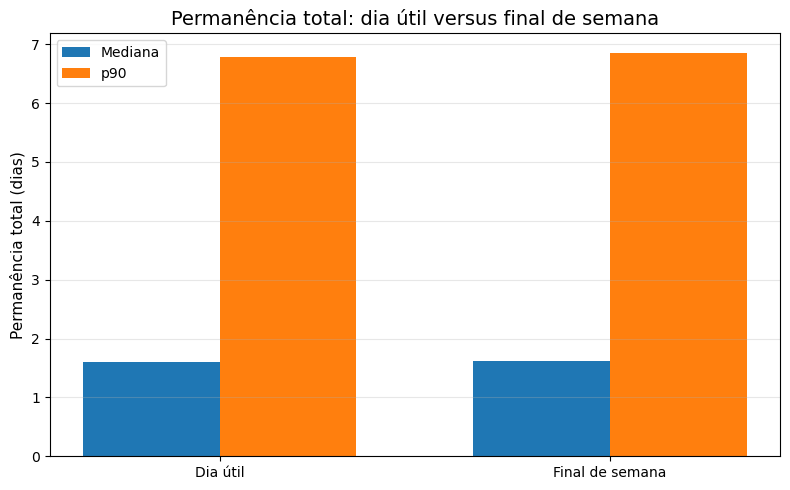

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_weekday_vs_weekend.png')

In [153]:
plot_data = weekend_summary.set_index("arrival_weekend_label").loc[
    ["Dia útil", "Final de semana"]
].reset_index()

x = np.arange(len(plot_data))
width = 0.35

fig, ax = plt.subplots(figsize=(8, 5))

ax.bar(
    x - width / 2,
    plot_data["median_total_d"],
    width,
    label="Mediana",
)

ax.bar(
    x + width / 2,
    plot_data["p90_total_d"],
    width,
    label="p90",
)

ax.set_xticks(x)
ax.set_xticklabels(plot_data["arrival_weekend_label"])

ax.set_title("Permanência total: dia útil versus final de semana")
ax.set_xlabel("")
ax.set_ylabel("Permanência total (dias)")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_weekday_vs_weekend.png")
plt.show()

figure_path

A análise por dia da semana busca identificar se a chegada em determinados dias está associada a maior permanência.

Diferenças entre dias úteis e finais de semana podem indicar efeitos de disponibilidade operacional, janelas de atendimento, capacidade de suporte, processos administrativos ou concentração de chegadas.

Mesmo que o efeito seja pequeno, essas variáveis podem contribuir para modelos preditivos, especialmente quando combinadas com porto, região e tipo de operação.

In [154]:
hour_summary = (
    df_time
    .dropna(subset=["arrival_hour"])
    .groupby("arrival_hour")
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
        median_wait_h=("t_wait_for_berthing_h", "median"),
        p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
    )
    .reset_index()
    .sort_values("arrival_hour")
)

for col in [
    "mean_total_h",
    "median_total_h",
    "p90_total_h",
    "p95_total_h",
    "median_wait_h",
    "p90_wait_h",
]:
    hour_summary[col.replace("_h", "_d")] = hour_summary[col] / 24

hour_summary.head()

,arrival_hour,n_calls,mean_total_h,median_total_h,p90_total_h,p95_total_h,median_wait_h,p90_wait_h,mean_total_d,median_total_d,p90_total_d,p95_total_d,median_wait_d,p90_wait_d
0,0,4257,76.09,41.50,174.79,272.38,0.00,13.28,3.17,1.73,7.28,11.35,0.00,0.55
1,1,3866,68.30,38.73,151.47,236.54,0.00,10.35,2.85,1.61,6.31,9.86,0.00,0.43
2,2,3691,66.69,38.38,151.25,220.93,0.00,9.50,2.78,1.60,6.30,9.21,0.00,0.40
3,3,3514,66.55,37.03,147.63,229.72,0.00,9.50,2.77,1.54,6.15,9.57,0.00,0.40
4,4,3585,66.66,37.40,150.47,227.65,0.00,8.96,2.78,1.56,6.27,9.49,0.00,0.37


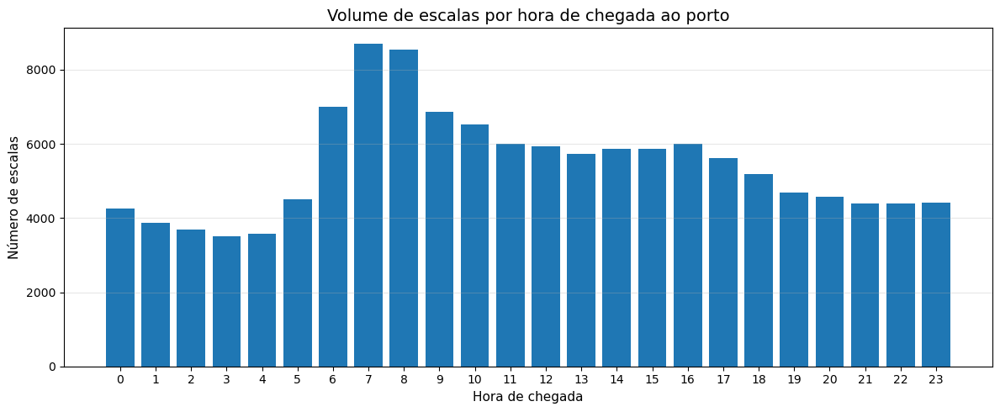

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_volume_by_arrival_hour.png')

In [155]:
plot_data = hour_summary.copy()

fig, ax = plt.subplots(figsize=(12, 5))

ax.bar(
    plot_data["arrival_hour"],
    plot_data["n_calls"],
)

ax.set_title("Volume de escalas por hora de chegada ao porto")
ax.set_xlabel("Hora de chegada")
ax.set_ylabel("Número de escalas")
ax.set_xticks(range(0, 24))
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_08_volume_by_arrival_hour.png")
plt.show()

figure_path

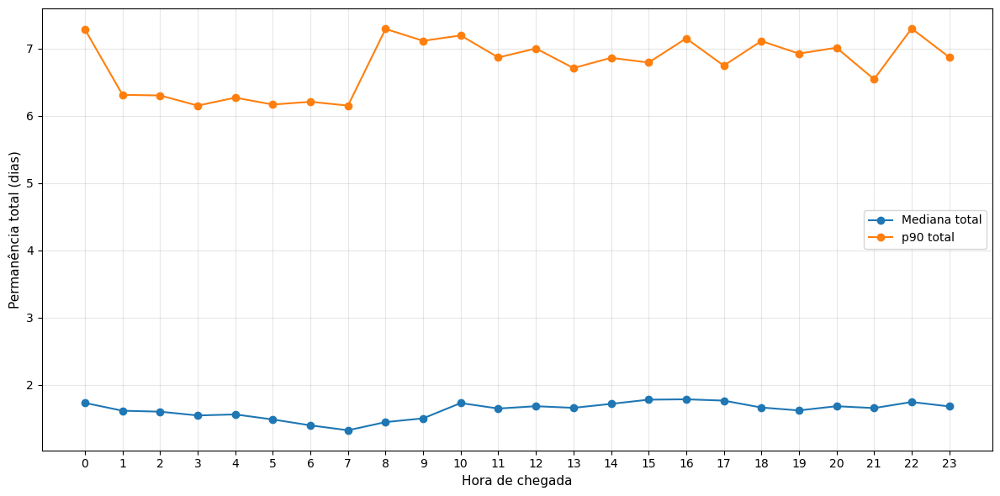

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_median_p90_by_arrival_hour.png')

In [156]:
plot_data = hour_summary.copy()

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(
    plot_data["arrival_hour"],
    plot_data["median_total_d"],
    marker="o",
    linewidth=1.5,
    label="Mediana total",
)

ax.plot(
    plot_data["arrival_hour"],
    plot_data["p90_total_d"],
    marker="o",
    linewidth=1.5,
    label="p90 total",
)

# ax.set_title("Permanência total por hora de chegada")
ax.set_xlabel("Hora de chegada")
ax.set_ylabel("Permanência total (dias)")
ax.set_xticks(range(0, 24))
ax.grid(alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_median_p90_by_arrival_hour.png")
plt.show()

figure_path

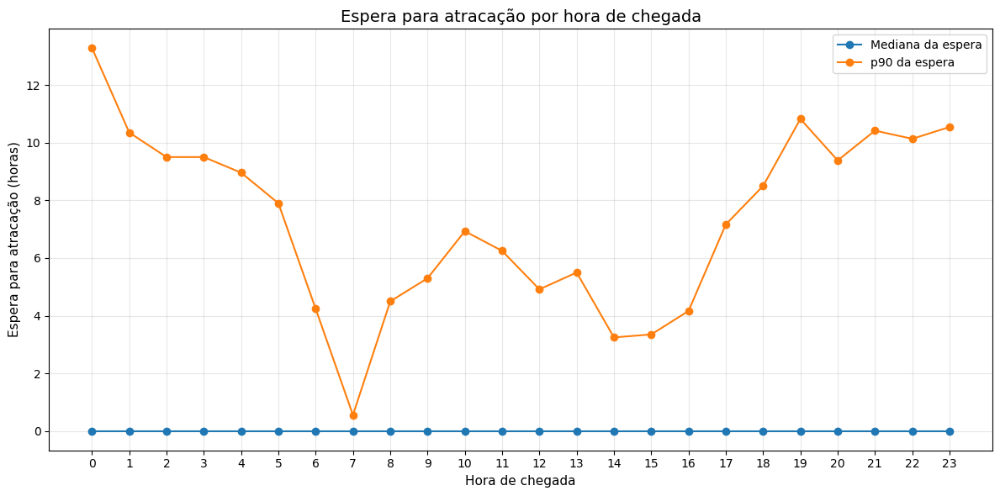

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_wait_for_berthing_by_arrival_hour.png')

In [157]:
plot_data = hour_summary.copy()

fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(
    plot_data["arrival_hour"],
    plot_data["median_wait_h"],
    marker="o",
    linewidth=1.5,
    label="Mediana da espera",
)

ax.plot(
    plot_data["arrival_hour"],
    plot_data["p90_wait_h"],
    marker="o",
    linewidth=1.5,
    label="p90 da espera",
)

ax.set_title("Espera para atracação por hora de chegada")
ax.set_xlabel("Hora de chegada")
ax.set_ylabel("Espera para atracação (horas)")
ax.set_xticks(range(0, 24))
ax.grid(alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_wait_for_berthing_by_arrival_hour.png")
plt.show()

figure_path

In [158]:
shift_summary = (
    df_time
    .dropna(subset=["arrival_shift_label"])
    .groupby("arrival_shift_label", observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
        median_wait_h=("t_wait_for_berthing_h", "median"),
        p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
    )
    .reset_index()
)

for col in [
    "mean_total_h",
    "median_total_h",
    "p90_total_h",
    "p95_total_h",
    "median_wait_h",
    "p90_wait_h",
]:
    shift_summary[col.replace("_h", "_d")] = shift_summary[col] / 24

shift_summary = shift_summary.sort_values("arrival_shift_label").reset_index(drop=True)

shift_summary

,arrival_shift_label,n_calls,mean_total_h,median_total_h,p90_total_h,p95_total_h,median_wait_h,p90_wait_h,mean_total_d,median_total_d,p90_total_d,p95_total_d,median_wait_d,p90_wait_d
0,Madrugada,23424,68.36,37.83,153.45,235.15,0.00,9.77,2.85,1.58,6.39,9.80,0.00,0.41
1,Manhã,43579,69.66,35.32,164.67,256.81,0.00,4.33,2.90,1.47,6.86,10.70,0.00,0.18
2,Tarde,34998,73.47,41.58,164.86,258.84,0.00,4.65,3.06,1.73,6.87,10.79,0.00,0.19
3,Noite,27624,72.71,40.05,166.88,257.57,0.00,10.00,3.03,1.67,6.95,10.73,0.00,0.42


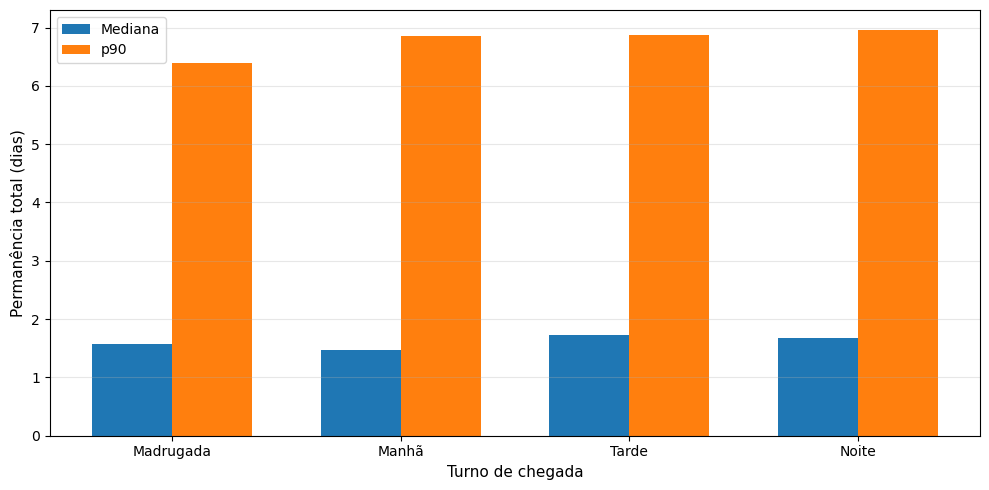

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_total_stay_by_arrival_shift.png')

In [159]:
plot_data = shift_summary.copy()

x = np.arange(len(plot_data))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    x - width / 2,
    plot_data["median_total_d"],
    width,
    label="Mediana",
)

ax.bar(
    x + width / 2,
    plot_data["p90_total_d"],
    width,
    label="p90",
)

ax.set_xticks(x)
ax.set_xticklabels(plot_data["arrival_shift_label"])

# ax.set_title("Permanência total por turno de chegada")
ax.set_xlabel("Turno de chegada")
ax.set_ylabel("Permanência total (dias)")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_total_stay_by_arrival_shift.png")
plt.show()

figure_path

A análise por hora e turno de chegada busca identificar se o momento em que a embarcação chega ao porto está associado ao tempo total ou à espera para atracação.

Esse efeito pode estar relacionado a janelas operacionais, disponibilidade de berços, ciclos de troca de turno ou concentração de chegadas em determinados horários.

Caso existam diferenças relevantes por hora ou turno, essas variáveis podem ser úteis para a modelagem de lead time.

In [160]:
season_summary = (
    df_time
    .dropna(subset=["arrival_season_label"])
    .groupby("arrival_season_label", observed=True)
    .agg(
        n_calls=("port_call_id", "nunique"),
        mean_total_h=("t_total_port_stay_h", "mean"),
        median_total_h=("t_total_port_stay_h", "median"),
        p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        p95_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.95)),
    )
    .reset_index()
)

for col in ["mean_total_h", "median_total_h", "p90_total_h", "p95_total_h"]:
    season_summary[col.replace("_h", "_d")] = season_summary[col] / 24

season_summary["p90_minus_median_d"] = (
    season_summary["p90_total_d"] - season_summary["median_total_d"]
)

season_summary = season_summary.sort_values("arrival_season_label").reset_index(drop=True)

season_summary

,arrival_season_label,n_calls,mean_total_h,median_total_h,p90_total_h,p95_total_h,mean_total_d,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d
0,Verão,32113,67.88,36.25,157.45,238.57,2.83,1.51,6.56,9.94,5.05
1,Outono,33670,69.60,37.17,159.00,245.17,2.90,1.55,6.62,10.22,5.08
2,Inverno,32215,74.09,40.67,170.42,268.27,3.09,1.69,7.10,11.18,5.41
3,Primavera,31627,72.93,39.67,167.33,262.03,3.04,1.65,6.97,10.92,5.32


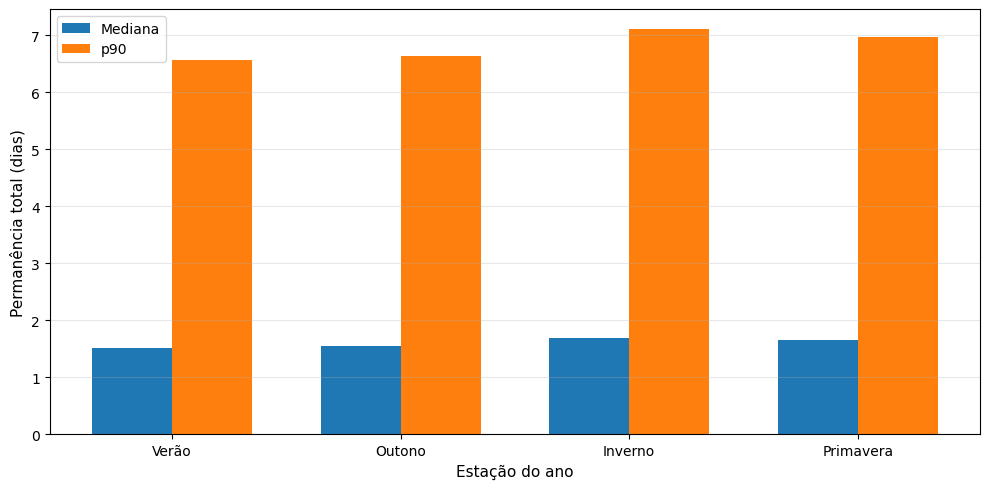

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_total_stay_by_season.png')

In [161]:
plot_data = season_summary.copy()

x = np.arange(len(plot_data))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    x - width / 2,
    plot_data["median_total_d"],
    width,
    label="Mediana",
)

ax.bar(
    x + width / 2,
    plot_data["p90_total_d"],
    width,
    label="p90",
)

ax.set_xticks(x)
ax.set_xticklabels(plot_data["arrival_season_label"])

# ax.set_title("Permanência total por estação do ano")
ax.set_xlabel("Estação do ano")
ax.set_ylabel("Permanência total (dias)")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_08_total_stay_by_season.png")
plt.show()

figure_path

A análise por estação do ano é uma forma agregada de avaliar sazonalidade.

Como o Brasil tem grande diversidade regional, o efeito de estação pode não ser uniforme em todo o país. Ainda assim, essa variável pode capturar padrões associados a clima, safra, operação portuária ou concentração de determinados fluxos logísticos.

### 8.7 Calendário e componentes do lead time

Além de avaliar a permanência total, também é útil investigar se o calendário afeta etapas específicas do processo portuário.

Nesta etapa, analisamos os componentes:

1. espera para atracação;
2. operação atracada;
3. pós-operação.

O objetivo é verificar se eventuais padrões temporais estão concentrados em alguma etapa.

In [162]:
component_calendar_rows = []

for component_col in COMPONENT_COLUMNS_H:
    for month, month_label in MONTH_LABELS_PT.items():
        subset = df_time.loc[df_time["arrival_month"] == month]

        if len(subset) == 0:
            continue

        component_calendar_rows.append(
            {
                "calendar_type": "month",
                "calendar_value": month,
                "calendar_label": month_label,
                "component": component_col,
                "component_label": COMPONENT_LABELS[component_col],
                "n_calls": subset["port_call_id"].nunique(),
                "median_h": subset[component_col].median(),
                "p90_h": subset[component_col].quantile(0.90),
            }
        )

component_month_summary = pd.DataFrame(component_calendar_rows)

component_month_summary["median_d"] = component_month_summary["median_h"] / 24
component_month_summary["p90_d"] = component_month_summary["p90_h"] / 24

component_month_summary["component_label"] = pd.Categorical(
    component_month_summary["component_label"],
    categories=COMPONENT_ORDER_LABELS,
    ordered=True,
)

component_month_summary.head()

,calendar_type,calendar_value,calendar_label,component,component_label,n_calls,median_h,p90_h,median_d,p90_d
0,month,1,Jan,t_wait_for_berthing_h,Espera para atracação,11003,0.00,1.58,0.00,0.07
1,month,2,Fev,t_wait_for_berthing_h,Espera para atracação,10573,0.00,3.33,0.00,0.14
2,month,3,Mar,t_wait_for_berthing_h,Espera para atracação,11563,0.00,8.65,0.00,0.36
3,month,4,Abr,t_wait_for_berthing_h,Espera para atracação,10924,0.00,4.25,0.00,0.18
4,month,5,Mai,t_wait_for_berthing_h,Espera para atracação,11183,0.00,4.19,0.00,0.17


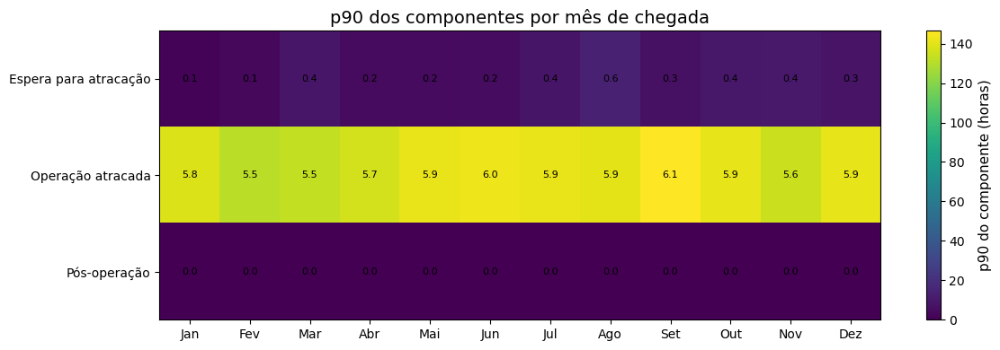

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_08_component_p90_by_month_heatmap.png')

In [163]:
component_month_p90_pivot = (
    component_month_summary
    .pivot_table(
        index="component_label",
        columns="calendar_label",
        values="p90_h",
        aggfunc="first",
        observed=True,
    )
    .reindex(index=COMPONENT_ORDER_LABELS, columns=list(MONTH_LABELS_PT.values()))
)

fig, ax = plt.subplots(figsize=(12, 4))

im = ax.imshow(component_month_p90_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(component_month_p90_pivot.columns)))
ax.set_xticklabels(component_month_p90_pivot.columns)

ax.set_yticks(np.arange(len(component_month_p90_pivot.index)))
ax.set_yticklabels(component_month_p90_pivot.index)

for i in range(component_month_p90_pivot.shape[0]):
    for j in range(component_month_p90_pivot.shape[1]):
        value = component_month_p90_pivot.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value / 24:.1f}",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("p90 do componente (horas)")

ax.set_title("p90 dos componentes por mês de chegada")

figure_path = save_figure("eda_08_component_p90_by_month_heatmap.png")
plt.show()

figure_path

O heatmap dos componentes por mês ajuda a entender se a sazonalidade aparece de forma homogênea no lead time total ou se está concentrada em uma etapa específica.

Se o p90 da espera para atracação aumenta em determinados meses, pode haver efeito de congestionamento, janela de atracação ou condições externas. Se o p90 da operação aumenta, o padrão pode estar mais associado à complexidade operacional, tipo de carga ou produtividade. Se o pós-operação aumenta, pode haver efeitos relacionados à saída do porto ou liberação.

In [164]:
highest_month_median = month_summary.sort_values(
    "median_total_d",
    ascending=False,
).iloc[0]

highest_month_p90 = month_summary.sort_values(
    "p90_total_d",
    ascending=False,
).iloc[0]

highest_month_tail_gap = month_summary.sort_values(
    "p90_minus_median_d",
    ascending=False,
).iloc[0]

highest_weekday_p90 = dayofweek_summary.sort_values(
    "p90_total_d",
    ascending=False,
).iloc[0]

highest_hour_p90 = hour_summary.sort_values(
    "p90_total_d",
    ascending=False,
).iloc[0]

highest_shift_p90 = shift_summary.sort_values(
    "p90_total_d",
    ascending=False,
).iloc[0]

highest_season_p90 = season_summary.sort_values(
    "p90_total_d",
    ascending=False,
).iloc[0]

section_8_narrative = f"""
A análise temporal mostra como a permanência portuária varia de acordo com o calendário.

O mês com maior mediana da permanência total é {highest_month_median['arrival_month_label']}, com mediana de {highest_month_median['median_total_d']:.2f} dias.
O maior p90 mensal aparece em {highest_month_p90['arrival_month_label']}, com p90 de {highest_month_p90['p90_total_d']:.2f} dias.
A maior diferença entre p90 e mediana aparece em {highest_month_tail_gap['arrival_month_label']}, com abertura de cauda de {highest_month_tail_gap['p90_minus_median_d']:.2f} dias.

Por dia da semana, o maior p90 aparece em {highest_weekday_p90['arrival_dayofweek_label']}, com p90 de {highest_weekday_p90['p90_total_d']:.2f} dias.
Por hora de chegada, o maior p90 aparece às {int(highest_hour_p90['arrival_hour'])}:00, com p90 de {highest_hour_p90['p90_total_d']:.2f} dias.
Por turno, o maior p90 aparece em {highest_shift_p90['arrival_shift_label']}, com p90 de {highest_shift_p90['p90_total_d']:.2f} dias.
Por estação do ano, o maior p90 aparece em {highest_season_p90['arrival_season_label']}, com p90 de {highest_season_p90['p90_total_d']:.2f} dias.
"""

print(section_8_narrative)


A análise temporal mostra como a permanência portuária varia de acordo com o calendário.

O mês com maior mediana da permanência total é Ago, com mediana de 1.70 dias.
O maior p90 mensal aparece em Set, com p90 de 7.31 dias.
A maior diferença entre p90 e mediana aparece em Set, com abertura de cauda de 5.63 dias.

Por dia da semana, o maior p90 aparece em Domingo, com p90 de 6.99 dias.
Por hora de chegada, o maior p90 aparece às 22:00, com p90 de 7.30 dias.
Por turno, o maior p90 aparece em Noite, com p90 de 6.95 dias.
Por estação do ano, o maior p90 aparece em Inverno, com p90 de 7.10 dias.



In [165]:
monthly_summary_path = TABLES_DIR / "eda_08_monthly_summary.csv"
month_summary_path = TABLES_DIR / "eda_08_month_of_year_summary.csv"
month_region_summary_path = TABLES_DIR / "eda_08_month_region_summary.csv"
dayofweek_summary_path = TABLES_DIR / "eda_08_dayofweek_summary.csv"
weekend_summary_path = TABLES_DIR / "eda_08_weekend_summary.csv"
hour_summary_path = TABLES_DIR / "eda_08_hour_summary.csv"
shift_summary_path = TABLES_DIR / "eda_08_shift_summary.csv"
season_summary_path = TABLES_DIR / "eda_08_season_summary.csv"
component_month_summary_path = TABLES_DIR / "eda_08_component_month_summary.csv"

monthly_summary.to_csv(monthly_summary_path, index=False)
month_summary.to_csv(month_summary_path, index=False)
month_region_summary.to_csv(month_region_summary_path, index=False)
dayofweek_summary.to_csv(dayofweek_summary_path, index=False)
weekend_summary.to_csv(weekend_summary_path, index=False)
hour_summary.to_csv(hour_summary_path, index=False)
shift_summary.to_csv(shift_summary_path, index=False)
season_summary.to_csv(season_summary_path, index=False)
component_month_summary.to_csv(component_month_summary_path, index=False)

[
    monthly_summary_path,
    month_summary_path,
    month_region_summary_path,
    dayofweek_summary_path,
    weekend_summary_path,
    hour_summary_path,
    shift_summary_path,
    season_summary_path,
    component_month_summary_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_monthly_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_month_of_year_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_month_region_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_dayofweek_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_weekend_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_hour_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_08_shift_summary.csv')

### Principais mensagens da seção

A análise de calendário mostra se a permanência portuária apresenta padrões temporais relevantes.

Diferenças por mês, dia da semana, hora de chegada, turno ou estação do ano podem indicar que o lead time portuário não é apenas uma característica fixa do porto ou da operação, mas também do momento em que a escala ocorre.

Para a modelagem, as variáveis de calendário são candidatas importantes porque podem capturar efeitos sazonais, ciclos operacionais e padrões de concentração de demanda. No entanto, essas variáveis devem ser interpretadas em conjunto com porto, região, tipo de operação, clima e congestionamento, pois o mesmo efeito temporal pode variar entre localidades e perfis operacionais.

A próxima seção investigará fatores climáticos como variáveis exógenas, avaliando se chuva, precipitação, vento e temperatura estão associados a maior permanência ou maior espera para atracação.

---

## 9. Clima como fator exógeno

Além de fatores estruturais, operacionais e temporais, a permanência portuária pode ser influenciada por condições climáticas.

Chuva, vento, rajadas e períodos prolongados de precipitação podem afetar operações de atracação, carga, descarga, segurança operacional e janelas de saída. Ainda que o clima não explique sozinho a duração de uma escala portuária, ele pode funcionar como uma variável exógena relevante para a predição de lead time.

Nesta seção, investigamos se as variáveis climáticas disponíveis apresentam associação com:

- permanência total no porto;
- espera para atracação;
- operação atracada;
- casos extremos de permanência.

A pergunta principal é:

> Condições climáticas adversas estão associadas a maior lead time portuário ou maior risco de cauda?

Essa análise é relevante para o TCC porque modelos de previsão de lead time podem se beneficiar de variáveis externas que antecipam aumento de risco operacional.

In [166]:
weather_candidate_columns = [
    "temperature_2m_mean",
    "temperature_2m_max",
    "temperature_2m_min",
    "precipitation_sum",
    "rain_sum",
    "precipitation_hours",
    "wind_speed_10m_max",
    "wind_gusts_10m_max",
    "wind_direction_10m_dominant",
    "rain_sum_prev_1d",
    "precipitation_sum_prev_1d",
    "wind_speed_10m_max_prev_1d",
    "wind_gusts_10m_max_prev_1d",
    "temperature_2m_mean_prev_1d",
    "rain_sum_prev_3d",
    "precipitation_hours_prev_3d",
    "temperature_2m_mean_prev_3d",
    "wind_speed_10m_max_prev_3d",
    "wind_gusts_10m_max_prev_3d",
    "rain_sum_prev_7d",
    "precipitation_hours_prev_7d",
    "temperature_2m_mean_prev_7d",
    "wind_speed_10m_max_prev_7d",
    "wind_gusts_10m_max_prev_7d",
]

weather_columns = [
    col for col in weather_candidate_columns
    if col in df.columns
]

if not weather_columns:
    raise ValueError(
        "No weather columns were found in the EDA base. "
        "Check whether weather features were merged into eda_base.parquet."
    )

weather_columns

['temperature_2m_mean',
 'temperature_2m_max',
 'temperature_2m_min',
 'precipitation_sum',
 'rain_sum',
 'precipitation_hours',
 'wind_speed_10m_max',
 'wind_gusts_10m_max',
 'wind_direction_10m_dominant',
 'rain_sum_prev_1d',
 'precipitation_sum_prev_1d',
 'wind_speed_10m_max_prev_1d',
 'wind_gusts_10m_max_prev_1d',
 'temperature_2m_mean_prev_1d',
 'rain_sum_prev_3d',
 'precipitation_hours_prev_3d',
 'temperature_2m_mean_prev_3d',
 'wind_speed_10m_max_prev_3d',
 'wind_gusts_10m_max_prev_3d',
 'rain_sum_prev_7d',
 'precipitation_hours_prev_7d',
 'temperature_2m_mean_prev_7d',
 'wind_speed_10m_max_prev_7d',
 'wind_gusts_10m_max_prev_7d']

In [167]:
df_weather_eda = df.copy()

if "has_weather_data" in df_weather_eda.columns:
    weather_available_mask = df_weather_eda["has_weather_data"].fillna(0).astype(int) == 1
else:
    weather_available_mask = df_weather_eda[weather_columns].notna().any(axis=1)

df_weather_eda["has_weather_data_analysis"] = weather_available_mask

print(f"Total rows: {len(df_weather_eda):,}")
print(f"Rows with weather data: {df_weather_eda['has_weather_data_analysis'].sum():,}")
print(f"Weather coverage: {df_weather_eda['has_weather_data_analysis'].mean() * 100:.2f}%")

df_weather = df_weather_eda.loc[
    df_weather_eda["has_weather_data_analysis"]
].copy()

print(f"Rows used in weather analysis: {len(df_weather):,}")

Total rows: 129,625
Rows with weather data: 129,625
Weather coverage: 100.00%
Rows used in weather analysis: 129,625


### Cobertura dos dados climáticos

Antes de interpretar qualquer relação entre clima e permanência portuária, é necessário verificar a cobertura das variáveis climáticas.

Se a cobertura for alta, a análise climática representa boa parte da base elegível. Se for baixa, os resultados devem ser interpretados como evidência exploratória restrita ao subconjunto de portos e datas com dados climáticos disponíveis.

In [168]:
weather_coverage = pd.DataFrame(
    [
        {
            "weather_variable": col,
            "non_null_count": df_weather_eda[col].notna().sum(),
            "non_null_pct": df_weather_eda[col].notna().mean() * 100,
        }
        for col in weather_columns
    ]
).sort_values("non_null_pct", ascending=False)

weather_coverage

,weather_variable,non_null_count,non_null_pct
0,temperature_2m_mean,129625,100.00
1,temperature_2m_max,129625,100.00
2,temperature_2m_min,129625,100.00
3,precipitation_sum,129625,100.00
4,rain_sum,129625,100.00
5,precipitation_hours,129625,100.00
6,wind_speed_10m_max,129625,100.00
7,wind_gusts_10m_max,129625,100.00
8,wind_direction_10m_dominant,129625,100.00
9,rain_sum_prev_1d,129625,100.00


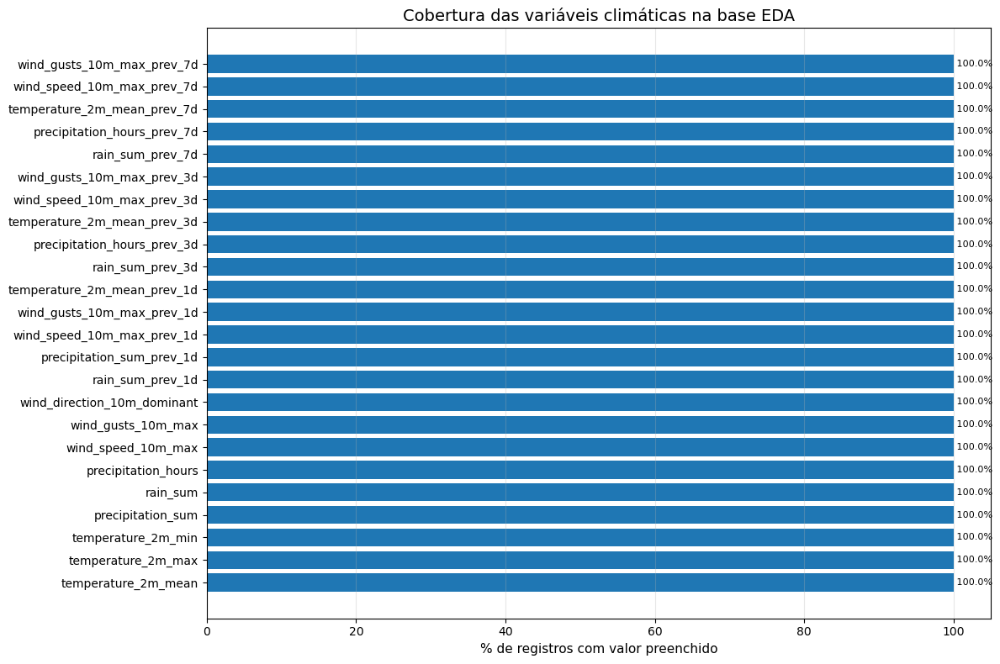

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_09_weather_variable_coverage.png')

In [169]:
plot_data = weather_coverage.sort_values("non_null_pct", ascending=True)

fig, ax = plt.subplots(figsize=(12, 8))

ax.barh(
    plot_data["weather_variable"],
    plot_data["non_null_pct"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.non_null_pct,
        index,
        f" {row.non_null_pct:.1f}%",
        va="center",
        fontsize=8,
    )

ax.set_title("Cobertura das variáveis climáticas na base EDA")
ax.set_xlabel("% de registros com valor preenchido")
ax.set_ylabel("")
ax.set_xlim(0, 105)
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_09_weather_variable_coverage.png")
plt.show()

figure_path

In [170]:
if "region" in df_weather_eda.columns:
    weather_coverage_by_region = (
        df_weather_eda
        .groupby("region", dropna=False)
        .agg(
            n_calls=("port_call_id", "nunique"),
            weather_calls=("has_weather_data_analysis", "sum"),
            weather_coverage_pct=("has_weather_data_analysis", "mean"),
        )
        .reset_index()
    )

    weather_coverage_by_region["weather_coverage_pct"] = (
        weather_coverage_by_region["weather_coverage_pct"] * 100
    )

    weather_coverage_by_region = weather_coverage_by_region.sort_values(
        "weather_coverage_pct",
        ascending=False,
    )

    display(weather_coverage_by_region)

,region,n_calls,weather_calls,weather_coverage_pct
0,NORDESTE,25236,25236,100.00
1,NORTE,8782,8782,100.00
2,SUDESTE,69845,69845,100.00
3,SUL,25762,25762,100.00


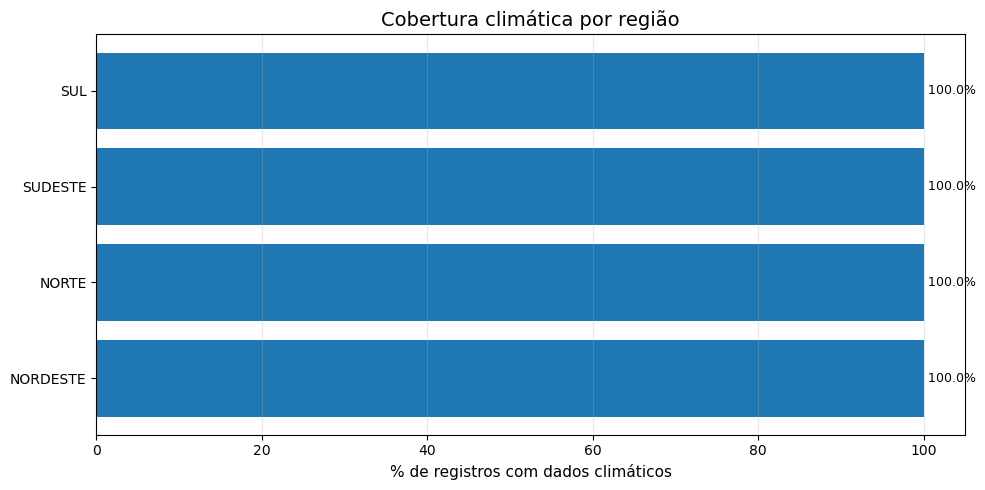

In [171]:
if "weather_coverage_by_region" in globals():
    plot_data = weather_coverage_by_region.sort_values(
        "weather_coverage_pct",
        ascending=True,
    )

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.barh(
        plot_data["region"].astype(str),
        plot_data["weather_coverage_pct"],
    )

    for index, row in enumerate(plot_data.itertuples()):
        ax.text(
            row.weather_coverage_pct,
            index,
            f" {row.weather_coverage_pct:.1f}%",
            va="center",
            fontsize=9,
        )

    ax.set_title("Cobertura climática por região")
    ax.set_xlabel("% de registros com dados climáticos")
    ax.set_ylabel("")
    ax.set_xlim(0, 105)
    ax.grid(axis="x", alpha=0.3)

    figure_path = save_figure("eda_09_weather_coverage_by_region.png")
    plt.show()

    figure_path

A cobertura climática define o grau de confiança da análise desta seção.

Se a cobertura for desigual entre regiões ou portos, parte das diferenças observadas pode refletir disponibilidade de dados, não necessariamente um efeito climático real. Por isso, os resultados devem ser interpretados em conjunto com a cobertura.

### 9.2 Distribuição das principais variáveis climáticas

Antes de cruzar clima com lead time, é útil entender a distribuição das variáveis climáticas.

Nesta etapa, observamos chuva, precipitação, horas de precipitação, vento máximo e rajadas máximas. Essas variáveis são candidatas a capturar condições adversas para operação portuária.

In [172]:
main_weather_columns = [
    col for col in [
        "rain_sum",
        "precipitation_sum",
        "precipitation_hours",
        "wind_speed_10m_max",
        "wind_gusts_10m_max",
        "temperature_2m_mean",
    ]
    if col in df_weather.columns
]

main_weather_columns

['rain_sum',
 'precipitation_sum',
 'precipitation_hours',
 'wind_speed_10m_max',
 'wind_gusts_10m_max',
 'temperature_2m_mean']

In [173]:
weather_descriptive_summary = pd.DataFrame(
    [
        {
            "variable": col,
            "count": df_weather[col].count(),
            "mean": df_weather[col].mean(),
            "median": df_weather[col].median(),
            "std": df_weather[col].std(),
            "min": df_weather[col].min(),
            "p25": df_weather[col].quantile(0.25),
            "p75": df_weather[col].quantile(0.75),
            "p90": df_weather[col].quantile(0.90),
            "p95": df_weather[col].quantile(0.95),
            "p99": df_weather[col].quantile(0.99),
            "max": df_weather[col].max(),
        }
        for col in main_weather_columns
    ]
)

weather_descriptive_summary

,variable,count,mean,median,std,min,p25,p75,p90,p95,p99,max
0,rain_sum,129625,3.57,0.60,8.12,0.00,0.00,3.40,10.50,16.80,36.90,229.60
1,precipitation_sum,129625,3.57,0.60,8.12,0.00,0.00,3.40,10.50,16.80,36.90,229.60
2,precipitation_hours,129625,6.89,4.00,7.61,0.00,0.00,12.00,20.00,23.00,24.00,24.00
3,wind_speed_10m_max,129625,19.55,18.40,7.06,3.40,14.40,23.50,29.20,33.20,40.30,61.60
4,wind_gusts_10m_max,129625,32.27,31.00,8.83,11.50,25.90,37.40,44.30,48.60,57.20,95.00
5,temperature_2m_mean,129625,24.11,24.80,3.38,5.70,22.10,26.60,27.70,28.20,29.40,32.50


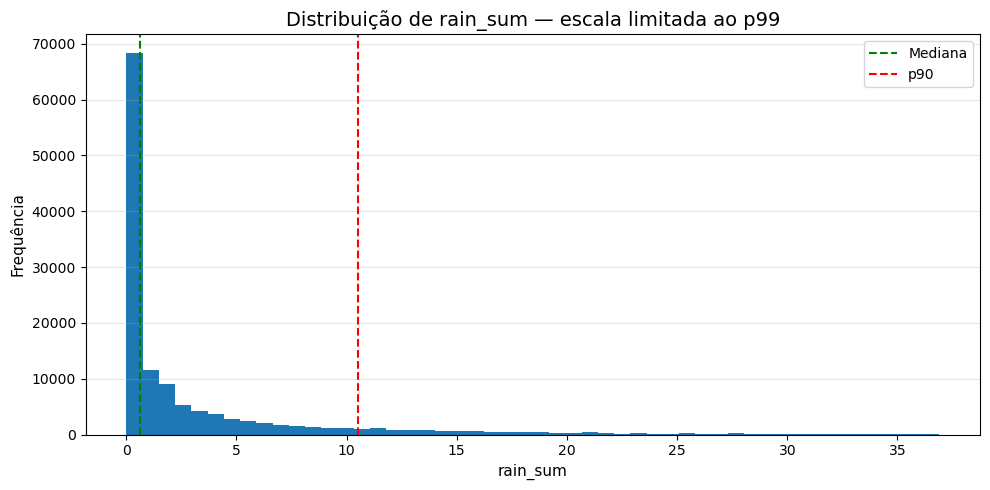

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_09_distribution_rain_sum.png


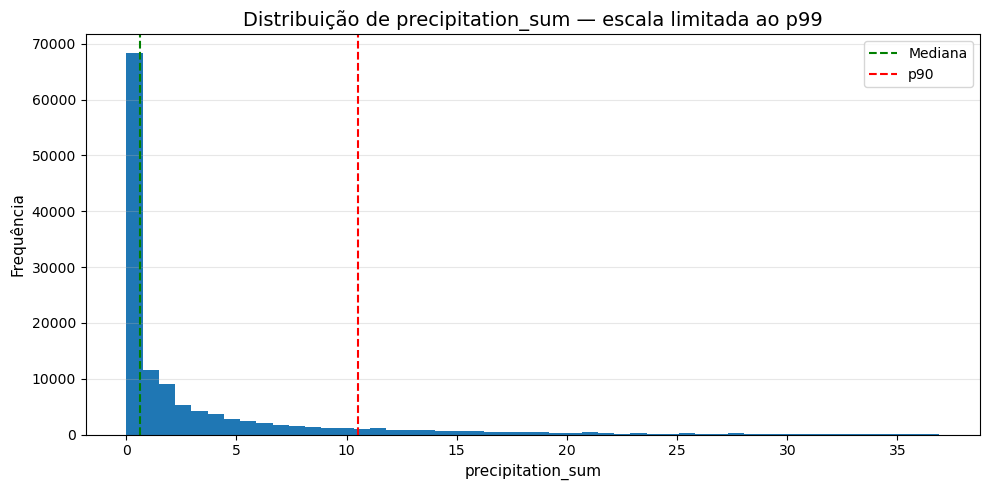

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_09_distribution_precipitation_sum.png


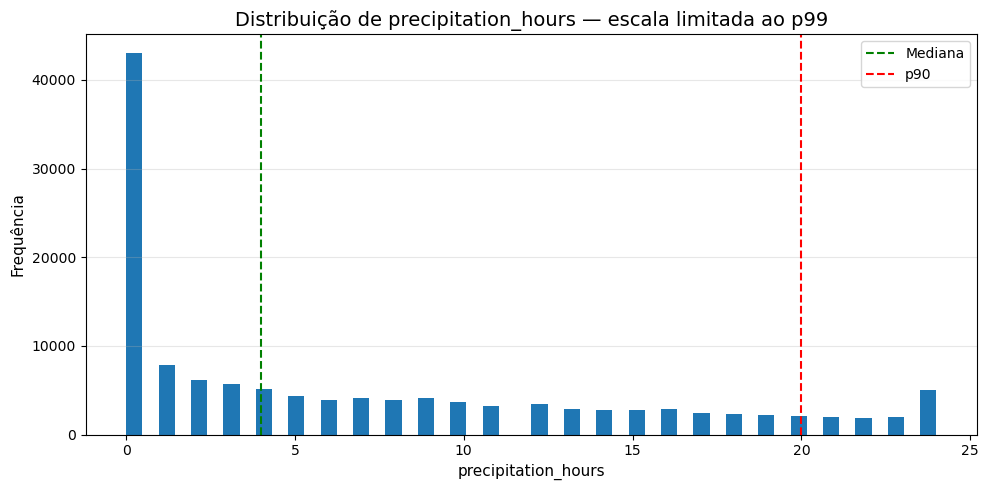

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_09_distribution_precipitation_hours.png


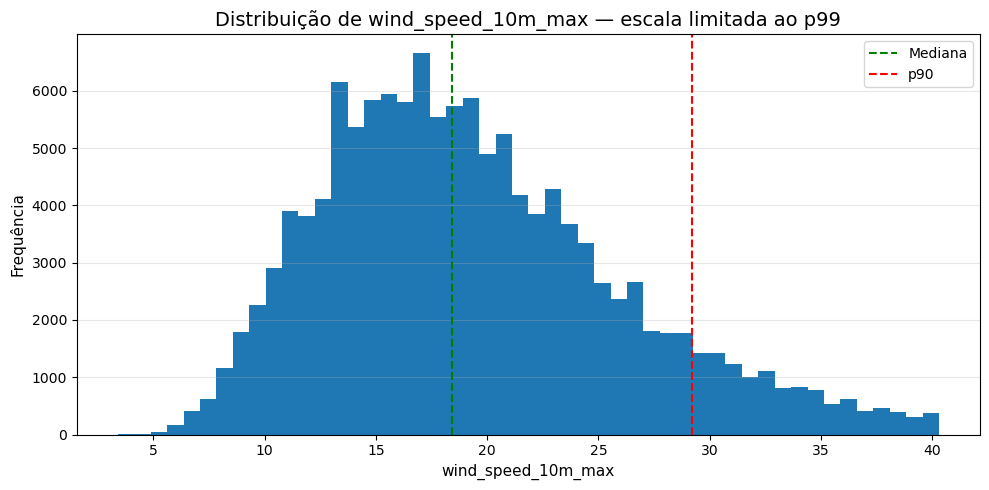

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_09_distribution_wind_speed_10m_max.png


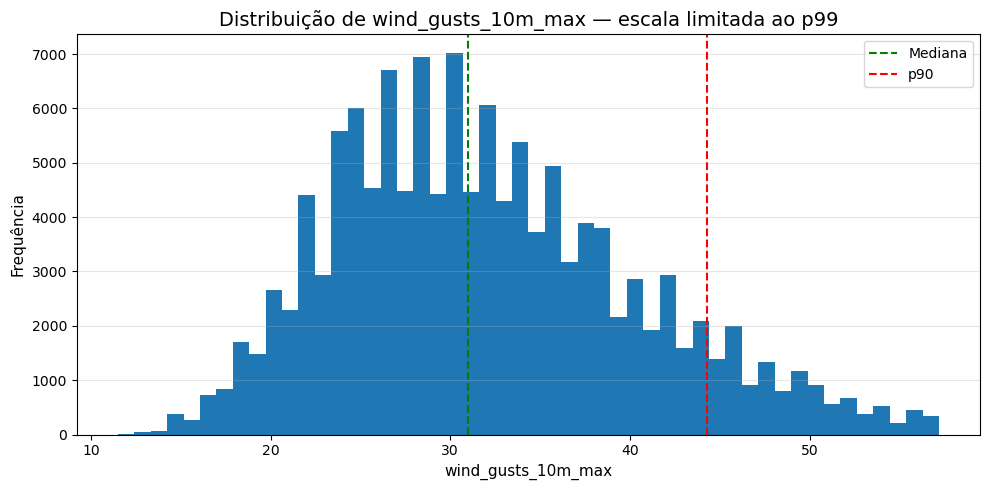

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_09_distribution_wind_gusts_10m_max.png


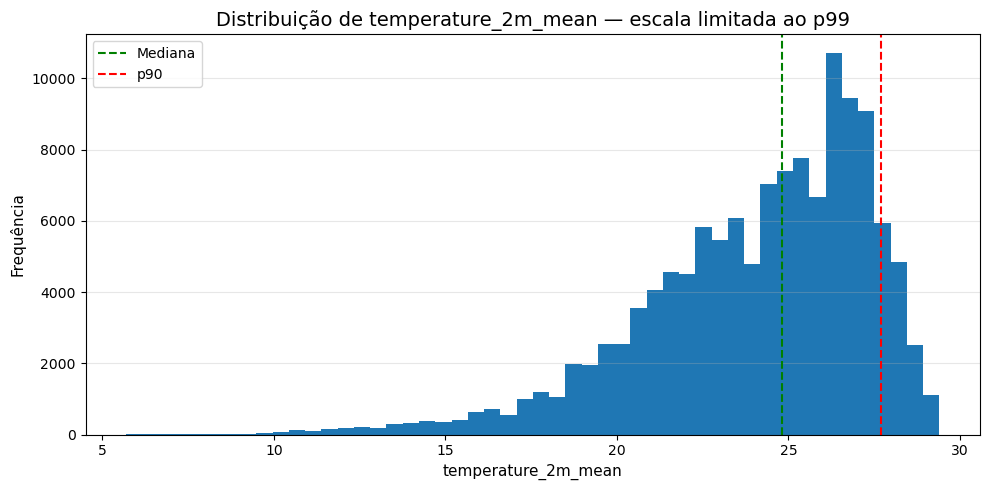

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_09_distribution_temperature_2m_mean.png


In [174]:
for col in main_weather_columns:
    series = df_weather[col].dropna()

    if series.empty:
        continue

    upper_limit = series.quantile(0.99)
    plot_series = series[series <= upper_limit]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.hist(plot_series, bins=50)

    ax.axvline(series.median(), linestyle="--", linewidth=1.5, label="Mediana", color="green")
    ax.axvline(series.quantile(0.90), linestyle="--", linewidth=1.5, label="p90", color="red")

    ax.set_title(f"Distribuição de {col} — escala limitada ao p99")
    ax.set_xlabel(col)
    ax.set_ylabel("Frequência")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure(f"eda_09_distribution_{col}.png")
    plt.show()

    print(figure_path)

### 9.3 Definição de faixas climáticas

Para interpretar clima de forma mais intuitiva, vamos criar faixas de condição climática.

Em vez de analisar apenas variáveis contínuas, classificaremos os registros em grupos como:

- sem chuva;
- chuva leve;
- chuva moderada;
- chuva intensa;
- vento normal;
- vento alto;
- rajada alta.

Essas faixas são exploratórias e baseadas em quantis da própria base. Elas não devem ser interpretadas como limiares meteorológicos oficiais, mas como uma forma de comparar registros sob condições relativamente mais ou menos adversas.

In [175]:
df_weather_binned = df_weather.copy()

def classify_by_zero_and_quantiles(series: pd.Series, labels_prefix: str) -> pd.Series:
    """Classify a non-negative weather variable into zero, low, medium and high groups."""
    result = pd.Series(index=series.index, dtype="object")

    positive = series[series > 0].dropna()

    result.loc[series.isna()] = np.nan
    result.loc[series == 0] = f"Sem {labels_prefix}"

    if len(positive) == 0:
        return result

    q50 = positive.quantile(0.50)
    q80 = positive.quantile(0.80)

    result.loc[(series > 0) & (series <= q50)] = f"{labels_prefix.capitalize()} baixa"
    result.loc[(series > q50) & (series <= q80)] = f"{labels_prefix.capitalize()} moderada"
    result.loc[series > q80] = f"{labels_prefix.capitalize()} alta"

    return result


if "rain_sum" in df_weather_binned.columns:
    df_weather_binned["rain_class"] = classify_by_zero_and_quantiles(
        df_weather_binned["rain_sum"],
        "chuva",
    )

if "precipitation_sum" in df_weather_binned.columns:
    df_weather_binned["precipitation_class"] = classify_by_zero_and_quantiles(
        df_weather_binned["precipitation_sum"],
        "precipitação",
    )

if "wind_speed_10m_max" in df_weather_binned.columns:
    wind_q75 = df_weather_binned["wind_speed_10m_max"].quantile(0.75)
    wind_q90 = df_weather_binned["wind_speed_10m_max"].quantile(0.90)

    df_weather_binned["wind_class"] = pd.cut(
        df_weather_binned["wind_speed_10m_max"],
        bins=[-np.inf, wind_q75, wind_q90, np.inf],
        labels=["Vento normal", "Vento alto", "Vento muito alto"],
    )

if "wind_gusts_10m_max" in df_weather_binned.columns:
    gust_q75 = df_weather_binned["wind_gusts_10m_max"].quantile(0.75)
    gust_q90 = df_weather_binned["wind_gusts_10m_max"].quantile(0.90)

    df_weather_binned["gust_class"] = pd.cut(
        df_weather_binned["wind_gusts_10m_max"],
        bins=[-np.inf, gust_q75, gust_q90, np.inf],
        labels=["Rajada normal", "Rajada alta", "Rajada muito alta"],
    )

[
    col for col in [
        "rain_class",
        "precipitation_class",
        "wind_class",
        "gust_class",
    ]
    if col in df_weather_binned.columns
]

['rain_class', 'precipitation_class', 'wind_class', 'gust_class']

### 9.4 Chuva e permanência portuária

A chuva pode impactar operações portuárias de diferentes formas, dependendo do tipo de carga, infraestrutura, segurança operacional e condições de atracação.

Nesta etapa, comparamos a permanência total e seus componentes entre diferentes faixas de chuva observada no dia de chegada.

In [176]:
if "rain_class" in df_weather_binned.columns:
    rain_order = [
        "Sem chuva",
        "Chuva baixa",
        "Chuva moderada",
        "Chuva alta",
    ]

    rain_summary = (
        df_weather_binned
        .dropna(subset=["rain_class"])
        .groupby("rain_class", observed=True)
        .agg(
            n_calls=("port_call_id", "nunique"),
            mean_total_h=("t_total_port_stay_h", "mean"),
            median_total_h=("t_total_port_stay_h", "median"),
            p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
            median_wait_h=("t_wait_for_berthing_h", "median"),
            p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
            median_operation_h=("t_operation_h", "median"),
            p90_operation_h=("t_operation_h", lambda x: x.quantile(0.90)),
        )
        .reset_index()
    )

    for col in [
        "mean_total_h",
        "median_total_h",
        "p90_total_h",
        "median_wait_h",
        "p90_wait_h",
        "median_operation_h",
        "p90_operation_h",
    ]:
        rain_summary[col.replace("_h", "_d")] = rain_summary[col] / 24

    rain_summary["rain_class"] = pd.Categorical(
        rain_summary["rain_class"],
        categories=rain_order,
        ordered=True,
    )

    rain_summary = rain_summary.sort_values("rain_class").reset_index(drop=True)

    display(rain_summary)

,rain_class,n_calls,mean_total_h,median_total_h,p90_total_h,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,mean_total_d,median_total_d,p90_total_d,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d
0,Sem chuva,43012,69.30,36.75,157.70,0.00,6.17,33.33,134.17,2.89,1.53,6.57,0.00,0.26,1.39,5.59
1,Chuva baixa,44165,70.12,38.33,160.85,0.00,7.53,34.67,137.08,2.92,1.60,6.70,0.00,0.31,1.44,5.71
2,Chuva moderada,25211,72.73,39.92,166.70,0.00,7.58,35.75,143.50,3.03,1.66,6.95,0.00,0.32,1.49,5.98
3,Chuva alta,17237,75.75,41.40,175.24,0.00,4.67,37.08,148.51,3.16,1.72,7.30,0.00,0.19,1.55,6.19


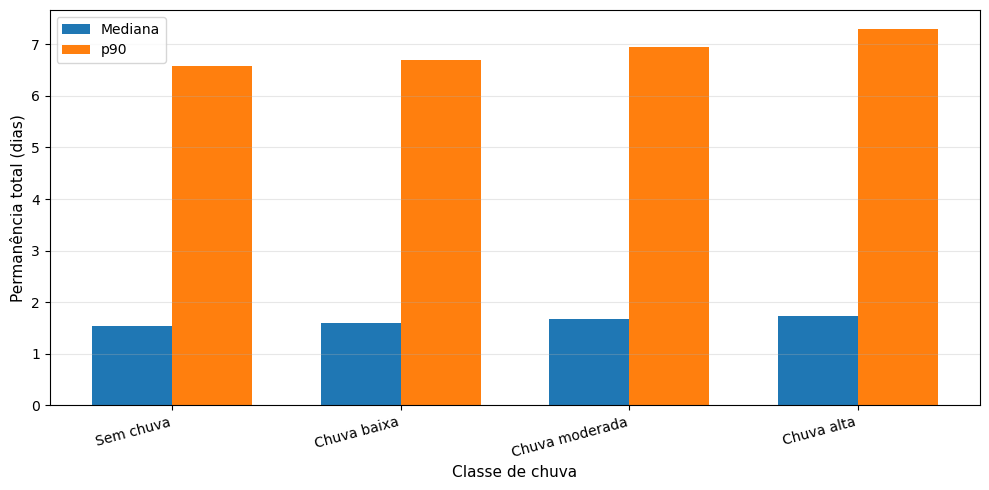

In [177]:
if "rain_summary" in globals():
    plot_data = rain_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["rain_class"], rotation=15, ha="right")

    # ax.set_title("Permanência total por classe de chuva no dia de chegada")
    ax.set_xlabel("Classe de chuva")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_09_total_stay_by_rain_class.png")
    plt.show()

    figure_path

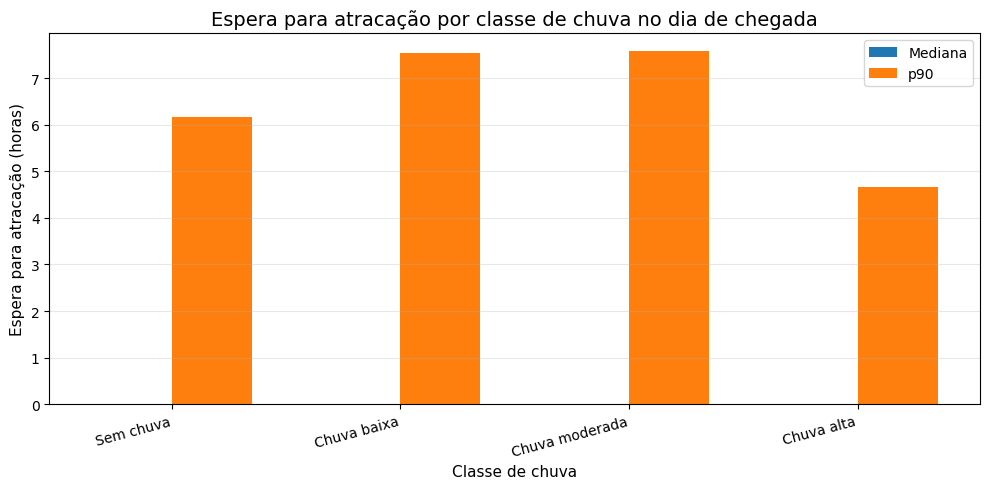

In [178]:
if "rain_summary" in globals():
    plot_data = rain_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_wait_h"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_wait_h"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["rain_class"], rotation=15, ha="right")

    ax.set_title("Espera para atracação por classe de chuva no dia de chegada")
    ax.set_xlabel("Classe de chuva")
    ax.set_ylabel("Espera para atracação (horas)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_09_wait_by_rain_class.png")
    plt.show()

    figure_path

A comparação por classe de chuva permite observar se registros em dias mais chuvosos apresentam maior permanência ou maior espera.

Se o p90 cresce nas classes de chuva mais intensa, isso pode indicar que a chuva está mais associada aos casos de risco do que ao comportamento típico. Esse padrão é importante porque variáveis climáticas podem ser particularmente úteis para prever a cauda do lead time.

### 9.5 Vento, rajadas e permanência portuária

Vento e rajadas podem afetar segurança de atracação, manobra, operação e saída da embarcação.

Nesta etapa, comparamos a permanência total e a espera para atracação entre diferentes classes de vento e rajada.

In [179]:
if "wind_class" in df_weather_binned.columns:
    wind_summary = (
        df_weather_binned
        .dropna(subset=["wind_class"])
        .groupby("wind_class", observed=True)
        .agg(
            n_calls=("port_call_id", "nunique"),
            median_total_h=("t_total_port_stay_h", "median"),
            p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
            median_wait_h=("t_wait_for_berthing_h", "median"),
            p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
            median_operation_h=("t_operation_h", "median"),
            p90_operation_h=("t_operation_h", lambda x: x.quantile(0.90)),
        )
        .reset_index()
    )

    for col in [
        "median_total_h",
        "p90_total_h",
        "median_wait_h",
        "p90_wait_h",
        "median_operation_h",
        "p90_operation_h",
    ]:
        wind_summary[col.replace("_h", "_d")] = wind_summary[col] / 24

    display(wind_summary)

,wind_class,n_calls,median_total_h,p90_total_h,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_d,p90_total_d,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d
0,Vento normal,97815,40.50,169.00,0.00,5.88,36.33,144.02,1.69,7.04,0.00,0.24,1.51,6.00
1,Vento alto,18857,35.77,147.59,0.00,6.93,32.18,127.50,1.49,6.15,0.00,0.29,1.34,5.31
2,Vento muito alto,12953,26.52,135.50,0.00,10.74,22.92,116.11,1.10,5.65,0.00,0.45,0.95,4.84


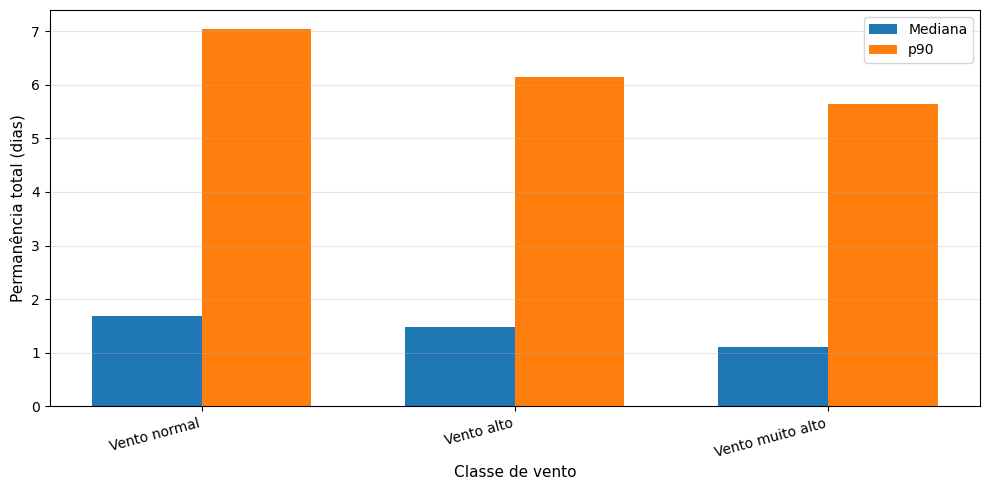

In [180]:
if "wind_summary" in globals():
    plot_data = wind_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["wind_class"], rotation=15, ha="right")

    # ax.set_title("Permanência total por classe de vento máximo")
    ax.set_xlabel("Classe de vento")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_09_total_stay_by_wind_class.png")
    plt.show()

    figure_path

In [181]:
if "gust_class" in df_weather_binned.columns:
    gust_summary = (
        df_weather_binned
        .dropna(subset=["gust_class"])
        .groupby("gust_class", observed=True)
        .agg(
            n_calls=("port_call_id", "nunique"),
            median_total_h=("t_total_port_stay_h", "median"),
            p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
            median_wait_h=("t_wait_for_berthing_h", "median"),
            p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
            median_operation_h=("t_operation_h", "median"),
            p90_operation_h=("t_operation_h", lambda x: x.quantile(0.90)),
        )
        .reset_index()
    )

    for col in [
        "median_total_h",
        "p90_total_h",
        "median_wait_h",
        "p90_wait_h",
        "median_operation_h",
        "p90_operation_h",
    ]:
        gust_summary[col.replace("_h", "_d")] = gust_summary[col] / 24

    display(gust_summary)

,gust_class,n_calls,median_total_h,p90_total_h,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_d,p90_total_d,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d
0,Rajada normal,98103,40.00,169.67,0.00,7.67,35.83,143.25,1.67,7.07,0.00,0.32,1.49,5.97
1,Rajada alta,18687,35.30,145.53,0.00,4.30,31.92,127.63,1.47,6.06,0.00,0.18,1.33,5.32
2,Rajada muito alta,12835,31.73,139.41,0.00,5.50,28.13,122.50,1.32,5.81,0.00,0.23,1.17,5.10


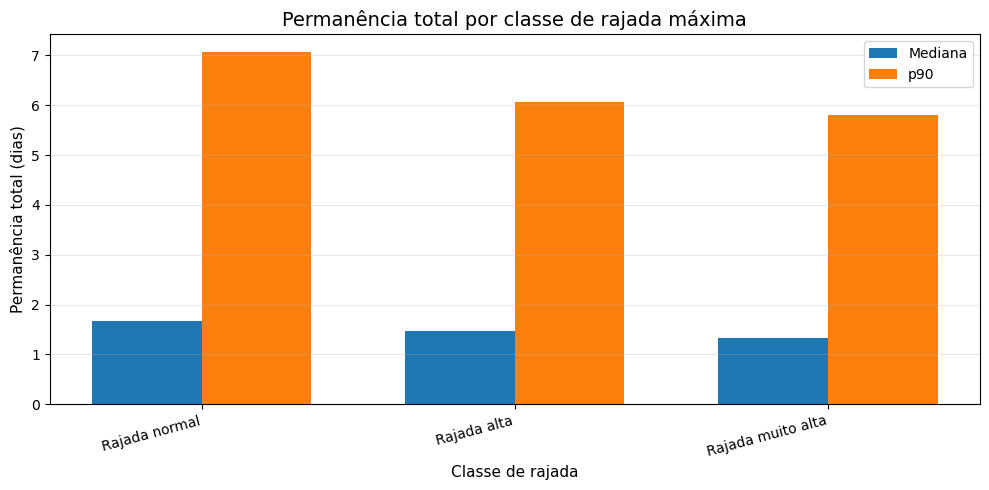

In [182]:
if "gust_summary" in globals():
    plot_data = gust_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["gust_class"], rotation=15, ha="right")

    ax.set_title("Permanência total por classe de rajada máxima")
    ax.set_xlabel("Classe de rajada")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_09_total_stay_by_gust_class.png")
    plt.show()

    figure_path

A análise de vento e rajadas busca identificar se condições potencialmente mais adversas estão associadas a maior permanência ou maior espera.

Se os grupos de vento ou rajada mais elevados apresentarem p90 maior, isso pode sugerir que o clima tem maior impacto nos cenários de risco do que no comportamento típico.

### 9.6 Histórico climático anterior à chegada

As condições climáticas anteriores à chegada também podem ser relevantes. Chuva acumulada ou vento forte nos dias anteriores podem afetar fila, produtividade, disponibilidade operacional ou atrasos acumulados.

Nesta etapa, comparamos variáveis climáticas do próprio dia com janelas históricas de 1, 3 e 7 dias.

In [183]:
weather_history_columns = [
    col for col in [
        "rain_sum",
        "rain_sum_prev_1d",
        "rain_sum_prev_3d",
        "rain_sum_prev_7d",
        "precipitation_sum",
        "precipitation_sum_prev_1d",
        "precipitation_hours",
        "precipitation_hours_prev_3d",
        "precipitation_hours_prev_7d",
        "wind_speed_10m_max",
        "wind_speed_10m_max_prev_1d",
        "wind_speed_10m_max_prev_3d",
        "wind_speed_10m_max_prev_7d",
        "wind_gusts_10m_max",
        "wind_gusts_10m_max_prev_1d",
        "wind_gusts_10m_max_prev_3d",
        "wind_gusts_10m_max_prev_7d",
    ]
    if col in df_weather.columns
]

weather_history_columns

['rain_sum',
 'rain_sum_prev_1d',
 'rain_sum_prev_3d',
 'rain_sum_prev_7d',
 'precipitation_sum',
 'precipitation_sum_prev_1d',
 'precipitation_hours',
 'precipitation_hours_prev_3d',
 'precipitation_hours_prev_7d',
 'wind_speed_10m_max',
 'wind_speed_10m_max_prev_1d',
 'wind_speed_10m_max_prev_3d',
 'wind_speed_10m_max_prev_7d',
 'wind_gusts_10m_max',
 'wind_gusts_10m_max_prev_1d',
 'wind_gusts_10m_max_prev_3d',
 'wind_gusts_10m_max_prev_7d']

In [184]:
weather_targets = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
    "t_total_port_stay_h",
]

weather_corr_rows = []

for weather_col in weather_history_columns:
    for target_col in weather_targets:
        valid = df_weather[[weather_col, target_col]].dropna()

        if len(valid) < 100:
            continue

        weather_corr_rows.append(
            {
                "weather_variable": weather_col,
                "target": target_col,
                "pearson_corr": valid[weather_col].corr(valid[target_col], method="pearson"),
                "spearman_corr": valid[weather_col].corr(valid[target_col], method="spearman"),
                "n_obs": len(valid),
            }
        )

weather_correlation = pd.DataFrame(weather_corr_rows)

weather_correlation["target_label"] = weather_correlation["target"].map(
    {
        "t_wait_for_berthing_h": "Espera para atracação",
        "t_operation_h": "Operação atracada",
        "t_post_operation_h": "Pós-operação",
        "t_total_port_stay_h": "Permanência total",
    }
)

weather_correlation.sort_values(
    "spearman_corr",
    ascending=False,
).head(20)

,weather_variable,target,pearson_corr,spearman_corr,n_obs,target_label
48,wind_speed_10m_max_prev_7d,t_wait_for_berthing_h,0.02,0.08,129625,Espera para atracação
44,wind_speed_10m_max_prev_3d,t_wait_for_berthing_h,0.01,0.07,129625,Espera para atracação
40,wind_speed_10m_max_prev_1d,t_wait_for_berthing_h,0.01,0.07,129625,Espera para atracação
36,wind_speed_10m_max,t_wait_for_berthing_h,0.01,0.07,129625,Espera para atracação
13,rain_sum_prev_7d,t_operation_h,0.02,0.04,129625,Operação atracada
17,precipitation_sum,t_operation_h,0.02,0.04,129625,Operação atracada
1,rain_sum,t_operation_h,0.02,0.04,129625,Operação atracada
33,precipitation_hours_prev_7d,t_operation_h,0.02,0.04,129625,Operação atracada
15,rain_sum_prev_7d,t_total_port_stay_h,0.02,0.04,129625,Permanência total
35,precipitation_hours_prev_7d,t_total_port_stay_h,0.02,0.03,129625,Permanência total


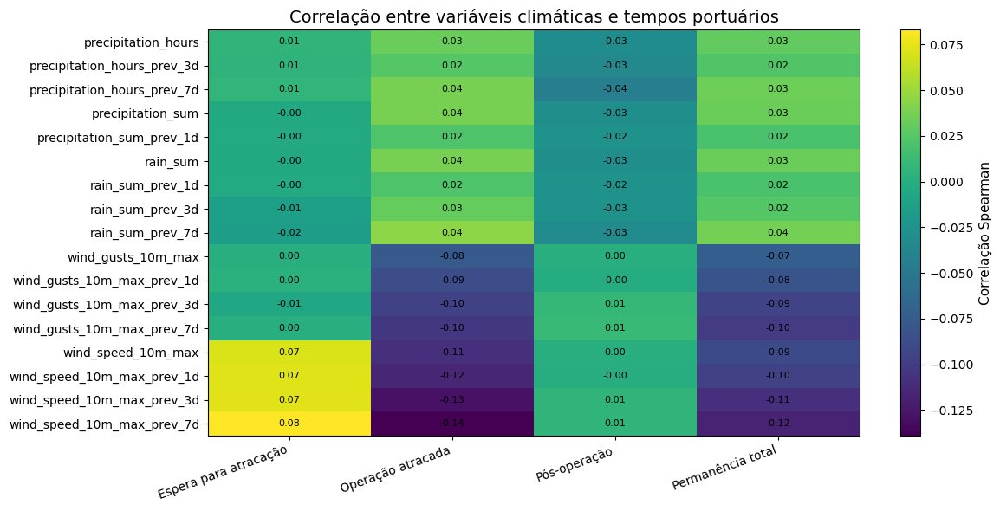

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_09_weather_target_spearman_correlation_heatmap.png')

In [185]:
weather_corr_pivot = (
    weather_correlation
    .pivot_table(
        index="weather_variable",
        columns="target_label",
        values="spearman_corr",
        aggfunc="first",
    )
)

target_order_for_corr = [
    "Espera para atracação",
    "Operação atracada",
    "Pós-operação",
    "Permanência total",
]

weather_corr_pivot = weather_corr_pivot.reindex(
    columns=target_order_for_corr
)

fig, ax = plt.subplots(figsize=(12, max(6, len(weather_corr_pivot) * 0.35)))

im = ax.imshow(weather_corr_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(weather_corr_pivot.columns)))
ax.set_xticklabels(weather_corr_pivot.columns, rotation=20, ha="right")

ax.set_yticks(np.arange(len(weather_corr_pivot.index)))
ax.set_yticklabels(weather_corr_pivot.index)

for i in range(weather_corr_pivot.shape[0]):
    for j in range(weather_corr_pivot.shape[1]):
        value = weather_corr_pivot.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value:.2f}",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Correlação Spearman")

ax.set_title("Correlação entre variáveis climáticas e tempos portuários")

figure_path = save_figure("eda_09_weather_target_spearman_correlation_heatmap.png")
plt.show()

figure_path

A correlação de Spearman mede associação monotônica entre as variáveis climáticas e os tempos portuários.

Correlações baixas não significam que o clima seja irrelevante. O efeito climático pode ser não linear, localizado em alguns portos, restrito a eventos extremos ou dependente de interações com tipo de operação e região.

Ainda assim, essa matriz ajuda a identificar quais variáveis climáticas parecem mais promissoras para investigação e modelagem.

### 9.7 Relação visual entre clima e permanência

Nesta etapa, usamos gráficos de dispersão para observar a relação entre variáveis climáticas selecionadas e a permanência total.

Como a base pode conter muitos registros, usamos uma amostra para facilitar a visualização.

In [186]:
weather_plot_sample_size = min(25000, len(df_weather))
weather_plot_sample = df_weather.sample(
    weather_plot_sample_size,
    random_state=42,
)

print(f"Weather scatter sample size: {len(weather_plot_sample):,}")

Weather scatter sample size: 25,000


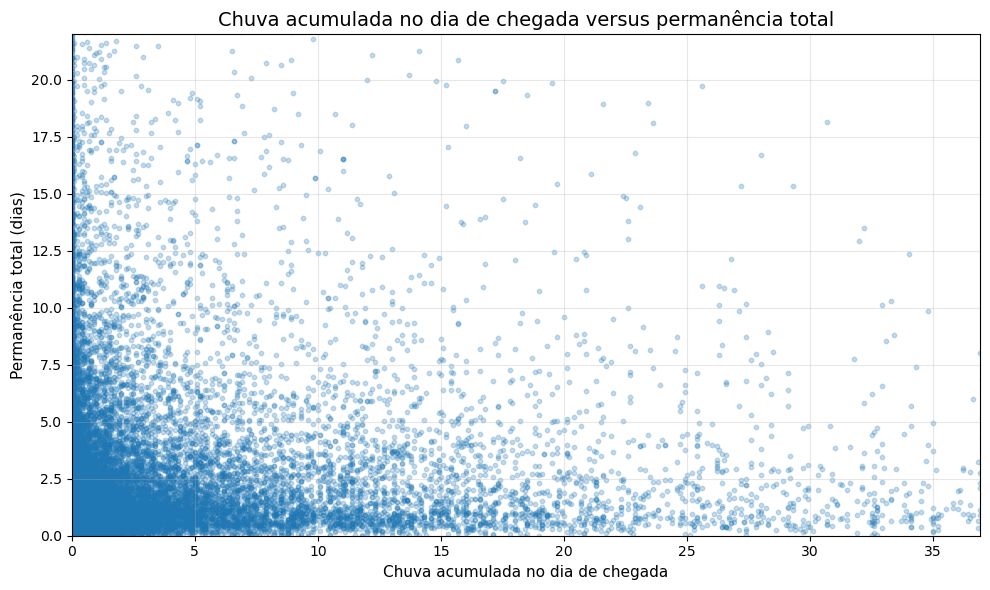

In [187]:
if "rain_sum" in weather_plot_sample.columns:
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.scatter(
        weather_plot_sample["rain_sum"],
        weather_plot_sample["t_total_port_stay_h"] / 24,
        alpha=0.25,
        s=10,
    )

    ax.set_title("Chuva acumulada no dia de chegada versus permanência total")
    ax.set_xlabel("Chuva acumulada no dia de chegada")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(alpha=0.3)

    ax.set_xlim(
        0,
        df_weather["rain_sum"].quantile(0.99),
    )
    ax.set_ylim(
        0,
        df_weather["t_total_port_stay_h"].quantile(0.99) / 24,
    )

    figure_path = save_figure("eda_09_scatter_rain_vs_total_stay.png")
    plt.show()

    figure_path

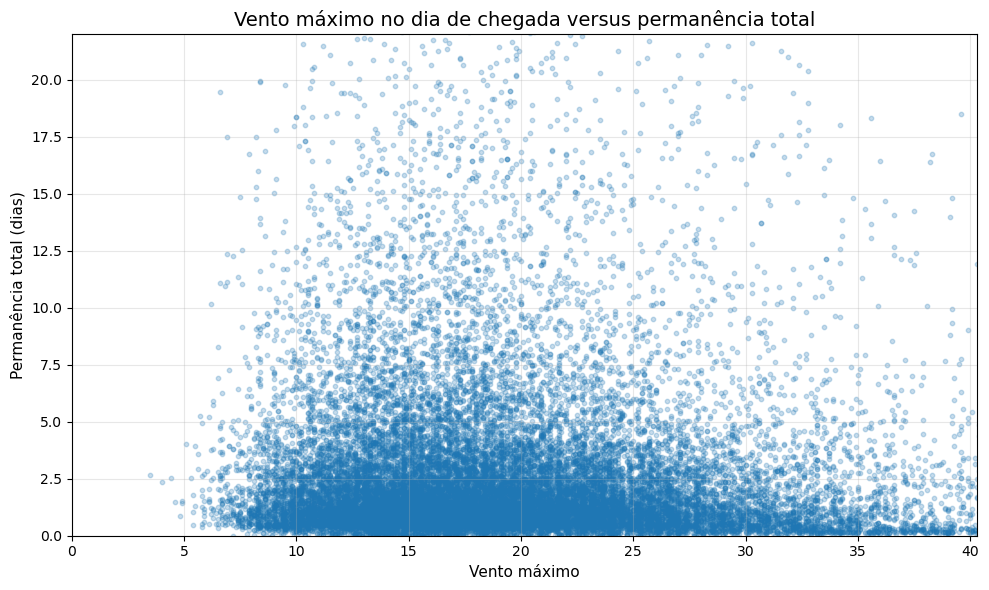

In [188]:
if "wind_speed_10m_max" in weather_plot_sample.columns:
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.scatter(
        weather_plot_sample["wind_speed_10m_max"],
        weather_plot_sample["t_total_port_stay_h"] / 24,
        alpha=0.25,
        s=10,
    )

    ax.set_title("Vento máximo no dia de chegada versus permanência total")
    ax.set_xlabel("Vento máximo")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(alpha=0.3)

    ax.set_xlim(
        0,
        df_weather["wind_speed_10m_max"].quantile(0.99),
    )
    ax.set_ylim(
        0,
        df_weather["t_total_port_stay_h"].quantile(0.99) / 24,
    )

    figure_path = save_figure("eda_09_scatter_wind_vs_total_stay.png")
    plt.show()

    figure_path

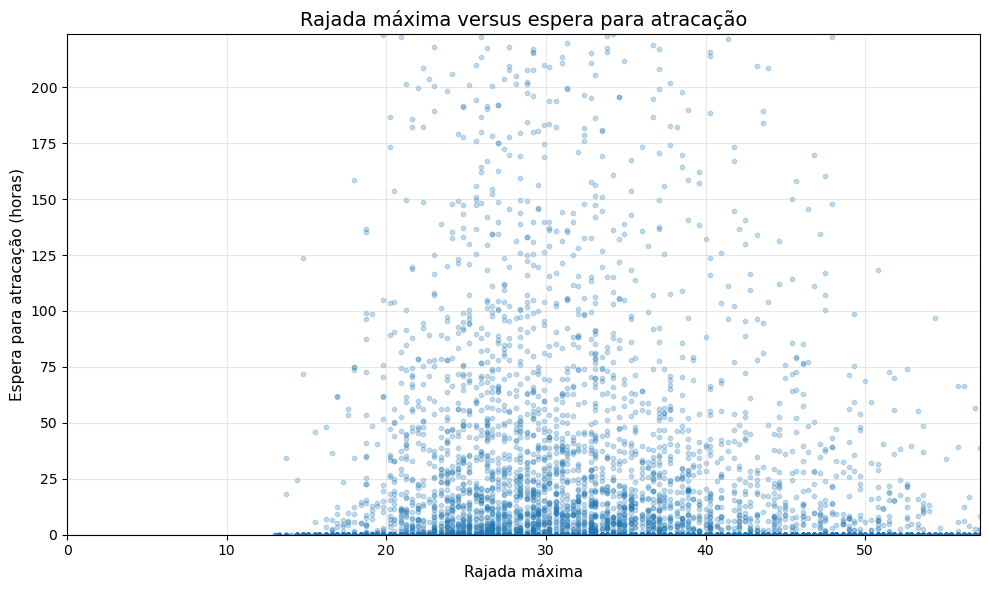

In [189]:
if "wind_gusts_10m_max" in weather_plot_sample.columns:
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.scatter(
        weather_plot_sample["wind_gusts_10m_max"],
        weather_plot_sample["t_wait_for_berthing_h"],
        alpha=0.25,
        s=10,
    )

    ax.set_title("Rajada máxima versus espera para atracação")
    ax.set_xlabel("Rajada máxima")
    ax.set_ylabel("Espera para atracação (horas)")
    ax.grid(alpha=0.3)

    ax.set_xlim(
        0,
        df_weather["wind_gusts_10m_max"].quantile(0.99),
    )
    ax.set_ylim(
        0,
        df_weather["t_wait_for_berthing_h"].quantile(0.99),
    )

    figure_path = save_figure("eda_09_scatter_gust_vs_wait.png")
    plt.show()

    figure_path

### 9.8 Clima e casos extremos

O clima pode não alterar fortemente a mediana, mas ainda assim estar associado aos casos extremos.

Nesta etapa, comparamos as condições climáticas entre escalas normais e escalas acima do p90 nacional da permanência total.

In [190]:
national_total_p90_h = df_weather["t_total_port_stay_h"].quantile(0.90)

df_weather_extreme = df_weather.copy()
df_weather_extreme["is_extreme_total_stay"] = (
    df_weather_extreme["t_total_port_stay_h"] >= national_total_p90_h
)

extreme_weather_summary_rows = []

for col in main_weather_columns:
    normal = df_weather_extreme.loc[
        ~df_weather_extreme["is_extreme_total_stay"],
        col,
    ].dropna()

    extreme = df_weather_extreme.loc[
        df_weather_extreme["is_extreme_total_stay"],
        col,
    ].dropna()

    if len(normal) == 0 or len(extreme) == 0:
        continue

    extreme_weather_summary_rows.append(
        {
            "weather_variable": col,
            "normal_mean": normal.mean(),
            "extreme_mean": extreme.mean(),
            "normal_median": normal.median(),
            "extreme_median": extreme.median(),
            "normal_p90": normal.quantile(0.90),
            "extreme_p90": extreme.quantile(0.90),
            "difference_median": extreme.median() - normal.median(),
            "difference_mean": extreme.mean() - normal.mean(),
        }
    )

extreme_weather_summary = pd.DataFrame(extreme_weather_summary_rows)

extreme_weather_summary

,weather_variable,normal_mean,extreme_mean,normal_median,extreme_median,normal_p90,extreme_p90,difference_median,difference_mean
0,rain_sum,3.52,4.04,0.60,0.70,10.40,11.90,0.10,0.52
1,precipitation_sum,3.52,4.04,0.60,0.70,10.40,11.90,0.10,0.52
2,precipitation_hours,6.85,7.25,4.00,4.00,19.00,20.00,0.00,0.39
3,wind_speed_10m_max,19.61,18.98,18.50,17.80,29.40,27.80,-0.70,-0.64
4,wind_gusts_10m_max,32.36,31.44,31.00,30.20,44.60,42.80,-0.80,-0.92
5,temperature_2m_mean,24.12,23.98,24.80,24.60,27.70,27.70,-0.20,-0.14


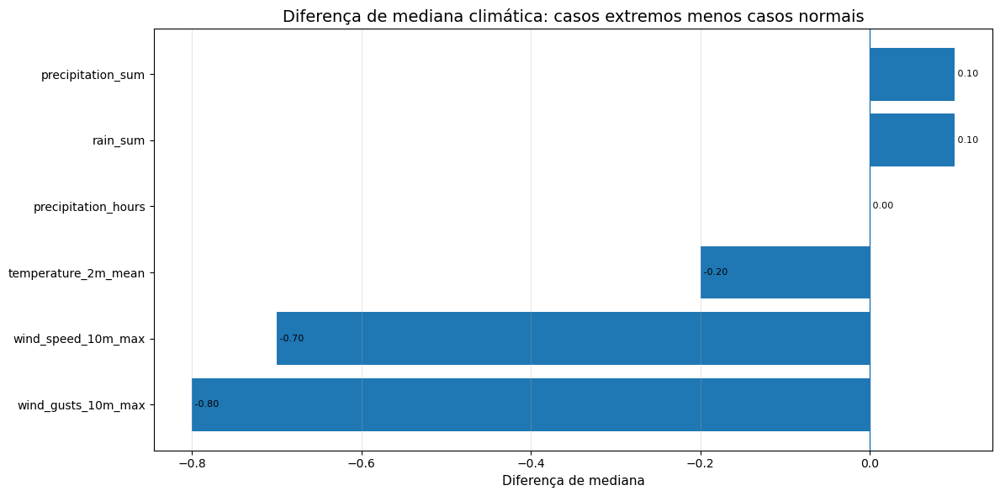

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_09_weather_difference_extreme_vs_normal.png')

In [191]:
plot_data = extreme_weather_summary.sort_values(
    "difference_median",
    ascending=True,
)

fig, ax = plt.subplots(figsize=(12, 6))

ax.barh(
    plot_data["weather_variable"],
    plot_data["difference_median"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.difference_median,
        index,
        f" {row.difference_median:.2f}",
        va="center",
        fontsize=8,
    )

ax.axvline(0, linewidth=1)
ax.set_title("Diferença de mediana climática: casos extremos menos casos normais")
ax.set_xlabel("Diferença de mediana")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_09_weather_difference_extreme_vs_normal.png")
plt.show()

figure_path

Comparar casos extremos com casos normais ajuda a verificar se condições climáticas adversas aparecem com maior intensidade na cauda do lead time.

Se uma variável climática apresenta valores mais altos nos casos extremos, ela pode ser útil para modelagem, mesmo que sua correlação geral com o tempo total seja baixa.

### 9.9 Clima por região

O efeito climático pode variar entre regiões. A mesma quantidade de chuva ou vento pode ter impactos diferentes dependendo da infraestrutura, do tipo de operação, do perfil dos portos e das condições locais.

Nesta etapa, comparamos a relação entre clima e permanência total por região.

In [192]:
if "rain_sum" in df_weather_binned.columns and "region" in df_weather_binned.columns:
    rain_region_summary = (
        df_weather_binned
        .dropna(subset=["region", "rain_class"])
        .groupby(["region", "rain_class"], observed=True)
        .agg(
            n_calls=("port_call_id", "nunique"),
            median_total_h=("t_total_port_stay_h", "median"),
            p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
            median_wait_h=("t_wait_for_berthing_h", "median"),
            p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
        )
        .reset_index()
    )

    for col in [
        "median_total_h",
        "p90_total_h",
        "median_wait_h",
        "p90_wait_h",
    ]:
        rain_region_summary[col.replace("_h", "_d")] = rain_region_summary[col] / 24

    display(rain_region_summary.head())

,region,rain_class,n_calls,median_total_h,p90_total_h,median_wait_h,p90_wait_h,median_total_d,p90_total_d,median_wait_d,p90_wait_d
0,NORDESTE,Chuva alta,2968,42.34,145.35,0.00,0.00,1.76,6.06,0.00,0.00
1,NORDESTE,Chuva baixa,10673,39.70,147.50,0.00,11.31,1.65,6.15,0.00,0.47
2,NORDESTE,Chuva moderada,6894,42.07,165.00,0.00,21.99,1.75,6.88,0.00,0.92
3,NORDESTE,Sem chuva,4701,28.00,121.32,0.00,0.00,1.17,5.05,0.00,0.00
4,NORTE,Chuva alta,2092,56.41,193.96,0.00,12.13,2.35,8.08,0.00,0.51


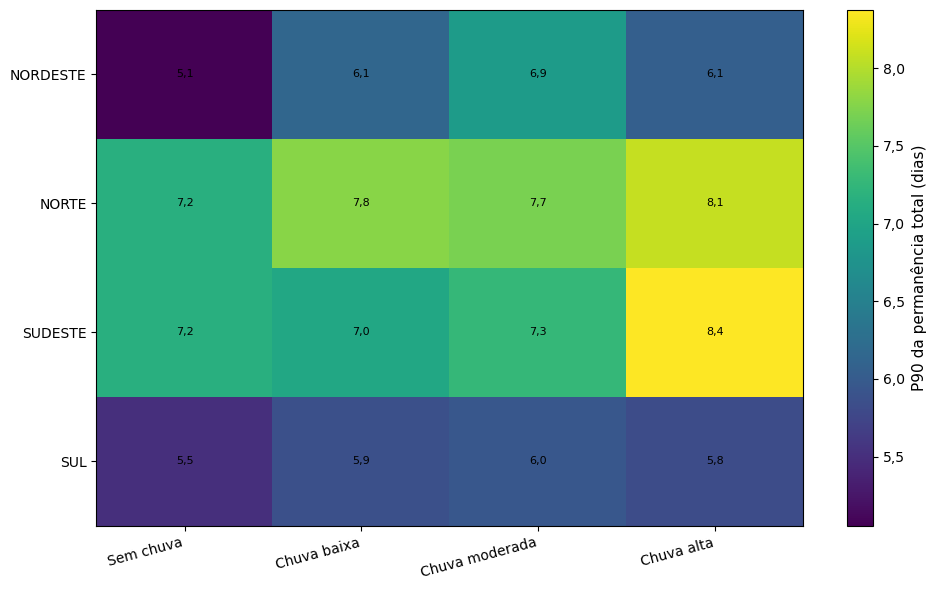

In [193]:
if "rain_region_summary" in globals():
    rain_region_p90_pivot = (
        rain_region_summary
        .pivot_table(
            index="region",
            columns="rain_class",
            values="p90_total_d",
            aggfunc="first",
            observed=True,
        )
        .reindex(columns=["Sem chuva", "Chuva baixa", "Chuva moderada", "Chuva alta"])
    )

    fig, ax = plt.subplots(figsize=(10, 6))

    im = ax.imshow(rain_region_p90_pivot.values, aspect="auto")

    ax.set_xticks(np.arange(len(rain_region_p90_pivot.columns)))
    ax.set_xticklabels(rain_region_p90_pivot.columns, rotation=15, ha="right")

    ax.set_yticks(np.arange(len(rain_region_p90_pivot.index)))
    ax.set_yticklabels(rain_region_p90_pivot.index)

    for i in range(rain_region_p90_pivot.shape[0]):
        for j in range(rain_region_p90_pivot.shape[1]):
            value = rain_region_p90_pivot.iloc[i, j]
            value_str = f"{value:.1f}".replace(".", ",")
            if pd.notna(value):
                ax.text(
                    j,
                    i,
                    value_str,
                    ha="center",
                    va="center",
                    fontsize=8,
                )

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("P90 da permanência total (dias)")

    # ax.set_title("p90 da permanência total por região e classe de chuva")

    # --- NOVA PARTE: Formatação da barra lateral ---
    def formatar_virgula(x, pos):
        # Formata com 1 casa decimal e troca o ponto pela vírgula
        return f"{x:.1f}".replace(".", ",")

    # Aplica a função formatadora aos números (ticks) da colorbar
    cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(formatar_virgula))
    # -----------------------------------------------

    figure_path = save_figure("eda_09_region_rain_p90_heatmap.png")
    plt.show()

    figure_path

O heatmap região × chuva ajuda a verificar se o possível efeito da chuva é homogêneo no país.

Se algumas regiões apresentam aumento relevante do p90 em condições de chuva alta, enquanto outras não, isso sugere que o efeito climático pode depender de características locais. Para modelagem, isso reforça a utilidade de interações entre clima, região e porto.

In [194]:
weather_relevance_score = (
    weather_correlation
    .loc[weather_correlation["target"] == "t_total_port_stay_h"]
    .copy()
)

weather_relevance_score["abs_spearman_corr"] = (
    weather_relevance_score["spearman_corr"].abs()
)

weather_relevance_score = weather_relevance_score.sort_values(
    "abs_spearman_corr",
    ascending=False,
)

weather_relevance_score.head(15)

,weather_variable,target,pearson_corr,spearman_corr,n_obs,target_label,abs_spearman_corr
51,wind_speed_10m_max_prev_7d,t_total_port_stay_h,-0.06,-0.12,129625,Permanência total,0.12
47,wind_speed_10m_max_prev_3d,t_total_port_stay_h,-0.05,-0.11,129625,Permanência total,0.11
67,wind_gusts_10m_max_prev_7d,t_total_port_stay_h,-0.06,-0.10,129625,Permanência total,0.10
43,wind_speed_10m_max_prev_1d,t_total_port_stay_h,-0.05,-0.10,129625,Permanência total,0.10
63,wind_gusts_10m_max_prev_3d,t_total_port_stay_h,-0.06,-0.09,129625,Permanência total,0.09
39,wind_speed_10m_max,t_total_port_stay_h,-0.05,-0.09,129625,Permanência total,0.09
59,wind_gusts_10m_max_prev_1d,t_total_port_stay_h,-0.05,-0.08,129625,Permanência total,0.08
55,wind_gusts_10m_max,t_total_port_stay_h,-0.05,-0.07,129625,Permanência total,0.07
15,rain_sum_prev_7d,t_total_port_stay_h,0.02,0.04,129625,Permanência total,0.04
35,precipitation_hours_prev_7d,t_total_port_stay_h,0.02,0.03,129625,Permanência total,0.03


In [195]:
weather_coverage_pct = df_weather_eda["has_weather_data_analysis"].mean() * 100

top_weather_corr = weather_relevance_score.iloc[0]

section_9_narrative = f"""
A análise climática foi realizada sobre o subconjunto de registros com dados climáticos disponíveis.
A cobertura climática na base é de {weather_coverage_pct:.1f}% dos registros elegíveis.

Entre as variáveis avaliadas, a maior associação monotônica absoluta com a permanência total foi observada em {top_weather_corr['weather_variable']}, com correlação de Spearman de {top_weather_corr['spearman_corr']:.3f}.

Essa associação deve ser interpretada como evidência exploratória, não como causalidade. O efeito do clima pode ser não linear, localizado em determinados portos ou regiões, e dependente do tipo de operação.
"""

print(section_9_narrative)


A análise climática foi realizada sobre o subconjunto de registros com dados climáticos disponíveis.
A cobertura climática na base é de 100.0% dos registros elegíveis.

Entre as variáveis avaliadas, a maior associação monotônica absoluta com a permanência total foi observada em wind_speed_10m_max_prev_7d, com correlação de Spearman de -0.118.

Essa associação deve ser interpretada como evidência exploratória, não como causalidade. O efeito do clima pode ser não linear, localizado em determinados portos ou regiões, e dependente do tipo de operação.



In [196]:
weather_coverage_path = TABLES_DIR / "eda_09_weather_coverage.csv"
weather_descriptive_summary_path = TABLES_DIR / "eda_09_weather_descriptive_summary.csv"
weather_correlation_path = TABLES_DIR / "eda_09_weather_correlation.csv"
extreme_weather_summary_path = TABLES_DIR / "eda_09_extreme_weather_summary.csv"
weather_relevance_score_path = TABLES_DIR / "eda_09_weather_relevance_score.csv"

weather_coverage.to_csv(weather_coverage_path, index=False)
weather_descriptive_summary.to_csv(weather_descriptive_summary_path, index=False)
weather_correlation.to_csv(weather_correlation_path, index=False)
extreme_weather_summary.to_csv(extreme_weather_summary_path, index=False)
weather_relevance_score.to_csv(weather_relevance_score_path, index=False)

if "rain_summary" in globals():
    rain_summary_path = TABLES_DIR / "eda_09_rain_summary.csv"
    rain_summary.to_csv(rain_summary_path, index=False)

if "wind_summary" in globals():
    wind_summary_path = TABLES_DIR / "eda_09_wind_summary.csv"
    wind_summary.to_csv(wind_summary_path, index=False)

if "gust_summary" in globals():
    gust_summary_path = TABLES_DIR / "eda_09_gust_summary.csv"
    gust_summary.to_csv(gust_summary_path, index=False)

[
    weather_coverage_path,
    weather_descriptive_summary_path,
    weather_correlation_path,
    extreme_weather_summary_path,
    weather_relevance_score_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_09_weather_coverage.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_09_weather_descriptive_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_09_weather_correlation.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_09_extreme_weather_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_09_weather_relevance_score.csv')]

### Principais mensagens da seção

A análise climática trata o clima como um fator exógeno potencialmente relevante para a permanência portuária.

Os resultados devem ser interpretados de forma exploratória. Correlações simples podem ser baixas porque o efeito do clima tende a ser localizado, não linear e dependente de contexto. Uma chuva intensa pode afetar alguns portos, cargas ou operações, mas ter pouco impacto em outros casos.

Ainda assim, variáveis como chuva, precipitação acumulada, vento e rajadas podem carregar informação útil para previsão de lead time, especialmente quando combinadas com porto, região, tipo de operação e sazonalidade.

Para a modelagem, esta seção sugere que as variáveis climáticas devem ser mantidas como candidatas a features, mas sua importância deve ser avaliada em modelos multivariados. O clima pode não explicar sozinho a permanência portuária, mas pode contribuir para identificar situações de maior risco operacional.

A próxima seção investigará congestionamento portuário e memória operacional, avaliando se o histórico recente de chegadas e tempos no porto ajuda a explicar a permanência da escala atual.

---

## 10. Congestionamento portuário e memória operacional

A permanência de uma embarcação no porto não depende apenas das características da própria escala. Ela também pode ser influenciada pela condição operacional recente do porto.

Se um porto recebeu muitas embarcações nos dias anteriores, se a espera média recente está elevada ou se há maior variabilidade nas últimas escalas, a próxima embarcação pode enfrentar um ambiente operacional mais congestionado.

Nesta seção, investigamos o conceito de **memória operacional**: a ideia de que o desempenho recente de um porto pode carregar informação útil para explicar o lead time atual.

A pergunta principal é:

> O histórico recente de chegadas, espera e operação no porto está associado a maior permanência ou maior risco de atraso?

Essa análise é importante para o TCC porque proxies de congestionamento podem ser variáveis preditivas relevantes. Se o estado recente do porto ajuda a antecipar atrasos, modelos de machine learning podem usar essas informações para estimar lead times de forma mais dinâmica.

### Variáveis de congestionamento disponíveis

A base contém algumas variáveis criadas a partir do histórico recente do porto:

- `avg_wait_prev_20_calls_port`: média da espera para atracação nas 20 escalas anteriores do porto.
- `avg_operation_prev_20_calls_port`: média da operação atracada nas 20 escalas anteriores do porto.
- `std_wait_prev_20_calls_port`: desvio padrão da espera para atracação nas 20 escalas anteriores do porto.
- `arrivals_same_day_port`: número de chegadas no mesmo porto e no mesmo dia.
- `arrivals_prev_day_port`: número de chegadas no porto no dia anterior.
- `arrivals_prev_7d_avg_port`: média de chegadas diárias no porto nos 7 dias anteriores.

Essas variáveis buscam capturar dois aspectos diferentes:

1. **pressão de volume**, representada por chegadas recentes;
2. **memória de performance**, representada por tempos recentes de espera e operação.

In [197]:
congestion_candidate_columns = [
    "avg_wait_prev_20_calls_port",
    "avg_operation_prev_20_calls_port",
    "std_wait_prev_20_calls_port",
    "arrivals_same_day_port",
    "arrivals_prev_day_port",
    "arrivals_prev_7d_avg_port",
]

congestion_columns = [
    col for col in congestion_candidate_columns
    if col in df.columns
]

if not congestion_columns:
    raise ValueError(
        "No congestion columns were found in the EDA base. "
        "Check whether congestion features were created in the pipeline."
    )

congestion_columns

['avg_wait_prev_20_calls_port',
 'avg_operation_prev_20_calls_port',
 'std_wait_prev_20_calls_port',
 'arrivals_same_day_port',
 'arrivals_prev_day_port',
 'arrivals_prev_7d_avg_port']

In [198]:
df_congestion = df.copy()

required_congestion_base_columns = [
    "port_call_id",
    "port",
    "port_display",
    "region",
    "arrival_port_ts",
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_total_port_stay_h",
]

missing_congestion_base_columns = [
    col for col in required_congestion_base_columns
    if col not in df_congestion.columns
]

if missing_congestion_base_columns:
    raise ValueError(
        "Missing required columns for congestion analysis:\n"
        + "\n".join(f"- {col}" for col in missing_congestion_base_columns)
    )

df_congestion["arrival_port_ts"] = pd.to_datetime(
    df_congestion["arrival_port_ts"],
    errors="coerce",
)

if "t_total_port_stay_d" not in df_congestion.columns:
    df_congestion["t_total_port_stay_d"] = (
        df_congestion["t_total_port_stay_h"] / 24
    )

df_congestion["has_any_congestion_feature"] = (
    df_congestion[congestion_columns].notna().any(axis=1)
)

print(f"Total rows: {len(df_congestion):,}")
print(
    "Rows with at least one congestion feature: "
    f"{df_congestion['has_any_congestion_feature'].sum():,}"
)
print(
    "Coverage: "
    f"{df_congestion['has_any_congestion_feature'].mean() * 100:.2f}%"
)

Total rows: 129,625
Rows with at least one congestion feature: 129,625
Coverage: 100.00%


In [199]:
congestion_coverage = pd.DataFrame(
    [
        {
            "congestion_variable": col,
            "non_null_count": df_congestion[col].notna().sum(),
            "non_null_pct": df_congestion[col].notna().mean() * 100,
        }
        for col in congestion_columns
    ]
).sort_values("non_null_pct", ascending=False)

congestion_coverage

,congestion_variable,non_null_count,non_null_pct
3,arrivals_same_day_port,129625,100.00
4,arrivals_prev_day_port,129457,99.87
1,avg_operation_prev_20_calls_port,129088,99.59
0,avg_wait_prev_20_calls_port,129088,99.59
2,std_wait_prev_20_calls_port,129088,99.59
5,arrivals_prev_7d_avg_port,129057,99.56


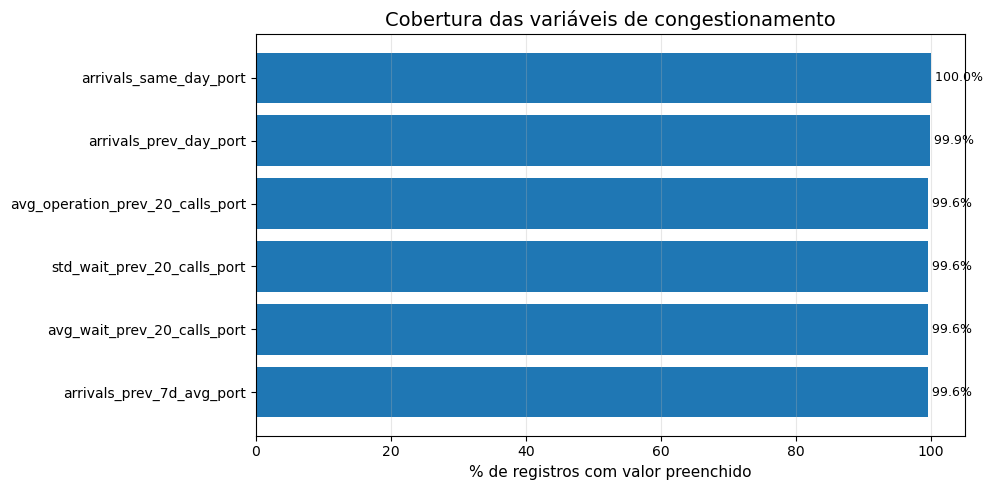

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_10_congestion_variable_coverage.png')

In [200]:
plot_data = congestion_coverage.sort_values("non_null_pct", ascending=True)

fig, ax = plt.subplots(figsize=(10, 5))

ax.barh(
    plot_data["congestion_variable"],
    plot_data["non_null_pct"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.non_null_pct,
        index,
        f" {row.non_null_pct:.1f}%",
        va="center",
        fontsize=9,
    )

ax.set_title("Cobertura das variáveis de congestionamento")
ax.set_xlabel("% de registros com valor preenchido")
ax.set_ylabel("")
ax.set_xlim(0, 105)
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_10_congestion_variable_coverage.png")
plt.show()

figure_path

A cobertura das variáveis de congestionamento precisa ser interpretada com atenção.

Algumas variáveis históricas dependem da existência de escalas anteriores no mesmo porto. Por isso, é esperado que os primeiros registros de cada porto não tenham média histórica disponível.

Essa ausência não representa necessariamente problema de dados; ela pode ser consequência natural da construção das features históricas.

In [201]:
congestion_descriptive_summary = pd.DataFrame(
    [
        {
            "variable": col,
            "count": df_congestion[col].count(),
            "mean": df_congestion[col].mean(),
            "median": df_congestion[col].median(),
            "std": df_congestion[col].std(),
            "min": df_congestion[col].min(),
            "p25": df_congestion[col].quantile(0.25),
            "p75": df_congestion[col].quantile(0.75),
            "p90": df_congestion[col].quantile(0.90),
            "p95": df_congestion[col].quantile(0.95),
            "p99": df_congestion[col].quantile(0.99),
            "max": df_congestion[col].max(),
        }
        for col in congestion_columns
    ]
)

congestion_descriptive_summary

,variable,count,mean,median,std,min,p25,p75,p90,p95,p99,max
0,avg_wait_prev_20_calls_port,129088,8.52,0.00,19.94,0.00,0.00,7.13,28.90,49.10,98.91,194.22
1,avg_operation_prev_20_calls_port,129088,61.87,58.38,32.27,1.23,40.11,79.45,102.79,119.05,154.80,427.26
2,std_wait_prev_20_calls_port,129088,17.02,0.00,36.40,0.00,0.00,15.65,62.06,103.02,169.19,252.95
3,arrivals_same_day_port,129625,9.01,5.00,8.64,1.00,2.00,16.00,23.00,26.00,31.00,40.00
4,arrivals_prev_day_port,129457,8.29,4.00,8.37,1.00,2.00,14.00,21.00,25.00,30.00,40.00
5,arrivals_prev_7d_avg_port,129057,8.27,4.00,7.81,1.00,1.71,14.57,21.29,22.86,25.00,28.71


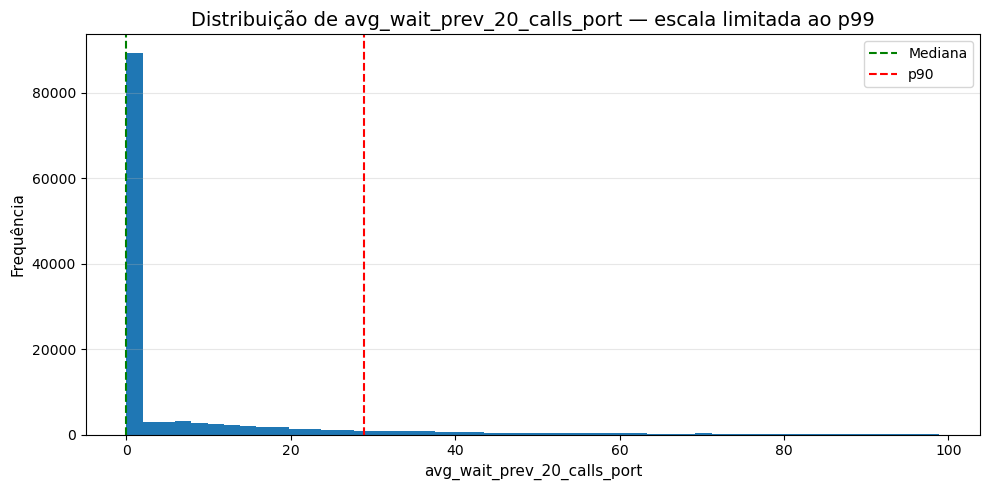

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_distribution_avg_wait_prev_20_calls_port.png


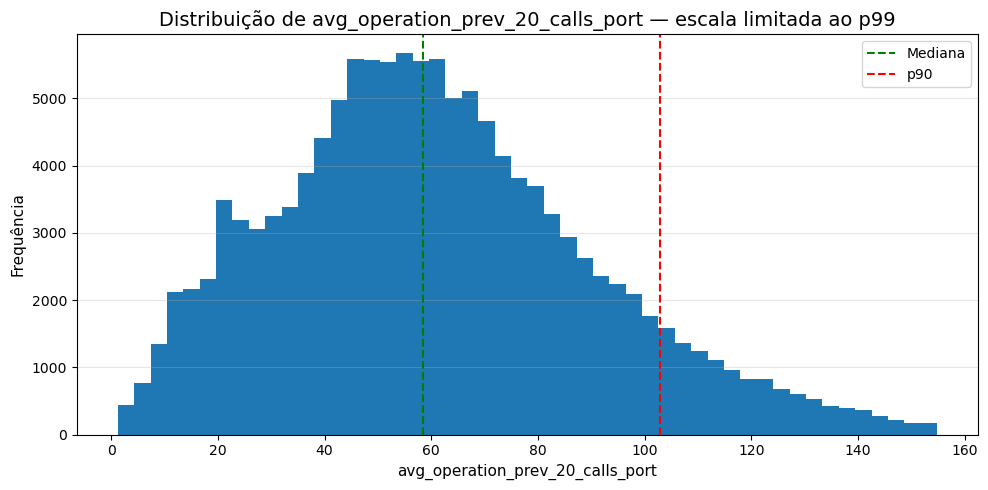

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_distribution_avg_operation_prev_20_calls_port.png


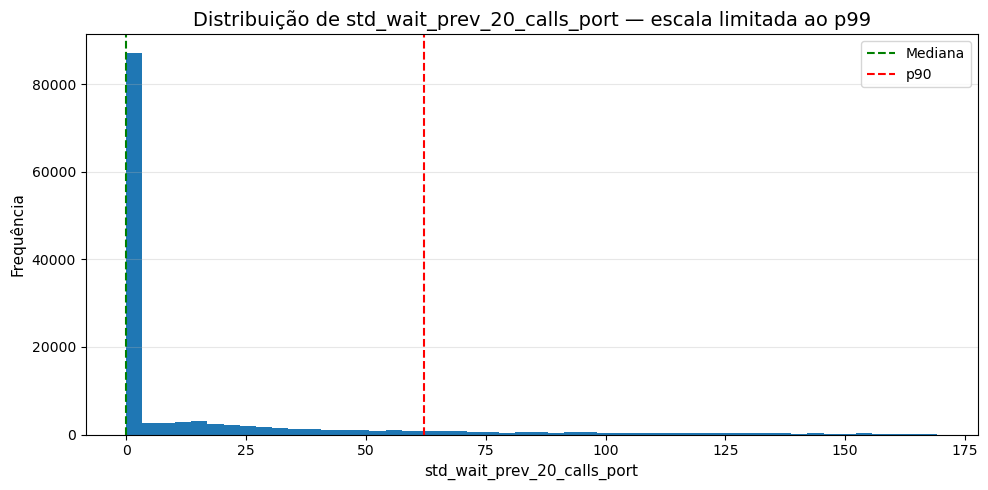

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_distribution_std_wait_prev_20_calls_port.png


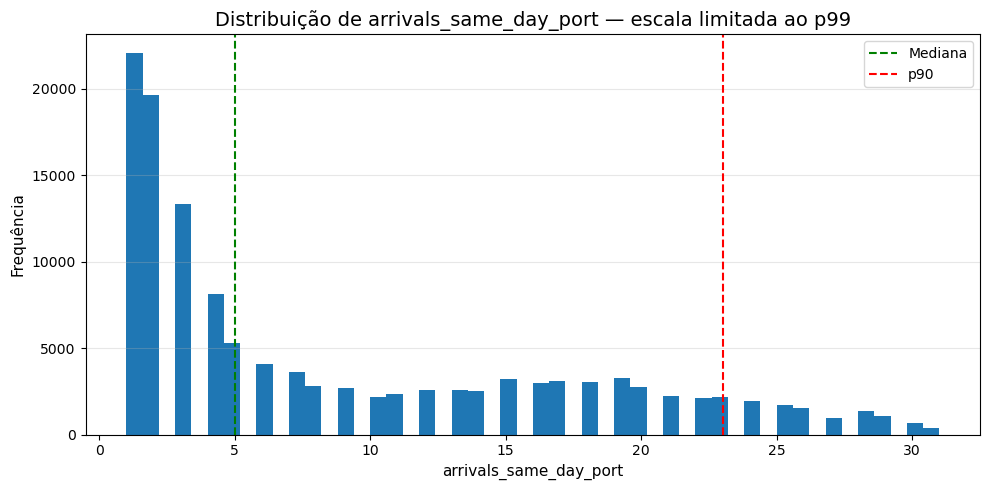

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_distribution_arrivals_same_day_port.png


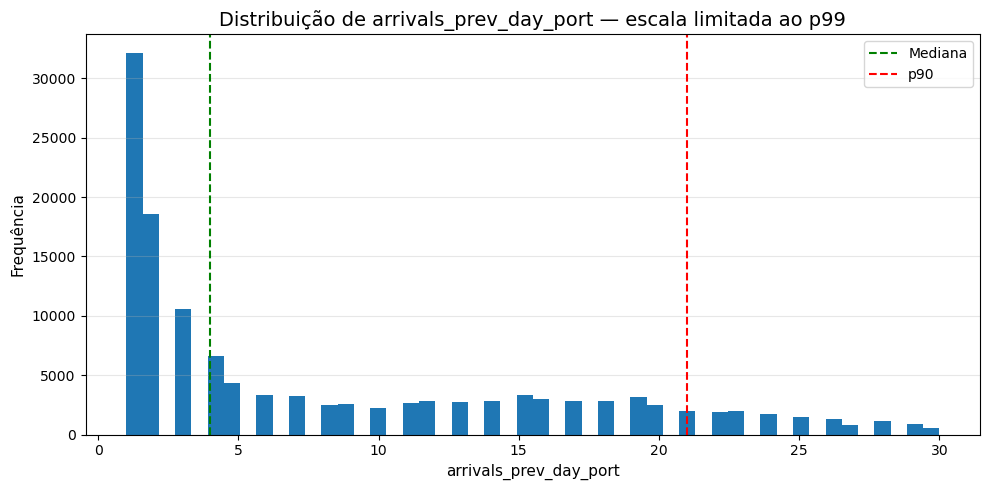

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_distribution_arrivals_prev_day_port.png


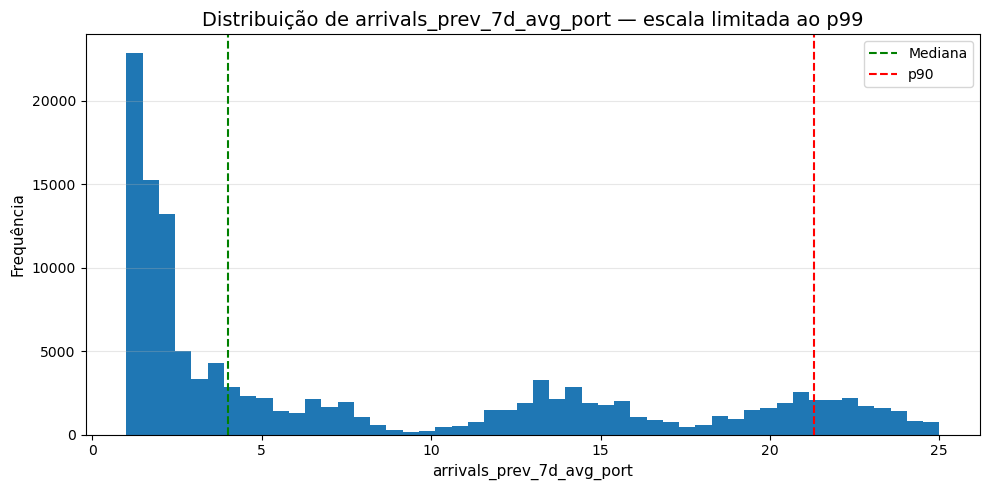

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_distribution_arrivals_prev_7d_avg_port.png


In [202]:
for col in congestion_columns:
    series = df_congestion[col].dropna()

    if series.empty:
        continue

    upper_limit = series.quantile(0.99)
    plot_series = series[series <= upper_limit]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.hist(plot_series, bins=50)

    ax.axvline(series.median(), linestyle="--", linewidth=1.5, label="Mediana", color="green")
    ax.axvline(series.quantile(0.90), linestyle="--", linewidth=1.5, label="p90", color="red")

    ax.set_title(f"Distribuição de {col} — escala limitada ao p99")
    ax.set_xlabel(col)
    ax.set_ylabel("Frequência")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure(f"eda_10_distribution_{col}.png")
    plt.show()

    print(figure_path)

As distribuições mostram se as proxies de congestionamento são concentradas ou dispersas.

Variáveis como chegadas no mesmo dia ou média de chegadas nos últimos 7 dias tendem a representar pressão de volume. Já médias e desvios históricos de espera capturam a memória recente do desempenho operacional do porto.

### 10.3 Correlação com tempos portuários

Nesta etapa, avaliamos a associação entre variáveis de congestionamento e os principais tempos portuários.

A correlação não deve ser interpretada como causalidade, mas ajuda a indicar quais proxies de congestionamento parecem mais associadas à permanência total, à espera para atracação ou à operação atracada.

Usaremos correlação de Pearson e Spearman. A correlação de Spearman é especialmente útil quando a relação é monotônica, mas não necessariamente linear.

In [203]:
congestion_targets = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
    "t_total_port_stay_h",
]

target_label_map = {
    "t_wait_for_berthing_h": "Espera para atracação",
    "t_operation_h": "Operação atracada",
    "t_post_operation_h": "Pós-operação",
    "t_total_port_stay_h": "Permanência total",
}

congestion_columns_label_map = {
    "avg_wait_prev_20_calls_port": "Média de espera das 20 últimas estadias",
    "avg_operation_prev_20_calls_port": "Média de operação das 20 últimas estadias",
    "std_wait_prev_20_calls_port": "Desvio padrão de espera das 20 últimas estadias",
    "avg_wait_prev_20_calls_port": "Média de espera das 20 últimas estadias",
    "arrivals_prev_7d_avg_port": "Média de chegadas nos últimos 7 dias",
    "arrivals_prev_day_port": "Chegadas no dia anterior",
    "arrivals_same_day_port": "Chegadas no mesmo dia"
}

congestion_corr_rows = []

for congestion_col in congestion_columns:
    for target_col in congestion_targets:
        valid = df_congestion[[congestion_col, target_col]].dropna()

        if len(valid) < 100:
            continue

        congestion_corr_rows.append(
            {
                "congestion_variable": congestion_col,
                "congestion_variable_label": congestion_columns_label_map[congestion_col],
                "target": target_col,
                "target_label": target_label_map[target_col],
                "pearson_corr": valid[congestion_col].corr(
                    valid[target_col],
                    method="pearson",
                ),
                "spearman_corr": valid[congestion_col].corr(
                    valid[target_col],
                    method="spearman",
                ),
                "n_obs": len(valid),
            }
        )

congestion_correlation = pd.DataFrame(congestion_corr_rows)

congestion_correlation.sort_values(
    "spearman_corr",
    ascending=False,
).head(20)

,congestion_variable,congestion_variable_label,target,target_label,pearson_corr,spearman_corr,n_obs
0,avg_wait_prev_20_calls_port,Média de espera das 20 últimas estadias,t_wait_for_berthing_h,Espera para atracação,0.36,0.55,129088
8,std_wait_prev_20_calls_port,Desvio padrão de espera das 20 últimas estadias,t_wait_for_berthing_h,Espera para atracação,0.33,0.53,129088
5,avg_operation_prev_20_calls_port,Média de operação das 20 últimas estadias,t_operation_h,Operação atracada,0.27,0.38,129088
7,avg_operation_prev_20_calls_port,Média de operação das 20 últimas estadias,t_total_port_stay_h,Permanência total,0.24,0.34,129088
11,std_wait_prev_20_calls_port,Desvio padrão de espera das 20 últimas estadias,t_total_port_stay_h,Permanência total,0.17,0.10,129088
3,avg_wait_prev_20_calls_port,Média de espera das 20 últimas estadias,t_total_port_stay_h,Permanência total,0.18,0.10,129088
22,arrivals_prev_7d_avg_port,Média de chegadas nos últimos 7 dias,t_post_operation_h,Pós-operação,0.04,0.09,129057
14,arrivals_same_day_port,Chegadas no mesmo dia,t_post_operation_h,Pós-operação,0.04,0.08,129625
18,arrivals_prev_day_port,Chegadas no dia anterior,t_post_operation_h,Pós-operação,0.04,0.08,129457
12,arrivals_same_day_port,Chegadas no mesmo dia,t_wait_for_berthing_h,Espera para atracação,0.02,0.05,129625


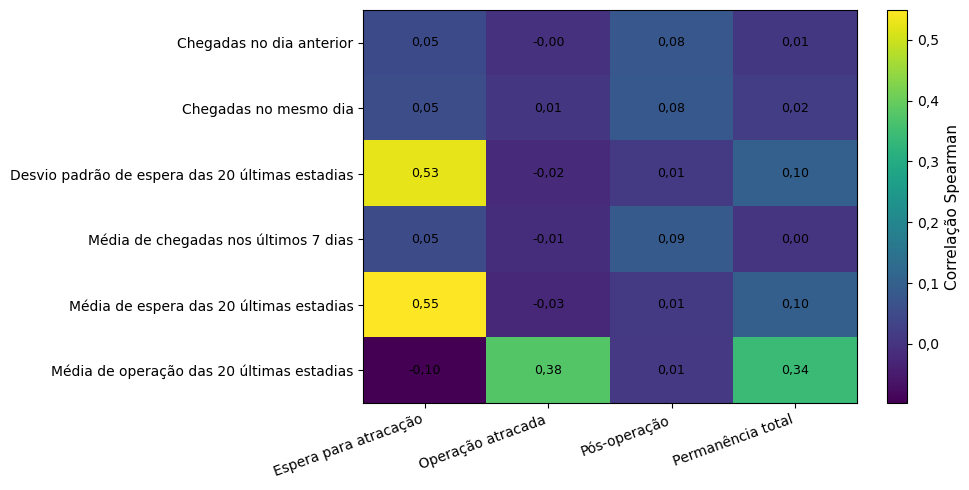

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_10_congestion_target_spearman_correlation_heatmap.png')

In [204]:
congestion_corr_pivot = (
    congestion_correlation
    .pivot_table(
        index="congestion_variable_label",
        #index="congestion_variable",
        columns="target_label",
        values="spearman_corr",
        aggfunc="first",
    )
)

target_order_for_congestion = [
    "Espera para atracação",
    "Operação atracada",
    "Pós-operação",
    "Permanência total",
]

congestion_corr_pivot = congestion_corr_pivot.reindex(
    columns=target_order_for_congestion
)

fig, ax = plt.subplots(figsize=(10, max(5, len(congestion_corr_pivot) * 0.6)))

im = ax.imshow(congestion_corr_pivot.values, aspect="auto")

ax.set_xticks(np.arange(len(congestion_corr_pivot.columns)))
ax.set_xticklabels(congestion_corr_pivot.columns, rotation=20, ha="right")

ax.set_yticks(np.arange(len(congestion_corr_pivot.index)))
ax.set_yticklabels(congestion_corr_pivot.index)

for i in range(congestion_corr_pivot.shape[0]):
    for j in range(congestion_corr_pivot.shape[1]):
        value = congestion_corr_pivot.iloc[i, j]
        value_str = f"{value:.2f}".replace(".", ",")
        if pd.notna(value):
            ax.text(
                j,
                i,
                value_str,
                ha="center",
                va="center",
                fontsize=9,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Correlação Spearman")

# ax.set_title("Correlação entre congestionamento e tempos portuários")

# --- NOVA PARTE: Formatação da barra lateral ---
def formatar_virgula(x, pos):
    # Formata com 1 casa decimal e troca o ponto pela vírgula
    return f"{x:.1f}".replace(".", ",")

# Aplica a função formatadora aos números (ticks) da colorbar
cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(formatar_virgula))
# -----------------------------------------------

figure_path = save_figure("eda_10_congestion_target_spearman_correlation_heatmap.png")
plt.show()

figure_path

A matriz de correlação ajuda a identificar quais proxies de congestionamento parecem mais associadas aos tempos portuários.

Uma correlação positiva entre espera recente e permanência total, por exemplo, sugeriria que portos que vinham apresentando maior espera tendem a continuar com tempos mais altos nas escalas seguintes.

Esse tipo de variável é relevante para modelagem porque carrega informação dinâmica sobre o estado recente do porto.

### 10.4 Faixas de congestionamento

Para facilitar a interpretação, transformaremos algumas variáveis contínuas de congestionamento em faixas.

Essas faixas são exploratórias e baseadas em quantis da própria base. Elas ajudam a responder perguntas como:

- escalas em dias com mais chegadas têm maior permanência?
- portos com maior espera recente apresentam maior risco de cauda?
- o histórico operacional recente diferencia casos normais de casos críticos?

In [205]:
df_congestion_binned = df_congestion.copy()

def classify_by_quantiles(
    series: pd.Series,
    labels: list[str] | None = None,
) -> pd.Series:
    """Classify a numeric series into low, medium and high quantile groups."""
    labels = labels or ["Baixo", "Médio", "Alto"]

    result = pd.Series(index=series.index, dtype="object")
    result.loc[series.isna()] = np.nan

    valid = series.dropna()

    if valid.nunique() < 3:
        result.loc[series.notna()] = "Disponível"
        return result

    q33 = valid.quantile(0.33)
    q66 = valid.quantile(0.66)

    result.loc[series <= q33] = labels[0]
    result.loc[(series > q33) & (series <= q66)] = labels[1]
    result.loc[series > q66] = labels[2]

    return result


if "arrivals_same_day_port" in df_congestion_binned.columns:
    df_congestion_binned["same_day_arrival_class"] = classify_by_quantiles(
        df_congestion_binned["arrivals_same_day_port"],
        labels=[
            "Baixo volume no dia",
            "Médio volume no dia",
            "Alto volume no dia",
        ],
    )

if "arrivals_prev_7d_avg_port" in df_congestion_binned.columns:
    df_congestion_binned["prev_7d_arrival_class"] = classify_by_quantiles(
        df_congestion_binned["arrivals_prev_7d_avg_port"],
        labels=[
            "Baixo volume recente",
            "Médio volume recente",
            "Alto volume recente",
        ],
    )

if "avg_wait_prev_20_calls_port" in df_congestion_binned.columns:
    df_congestion_binned["prev_wait_class"] = classify_by_quantiles(
        df_congestion_binned["avg_wait_prev_20_calls_port"],
        labels=[
            "Baixa espera recente",
            "Média espera recente",
            "Alta espera recente",
        ],
    )

if "std_wait_prev_20_calls_port" in df_congestion_binned.columns:
    df_congestion_binned["prev_wait_variability_class"] = classify_by_quantiles(
        df_congestion_binned["std_wait_prev_20_calls_port"],
        labels=[
            "Baixa variabilidade recente",
            "Média variabilidade recente",
            "Alta variabilidade recente",
        ],
    )

[
    col for col in [
        "same_day_arrival_class",
        "prev_7d_arrival_class",
        "prev_wait_class",
        "prev_wait_variability_class",
    ]
    if col in df_congestion_binned.columns
]

['same_day_arrival_class',
 'prev_7d_arrival_class',
 'prev_wait_class',
 'prev_wait_variability_class']

In [206]:
def summarize_by_class(
    data: pd.DataFrame,
    class_col: str,
    class_order: list[str],
) -> pd.DataFrame:
    """Summarize port stay metrics by a categorical congestion class."""
    summary = (
        data
        .dropna(subset=[class_col])
        .groupby(class_col, observed=True)
        .agg(
            n_calls=("port_call_id", "nunique"),
            median_wait_h=("t_wait_for_berthing_h", "median"),
            p90_wait_h=("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
            median_operation_h=("t_operation_h", "median"),
            p90_operation_h=("t_operation_h", lambda x: x.quantile(0.90)),
            median_total_h=("t_total_port_stay_h", "median"),
            p90_total_h=("t_total_port_stay_h", lambda x: x.quantile(0.90)),
        )
        .reset_index()
    )

    for col in [
        "median_wait_h",
        "p90_wait_h",
        "median_operation_h",
        "p90_operation_h",
        "median_total_h",
        "p90_total_h",
    ]:
        summary[col.replace("_h", "_d")] = summary[col] / 24

    summary[class_col] = pd.Categorical(
        summary[class_col],
        categories=class_order,
        ordered=True,
    )

    return summary.sort_values(class_col).reset_index(drop=True)

### 10.5 Chegadas no mesmo dia e permanência

O número de chegadas no mesmo dia é uma proxy simples de pressão operacional.

Essa variável deve ser interpretada com cautela: em um cenário preditivo real, o número total de chegadas do dia pode depender da disponibilidade de programação futura. Mesmo assim, para análise exploratória, ela ajuda a investigar se dias de maior movimento estão associados a maior permanência ou maior espera.

In [207]:
if "same_day_arrival_class" in df_congestion_binned.columns:
    same_day_arrival_order = [
        "Baixo volume no dia",
        "Médio volume no dia",
        "Alto volume no dia",
    ]

    same_day_arrival_summary = summarize_by_class(
        df_congestion_binned,
        "same_day_arrival_class",
        same_day_arrival_order,
    )

    display(same_day_arrival_summary)

,same_day_arrival_class,n_calls,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_h,p90_total_h,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d,median_total_d,p90_total_d
0,Baixo volume no dia,55027,0.00,0.00,36.17,131.87,39.43,145.74,0.00,0.00,1.51,5.49,1.64,6.07
1,Médio volume no dia,31148,0.00,18.68,28.33,129.33,34.30,152.39,0.00,0.78,1.18,5.39,1.43,6.35
2,Alto volume no dia,43450,0.00,6.60,36.42,157.58,40.25,197.92,0.00,0.27,1.52,6.57,1.68,8.25


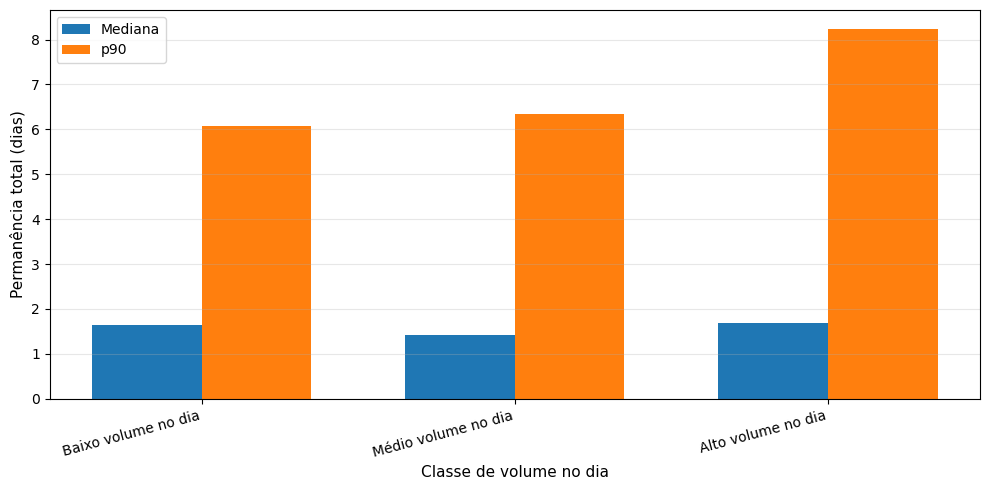

In [208]:
if "same_day_arrival_summary" in globals():
    plot_data = same_day_arrival_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["same_day_arrival_class"], rotation=15, ha="right")

    #ax.set_title("Permanência total por volume de chegadas no mesmo dia")
    ax.set_xlabel("Classe de volume no dia")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_10_total_stay_by_same_day_arrival_class.png")
    plt.show()

    figure_path

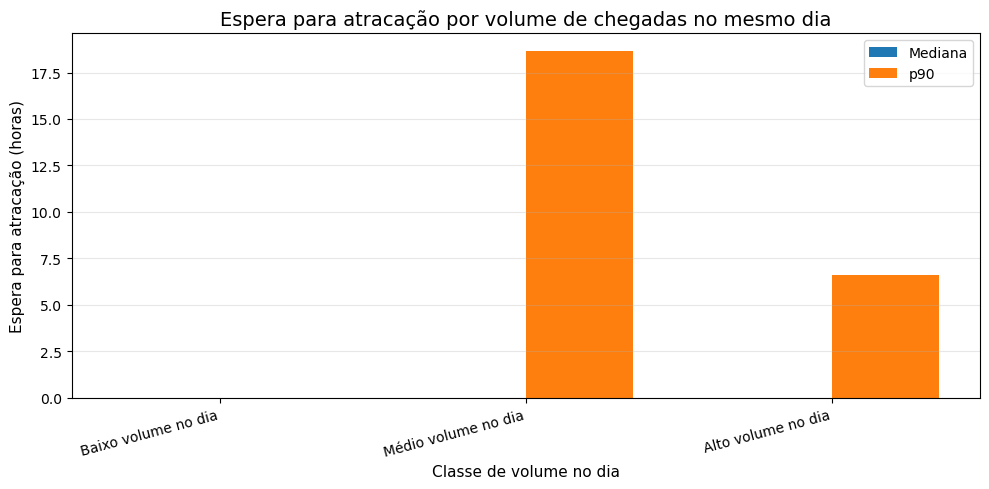

In [209]:
if "same_day_arrival_summary" in globals():
    plot_data = same_day_arrival_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_wait_h"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_wait_h"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["same_day_arrival_class"], rotation=15, ha="right")

    ax.set_title("Espera para atracação por volume de chegadas no mesmo dia")
    ax.set_xlabel("Classe de volume no dia")
    ax.set_ylabel("Espera para atracação (horas)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_10_wait_by_same_day_arrival_class.png")
    plt.show()

    figure_path

### 10.6 Volume recente de chegadas

A média de chegadas dos 7 dias anteriores busca capturar pressão operacional recente.

Diferente do volume no mesmo dia, essa variável representa uma memória histórica do porto e é mais próxima de uma feature preditiva, pois usa informações anteriores à chegada da embarcação.

In [210]:
if "prev_7d_arrival_class" in df_congestion_binned.columns:
    prev_7d_arrival_order = [
        "Baixo volume recente",
        "Médio volume recente",
        "Alto volume recente",
    ]

    prev_7d_arrival_summary = summarize_by_class(
        df_congestion_binned,
        "prev_7d_arrival_class",
        prev_7d_arrival_order,
    )

    display(prev_7d_arrival_summary)

,prev_7d_arrival_class,n_calls,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_h,p90_total_h,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d,median_total_d,p90_total_d
0,Baixo volume recente,45799,0.00,0.00,39.00,137.60,41.90,149.32,0.00,0.00,1.62,5.73,1.75,6.22
1,Médio volume recente,39737,0.00,18.33,26.58,122.50,32.50,146.03,0.00,0.76,1.11,5.10,1.35,6.08
2,Alto volume recente,43521,0.00,6.12,36.50,157.08,40.17,198.00,0.00,0.25,1.52,6.55,1.67,8.25


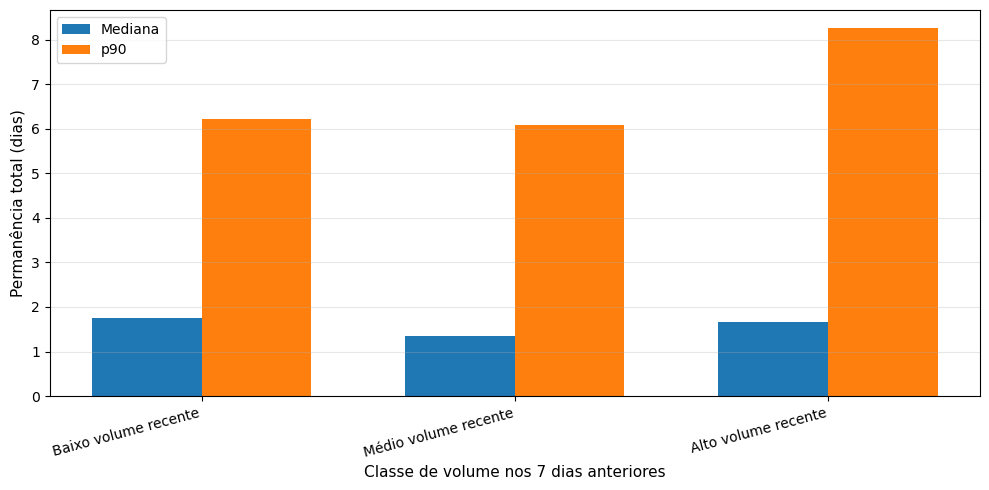

In [211]:
if "prev_7d_arrival_summary" in globals():
    plot_data = prev_7d_arrival_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["prev_7d_arrival_class"], rotation=15, ha="right")

    # ax.set_title("Permanência total por volume recente de chegadas")
    ax.set_xlabel("Classe de volume nos 7 dias anteriores")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_10_total_stay_by_prev_7d_arrival_class.png")
    plt.show()

    figure_path

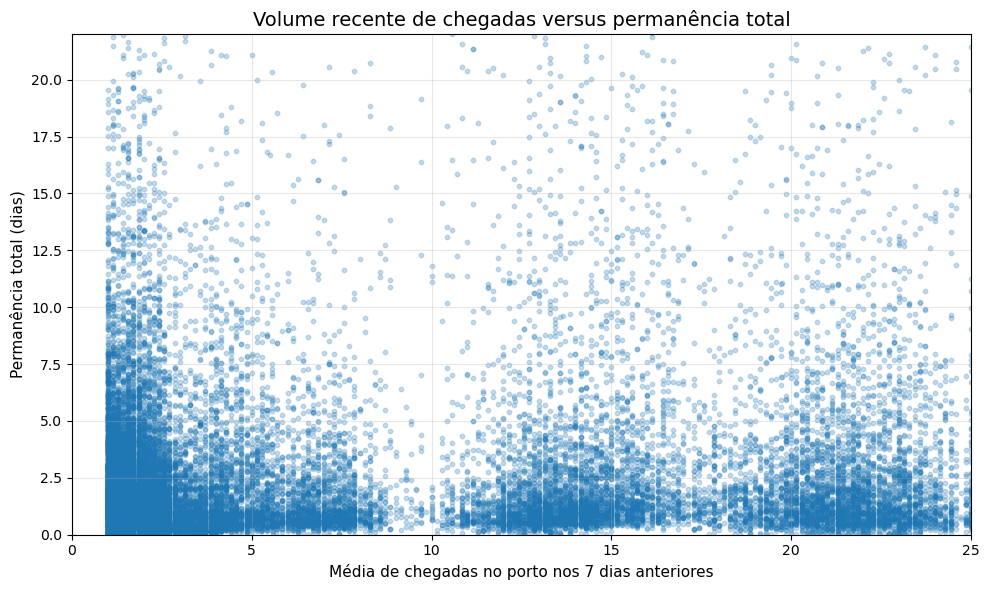

In [212]:
if "arrivals_prev_7d_avg_port" in df_congestion.columns:
    plot_sample = df_congestion.dropna(
        subset=["arrivals_prev_7d_avg_port", "t_total_port_stay_h"]
    ).sample(
        min(
            25000,
            df_congestion.dropna(
                subset=["arrivals_prev_7d_avg_port", "t_total_port_stay_h"]
            ).shape[0],
        ),
        random_state=42,
    )

    fig, ax = plt.subplots(figsize=(10, 6))

    ax.scatter(
        plot_sample["arrivals_prev_7d_avg_port"],
        plot_sample["t_total_port_stay_h"] / 24,
        alpha=0.25,
        s=10,
    )

    ax.set_title("Volume recente de chegadas versus permanência total")
    ax.set_xlabel("Média de chegadas no porto nos 7 dias anteriores")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(alpha=0.3)

    ax.set_xlim(
        0,
        df_congestion["arrivals_prev_7d_avg_port"].quantile(0.99),
    )
    ax.set_ylim(
        0,
        df_congestion["t_total_port_stay_h"].quantile(0.99) / 24,
    )

    figure_path = save_figure("eda_10_scatter_prev_7d_arrivals_vs_total_stay.png")
    plt.show()

    figure_path

### 10.7 Espera recente como memória operacional

A média da espera nas 20 escalas anteriores do porto representa uma proxy de memória operacional.

Se essa variável estiver associada à espera ou à permanência atual, isso sugere que o estado recente do porto carrega informação útil para previsão de lead time.

In [213]:
if "prev_wait_class" in df_congestion_binned.columns:
    prev_wait_order = [
        "Baixa espera recente",
        "Média espera recente",
        "Alta espera recente",
    ]

    prev_wait_summary = summarize_by_class(
        df_congestion_binned,
        "prev_wait_class",
        prev_wait_order,
    )

    display(prev_wait_summary)

,prev_wait_class,n_calls,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_h,p90_total_h,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d,median_total_d,p90_total_d
0,Baixa espera recente,84224,0.00,0.00,36.66,142.42,37.08,144.74,0.00,0.00,1.53,5.93,1.55,6.03
1,Média espera recente,993,0.00,0.00,36.67,159.97,38.33,175.92,0.00,0.00,1.53,6.67,1.60,7.33
2,Alta espera recente,43871,0.00,65.02,31.17,130.67,40.77,202.85,0.00,2.71,1.30,5.44,1.70,8.45


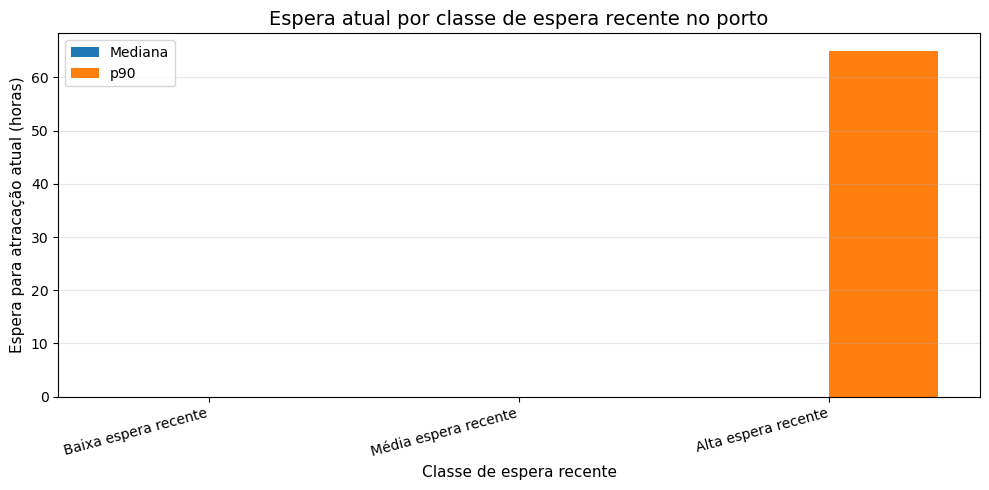

In [214]:
if "prev_wait_summary" in globals():
    plot_data = prev_wait_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_wait_h"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_wait_h"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["prev_wait_class"], rotation=15, ha="right")

    ax.set_title("Espera atual por classe de espera recente no porto")
    ax.set_xlabel("Classe de espera recente")
    ax.set_ylabel("Espera para atracação atual (horas)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_10_current_wait_by_previous_wait_class.png")
    plt.show()

    figure_path

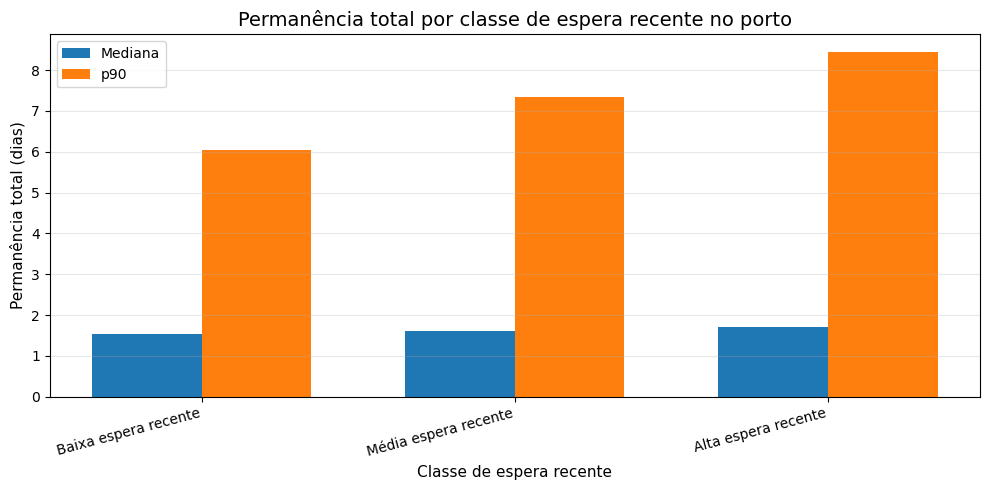

In [215]:
if "prev_wait_summary" in globals():
    plot_data = prev_wait_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(plot_data["prev_wait_class"], rotation=15, ha="right")

    ax.set_title("Permanência total por classe de espera recente no porto")
    ax.set_xlabel("Classe de espera recente")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_10_total_stay_by_previous_wait_class.png")
    plt.show()

    figure_path

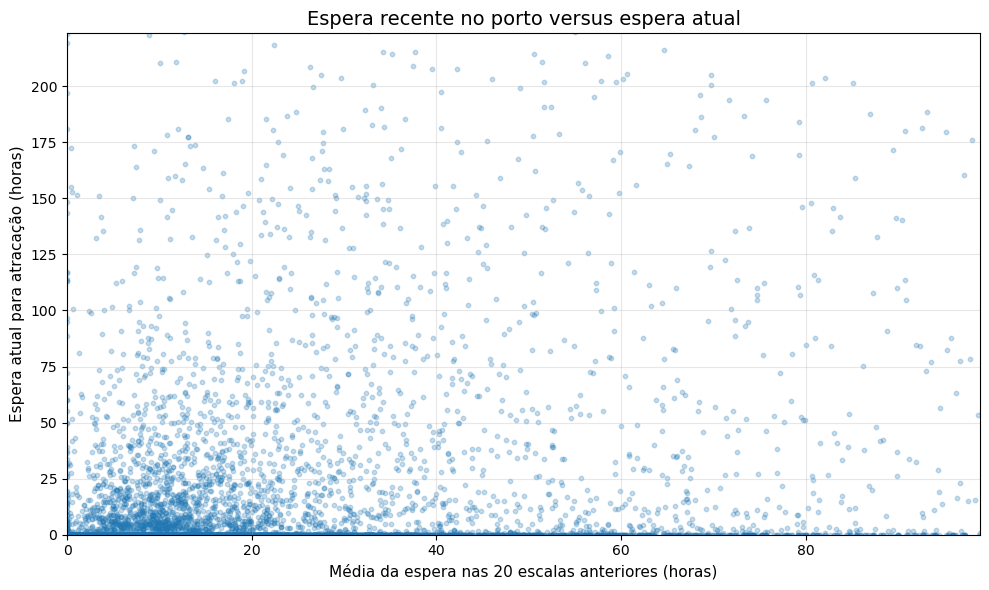

In [216]:
if "avg_wait_prev_20_calls_port" in df_congestion.columns:
    valid_data = df_congestion.dropna(
        subset=[
            "avg_wait_prev_20_calls_port",
            "t_wait_for_berthing_h",
        ]
    )

    plot_sample = valid_data.sample(
        min(25000, len(valid_data)),
        random_state=42,
    )

    fig, ax = plt.subplots(figsize=(10, 6))

    ax.scatter(
        plot_sample["avg_wait_prev_20_calls_port"],
        plot_sample["t_wait_for_berthing_h"],
        alpha=0.25,
        s=10,
    )

    ax.set_title("Espera recente no porto versus espera atual")
    ax.set_xlabel("Média da espera nas 20 escalas anteriores (horas)")
    ax.set_ylabel("Espera atual para atracação (horas)")
    ax.grid(alpha=0.3)

    ax.set_xlim(
        0,
        df_congestion["avg_wait_prev_20_calls_port"].quantile(0.99),
    )
    ax.set_ylim(
        0,
        df_congestion["t_wait_for_berthing_h"].quantile(0.99),
    )

    figure_path = save_figure("eda_10_scatter_previous_wait_vs_current_wait.png")
    plt.show()

    figure_path

Se a espera recente estiver associada à espera atual, isso sugere persistência operacional.

Em outras palavras, um porto que vinha enfrentando maior tempo de espera pode continuar apresentando maior risco nas próximas escalas. Esse tipo de padrão é valioso para modelos preditivos, porque transforma o histórico recente em uma representação do estado operacional do porto.

### 10.8 Variabilidade recente da espera

Além da média da espera, a variabilidade recente também pode ser informativa.

Um porto com alta variabilidade nas últimas escalas pode ser mais imprevisível, mesmo que sua média recente não seja extremamente elevada. Por isso, analisamos o desvio padrão da espera nas 20 escalas anteriores.

In [217]:
if "prev_wait_variability_class" in df_congestion_binned.columns:
    prev_wait_variability_order = [
        "Baixa variabilidade recente",
        "Média variabilidade recente",
        "Alta variabilidade recente",
    ]

    prev_wait_variability_summary = summarize_by_class(
        df_congestion_binned,
        "prev_wait_variability_class",
        prev_wait_variability_order,
    )

    display(prev_wait_variability_summary)

,prev_wait_variability_class,n_calls,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_h,p90_total_h,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d,median_total_d,p90_total_d
0,Baixa variabilidade recente,83885,0.00,0.00,36.65,142.33,37.08,144.50,0.00,0.00,1.53,5.93,1.55,6.02
1,Média variabilidade recente,1326,0.00,0.00,36.78,177.15,38.54,189.96,0.00,0.00,1.53,7.38,1.61,7.91
2,Alta variabilidade recente,43877,0.00,65.02,31.17,130.53,40.78,202.53,0.00,2.71,1.30,5.44,1.70,8.44


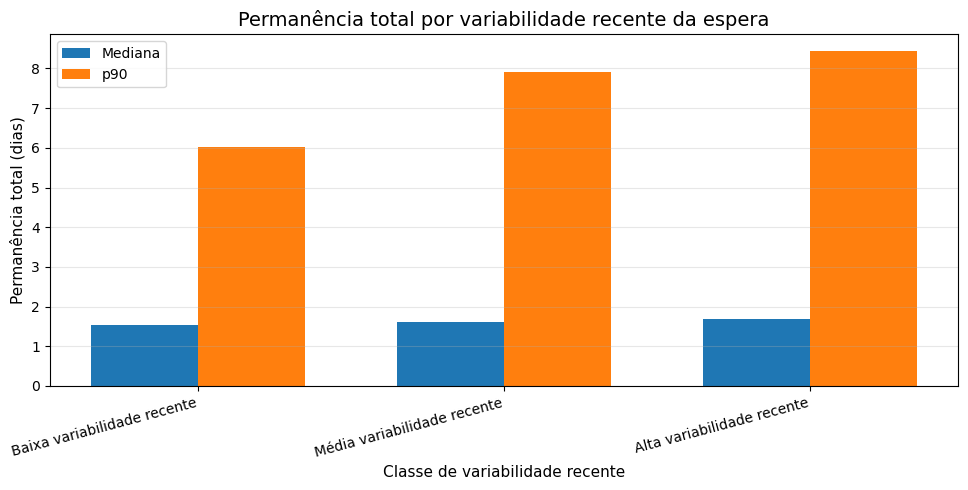

In [218]:
if "prev_wait_variability_summary" in globals():
    plot_data = prev_wait_variability_summary.copy()

    x = np.arange(len(plot_data))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        x - width / 2,
        plot_data["median_total_d"],
        width,
        label="Mediana",
    )

    ax.bar(
        x + width / 2,
        plot_data["p90_total_d"],
        width,
        label="p90",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(
        plot_data["prev_wait_variability_class"],
        rotation=15,
        ha="right",
    )

    ax.set_title("Permanência total por variabilidade recente da espera")
    ax.set_xlabel("Classe de variabilidade recente")
    ax.set_ylabel("Permanência total (dias)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    figure_path = save_figure("eda_10_total_stay_by_previous_wait_variability_class.png")
    plt.show()

    figure_path

### 10.9 Congestionamento por região e porto

O efeito de congestionamento pode não ser homogêneo no país.

Nesta etapa, comparamos as proxies de congestionamento por região e também analisamos portos críticos. O objetivo é verificar se determinados portos ou regiões apresentam maior pressão recente ou maior persistência de espera.

In [219]:
region_agg_dict = {
    "n_calls": ("port_call_id", "nunique"),
    "median_total_h": ("t_total_port_stay_h", "median"),
    "p90_total_h": ("t_total_port_stay_h", lambda x: x.quantile(0.90)),
    "median_wait_h": ("t_wait_for_berthing_h", "median"),
    "p90_wait_h": ("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
}

if "arrivals_same_day_port" in df_congestion.columns:
    region_agg_dict["avg_arrivals_same_day"] = ("arrivals_same_day_port", "mean")

if "arrivals_prev_7d_avg_port" in df_congestion.columns:
    region_agg_dict["avg_arrivals_prev_7d"] = ("arrivals_prev_7d_avg_port", "mean")

if "avg_wait_prev_20_calls_port" in df_congestion.columns:
    region_agg_dict["avg_wait_prev_20_h"] = ("avg_wait_prev_20_calls_port", "mean")

region_congestion_summary = (
    df_congestion
    .dropna(subset=["region"])
    .groupby("region")
    .agg(**region_agg_dict)
    .reset_index()
)

for col in ["median_total_h", "p90_total_h", "median_wait_h", "p90_wait_h", "avg_wait_prev_20_h"]:
    if col in region_congestion_summary.columns:
        region_congestion_summary[col.replace("_h", "_d")] = (
            region_congestion_summary[col] / 24
        )

region_congestion_summary

,region,n_calls,median_total_h,p90_total_h,median_wait_h,p90_wait_h,avg_arrivals_same_day,avg_arrivals_prev_7d,avg_wait_prev_20_h,median_total_d,p90_total_d,median_wait_d,p90_wait_d,avg_wait_prev_20_d
0,NORDESTE,25236,38.17,147.84,0.00,9.61,2.86,2.40,7.82,1.59,6.16,0.00,0.40,0.33
1,NORTE,8782,53.03,185.13,0.00,10.58,2.09,1.70,7.28,2.21,7.71,0.00,0.44,0.30
2,SUDESTE,69845,39.92,174.67,0.00,12.36,13.85,12.89,10.39,1.66,7.28,0.00,0.51,0.43
3,SUL,25762,29.20,137.33,0.00,0.00,4.29,3.73,4.55,1.22,5.72,0.00,0.00,0.19


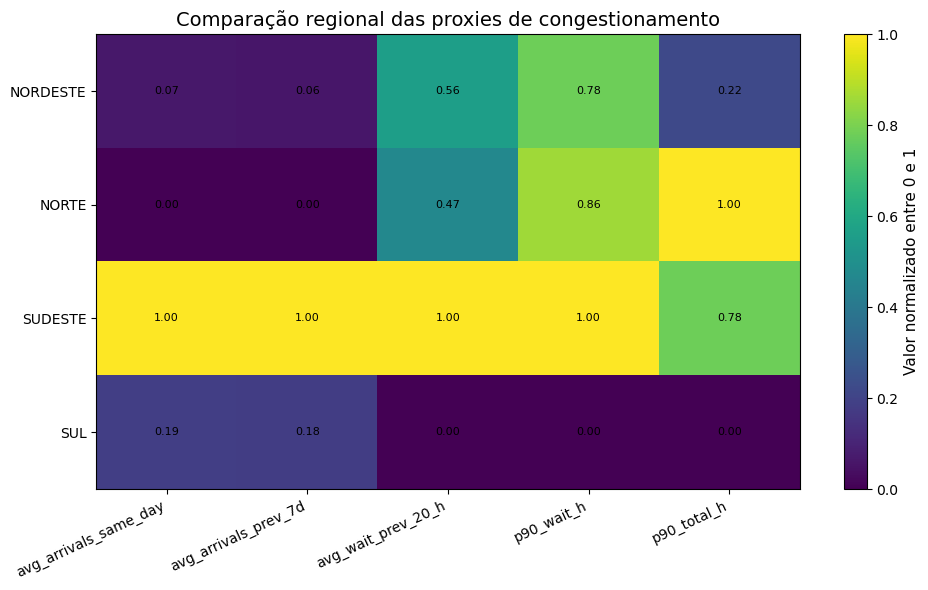

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_10_region_congestion_heatmap.png')

In [220]:
region_congestion_heatmap_cols = [
    col for col in [
        "avg_arrivals_same_day",
        "avg_arrivals_prev_7d",
        "avg_wait_prev_20_h",
        "p90_wait_h",
        "p90_total_h",
    ]
    if col in region_congestion_summary.columns
]

region_congestion_heatmap = region_congestion_summary.set_index("region")[
    region_congestion_heatmap_cols
].copy()

# Normalize columns for visual comparison
region_congestion_heatmap_norm = (
    region_congestion_heatmap
    - region_congestion_heatmap.min(axis=0)
) / (
    region_congestion_heatmap.max(axis=0)
    - region_congestion_heatmap.min(axis=0)
)

fig, ax = plt.subplots(figsize=(10, 6))

im = ax.imshow(region_congestion_heatmap_norm.values, aspect="auto")

ax.set_xticks(np.arange(len(region_congestion_heatmap_norm.columns)))
ax.set_xticklabels(region_congestion_heatmap_norm.columns, rotation=25, ha="right")

ax.set_yticks(np.arange(len(region_congestion_heatmap_norm.index)))
ax.set_yticklabels(region_congestion_heatmap_norm.index)

for i in range(region_congestion_heatmap_norm.shape[0]):
    for j in range(region_congestion_heatmap_norm.shape[1]):
        value = region_congestion_heatmap_norm.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value:.2f}",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Valor normalizado entre 0 e 1")

ax.set_title("Comparação regional das proxies de congestionamento")

figure_path = save_figure("eda_10_region_congestion_heatmap.png")
plt.show()

figure_path

In [221]:
MIN_PORT_CALLS_FOR_CONGESTION_ANALYSIS = 30

port_agg_dict = {
    "n_calls": ("port_call_id", "nunique"),
    "median_total_h": ("t_total_port_stay_h", "median"),
    "p90_total_h": ("t_total_port_stay_h", lambda x: x.quantile(0.90)),
    "median_wait_h": ("t_wait_for_berthing_h", "median"),
    "p90_wait_h": ("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
}

if "arrivals_same_day_port" in df_congestion.columns:
    port_agg_dict["avg_arrivals_same_day"] = ("arrivals_same_day_port", "mean")

if "arrivals_prev_7d_avg_port" in df_congestion.columns:
    port_agg_dict["avg_arrivals_prev_7d"] = ("arrivals_prev_7d_avg_port", "mean")

if "avg_wait_prev_20_calls_port" in df_congestion.columns:
    port_agg_dict["avg_wait_prev_20_h"] = ("avg_wait_prev_20_calls_port", "mean")

if "std_wait_prev_20_calls_port" in df_congestion.columns:
    port_agg_dict["avg_std_wait_prev_20_h"] = ("std_wait_prev_20_calls_port", "mean")

port_congestion_summary = (
    df_congestion
    .groupby(["port", "port_display", "region"], dropna=False)
    .agg(**port_agg_dict)
    .reset_index()
)

for col in [
    "median_total_h",
    "p90_total_h",
    "median_wait_h",
    "p90_wait_h",
    "avg_wait_prev_20_h",
    "avg_std_wait_prev_20_h",
]:
    if col in port_congestion_summary.columns:
        port_congestion_summary[col.replace("_h", "_d")] = (
            port_congestion_summary[col] / 24
        )

port_congestion_summary = port_congestion_summary.loc[
    port_congestion_summary["n_calls"] >= MIN_PORT_CALLS_FOR_CONGESTION_ANALYSIS
].copy()

port_congestion_summary.head()

,port,port_display,region,n_calls,median_total_h,p90_total_h,median_wait_h,p90_wait_h,avg_arrivals_same_day,avg_arrivals_prev_7d,avg_wait_prev_20_h,avg_std_wait_prev_20_h,median_total_d,p90_total_d,median_wait_d,p90_wait_d,avg_wait_prev_20_d,avg_std_wait_prev_20_d
0,BR052001,BR052001 - JURITI - PA,NORTE,386,26.50,39.50,0.00,0.00,1.01,1.01,0.05,0.22,1.10,1.65,0.00,0.00,0.00,0.01
1,BR147001,BR147001 - TRIUNFO - RS,SUL,86,53.48,229.50,0.00,0.00,1.51,1.40,0.00,0.00,2.23,9.56,0.00,0.00,0.00,0.00
2,BR252001,BR252001 - GUAMARÉ - RN,NORDESTE,153,70.20,211.52,0.00,0.00,1.13,1.07,0.00,0.00,2.93,8.81,0.00,0.00,0.00,0.00
3,BR252002,BR252002 - GUAMARÉ - RN,NORDESTE,43,92.20,231.02,0.00,0.00,1.00,1.00,0.00,0.00,3.84,9.63,0.00,0.00,0.00,0.00
4,BR302002,BR302002 - NOVA SANTA RITA - RS,SUL,81,50.00,88.75,0.00,0.00,1.00,1.00,0.00,0.00,2.08,3.70,0.00,0.00,0.00,0.00


In [222]:
ranking_columns = [
    "port",
    "port_display",
    "region",
    "n_calls",
    "median_total_d",
    "p90_total_d",
    "median_wait_d",
    "p90_wait_d",
]

for optional_col in [
    "avg_arrivals_same_day",
    "avg_arrivals_prev_7d",
    "avg_wait_prev_20_d",
    "avg_std_wait_prev_20_d",
]:
    if optional_col in port_congestion_summary.columns:
        ranking_columns.append(optional_col)

sort_col = (
    "avg_wait_prev_20_d"
    if "avg_wait_prev_20_d" in port_congestion_summary.columns
    else "p90_wait_d"
)

top_congested_ports = (
    port_congestion_summary
    .sort_values(sort_col, ascending=False)
    .head(20)
)

top_congested_ports[ranking_columns]

,port,port_display,region,n_calls,median_total_d,p90_total_d,median_wait_d,p90_wait_d,avg_arrivals_same_day,avg_arrivals_prev_7d,avg_wait_prev_20_d,avg_std_wait_prev_20_d
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SUL,1345,4.09,16.91,0.00,10.70,2.25,1.75,2.65,4.70
89,BRSSZ,BRSSZ - SANTOS - SP,SUDESTE,15773,2.17,11.70,0.00,4.79,15.57,14.54,1.44,2.93
94,BRTRM001,BRTRM001 - IMBÉ - RS,SUL,465,1.58,7.97,0.00,4.52,1.39,1.23,1.26,2.33
92,BRSUA,BRSUA - CABO DE SANTO AGOSTINHO - PE,NORDESTE,4336,1.89,8.37,0.00,3.98,4.84,4.02,1.25,2.15
25,BRIGI,BRIGI - ITAGUAÍ - RJ,SUDESTE,1680,3.00,7.53,0.00,3.20,2.31,1.86,1.05,1.64
61,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,NORDESTE,2195,1.08,9.17,0.00,2.91,2.76,2.20,1.04,2.19
90,BRSTM,BRSTM - SANTARÉM - PA,NORTE,654,3.87,13.39,0.00,3.00,2.24,1.41,0.93,2.06
20,BRBEL,BRBEL - BELÉM - PA,NORTE,1754,1.12,6.19,0.00,3.03,2.48,1.97,0.83,1.62
38,BRITJ,BRITJ - ITAJAÍ - SC,SUL,695,1.05,8.88,0.11,1.81,1.82,1.48,0.75,1.51
54,BRMEA001,BRMEA001 - MACAÉ - RJ,SUDESTE,3308,1.20,4.09,0.20,1.57,4.02,3.22,0.57,0.86


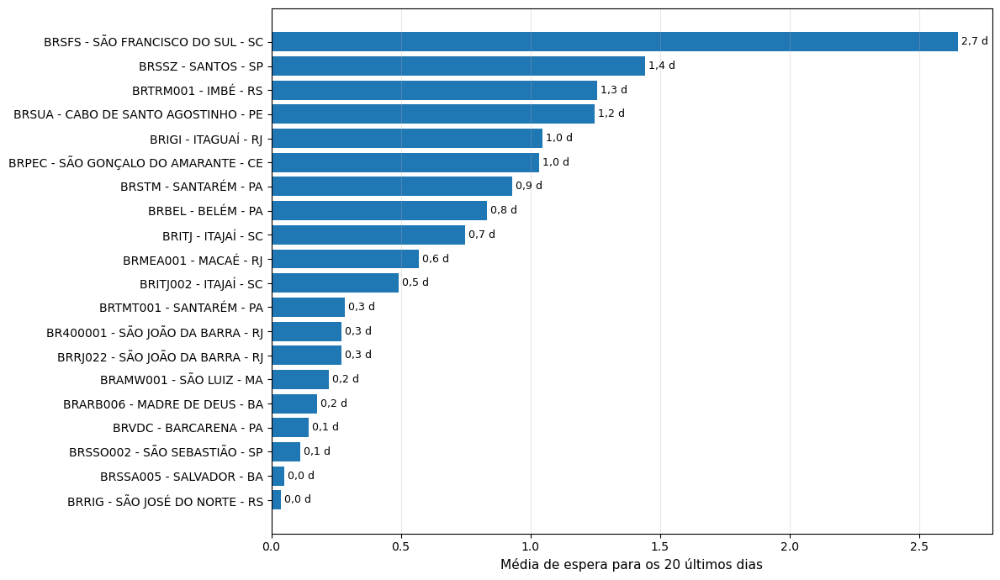

In [223]:
if sort_col in port_congestion_summary.columns:
    plot_data = (
        top_congested_ports
        .sort_values(sort_col, ascending=True)
    )

    fig, ax = plt.subplots(figsize=(12, 7))

    ax.barh(
        plot_data["port_display"],
        plot_data[sort_col],
    )

    for index, row in enumerate(plot_data.itertuples()):
        value = getattr(row, sort_col)
        value_str = f"{value:.1f}".replace(".", ",")
        ax.text(
            value,
            index,
            f" {value_str} d",
            va="center",
            fontsize=9,
        )

    # ax.set_title("Portos com maior pressão operacional recente")
    ax.set_xlabel("Média de espera para os 20 últimos dias")
    ax.set_ylabel("")
    ax.grid(axis="x", alpha=0.3)

    figure_path = save_figure("eda_10_top_ports_by_recent_congestion.png")
    plt.show()

    figure_path

### 10.10 Séries temporais em portos críticos

Para visualizar a memória operacional ao longo do tempo, selecionamos alguns portos críticos e analisamos séries mensais de:

- volume de escalas;
- mediana da permanência total;
- p90 da permanência total;
- média de espera recente.

Essa leitura ajuda a identificar períodos de maior pressão operacional.

In [224]:
if "port_criticality" in globals():
    time_series_ports = (
        port_criticality
        .sort_values("criticality_score", ascending=False)
        .head(4)["port"]
        .tolist()
    )
else:
    time_series_ports = (
        port_congestion_summary
        .sort_values("p90_total_d", ascending=False)
        .head(4)["port"]
        .tolist()
    )

time_series_ports

['BRSSZ', 'BRSFS', 'BRNTR', 'BRPEC']

In [225]:
df_congestion["arrival_month_start"] = (
    df_congestion["arrival_port_ts"]
    .dt.to_period("M")
    .dt.to_timestamp()
)

port_month_agg_dict = {
    "n_calls": ("port_call_id", "nunique"),
    "median_total_h": ("t_total_port_stay_h", "median"),
    "p90_total_h": ("t_total_port_stay_h", lambda x: x.quantile(0.90)),
    "median_wait_h": ("t_wait_for_berthing_h", "median"),
    "p90_wait_h": ("t_wait_for_berthing_h", lambda x: x.quantile(0.90)),
}

if "avg_wait_prev_20_calls_port" in df_congestion.columns:
    port_month_agg_dict["avg_wait_prev_20_h"] = (
        "avg_wait_prev_20_calls_port",
        "mean",
    )

if "arrivals_prev_7d_avg_port" in df_congestion.columns:
    port_month_agg_dict["avg_arrivals_prev_7d"] = (
        "arrivals_prev_7d_avg_port",
        "mean",
    )

port_month_congestion = (
    df_congestion
    .loc[df_congestion["port"].isin(time_series_ports)]
    .dropna(subset=["arrival_month_start"])
    .groupby(["port", "port_display", "arrival_month_start"])
    .agg(**port_month_agg_dict)
    .reset_index()
)

for col in [
    "median_total_h",
    "p90_total_h",
    "median_wait_h",
    "p90_wait_h",
    "avg_wait_prev_20_h",
]:
    if col in port_month_congestion.columns:
        port_month_congestion[col.replace("_h", "_d")] = (
            port_month_congestion[col] / 24
        )

port_month_congestion.head()

,port,port_display,arrival_month_start,n_calls,median_total_h,p90_total_h,median_wait_h,p90_wait_h,avg_wait_prev_20_h,avg_arrivals_prev_7d,median_total_d,p90_total_d,median_wait_d,p90_wait_d,avg_wait_prev_20_d
0,BRNTR,BRNTR - NITERÓI - RJ,2023-01-01,17,38.00,293.73,0.00,0.00,0.93,1.20,1.58,12.24,0.00,0.00,0.04
1,BRNTR,BRNTR - NITERÓI - RJ,2023-02-01,11,48.00,672.25,0.00,0.00,0.33,1.18,2.00,28.01,0.00,0.00,0.01
2,BRNTR,BRNTR - NITERÓI - RJ,2023-03-01,46,31.71,283.62,0.00,0.00,0.00,1.80,1.32,11.82,0.00,0.00,0.00
3,BRNTR,BRNTR - NITERÓI - RJ,2023-04-01,49,38.92,343.53,0.00,0.00,0.00,2.36,1.62,14.31,0.00,0.00,0.00
4,BRNTR,BRNTR - NITERÓI - RJ,2023-05-01,55,39.17,314.87,0.00,0.00,0.00,2.24,1.63,13.12,0.00,0.00,0.00


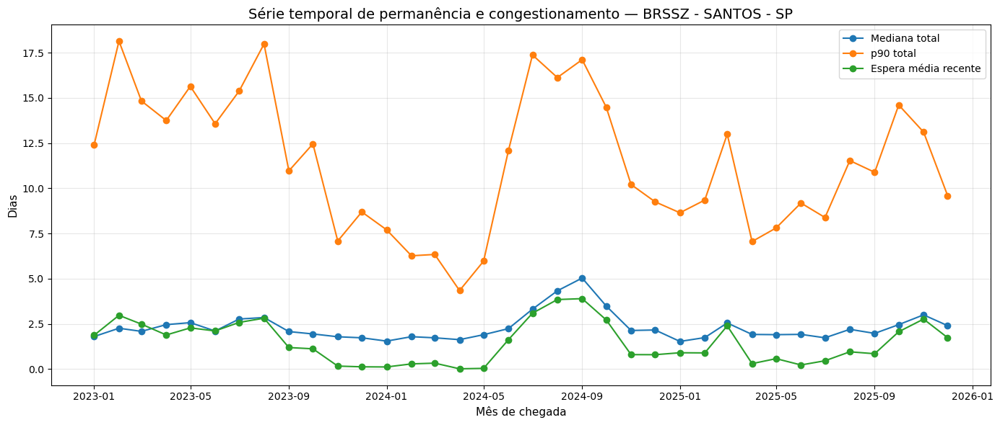

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_time_series_congestion_BRSSZ.png


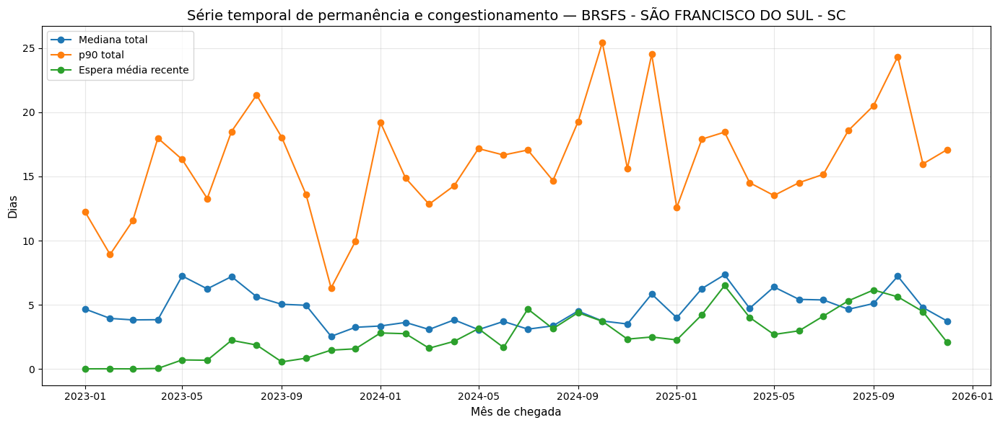

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_time_series_congestion_BRSFS.png


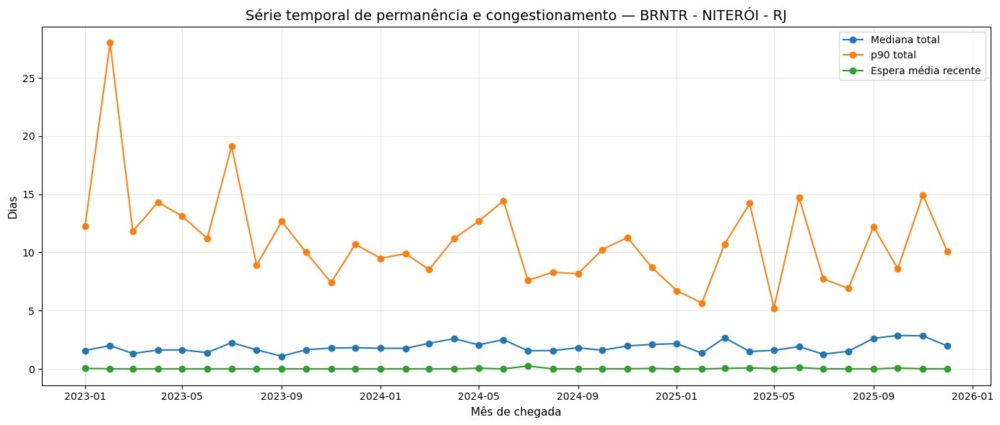

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_time_series_congestion_BRNTR.png


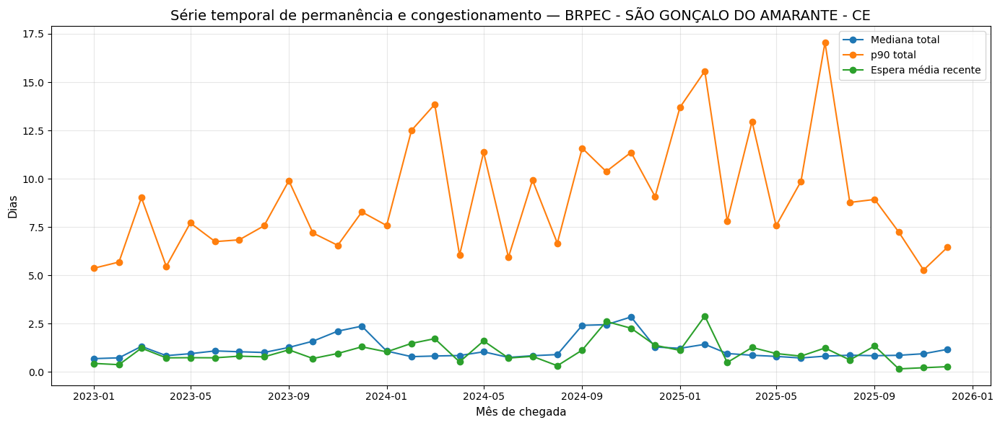

G:\My Drive\Graduação e Pós\USP\MBA USP IA e Big Data\TCC\port_leadtime_prediction\outputs\figures\eda_10_time_series_congestion_BRPEC.png


In [226]:
for port in time_series_ports:
    port_data = port_month_congestion.loc[
        port_month_congestion["port"] == port
    ].sort_values("arrival_month_start")

    if port_data.empty:
        continue

    port_display = port_data["port_display"].iloc[0]

    fig, ax = plt.subplots(figsize=(14, 6))

    ax.plot(
        port_data["arrival_month_start"],
        port_data["median_total_d"],
        marker="o",
        linewidth=1.5,
        label="Mediana total",
    )

    ax.plot(
        port_data["arrival_month_start"],
        port_data["p90_total_d"],
        marker="o",
        linewidth=1.5,
        label="p90 total",
    )

    if "avg_wait_prev_20_d" in port_data.columns:
        ax.plot(
            port_data["arrival_month_start"],
            port_data["avg_wait_prev_20_d"],
            marker="o",
            linewidth=1.5,
            label="Espera média recente",
        )

    ax.set_title(f"Série temporal de permanência e congestionamento — {port_display}")
    ax.set_xlabel("Mês de chegada")
    ax.set_ylabel("Dias")
    ax.grid(alpha=0.3)
    ax.legend()

    safe_port = str(port).replace("/", "_").replace("\\", "_")
    figure_path = save_figure(f"eda_10_time_series_congestion_{safe_port}.png")
    plt.show()

    print(figure_path)

As séries temporais por porto ajudam a visualizar períodos em que o p90 ou a espera recente aumentam.

Se a espera média recente se move junto com o p90 da permanência total, isso sugere que variáveis históricas podem capturar o estado operacional do porto e ajudar na previsão.

### 10.11 Congestionamento e casos extremos

Além de analisar médias e correlações, é importante verificar se as proxies de congestionamento diferenciam os casos extremos.

Nesta etapa, comparamos registros normais e registros acima do p90 nacional da permanência total.

In [227]:
national_total_p90_h = df_congestion["t_total_port_stay_h"].quantile(0.90)

df_congestion_extreme = df_congestion.copy()
df_congestion_extreme["is_extreme_total_stay"] = (
    df_congestion_extreme["t_total_port_stay_h"] >= national_total_p90_h
)

congestion_extreme_rows = []

for col in congestion_columns:
    normal = df_congestion_extreme.loc[
        ~df_congestion_extreme["is_extreme_total_stay"],
        col,
    ].dropna()

    extreme = df_congestion_extreme.loc[
        df_congestion_extreme["is_extreme_total_stay"],
        col,
    ].dropna()

    if len(normal) == 0 or len(extreme) == 0:
        continue

    congestion_extreme_rows.append(
        {
            "congestion_variable": col,
            "normal_mean": normal.mean(),
            "extreme_mean": extreme.mean(),
            "normal_median": normal.median(),
            "extreme_median": extreme.median(),
            "normal_p90": normal.quantile(0.90),
            "extreme_p90": extreme.quantile(0.90),
            "difference_median": extreme.median() - normal.median(),
            "difference_mean": extreme.mean() - normal.mean(),
        }
    )

congestion_extreme_summary = pd.DataFrame(congestion_extreme_rows)

congestion_extreme_summary

,congestion_variable,normal_mean,extreme_mean,normal_median,extreme_median,normal_p90,extreme_p90,difference_median,difference_mean
0,avg_wait_prev_20_calls_port,7.54,17.30,0.00,0.00,24.99,59.96,0.00,9.75
1,avg_operation_prev_20_calls_port,59.99,78.74,56.83,71.50,100.29,122.92,14.67,18.75
2,std_wait_prev_20_calls_port,15.32,32.33,0.00,0.00,55.01,113.57,0.00,17.01
3,arrivals_same_day_port,8.83,10.68,5.00,8.00,22.00,24.00,3.00,1.85
4,arrivals_prev_day_port,8.13,9.75,4.00,7.00,21.00,23.00,3.00,1.62
5,arrivals_prev_7d_avg_port,8.11,9.71,3.86,6.57,21.29,21.86,2.71,1.60


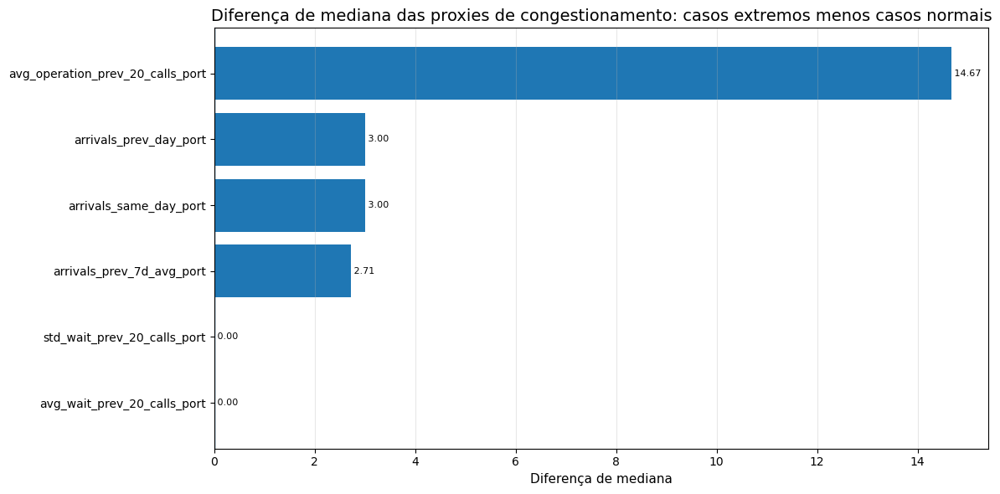

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_10_congestion_difference_extreme_vs_normal.png')

In [228]:
plot_data = congestion_extreme_summary.sort_values(
    "difference_median",
    ascending=True,
)

fig, ax = plt.subplots(figsize=(12, 6))

ax.barh(
    plot_data["congestion_variable"],
    plot_data["difference_median"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.difference_median,
        index,
        f" {row.difference_median:.2f}",
        va="center",
        fontsize=8,
    )

ax.axvline(0, linewidth=1)
ax.set_title(
    "Diferença de mediana das proxies de congestionamento: "
    "casos extremos menos casos normais"
)
ax.set_xlabel("Diferença de mediana")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_10_congestion_difference_extreme_vs_normal.png")
plt.show()

figure_path

Se os casos extremos apresentam valores maiores de congestionamento recente, isso sugere que essas proxies ajudam a capturar risco operacional.

Mesmo que as correlações gerais sejam moderadas ou baixas, diferenças claras entre casos normais e extremos podem indicar utilidade preditiva, especialmente para modelos voltados a identificar risco de atraso.

### 10.12 Score exploratório de congestionamento

Para sintetizar as proxies disponíveis, criamos um score exploratório de congestionamento por registro.

Esse score combina rankings percentuais de variáveis associadas a volume recente, espera recente e variabilidade recente. Ele não é um modelo estatístico, mas uma forma simples de comparar registros em termos de pressão operacional.

In [229]:
score_feature_candidates = [
    "arrivals_same_day_port",
    "arrivals_prev_day_port",
    "arrivals_prev_7d_avg_port",
    "avg_wait_prev_20_calls_port",
    "std_wait_prev_20_calls_port",
]

score_features = [
    col for col in score_feature_candidates
    if col in df_congestion.columns
]

df_congestion_score = df_congestion.copy()

for col in score_features:
    df_congestion_score[f"{col}_rank_pct"] = (
        df_congestion_score[col].rank(pct=True)
    )

rank_cols = [
    f"{col}_rank_pct"
    for col in score_features
]

df_congestion_score["congestion_score"] = (
    df_congestion_score[rank_cols].mean(axis=1)
)

df_congestion_score[
    [
        "port_call_id",
        "port",
        "port_display",
        "t_total_port_stay_d",
        "t_wait_for_berthing_h",
        "congestion_score",
        *score_features,
    ]
].head()

,port_call_id,port,port_display,t_total_port_stay_d,t_wait_for_berthing_h,congestion_score,arrivals_same_day_port,arrivals_prev_day_port,arrivals_prev_7d_avg_port,avg_wait_prev_20_calls_port,std_wait_prev_20_calls_port
0,22023,BR052001,BR052001 - JURITI - PA,1.22,0.00,0.09,1,NaN,NaN,NaN,NaN
1,5492023,BR052001,BR052001 - JURITI - PA,1.25,0.00,0.10,1,1.00,NaN,NaN,NaN
2,262023,BR052001,BR052001 - JURITI - PA,1.46,0.00,0.10,1,1.00,NaN,NaN,NaN
3,12602023,BR052001,BR052001 - JURITI - PA,1.32,0.00,0.08,1,1.00,1.00,NaN,NaN
4,24052023,BR052001,BR052001 - JURITI - PA,1.71,0.00,0.08,1,1.00,1.00,NaN,NaN


In [230]:
df_congestion_score["congestion_score_class"] = classify_by_quantiles(
    df_congestion_score["congestion_score"],
    labels=[
        "Baixo score de congestionamento",
        "Médio score de congestionamento",
        "Alto score de congestionamento",
    ],
)

congestion_score_order = [
    "Baixo score de congestionamento",
    "Médio score de congestionamento",
    "Alto score de congestionamento",
]

congestion_score_summary = summarize_by_class(
    df_congestion_score,
    "congestion_score_class",
    congestion_score_order,
)

congestion_score_summary

,congestion_score_class,n_calls,median_wait_h,p90_wait_h,median_operation_h,p90_operation_h,median_total_h,p90_total_h,median_wait_d,p90_wait_d,median_operation_d,p90_operation_d,median_total_d,p90_total_d
0,Baixo score de congestionamento,42804,0.00,0.00,39.67,134.92,40.00,136.00,0.00,0.00,1.65,5.62,1.67,5.67
1,Médio score de congestionamento,42764,0.00,13.73,29.67,130.13,33.72,153.60,0.00,0.57,1.24,5.42,1.40,6.40
2,Alto score de congestionamento,44057,0.00,29.51,34.92,153.61,41.67,206.62,0.00,1.23,1.45,6.40,1.74,8.61


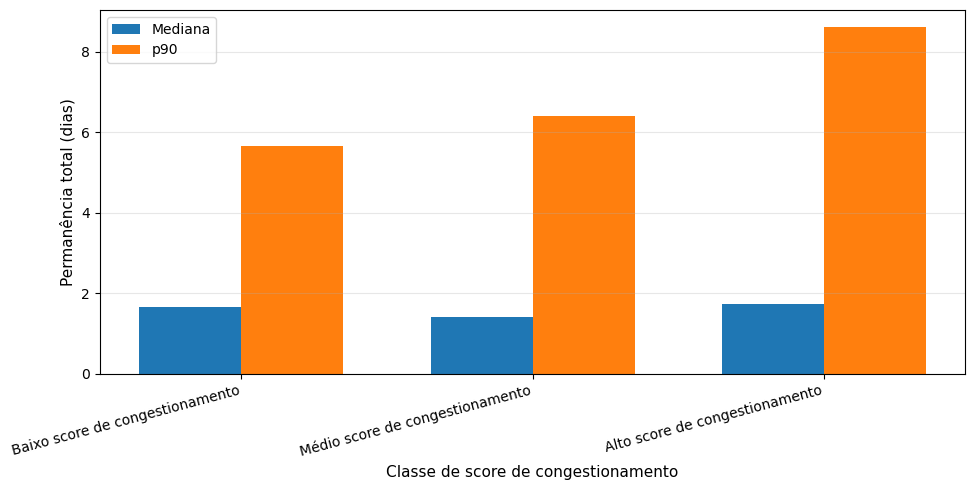

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_10_total_stay_by_congestion_score.png')

In [231]:
plot_data = congestion_score_summary.copy()

x = np.arange(len(plot_data))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    x - width / 2,
    plot_data["median_total_d"],
    width,
    label="Mediana",
)

ax.bar(
    x + width / 2,
    plot_data["p90_total_d"],
    width,
    label="p90",
)

ax.set_xticks(x)
ax.set_xticklabels(plot_data["congestion_score_class"], rotation=15, ha="right")

#ax.set_title("Permanência total por score exploratório de congestionamento")
ax.set_xlabel("Classe de score de congestionamento")
ax.set_ylabel("Permanência total (dias)")
ax.grid(axis="y", alpha=0.3)
ax.legend()

figure_path = save_figure("eda_10_total_stay_by_congestion_score.png")
plt.show()

figure_path

O score exploratório de congestionamento combina diferentes sinais de pressão operacional.

Se o grupo de alto score apresentar maior p90 ou maior mediana da permanência total, isso sugere que as proxies históricas carregam informação relevante para distinguir contextos de maior risco.

Esse score é apenas uma ferramenta exploratória. Na modelagem, as variáveis originais podem ser usadas separadamente para que o algoritmo aprenda seus efeitos e interações.

In [232]:
top_congestion_corr = (
    congestion_correlation
    .loc[congestion_correlation["target"] == "t_total_port_stay_h"]
    .assign(abs_spearman=lambda x: x["spearman_corr"].abs())
    .sort_values("abs_spearman", ascending=False)
    .iloc[0]
)

if "prev_wait_summary" in globals():
    high_prev_wait = prev_wait_summary.loc[
        prev_wait_summary["prev_wait_class"] == "Alta espera recente"
    ].iloc[0]

    low_prev_wait = prev_wait_summary.loc[
        prev_wait_summary["prev_wait_class"] == "Baixa espera recente"
    ].iloc[0]

    prev_wait_message = (
        f"Registros com alta espera recente apresentam p90 da permanência total de "
        f"{high_prev_wait['p90_total_d']:.2f} dias, contra "
        f"{low_prev_wait['p90_total_d']:.2f} dias em registros com baixa espera recente."
    )
else:
    prev_wait_message = (
        "A variável de espera recente não estava disponível para comparação por classes."
    )

if "congestion_score_summary" in globals():
    high_score = congestion_score_summary.loc[
        congestion_score_summary["congestion_score_class"]
        == "Alto score de congestionamento"
    ].iloc[0]

    low_score = congestion_score_summary.loc[
        congestion_score_summary["congestion_score_class"]
        == "Baixo score de congestionamento"
    ].iloc[0]

    score_message = (
        f"No score exploratório, registros com alto congestionamento apresentam p90 de "
        f"{high_score['p90_total_d']:.2f} dias, contra "
        f"{low_score['p90_total_d']:.2f} dias em registros com baixo congestionamento."
    )
else:
    score_message = (
        "O score exploratório de congestionamento não foi calculado."
    )

section_10_narrative = f"""
A análise de congestionamento avaliou proxies de volume recente, espera recente e variabilidade recente no porto.

A variável com maior associação monotônica absoluta com a permanência total foi {top_congestion_corr['congestion_variable']}, com correlação de Spearman de {top_congestion_corr['spearman_corr']:.3f}.

{prev_wait_message}

{score_message}

Esses resultados sugerem que o histórico recente do porto pode carregar informação útil para a previsão do lead time, especialmente quando combinado com porto, região, tipo de operação, calendário e clima.
"""

print(section_10_narrative)


A análise de congestionamento avaliou proxies de volume recente, espera recente e variabilidade recente no porto.

A variável com maior associação monotônica absoluta com a permanência total foi avg_operation_prev_20_calls_port, com correlação de Spearman de 0.343.

Registros com alta espera recente apresentam p90 da permanência total de 8.45 dias, contra 6.03 dias em registros com baixa espera recente.

No score exploratório, registros com alto congestionamento apresentam p90 de 8.61 dias, contra 5.67 dias em registros com baixo congestionamento.

Esses resultados sugerem que o histórico recente do porto pode carregar informação útil para a previsão do lead time, especialmente quando combinado com porto, região, tipo de operação, calendário e clima.



In [233]:
congestion_coverage_path = TABLES_DIR / "eda_10_congestion_coverage.csv"
congestion_descriptive_summary_path = TABLES_DIR / "eda_10_congestion_descriptive_summary.csv"
congestion_correlation_path = TABLES_DIR / "eda_10_congestion_correlation.csv"
region_congestion_summary_path = TABLES_DIR / "eda_10_region_congestion_summary.csv"
port_congestion_summary_path = TABLES_DIR / "eda_10_port_congestion_summary.csv"
congestion_extreme_summary_path = TABLES_DIR / "eda_10_congestion_extreme_summary.csv"
congestion_score_summary_path = TABLES_DIR / "eda_10_congestion_score_summary.csv"

congestion_coverage.to_csv(congestion_coverage_path, index=False)
congestion_descriptive_summary.to_csv(congestion_descriptive_summary_path, index=False)
congestion_correlation.to_csv(congestion_correlation_path, index=False)
region_congestion_summary.to_csv(region_congestion_summary_path, index=False)
port_congestion_summary.to_csv(port_congestion_summary_path, index=False)
congestion_extreme_summary.to_csv(congestion_extreme_summary_path, index=False)
congestion_score_summary.to_csv(congestion_score_summary_path, index=False)

if "same_day_arrival_summary" in globals():
    same_day_arrival_summary_path = TABLES_DIR / "eda_10_same_day_arrival_summary.csv"
    same_day_arrival_summary.to_csv(same_day_arrival_summary_path, index=False)

if "prev_7d_arrival_summary" in globals():
    prev_7d_arrival_summary_path = TABLES_DIR / "eda_10_prev_7d_arrival_summary.csv"
    prev_7d_arrival_summary.to_csv(prev_7d_arrival_summary_path, index=False)

if "prev_wait_summary" in globals():
    prev_wait_summary_path = TABLES_DIR / "eda_10_prev_wait_summary.csv"
    prev_wait_summary.to_csv(prev_wait_summary_path, index=False)

if "prev_wait_variability_summary" in globals():
    prev_wait_variability_summary_path = TABLES_DIR / "eda_10_prev_wait_variability_summary.csv"
    prev_wait_variability_summary.to_csv(prev_wait_variability_summary_path, index=False)

[
    congestion_coverage_path,
    congestion_descriptive_summary_path,
    congestion_correlation_path,
    region_congestion_summary_path,
    port_congestion_summary_path,
    congestion_extreme_summary_path,
    congestion_score_summary_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_10_congestion_coverage.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_10_congestion_descriptive_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_10_congestion_correlation.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_10_region_congestion_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_10_port_congestion_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_10_congestion_extreme_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_predict

### Principais mensagens da seção

A análise de congestionamento mostra que o lead time portuário pode carregar um componente de memória operacional.

Variáveis como chegadas recentes, espera média nas últimas escalas e variabilidade recente da espera ajudam a representar o estado operacional do porto antes da escala atual. Se essas variáveis estiverem associadas à permanência total ou à espera para atracação, elas se tornam candidatas relevantes para a modelagem preditiva.

Essa seção é particularmente importante para o TCC porque aproxima o problema de lead time de uma lógica dinâmica: o tempo esperado de uma escala não depende apenas do porto e da operação, mas também do que vinha acontecendo recentemente naquele porto.

Para Supply Chain, essa informação é valiosa. Uma previsão de lead time que considera congestionamento recente pode apoiar decisões mais responsivas de planejamento, estoques de segurança e gestão de risco.

A próxima seção consolidará os principais achados do EDA, organizando os drivers mais relevantes de variabilidade antes da ponte final para modelagem.

---

## 11. Síntese dos principais drivers de variabilidade

As seções anteriores analisaram diferentes dimensões da permanência portuária:

- localização geográfica;
- porto e região;
- tipo de operação;
- componentes do lead time;
- sazonalidade e calendário;
- clima;
- congestionamento e memória operacional.

Nesta seção, consolidamos esses achados em uma visão integrada.

O objetivo não é provar causalidade, mas organizar evidências exploratórias sobre quais dimensões parecem mais associadas à variabilidade do lead time portuário.

A pergunta principal desta seção é:

> Quais grupos de variáveis parecem mais relevantes para explicar a permanência portuária e devem ser considerados na etapa de modelagem?

Essa síntese é importante porque transforma o EDA em insumo para o próximo passo do projeto: construir modelos preditivos capazes de estimar a permanência esperada e o risco de atraso.

In [234]:
SYNTHESIS_TARGET_H = "t_total_port_stay_h"
SYNTHESIS_TARGET_D = "t_total_port_stay_d"

if SYNTHESIS_TARGET_H not in df.columns:
    raise ValueError(f"Required target column not found: {SYNTHESIS_TARGET_H}")

df_synthesis = df.copy()

if SYNTHESIS_TARGET_D not in df_synthesis.columns:
    df_synthesis[SYNTHESIS_TARGET_D] = df_synthesis[SYNTHESIS_TARGET_H] / 24

national_p90_h = df_synthesis[SYNTHESIS_TARGET_H].quantile(0.90)

df_synthesis["is_extreme_total_stay"] = (
    df_synthesis[SYNTHESIS_TARGET_H] >= national_p90_h
)

print(f"Rows in synthesis base: {len(df_synthesis):,}")
print(f"National p90 total stay: {national_p90_h / 24:.2f} days")

Rows in synthesis base: 129,625
National p90 total stay: 6.80 days


### 11.1 Matriz conceitual dos drivers

Antes de medir os efeitos exploratórios, é útil organizar os principais grupos de variáveis em uma matriz conceitual.

Essa matriz resume o papel esperado de cada família de variáveis:

- variáveis estruturais indicam onde a escala ocorre;
- variáveis operacionais indicam o tipo de atividade realizada;
- variáveis temporais indicam quando a escala ocorre;
- variáveis climáticas capturam condições externas;
- variáveis de congestionamento representam o estado recente do porto.

Essa organização ajuda a conectar o EDA à futura etapa de modelagem.

In [235]:
driver_conceptual_matrix = pd.DataFrame(
    [
        {
            "driver_family": "Localização / Porto",
            "main_question": "Onde a escala ocorre?",
            "examples": "port, port_display, state, region, latitude, longitude",
            "expected_role": "Capturar diferenças estruturais entre portos e regiões.",
            "modeling_relevance": "Alta",
        },
        {
            "driver_family": "Tipo de operação",
            "main_question": "Qual operação está sendo realizada?",
            "examples": "op_carga, op_descarga, op_fundeio, op_offshore, op_reparo_manutencao",
            "expected_role": "Capturar diferenças de perfil operacional e complexidade da escala.",
            "modeling_relevance": "Alta",
        },
        {
            "driver_family": "Calendário",
            "main_question": "Quando a escala ocorre?",
            "examples": "arrival_month, arrival_dayofweek, arrival_hour, arrival_shift, arrival_season",
            "expected_role": "Capturar sazonalidade, ciclos operacionais e padrões temporais.",
            "modeling_relevance": "Média",
        },
        {
            "driver_family": "Clima",
            "main_question": "Quais eram as condições externas?",
            "examples": "rain_sum, precipitation_hours, wind_speed_10m_max, wind_gusts_10m_max",
            "expected_role": "Capturar efeitos exógenos que podem afetar atracação, operação e saída.",
            "modeling_relevance": "Média",
        },
        {
            "driver_family": "Congestionamento",
            "main_question": "Como estava o porto recentemente?",
            "examples": "arrivals_prev_7d_avg_port, avg_wait_prev_20_calls_port, std_wait_prev_20_calls_port",
            "expected_role": "Capturar memória operacional, pressão recente e persistência de atrasos.",
            "modeling_relevance": "Alta",
        },
        {
            "driver_family": "Componentes do lead time",
            "main_question": "Onde o tempo total é formado?",
            "examples": "t_wait_for_berthing_h, t_operation_h, t_post_operation_h",
            "expected_role": "Ajudar na interpretação do target e na explicação operacional dos atrasos.",
            "modeling_relevance": "Interpretativa",
        },
    ]
)

driver_conceptual_matrix

,driver_family,main_question,examples,expected_role,modeling_relevance
0,Localização / Porto,Onde a escala ocorre?,"port, port_display, state, region, latitude, l...",Capturar diferenças estruturais entre portos e...,Alta
1,Tipo de operação,Qual operação está sendo realizada?,"op_carga, op_descarga, op_fundeio, op_offshore...",Capturar diferenças de perfil operacional e co...,Alta
2,Calendário,Quando a escala ocorre?,"arrival_month, arrival_dayofweek, arrival_hour...","Capturar sazonalidade, ciclos operacionais e p...",Média
3,Clima,Quais eram as condições externas?,"rain_sum, precipitation_hours, wind_speed_10m_...",Capturar efeitos exógenos que podem afetar atr...,Média
4,Congestionamento,Como estava o porto recentemente?,"arrivals_prev_7d_avg_port, avg_wait_prev_20_ca...","Capturar memória operacional, pressão recente ...",Alta
5,Componentes do lead time,Onde o tempo total é formado?,"t_wait_for_berthing_h, t_operation_h, t_post_o...",Ajudar na interpretação do target e na explica...,Interpretativa


### 11.2 Medidas exploratórias de variabilidade por driver

Para comparar famílias de variáveis diferentes, calculamos medidas simples de dispersão entre grupos.

Para variáveis categóricas, como porto, região, mês ou turno, calculamos:

- quantidade de grupos válidos;
- intervalo entre menor e maior mediana;
- intervalo entre menor e maior p90;
- diferença entre maior e menor percentual de casos extremos.

Essas medidas não representam causalidade. Elas apenas indicam se aquela dimensão separa grupos com comportamentos de lead time diferentes.

In [236]:
def summarize_categorical_driver(
    data: pd.DataFrame,
    group_col: str,
    driver_label: str,
    min_group_size: int = 100,
    target_col: str = SYNTHESIS_TARGET_H,
    extreme_col: str = "is_extreme_total_stay",
) -> tuple[pd.DataFrame, dict]:
    """Summarize target variability across groups of a categorical driver."""
    if group_col not in data.columns:
        empty_detail = pd.DataFrame()
        empty_summary = {
            "driver": driver_label,
            "group_col": group_col,
            "available": False,
            "n_groups": 0,
            "n_groups_used": 0,
            "median_range_d": np.nan,
            "p90_range_d": np.nan,
            "extreme_pct_range": np.nan,
            "max_group_p90_d": np.nan,
            "min_group_p90_d": np.nan,
            "comment": "Column not available",
        }
        return empty_detail, empty_summary

    detail = (
        data
        .dropna(subset=[group_col, target_col])
        .groupby(group_col, observed=True)
        .agg(
            n_calls=("port_call_id", "nunique"),
            mean_h=(target_col, "mean"),
            median_h=(target_col, "median"),
            p75_h=(target_col, lambda x: x.quantile(0.75)),
            p90_h=(target_col, lambda x: x.quantile(0.90)),
            p95_h=(target_col, lambda x: x.quantile(0.95)),
            extreme_pct=(extreme_col, "mean"),
        )
        .reset_index()
    )

    detail["extreme_pct"] = detail["extreme_pct"] * 100

    for col in ["mean_h", "median_h", "p75_h", "p90_h", "p95_h"]:
        detail[col.replace("_h", "_d")] = detail[col] / 24

    detail_used = detail.loc[detail["n_calls"] >= min_group_size].copy()

    if detail_used.empty:
        summary = {
            "driver": driver_label,
            "group_col": group_col,
            "available": True,
            "n_groups": detail[group_col].nunique(),
            "n_groups_used": 0,
            "median_range_d": np.nan,
            "p90_range_d": np.nan,
            "extreme_pct_range": np.nan,
            "max_group_p90_d": np.nan,
            "min_group_p90_d": np.nan,
            "comment": "No group passed minimum size",
        }
        return detail, summary

    summary = {
        "driver": driver_label,
        "group_col": group_col,
        "available": True,
        "n_groups": detail[group_col].nunique(),
        "n_groups_used": detail_used[group_col].nunique(),
        "median_range_d": detail_used["median_d"].max() - detail_used["median_d"].min(),
        "p90_range_d": detail_used["p90_d"].max() - detail_used["p90_d"].min(),
        "extreme_pct_range": detail_used["extreme_pct"].max() - detail_used["extreme_pct"].min(),
        "max_group_p90_d": detail_used["p90_d"].max(),
        "min_group_p90_d": detail_used["p90_d"].min(),
        "comment": "OK",
    }

    return detail, summary

In [237]:
def summarize_numeric_driver_correlations(
    data: pd.DataFrame,
    numeric_cols: list[str],
    driver_family: str,
    targets: list[str] | None = None,
) -> pd.DataFrame:
    """Calculate Pearson and Spearman correlations between numeric features and targets."""
    targets = targets or [
        "t_wait_for_berthing_h",
        "t_operation_h",
        "t_post_operation_h",
        "t_total_port_stay_h",
    ]

    rows = []

    for feature_col in numeric_cols:
        if feature_col not in data.columns:
            continue

        for target_col in targets:
            if target_col not in data.columns:
                continue

            valid = data[[feature_col, target_col]].dropna()

            if len(valid) < 100:
                continue

            rows.append(
                {
                    "driver_family": driver_family,
                    "feature": feature_col,
                    "target": target_col,
                    "pearson_corr": valid[feature_col].corr(
                        valid[target_col],
                        method="pearson",
                    ),
                    "spearman_corr": valid[feature_col].corr(
                        valid[target_col],
                        method="spearman",
                    ),
                    "n_obs": len(valid),
                }
            )

    result = pd.DataFrame(rows)

    if not result.empty:
        result["abs_spearman_corr"] = result["spearman_corr"].abs()

    return result

In [238]:
df_driver = df_synthesis.copy()

# Month label
if "arrival_month_label" not in df_driver.columns:
    if "arrival_month" in df_driver.columns:
        MONTH_LABELS_PT = {
            1: "Jan",
            2: "Fev",
            3: "Mar",
            4: "Abr",
            5: "Mai",
            6: "Jun",
            7: "Jul",
            8: "Ago",
            9: "Set",
            10: "Out",
            11: "Nov",
            12: "Dez",
        }
        df_driver["arrival_month_label"] = df_driver["arrival_month"].map(MONTH_LABELS_PT)

# Day of week label
if "arrival_dayofweek_label" not in df_driver.columns:
    if "arrival_dayofweek" in df_driver.columns:
        DAY_OF_WEEK_LABELS_PT = {
            0: "Segunda",
            1: "Terça",
            2: "Quarta",
            3: "Quinta",
            4: "Sexta",
            5: "Sábado",
            6: "Domingo",
        }
        df_driver["arrival_dayofweek_label"] = (
            df_driver["arrival_dayofweek"].map(DAY_OF_WEEK_LABELS_PT)
        )

# Shift label
if "arrival_shift_label" not in df_driver.columns:
    if "arrival_shift" in df_driver.columns:
        SHIFT_LABELS_PT = {
            "night": "Madrugada",
            "morning": "Manhã",
            "afternoon": "Tarde",
            "evening": "Noite",
        }
        df_driver["arrival_shift_label"] = df_driver["arrival_shift"].map(SHIFT_LABELS_PT)

# Weekend label
if "arrival_weekend_label" not in df_driver.columns:
    if "arrival_is_weekend" in df_driver.columns:
        df_driver["arrival_weekend_label"] = np.where(
            df_driver["arrival_is_weekend"].astype("Int64") == 1,
            "Final de semana",
            "Dia útil",
        )

In [239]:
categorical_driver_specs = [
    {
        "group_col": "port_display",
        "driver_label": "Porto",
        "min_group_size": 30,
    },
    {
        "group_col": "region",
        "driver_label": "Região",
        "min_group_size": 30,
    },
    {
        "group_col": "state",
        "driver_label": "UF",
        "min_group_size": 30,
    },
    {
        "group_col": "arrival_month_label",
        "driver_label": "Mês de chegada",
        "min_group_size": 100,
    },
    {
        "group_col": "arrival_dayofweek_label",
        "driver_label": "Dia da semana",
        "min_group_size": 100,
    },
    {
        "group_col": "arrival_weekend_label",
        "driver_label": "Dia útil vs final de semana",
        "min_group_size": 100,
    },
    {
        "group_col": "arrival_shift_label",
        "driver_label": "Turno de chegada",
        "min_group_size": 100,
    },
    {
        "group_col": "arrival_season_label",
        "driver_label": "Estação do ano",
        "min_group_size": 100,
    },
]

categorical_driver_details = {}
categorical_driver_summaries = []

for spec in categorical_driver_specs:
    detail, summary = summarize_categorical_driver(
        data=df_driver,
        group_col=spec["group_col"],
        driver_label=spec["driver_label"],
        min_group_size=spec["min_group_size"],
    )

    categorical_driver_details[spec["driver_label"]] = detail
    categorical_driver_summaries.append(summary)

categorical_driver_summary = pd.DataFrame(categorical_driver_summaries)

categorical_driver_summary

,driver,group_col,available,n_groups,n_groups_used,median_range_d,p90_range_d,extreme_pct_range,max_group_p90_d,min_group_p90_d,comment
0,Porto,port_display,True,109,91,9.20,20.14,63.84,20.57,0.43,OK
1,Região,region,True,4,4,0.99,1.99,4.82,7.71,5.72,OK
2,UF,state,True,17,17,4.36,7.86,15.39,10.92,3.06,OK
3,Mês de chegada,arrival_month_label,True,12,12,0.23,0.91,1.78,7.31,6.40,OK
4,Dia da semana,arrival_dayofweek_label,True,7,7,0.11,0.28,0.49,6.99,6.71,OK
5,Dia útil vs final de semana,arrival_weekend_label,True,2,2,0.03,0.06,0.15,6.84,6.78,OK
6,Turno de chegada,arrival_shift_label,True,4,4,0.26,0.56,1.42,6.95,6.39,OK
7,Estação do ano,arrival_season_label,False,0,0,NaN,NaN,NaN,NaN,NaN,Column not available


In [240]:
categorical_driver_score = categorical_driver_summary.loc[
    categorical_driver_summary["available"]
    & categorical_driver_summary["n_groups_used"].gt(0)
].copy()

score_cols = [
    "median_range_d",
    "p90_range_d",
    "extreme_pct_range",
]

for col in score_cols:
    categorical_driver_score[f"{col}_rank"] = categorical_driver_score[col].rank(
        pct=True,
    )

categorical_driver_score["exploratory_driver_score"] = (
    categorical_driver_score[[f"{col}_rank" for col in score_cols]].mean(axis=1)
)

categorical_driver_score = categorical_driver_score.sort_values(
    "exploratory_driver_score",
    ascending=False,
).reset_index(drop=True)

categorical_driver_score

,driver,group_col,available,n_groups,n_groups_used,median_range_d,p90_range_d,extreme_pct_range,max_group_p90_d,min_group_p90_d,comment,median_range_d_rank,p90_range_d_rank,extreme_pct_range_rank,exploratory_driver_score
0,Porto,port_display,True,109,91,9.20,20.14,63.84,20.57,0.43,OK,1.00,1.00,1.00,1.00
1,UF,state,True,17,17,4.36,7.86,15.39,10.92,3.06,OK,0.86,0.86,0.86,0.86
2,Região,region,True,4,4,0.99,1.99,4.82,7.71,5.72,OK,0.71,0.71,0.71,0.71
3,Mês de chegada,arrival_month_label,True,12,12,0.23,0.91,1.78,7.31,6.40,OK,0.43,0.57,0.57,0.52
4,Turno de chegada,arrival_shift_label,True,4,4,0.26,0.56,1.42,6.95,6.39,OK,0.57,0.43,0.43,0.48
5,Dia da semana,arrival_dayofweek_label,True,7,7,0.11,0.28,0.49,6.99,6.71,OK,0.29,0.29,0.29,0.29
6,Dia útil vs final de semana,arrival_weekend_label,True,2,2,0.03,0.06,0.15,6.84,6.78,OK,0.14,0.14,0.14,0.14


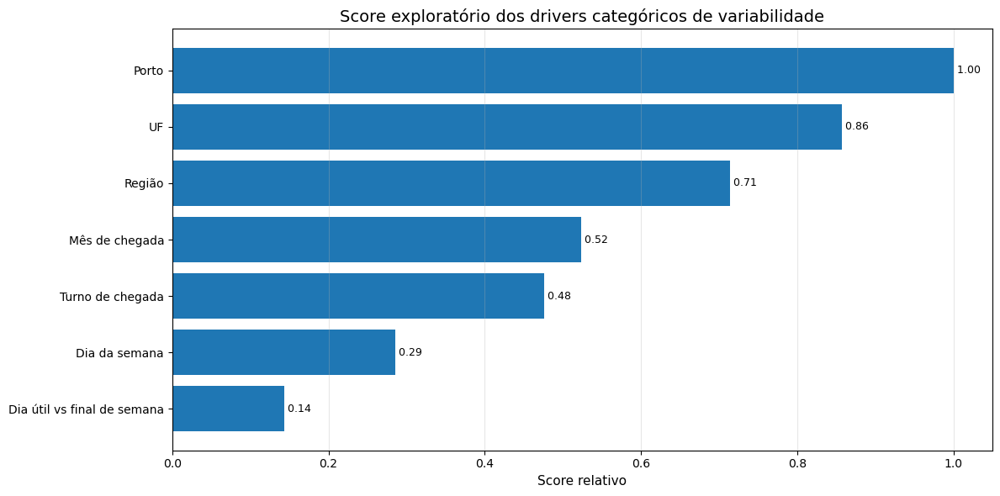

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_11_categorical_driver_score.png')

In [241]:
plot_data = categorical_driver_score.sort_values(
    "exploratory_driver_score",
    ascending=True,
)

fig, ax = plt.subplots(figsize=(12, 6))

ax.barh(
    plot_data["driver"],
    plot_data["exploratory_driver_score"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.exploratory_driver_score,
        index,
        f" {row.exploratory_driver_score:.2f}",
        va="center",
        fontsize=9,
    )

ax.set_title("Score exploratório dos drivers categóricos de variabilidade")
ax.set_xlabel("Score relativo")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_11_categorical_driver_score.png")
plt.show()

figure_path

O score exploratório compara drivers categóricos com base na diferença entre grupos.

Drivers com maior score são aqueles que separam grupos com maiores diferenças de mediana, p90 e percentual de casos extremos.

Esse score não deve ser interpretado como importância estatística definitiva. Ele é uma ferramenta exploratória para priorizar quais dimensões parecem mais informativas para a modelagem.

### 11.4 Tipo de operação como driver

O tipo de operação não é uma variável categórica mutuamente exclusiva. Uma mesma escala pode ter múltiplas flags operacionais.

Por isso, a síntese das operações precisa ser tratada separadamente. Em vez de agrupar por uma única categoria, avaliamos cada flag operacional como uma indicação binária da presença daquele tipo de operação.

In [242]:
operation_flag_columns = [
    col for col in df_driver.columns
    if col.startswith("op_")
]

OPERATION_LABELS = {
    "op_abastecimento_bunker": "Abastecimento / bunker",
    "op_arribada": "Arribada",
    "op_carga": "Carga",
    "op_descarga": "Descarga",
    "op_desembarque_passageiros": "Desembarque de passageiros",
    "op_embarque_passageiros": "Embarque de passageiros",
    "op_fundeio": "Fundeio",
    "op_fundeio_ship_to_ship": "Fundeio ship-to-ship",
    "op_navio_estado_com_operacao_comercial": "Navio de Estado com operação comercial",
    "op_navio_estado_marinha_brasil": "Navio de Estado - Marinha do Brasil",
    "op_navio_estado_sem_operacao_comercial": "Navio de Estado sem operação comercial",
    "op_offshore": "Offshore",
    "op_reparo_manutencao": "Reparo / manutenção",
    "op_retirada_residuos_com_operacao_comercial": "Retirada de resíduos com operação comercial",
    "op_retirada_residuos_sem_operacao_comercial": "Retirada de resíduos sem operação comercial",
    "op_solicitacao_certificado": "Solicitação de certificado",
    "op_tipo_operacao_nao_mapeado": "Tipo de operação não mapeado",
}

operation_labels = {
    col: OPERATION_LABELS.get(col, col.replace("op_", "").replace("_", " ").title())
    for col in operation_flag_columns
}

print(f"Operation flags found: {len(operation_flag_columns)}")

Operation flags found: 17


In [243]:
MIN_CALLS_OPERATION_SYNTHESIS = 100

operation_driver_rows = []

for op_col in operation_flag_columns:
    df_driver[op_col] = df_driver[op_col].fillna(False).astype(bool)

    subset = df_driver.loc[df_driver[op_col]].copy()

    if len(subset) < MIN_CALLS_OPERATION_SYNTHESIS:
        continue

    operation_driver_rows.append(
        {
            "operation_flag": op_col,
            "operation_label": operation_labels[op_col],
            "n_calls": subset["port_call_id"].nunique(),
            "median_total_d": subset[SYNTHESIS_TARGET_D].median(),
            "p90_total_d": subset[SYNTHESIS_TARGET_D].quantile(0.90),
            "p95_total_d": subset[SYNTHESIS_TARGET_D].quantile(0.95),
            "p90_minus_median_d": (
                subset[SYNTHESIS_TARGET_D].quantile(0.90)
                - subset[SYNTHESIS_TARGET_D].median()
            ),
            "extreme_pct": subset["is_extreme_total_stay"].mean() * 100,
        }
    )

operation_driver_summary = pd.DataFrame(operation_driver_rows)

if not operation_driver_summary.empty:
    operation_driver_summary = operation_driver_summary.sort_values(
        "p90_minus_median_d",
        ascending=False,
    ).reset_index(drop=True)

operation_driver_summary

,operation_flag,operation_label,n_calls,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d,extreme_pct
0,op_reparo_manutencao,Reparo / manutenção,317,3.82,15.64,20.09,11.82,26.50
1,op_fundeio,Fundeio,1305,1.75,10.36,16.47,8.61,18.16
2,op_solicitacao_certificado,Solicitação de certificado,1885,0.58,8.17,13.83,7.58,12.10
3,op_retirada_residuos_sem_operacao_comercial,Retirada de resíduos sem operação comercial,202,3.14,8.29,13.90,5.15,14.36
4,op_navio_estado_com_operacao_comercial,Navio de Estado com operação comercial,190,3.29,8.32,11.02,5.03,14.21
5,op_navio_estado_marinha_brasil,Navio de Estado - Marinha do Brasil,188,3.29,8.15,11.05,4.86,13.83
6,op_retirada_residuos_com_operacao_comercial,Retirada de resíduos com operação comercial,193,3.22,8.08,10.99,4.86,13.47
7,op_navio_estado_sem_operacao_comercial,Navio de Estado sem operação comercial,206,3.24,8.08,11.07,4.84,13.11
8,op_offshore,Offshore,33700,1.40,6.20,10.03,4.81,8.78
9,op_descarga,Descarga,57279,1.40,6.10,9.40,4.70,8.59


In [244]:
if not operation_driver_summary.empty:
    operation_driver_score = operation_driver_summary.copy()

    operation_driver_score["volume_rank_pct"] = operation_driver_score["n_calls"].rank(
        pct=True,
    )
    operation_driver_score["p90_rank_pct"] = operation_driver_score["p90_total_d"].rank(
        pct=True,
    )
    operation_driver_score["tail_gap_rank_pct"] = operation_driver_score[
        "p90_minus_median_d"
    ].rank(pct=True)
    operation_driver_score["extreme_pct_rank"] = operation_driver_score[
        "extreme_pct"
    ].rank(pct=True)

    operation_driver_score["operation_driver_score"] = (
        operation_driver_score[
            [
                "volume_rank_pct",
                "p90_rank_pct",
                "tail_gap_rank_pct",
                "extreme_pct_rank",
            ]
        ].mean(axis=1)
    )

    operation_driver_score = operation_driver_score.sort_values(
        "operation_driver_score",
        ascending=False,
    ).reset_index(drop=True)

    display(operation_driver_score.head(20))

,operation_flag,operation_label,n_calls,median_total_d,p90_total_d,p95_total_d,p90_minus_median_d,extreme_pct,volume_rank_pct,p90_rank_pct,tail_gap_rank_pct,extreme_pct_rank,operation_driver_score
0,op_reparo_manutencao,Reparo / manutenção,317,3.82,15.64,20.09,11.82,26.50,0.40,1.00,1.00,1.00,0.85
1,op_fundeio,Fundeio,1305,1.75,10.36,16.47,8.61,18.16,0.53,0.93,0.93,0.93,0.83
2,op_solicitacao_certificado,Solicitação de certificado,1885,0.58,8.17,13.83,7.58,12.10,0.60,0.73,0.87,0.53,0.68
3,op_retirada_residuos_sem_operacao_comercial,Retirada de resíduos sem operação comercial,202,3.14,8.29,13.90,5.15,14.36,0.27,0.80,0.80,0.87,0.68
4,op_navio_estado_com_operacao_comercial,Navio de Estado com operação comercial,190,3.29,8.32,11.02,5.03,14.21,0.13,0.87,0.73,0.80,0.63
5,op_navio_estado_marinha_brasil,Navio de Estado - Marinha do Brasil,188,3.29,8.15,11.05,4.86,13.83,0.07,0.67,0.67,0.73,0.53
6,op_carga,Carga,63445,1.62,6.22,9.70,4.60,8.87,1.00,0.40,0.33,0.40,0.53
7,op_retirada_residuos_com_operacao_comercial,Retirada de resíduos com operação comercial,193,3.22,8.08,10.99,4.86,13.47,0.20,0.60,0.60,0.67,0.52
8,op_navio_estado_sem_operacao_comercial,Navio de Estado sem operação comercial,206,3.24,8.08,11.07,4.84,13.11,0.33,0.53,0.53,0.60,0.50
9,op_offshore,Offshore,33700,1.40,6.20,10.03,4.81,8.78,0.87,0.33,0.47,0.33,0.50


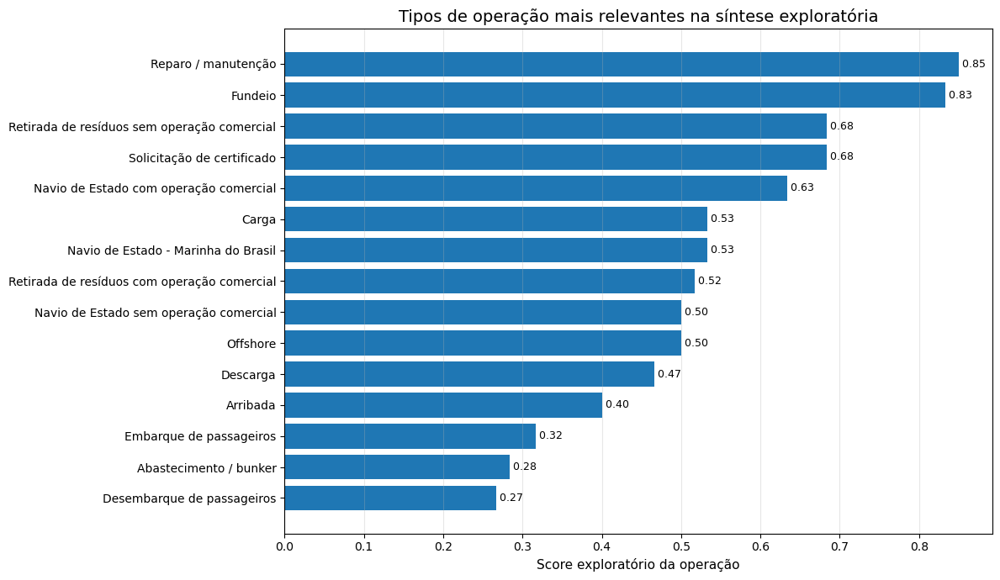

In [245]:
if "operation_driver_score" in globals() and not operation_driver_score.empty:
    plot_data = (
        operation_driver_score
        .head(15)
        .sort_values("operation_driver_score", ascending=True)
    )

    fig, ax = plt.subplots(figsize=(12, 7))

    ax.barh(
        plot_data["operation_label"],
        plot_data["operation_driver_score"],
    )

    for index, row in enumerate(plot_data.itertuples()):
        ax.text(
            row.operation_driver_score,
            index,
            f" {row.operation_driver_score:.2f}",
            va="center",
            fontsize=9,
        )

    ax.set_title("Tipos de operação mais relevantes na síntese exploratória")
    ax.set_xlabel("Score exploratório da operação")
    ax.set_ylabel("")
    ax.grid(axis="x", alpha=0.3)

    figure_path = save_figure("eda_11_operation_driver_score.png")
    plt.show()

    figure_path

### 11.5 Drivers numéricos: clima e congestionamento

Algumas variáveis importantes são numéricas, como chuva, vento, chegadas recentes e espera média histórica.

Para essas variáveis, usamos correlações de Pearson e Spearman com os principais tempos portuários.

A correlação é uma medida limitada, especialmente quando os efeitos são não lineares ou dependem de interações. Mesmo assim, ela ajuda a identificar quais variáveis numéricas têm maior associação exploratória com os targets.

In [246]:
weather_candidate_columns = [
    "temperature_2m_mean",
    "temperature_2m_max",
    "temperature_2m_min",
    "precipitation_sum",
    "rain_sum",
    "precipitation_hours",
    "wind_speed_10m_max",
    "wind_gusts_10m_max",
    "rain_sum_prev_1d",
    "precipitation_sum_prev_1d",
    "wind_speed_10m_max_prev_1d",
    "wind_gusts_10m_max_prev_1d",
    "temperature_2m_mean_prev_1d",
    "rain_sum_prev_3d",
    "precipitation_hours_prev_3d",
    "temperature_2m_mean_prev_3d",
    "wind_speed_10m_max_prev_3d",
    "wind_gusts_10m_max_prev_3d",
    "rain_sum_prev_7d",
    "precipitation_hours_prev_7d",
    "temperature_2m_mean_prev_7d",
    "wind_speed_10m_max_prev_7d",
    "wind_gusts_10m_max_prev_7d",
]

weather_numeric_columns = [
    col for col in weather_candidate_columns
    if col in df_driver.columns
]

congestion_candidate_columns = [
    "avg_wait_prev_20_calls_port",
    "avg_operation_prev_20_calls_port",
    "std_wait_prev_20_calls_port",
    "arrivals_same_day_port",
    "arrivals_prev_day_port",
    "arrivals_prev_7d_avg_port",
]

congestion_numeric_columns = [
    col for col in congestion_candidate_columns
    if col in df_driver.columns
]

calendar_numeric_columns = [
    col for col in [
        "arrival_year",
        "arrival_month",
        "arrival_weekofyear",
        "arrival_dayofweek",
        "arrival_hour",
    ]
    if col in df_driver.columns
]

print("Weather columns:", weather_numeric_columns)
print("Congestion columns:", congestion_numeric_columns)
print("Calendar numeric columns:", calendar_numeric_columns)

Weather columns: ['temperature_2m_mean', 'temperature_2m_max', 'temperature_2m_min', 'precipitation_sum', 'rain_sum', 'precipitation_hours', 'wind_speed_10m_max', 'wind_gusts_10m_max', 'rain_sum_prev_1d', 'precipitation_sum_prev_1d', 'wind_speed_10m_max_prev_1d', 'wind_gusts_10m_max_prev_1d', 'temperature_2m_mean_prev_1d', 'rain_sum_prev_3d', 'precipitation_hours_prev_3d', 'temperature_2m_mean_prev_3d', 'wind_speed_10m_max_prev_3d', 'wind_gusts_10m_max_prev_3d', 'rain_sum_prev_7d', 'precipitation_hours_prev_7d', 'temperature_2m_mean_prev_7d', 'wind_speed_10m_max_prev_7d', 'wind_gusts_10m_max_prev_7d']
Congestion columns: ['avg_wait_prev_20_calls_port', 'avg_operation_prev_20_calls_port', 'std_wait_prev_20_calls_port', 'arrivals_same_day_port', 'arrivals_prev_day_port', 'arrivals_prev_7d_avg_port']
Calendar numeric columns: ['arrival_year', 'arrival_month', 'arrival_weekofyear', 'arrival_dayofweek', 'arrival_hour']


In [247]:
numeric_driver_correlations = pd.concat(
    [
        summarize_numeric_driver_correlations(
            df_driver,
            weather_numeric_columns,
            "Clima",
        ),
        summarize_numeric_driver_correlations(
            df_driver,
            congestion_numeric_columns,
            "Congestionamento",
        ),
        summarize_numeric_driver_correlations(
            df_driver,
            calendar_numeric_columns,
            "Calendário numérico",
        ),
    ],
    ignore_index=True,
)

numeric_driver_correlations.sort_values(
    "abs_spearman_corr",
    ascending=False,
).head(30)

,driver_family,feature,target,pearson_corr,spearman_corr,n_obs,abs_spearman_corr
92,Congestionamento,avg_wait_prev_20_calls_port,t_wait_for_berthing_h,0.36,0.55,129088,0.55
100,Congestionamento,std_wait_prev_20_calls_port,t_wait_for_berthing_h,0.33,0.53,129088,0.53
97,Congestionamento,avg_operation_prev_20_calls_port,t_operation_h,0.27,0.38,129088,0.38
99,Congestionamento,avg_operation_prev_20_calls_port,t_total_port_stay_h,0.24,0.34,129088,0.34
85,Clima,wind_speed_10m_max_prev_7d,t_operation_h,-0.07,-0.14,129625,0.14
65,Clima,wind_speed_10m_max_prev_3d,t_operation_h,-0.07,-0.13,129625,0.13
87,Clima,wind_speed_10m_max_prev_7d,t_total_port_stay_h,-0.06,-0.12,129625,0.12
41,Clima,wind_speed_10m_max_prev_1d,t_operation_h,-0.07,-0.12,129625,0.12
67,Clima,wind_speed_10m_max_prev_3d,t_total_port_stay_h,-0.05,-0.11,129625,0.11
25,Clima,wind_speed_10m_max,t_operation_h,-0.06,-0.11,129625,0.11


In [248]:
numeric_total_corr = (
    numeric_driver_correlations
    .loc[numeric_driver_correlations["target"] == SYNTHESIS_TARGET_H]
    .sort_values("abs_spearman_corr", ascending=False)
    .reset_index(drop=True)
)

numeric_total_corr.head(20)

,driver_family,feature,target,pearson_corr,spearman_corr,n_obs,abs_spearman_corr
0,Congestionamento,avg_operation_prev_20_calls_port,t_total_port_stay_h,0.24,0.34,129088,0.34
1,Clima,wind_speed_10m_max_prev_7d,t_total_port_stay_h,-0.06,-0.12,129625,0.12
2,Clima,wind_speed_10m_max_prev_3d,t_total_port_stay_h,-0.05,-0.11,129625,0.11
3,Congestionamento,std_wait_prev_20_calls_port,t_total_port_stay_h,0.17,0.10,129088,0.10
4,Clima,wind_gusts_10m_max_prev_7d,t_total_port_stay_h,-0.06,-0.10,129625,0.10
5,Congestionamento,avg_wait_prev_20_calls_port,t_total_port_stay_h,0.18,0.10,129088,0.10
6,Clima,wind_speed_10m_max_prev_1d,t_total_port_stay_h,-0.05,-0.10,129625,0.10
7,Clima,wind_gusts_10m_max_prev_3d,t_total_port_stay_h,-0.06,-0.09,129625,0.09
8,Clima,wind_speed_10m_max,t_total_port_stay_h,-0.05,-0.09,129625,0.09
9,Clima,wind_gusts_10m_max_prev_1d,t_total_port_stay_h,-0.05,-0.08,129625,0.08


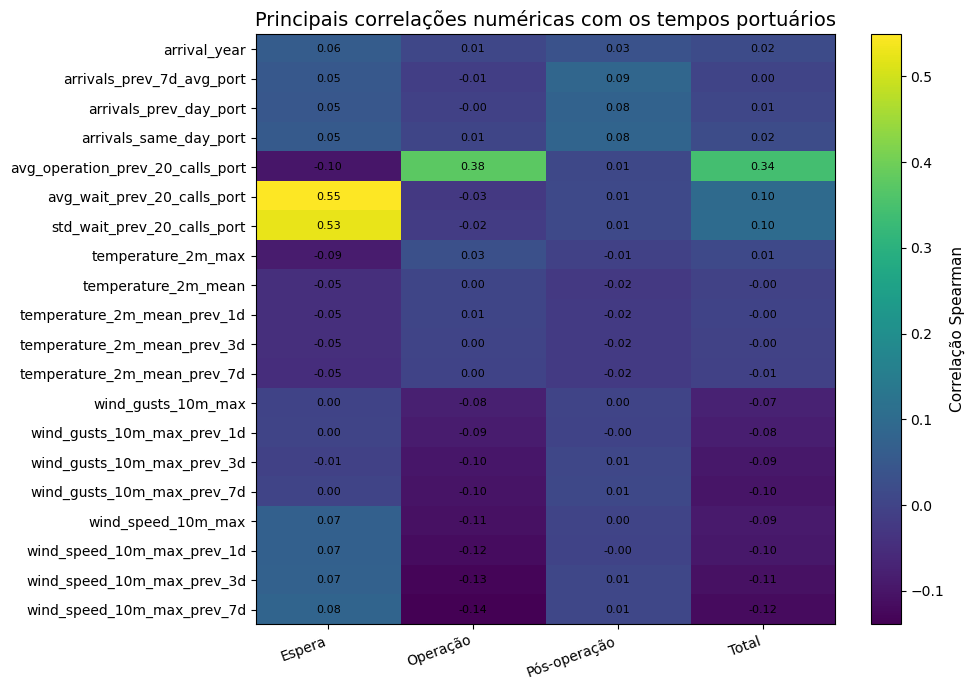

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_11_numeric_driver_correlation_heatmap.png')

In [249]:
top_numeric_features = (
    numeric_driver_correlations
    .groupby(["driver_family", "feature"])
    .agg(max_abs_spearman=("abs_spearman_corr", "max"))
    .reset_index()
    .sort_values("max_abs_spearman", ascending=False)
    .head(20)["feature"]
    .tolist()
)

numeric_corr_heatmap = (
    numeric_driver_correlations
    .loc[numeric_driver_correlations["feature"].isin(top_numeric_features)]
    .pivot_table(
        index="feature",
        columns="target",
        values="spearman_corr",
        aggfunc="first",
    )
)

target_order = [
    "t_wait_for_berthing_h",
    "t_operation_h",
    "t_post_operation_h",
    "t_total_port_stay_h",
]

numeric_corr_heatmap = numeric_corr_heatmap.reindex(columns=target_order)

target_labels_for_heatmap = [
    "Espera",
    "Operação",
    "Pós-operação",
    "Total",
]

fig, ax = plt.subplots(figsize=(10, max(6, len(numeric_corr_heatmap) * 0.35)))

im = ax.imshow(numeric_corr_heatmap.values, aspect="auto")

ax.set_xticks(np.arange(len(target_labels_for_heatmap)))
ax.set_xticklabels(target_labels_for_heatmap, rotation=20, ha="right")

ax.set_yticks(np.arange(len(numeric_corr_heatmap.index)))
ax.set_yticklabels(numeric_corr_heatmap.index)

for i in range(numeric_corr_heatmap.shape[0]):
    for j in range(numeric_corr_heatmap.shape[1]):
        value = numeric_corr_heatmap.iloc[i, j]
        if pd.notna(value):
            ax.text(
                j,
                i,
                f"{value:.2f}",
                ha="center",
                va="center",
                fontsize=8,
            )

cbar = plt.colorbar(im, ax=ax)
cbar.set_label("Correlação Spearman")

ax.set_title("Principais correlações numéricas com os tempos portuários")

figure_path = save_figure("eda_11_numeric_driver_correlation_heatmap.png")
plt.show()

figure_path

A matriz de correlação mostra quais variáveis numéricas apresentam maior associação monotônica com os tempos portuários.

Variáveis de congestionamento tendem a ser especialmente interessantes porque representam o estado recente do porto. Variáveis climáticas podem apresentar correlação global mais baixa, mas ainda assim serem úteis em interações com região, porto ou tipo de operação.

Por isso, a ausência de correlação forte não deve ser interpretada como ausência total de relevância.

### 11.6 Matriz integrada de evidência

Agora consolidamos as evidências em uma matriz única.

A matriz combina:

- score exploratório dos drivers categóricos;
- relevância das operações;
- maior correlação numérica por família;
- interpretação qualitativa para modelagem.

O objetivo é criar uma ponte clara entre o EDA e a seleção de features para os modelos preditivos.

In [250]:
integrated_rows = []

# Categorical drivers
for _, row in categorical_driver_score.iterrows():
    integrated_rows.append(
        {
            "driver_family": row["driver"],
            "evidence_type": "Diferença entre grupos",
            "main_metric": "Score categórico",
            "main_value": row["exploratory_driver_score"],
            "median_range_d": row["median_range_d"],
            "p90_range_d": row["p90_range_d"],
            "extreme_pct_range": row["extreme_pct_range"],
            "recommended_for_modeling": "Sim",
            "notes": "Driver separa grupos com diferentes perfis de permanência.",
        }
    )

# Operation driver
if "operation_driver_score" in globals() and not operation_driver_score.empty:
    top_operation_score = operation_driver_score["operation_driver_score"].max()

    integrated_rows.append(
        {
            "driver_family": "Tipo de operação",
            "evidence_type": "Flags operacionais",
            "main_metric": "Score máximo de operação",
            "main_value": top_operation_score,
            "median_range_d": operation_driver_summary["median_total_d"].max()
            - operation_driver_summary["median_total_d"].min(),
            "p90_range_d": operation_driver_summary["p90_total_d"].max()
            - operation_driver_summary["p90_total_d"].min(),
            "extreme_pct_range": operation_driver_summary["extreme_pct"].max()
            - operation_driver_summary["extreme_pct"].min(),
            "recommended_for_modeling": "Sim",
            "notes": "Usar flags independentes, pois operações não são mutuamente exclusivas.",
        }
    )

# Numeric driver families
if not numeric_driver_correlations.empty:
    numeric_family_summary = (
        numeric_driver_correlations
        .groupby("driver_family")
        .agg(
            max_abs_spearman=("abs_spearman_corr", "max"),
            mean_abs_spearman=("abs_spearman_corr", "mean"),
            n_features=("feature", "nunique"),
        )
        .reset_index()
    )

    for _, row in numeric_family_summary.iterrows():
        integrated_rows.append(
            {
                "driver_family": row["driver_family"],
                "evidence_type": "Correlação numérica",
                "main_metric": "Máxima correlação Spearman absoluta",
                "main_value": row["max_abs_spearman"],
                "median_range_d": np.nan,
                "p90_range_d": np.nan,
                "extreme_pct_range": np.nan,
                "recommended_for_modeling": "Sim",
                "notes": "Avaliar em modelos multivariados; correlação isolada pode subestimar interações.",
            }
        )

integrated_driver_evidence = pd.DataFrame(integrated_rows)

integrated_driver_evidence = integrated_driver_evidence.sort_values(
    "main_value",
    ascending=False,
).reset_index(drop=True)

integrated_driver_evidence

,driver_family,evidence_type,main_metric,main_value,median_range_d,p90_range_d,extreme_pct_range,recommended_for_modeling,notes
0,Porto,Diferença entre grupos,Score categórico,1.00,9.20,20.14,63.84,Sim,Driver separa grupos com diferentes perfis de ...
1,UF,Diferença entre grupos,Score categórico,0.86,4.36,7.86,15.39,Sim,Driver separa grupos com diferentes perfis de ...
2,Tipo de operação,Flags operacionais,Score máximo de operação,0.85,3.33,10.66,20.54,Sim,"Usar flags independentes, pois operações não s..."
3,Região,Diferença entre grupos,Score categórico,0.71,0.99,1.99,4.82,Sim,Driver separa grupos com diferentes perfis de ...
4,Congestionamento,Correlação numérica,Máxima correlação Spearman absoluta,0.55,NaN,NaN,NaN,Sim,Avaliar em modelos multivariados; correlação i...
5,Mês de chegada,Diferença entre grupos,Score categórico,0.52,0.23,0.91,1.78,Sim,Driver separa grupos com diferentes perfis de ...
6,Turno de chegada,Diferença entre grupos,Score categórico,0.48,0.26,0.56,1.42,Sim,Driver separa grupos com diferentes perfis de ...
7,Dia da semana,Diferença entre grupos,Score categórico,0.29,0.11,0.28,0.49,Sim,Driver separa grupos com diferentes perfis de ...
8,Dia útil vs final de semana,Diferença entre grupos,Score categórico,0.14,0.03,0.06,0.15,Sim,Driver separa grupos com diferentes perfis de ...
9,Clima,Correlação numérica,Máxima correlação Spearman absoluta,0.14,NaN,NaN,NaN,Sim,Avaliar em modelos multivariados; correlação i...


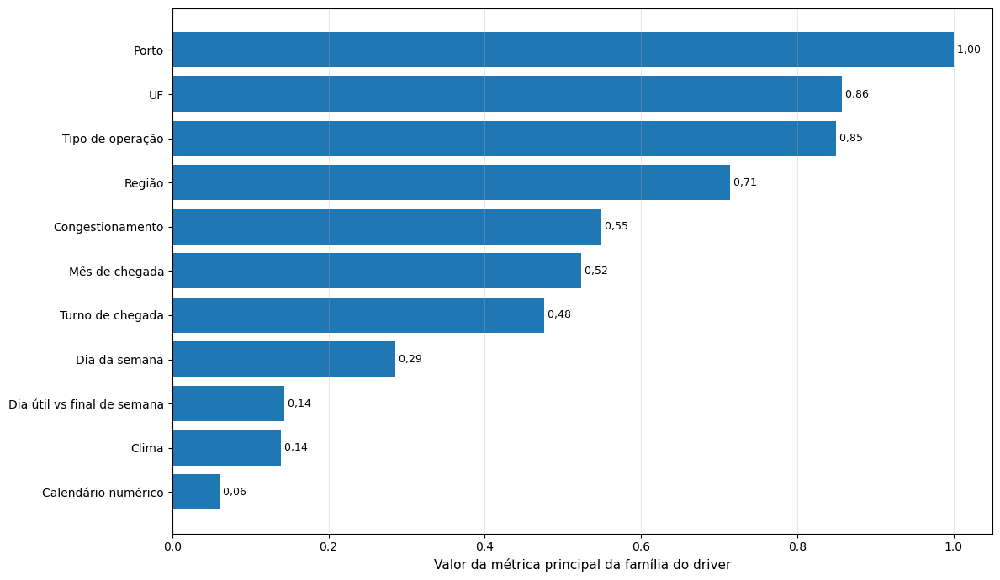

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_11_integrated_driver_evidence.png')

In [251]:
plot_data = integrated_driver_evidence.copy()

plot_data["main_value_plot"] = plot_data["main_value"]

plot_data = plot_data.sort_values("main_value_plot", ascending=True)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["driver_family"],
    plot_data["main_value_plot"],
)

for index, row in enumerate(plot_data.itertuples()):
    value_str = f"{row.main_value_plot:.2f}".replace(".", ",")
    ax.text(
        row.main_value_plot,
        index,
        f" {value_str}",
        va="center",
        fontsize=9,
    )

#ax.set_title("Matriz integrada de evidência exploratória por driver")
ax.set_xlabel("Valor da métrica principal da família do driver")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_11_integrated_driver_evidence.png")
plt.show()

figure_path

O gráfico integrado deve ser interpretado com cuidado, porque combina métricas de natureza diferente.

Para drivers categóricos, o valor representa um score relativo de diferenciação entre grupos. Para drivers numéricos, representa a maior correlação absoluta observada. Portanto, o gráfico não é um ranking estatístico definitivo.

Seu papel é apoiar o storytelling: ele mostra quais famílias de variáveis apresentam evidência exploratória suficiente para serem consideradas na modelagem.

### 11.7 Recomendações de features para modelagem

Com base no EDA, podemos organizar as variáveis candidatas para modelagem.

A seleção final deverá ser feita na etapa de modelagem, com validação temporal e métricas adequadas. Ainda assim, o EDA já indica quais famílias de features fazem sentido.

In [252]:
feature_recommendations = pd.DataFrame(
    [
        {
            "feature_family": "Porto e localização",
            "candidate_features": "port, state, region, latitude, longitude",
            "why_include": "Capturam heterogeneidade estrutural entre portos e regiões.",
            "caution": "Portos com poucos registros podem exigir agrupamento ou tratamento específico.",
            "priority": "Alta",
        },
        {
            "feature_family": "Tipo de operação",
            "candidate_features": ", ".join(operation_flag_columns) if operation_flag_columns else "operation_type",
            "why_include": "Operações diferentes apresentam tempos típicos e caudas distintas.",
            "caution": "Flags não são mutuamente exclusivas; manter representação binária independente.",
            "priority": "Alta",
        },
        {
            "feature_family": "Calendário",
            "candidate_features": "arrival_month, arrival_dayofweek, arrival_hour, arrival_shift, arrival_season",
            "why_include": "Capturam sazonalidade, padrões semanais e horários de chegada.",
            "caution": "Efeitos podem variar por porto e região.",
            "priority": "Média",
        },
        {
            "feature_family": "Clima",
            "candidate_features": ", ".join(weather_numeric_columns[:10]) if weather_numeric_columns else "Variáveis climáticas não disponíveis",
            "why_include": "Podem capturar condições externas adversas, especialmente em interações.",
            "caution": "Correlação global pode ser baixa; avaliar importância em modelos multivariados.",
            "priority": "Média",
        },
        {
            "feature_family": "Congestionamento recente",
            "candidate_features": ", ".join(congestion_numeric_columns) if congestion_numeric_columns else "Variáveis de congestionamento não disponíveis",
            "why_include": "Representam memória operacional e estado recente do porto.",
            "caution": "Evitar vazamento de informação; priorizar variáveis conhecidas antes da previsão.",
            "priority": "Alta",
        },
        {
            "feature_family": "Componentes do lead time",
            "candidate_features": "t_wait_for_berthing_h, t_operation_h, t_post_operation_h",
            "why_include": "Úteis para interpretação e modelagem auxiliar.",
            "caution": "Não devem ser usados como features para prever o tempo total se não forem conhecidos no momento da previsão.",
            "priority": "Interpretativa",
        },
    ]
)

feature_recommendations

,feature_family,candidate_features,why_include,caution,priority
0,Porto e localização,"port, state, region, latitude, longitude",Capturam heterogeneidade estrutural entre port...,Portos com poucos registros podem exigir agrup...,Alta
1,Tipo de operação,"op_abastecimento_bunker, op_arribada, op_carga...",Operações diferentes apresentam tempos típicos...,Flags não são mutuamente exclusivas; manter re...,Alta
2,Calendário,"arrival_month, arrival_dayofweek, arrival_hour...","Capturam sazonalidade, padrões semanais e horá...",Efeitos podem variar por porto e região.,Média
3,Clima,"temperature_2m_mean, temperature_2m_max, tempe...","Podem capturar condições externas adversas, es...",Correlação global pode ser baixa; avaliar impo...,Média
4,Congestionamento recente,"avg_wait_prev_20_calls_port, avg_operation_pre...",Representam memória operacional e estado recen...,Evitar vazamento de informação; priorizar vari...,Alta
5,Componentes do lead time,"t_wait_for_berthing_h, t_operation_h, t_post_o...",Úteis para interpretação e modelagem auxiliar.,Não devem ser usados como features para prever...,Interpretativa


Um ponto metodológico importante é evitar vazamento de informação.

Variáveis que só seriam conhecidas depois da escala não devem ser usadas para prever a permanência total. Por exemplo, os componentes do lead time ajudam a explicar o total, mas não podem ser usados como preditores em um modelo que precisa estimar o tempo total antes do encerramento da escala.

Da mesma forma, variáveis de congestionamento devem ser avaliadas com cuidado. Métricas baseadas em histórico anterior são mais seguras para previsão. Métricas do próprio dia, como número total de chegadas no mesmo dia, podem ser úteis se estiverem disponíveis no planejamento, mas podem representar vazamento se forem calculadas com informação futura.

### 11.8 Target recomendado para modelagem

O EDA também ajuda a definir qual variável deve ser usada como target principal.

A permanência total no porto é a métrica mais robusta para o objetivo do TCC, porque representa o lead time completo da escala portuária. Além disso, ela é diretamente conectada ao problema de planejamento logístico, estoques de segurança e capital de giro.

Os componentes internos — espera para atracação, operação atracada e pós-operação — são úteis para interpretação, mas podem apresentar limitações específicas, como excesso de zeros em algumas etapas ou dependência de granularidade dos registros intermediários.

In [253]:
target_recommendation = pd.DataFrame(
    [
        {
            "target": "t_total_port_stay_h",
            "label": "Permanência total no porto",
            "recommended_role": "Target principal",
            "reason": "Representa o lead time completo da escala e conecta diretamente com planejamento e estoques.",
            "caution": "Distribuição assimétrica pode exigir transformação logarítmica ou modelos robustos.",
        },
        {
            "target": "t_wait_for_berthing_h",
            "label": "Espera para atracação",
            "recommended_role": "Target auxiliar / análise interpretativa",
            "reason": "Ajuda a entender fila, capacidade e congestionamento.",
            "caution": "Pode ter excesso de zeros e forte dependência da granularidade do dado.",
        },
        {
            "target": "t_operation_h",
            "label": "Operação atracada",
            "recommended_role": "Target auxiliar possível",
            "reason": "Pode representar parcela importante do tempo total e estar ligada ao tipo de operação.",
            "caution": "Pode exigir variáveis adicionais sobre carga, produtividade e operação.",
        },
        {
            "target": "t_post_operation_h",
            "label": "Pós-operação",
            "recommended_role": "Target auxiliar / análise interpretativa",
            "reason": "Ajuda a investigar atrasos após desatracação.",
            "caution": "Pode ter excesso de zeros e menor granularidade operacional.",
        },
    ]
)

target_recommendation

,target,label,recommended_role,reason,caution
0,t_total_port_stay_h,Permanência total no porto,Target principal,Representa o lead time completo da escala e co...,Distribuição assimétrica pode exigir transform...
1,t_wait_for_berthing_h,Espera para atracação,Target auxiliar / análise interpretativa,"Ajuda a entender fila, capacidade e congestion...",Pode ter excesso de zeros e forte dependência ...
2,t_operation_h,Operação atracada,Target auxiliar possível,Pode representar parcela importante do tempo t...,"Pode exigir variáveis adicionais sobre carga, ..."
3,t_post_operation_h,Pós-operação,Target auxiliar / análise interpretativa,Ajuda a investigar atrasos após desatracação.,Pode ter excesso de zeros e menor granularidad...


### 11.9 Riscos metodológicos identificados

A síntese do EDA também deve registrar riscos e limitações metodológicas que precisarão ser considerados na modelagem.

Esses pontos aumentam a credibilidade do trabalho porque mostram que a análise não assume os dados como perfeitos.

In [254]:
methodological_risks = pd.DataFrame(
    [
        {
            "risk": "Cauda longa no target",
            "impact": "Média pode ser pouco representativa e erros extremos podem dominar métricas como RMSE.",
            "mitigation": "Avaliar MAE, MedAE, RMSE, quantile loss e possível transformação log1p.",
        },
        {
            "risk": "Excesso de zeros em componentes",
            "impact": "Alguns componentes podem ter baixa granularidade ou muitos registros com intervalo igual a zero.",
            "mitigation": "Usar permanência total como target principal e componentes como análise auxiliar.",
        },
        {
            "risk": "Heterogeneidade entre portos",
            "impact": "Modelo global pode ter desempenho desigual em portos com perfis muito diferentes.",
            "mitigation": "Incluir porto/região como features e avaliar métricas por segmento.",
        },
        {
            "risk": "Portos com poucos registros",
            "impact": "Estimativas de p90 e variabilidade podem ser instáveis.",
            "mitigation": "Aplicar filtros mínimos, agrupar portos raros ou usar encoding robusto.",
        },
        {
            "risk": "Possível vazamento temporal",
            "impact": "Features calculadas com informação futura podem inflar artificialmente a performance.",
            "mitigation": "Usar validação temporal e garantir que features estejam disponíveis no momento da previsão.",
        },
        {
            "risk": "Cobertura climática desigual",
            "impact": "Efeitos climáticos podem ser enviesados por disponibilidade de dados por porto/região.",
            "mitigation": "Medir cobertura, usar flags de disponibilidade e validar importância em modelos.",
        },
        {
            "risk": "Operações não mutuamente exclusivas",
            "impact": "Análises por tipo de operação podem contar uma mesma escala em múltiplos grupos.",
            "mitigation": "Usar flags binárias independentes e interpretar resultados como presença de operação.",
        },
    ]
)

methodological_risks

,risk,impact,mitigation
0,Cauda longa no target,Média pode ser pouco representativa e erros ex...,"Avaliar MAE, MedAE, RMSE, quantile loss e poss..."
1,Excesso de zeros em componentes,Alguns componentes podem ter baixa granularida...,Usar permanência total como target principal e...
2,Heterogeneidade entre portos,Modelo global pode ter desempenho desigual em ...,Incluir porto/região como features e avaliar m...
3,Portos com poucos registros,Estimativas de p90 e variabilidade podem ser i...,"Aplicar filtros mínimos, agrupar portos raros ..."
4,Possível vazamento temporal,Features calculadas com informação futura pode...,Usar validação temporal e garantir que feature...
5,Cobertura climática desigual,Efeitos climáticos podem ser enviesados por di...,"Medir cobertura, usar flags de disponibilidade..."
6,Operações não mutuamente exclusivas,Análises por tipo de operação podem contar uma...,Usar flags binárias independentes e interpreta...


In [255]:
top_categorical_driver = categorical_driver_score.iloc[0]

if "operation_driver_score" in globals() and not operation_driver_score.empty:
    top_operation_driver = operation_driver_score.iloc[0]
    operation_message = (
        f"Entre os tipos de operação, '{top_operation_driver['operation_label']}' "
        f"aparece com o maior score exploratório, combinando volume, p90, cauda e presença em casos extremos."
    )
else:
    operation_message = (
        "As flags de tipo de operação não estavam disponíveis ou não passaram o filtro mínimo de volume."
    )

if not numeric_total_corr.empty:
    top_numeric_feature = numeric_total_corr.iloc[0]
    numeric_message = (
        f"Entre as variáveis numéricas, '{top_numeric_feature['feature']}' "
        f"apresenta a maior associação monotônica absoluta com a permanência total "
        f"(Spearman = {top_numeric_feature['spearman_corr']:.3f})."
    )
else:
    numeric_message = "Não foram encontradas correlações numéricas suficientes para síntese."

section_11_narrative = f"""
A síntese dos drivers mostra que a variabilidade da permanência portuária é multidimensional.

Entre os drivers categóricos, '{top_categorical_driver['driver']}' aparece com o maior score exploratório, sugerindo forte diferenciação entre grupos em termos de mediana, p90 e percentual de casos extremos.

{operation_message}

{numeric_message}

Em conjunto, os resultados indicam que a modelagem de lead time deve combinar variáveis estruturais, operacionais, temporais, climáticas e de congestionamento. A permanência total no porto permanece como o target principal mais adequado, enquanto os componentes do lead time ajudam a interpretar onde a variabilidade é gerada.
"""

print(section_11_narrative)


A síntese dos drivers mostra que a variabilidade da permanência portuária é multidimensional.

Entre os drivers categóricos, 'Porto' aparece com o maior score exploratório, sugerindo forte diferenciação entre grupos em termos de mediana, p90 e percentual de casos extremos.

Entre os tipos de operação, 'Reparo / manutenção' aparece com o maior score exploratório, combinando volume, p90, cauda e presença em casos extremos.

Entre as variáveis numéricas, 'avg_operation_prev_20_calls_port' apresenta a maior associação monotônica absoluta com a permanência total (Spearman = 0.343).

Em conjunto, os resultados indicam que a modelagem de lead time deve combinar variáveis estruturais, operacionais, temporais, climáticas e de congestionamento. A permanência total no porto permanece como o target principal mais adequado, enquanto os componentes do lead time ajudam a interpretar onde a variabilidade é gerada.



In [256]:
driver_conceptual_matrix_path = TABLES_DIR / "eda_11_driver_conceptual_matrix.csv"
categorical_driver_summary_path = TABLES_DIR / "eda_11_categorical_driver_summary.csv"
categorical_driver_score_path = TABLES_DIR / "eda_11_categorical_driver_score.csv"
operation_driver_summary_path = TABLES_DIR / "eda_11_operation_driver_summary.csv"
numeric_driver_correlations_path = TABLES_DIR / "eda_11_numeric_driver_correlations.csv"
integrated_driver_evidence_path = TABLES_DIR / "eda_11_integrated_driver_evidence.csv"
feature_recommendations_path = TABLES_DIR / "eda_11_feature_recommendations.csv"
target_recommendation_path = TABLES_DIR / "eda_11_target_recommendation.csv"
methodological_risks_path = TABLES_DIR / "eda_11_methodological_risks.csv"

driver_conceptual_matrix.to_csv(driver_conceptual_matrix_path, index=False)
categorical_driver_summary.to_csv(categorical_driver_summary_path, index=False)
categorical_driver_score.to_csv(categorical_driver_score_path, index=False)

if "operation_driver_summary" in globals() and not operation_driver_summary.empty:
    operation_driver_summary.to_csv(operation_driver_summary_path, index=False)

numeric_driver_correlations.to_csv(numeric_driver_correlations_path, index=False)
integrated_driver_evidence.to_csv(integrated_driver_evidence_path, index=False)
feature_recommendations.to_csv(feature_recommendations_path, index=False)
target_recommendation.to_csv(target_recommendation_path, index=False)
methodological_risks.to_csv(methodological_risks_path, index=False)

[
    driver_conceptual_matrix_path,
    categorical_driver_summary_path,
    categorical_driver_score_path,
    operation_driver_summary_path,
    numeric_driver_correlations_path,
    integrated_driver_evidence_path,
    feature_recommendations_path,
    target_recommendation_path,
    methodological_risks_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_11_driver_conceptual_matrix.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_11_categorical_driver_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_11_categorical_driver_score.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_11_operation_driver_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_11_numeric_driver_correlations.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_11_integrated_driver_evidence.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_p

### Principais mensagens da seção

A síntese dos drivers mostra que a permanência portuária não pode ser explicada por uma única dimensão.

O EDA indica que a variabilidade do lead time está associada a uma combinação de fatores:

- diferenças estruturais entre portos e regiões;
- perfil operacional da escala;
- padrões temporais e sazonais;
- condições climáticas;
- congestionamento e memória operacional recente.

Essa conclusão é importante para o TCC porque justifica o uso de modelos preditivos mais flexíveis do que médias históricas simples. Um modelo útil de lead time precisa capturar heterogeneidade entre portos, operações, períodos e condições recentes do sistema.

A permanência total no porto deve ser mantida como target principal, pois representa o lead time completo da escala portuária. Os componentes internos — espera, operação e pós-operação — continuam relevantes para interpretação e diagnóstico operacional.

A próxima seção conectará esses achados ao problema central de Supply Chain: estoques de segurança, risco de atraso e capital de giro.

---

## 12. Implicações para Supply Chain, estoques de segurança e capital de giro

As seções anteriores mostraram que a permanência portuária apresenta variabilidade relevante entre portos, regiões, tipos de operação, períodos do calendário, condições climáticas e níveis recentes de congestionamento.

Nesta seção, conectamos esses achados ao problema central de Supply Chain:

> Como a variabilidade do lead time impacta estoques de segurança, risco de ruptura e capital de giro?

Em cadeias de suprimento, o lead time não é apenas uma métrica operacional. Ele define por quanto tempo uma empresa precisa se proteger contra incertezas enquanto aguarda a chegada ou liberação de produtos, insumos ou cargas.

Quando o lead time é incerto, a empresa tende a aumentar buffers para reduzir risco de ruptura. Esses buffers podem assumir diferentes formas:

- estoques de segurança;
- janelas logísticas mais longas;
- capacidade adicional;
- antecipação de pedidos;
- capital empatado em estoque.

Portanto, prever melhor o lead time pode gerar valor econômico: não necessariamente eliminando buffers, mas ajustando-os de forma mais inteligente ao risco real de cada contexto.

### 12.1 Do lead time observado ao risco de planejamento

Uma média histórica de lead time pode ser suficiente quando o processo é estável e pouco variável. Porém, quando a distribuição tem cauda longa, a média deixa de representar adequadamente o risco.

A análise exploratória mostrou que a permanência portuária deve ser interpretada em pelo menos três níveis:

- **comportamento típico**, representado pela mediana;
- **cenário esperado médio**, representado pela média;
- **cenário de risco**, representado por percentis como p90 e p95.

Para Supply Chain, os percentis superiores são especialmente relevantes porque os buffers são dimensionados para proteger a operação contra atrasos, não apenas contra o comportamento médio.

In [257]:
supply_target_h = "t_total_port_stay_h"
supply_target_d = "t_total_port_stay_d"

df_supply = df.copy()

if supply_target_d not in df_supply.columns:
    df_supply[supply_target_d] = df_supply[supply_target_h] / 24

lead_time_summary = pd.DataFrame(
    [
        {
            "metric": "Mediana",
            "lead_time_days": df_supply[supply_target_d].median(),
        },
        {
            "metric": "Média",
            "lead_time_days": df_supply[supply_target_d].mean(),
        },
        {
            "metric": "p75",
            "lead_time_days": df_supply[supply_target_d].quantile(0.75),
        },
        {
            "metric": "p90",
            "lead_time_days": df_supply[supply_target_d].quantile(0.90),
        },
        {
            "metric": "p95",
            "lead_time_days": df_supply[supply_target_d].quantile(0.95),
        },
        {
            "metric": "p99",
            "lead_time_days": df_supply[supply_target_d].quantile(0.99),
        },
    ]
)

lead_time_summary["extra_days_vs_median"] = (
    lead_time_summary["lead_time_days"]
    - df_supply[supply_target_d].median()
)

lead_time_summary

,metric,lead_time_days,extra_days_vs_median
0,Mediana,1.60,0.00
1,Média,2.96,1.36
2,p75,3.37,1.77
3,p90,6.80,5.19
4,p95,10.57,8.97
5,p99,21.99,20.39


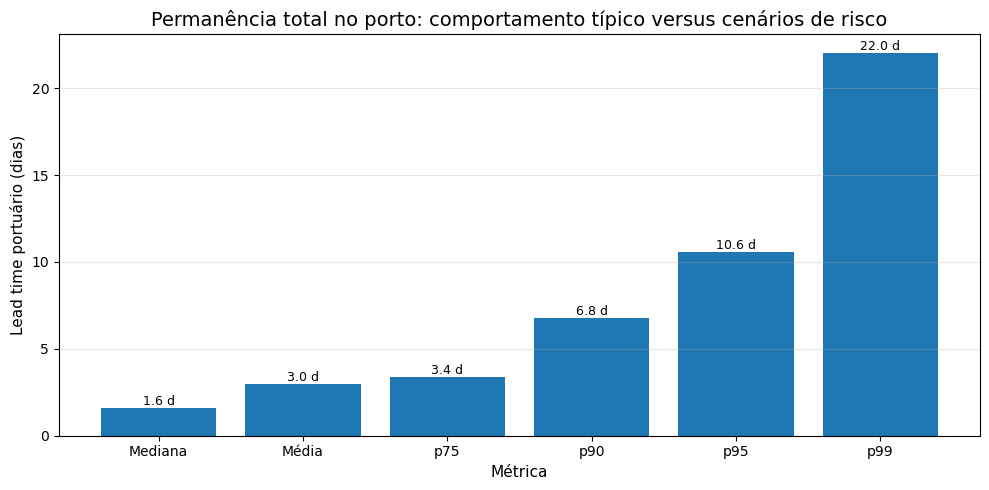

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_12_lead_time_risk_premium_days.png')

In [258]:
plot_data = lead_time_summary.copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    plot_data["metric"],
    plot_data["lead_time_days"],
)

for index, row in plot_data.iterrows():
    ax.text(
        index,
        row["lead_time_days"],
        f"{row['lead_time_days']:.1f} d",
        ha="center",
        va="bottom",
        fontsize=9,
    )

ax.set_title("Permanência total no porto: comportamento típico versus cenários de risco")
ax.set_xlabel("Métrica")
ax.set_ylabel("Lead time portuário (dias)")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_12_lead_time_risk_premium_days.png")
plt.show()

figure_path

O gráfico acima traduz a distribuição de permanência portuária para uma linguagem de planejamento.

A diferença entre a mediana e os percentis superiores pode ser interpretada como um **prêmio de risco de lead time**. Quanto maior essa diferença, maior a distância entre o comportamento típico e os cenários que a cadeia precisa suportar para manter nível de serviço.

Essa diferença é uma das principais justificativas para modelos preditivos: se o risco varia por porto, operação, período e congestionamento, então um buffer único baseado em média histórica pode ser excessivo em alguns contextos e insuficiente em outros.

### 12.2 Lead time e estoque de segurança

Em Supply Chain, o estoque de segurança protege a operação contra incertezas de demanda e de lead time.

Uma formulação clássica, quando demanda e lead time são variáveis, é:

$$
SS = z \cdot \sigma_{DLT}
$$

Onde:

$$
\sigma_{DLT} = \sqrt{\bar{L} \cdot \sigma_D^2 + \bar{D}^2 \cdot \sigma_L^2}
$$

Em que:

- $SS$ é o estoque de segurança;
- $z$ é o fator associado ao nível de serviço desejado;
- $\bar{L}$ é o lead time médio;
- $\sigma_L$ é o desvio padrão do lead time;
- $\bar{D}$ é a demanda média por período;
- $\sigma_D$ é o desvio padrão da demanda por período;
- $\sigma_{DLT}$ é o desvio padrão da demanda durante o lead time.

O ponto central para este TCC é que a variabilidade do lead time entra diretamente na necessidade de estoque de segurança. Mesmo que a demanda fosse relativamente estável, um lead time muito incerto já seria suficiente para aumentar buffers.

In [259]:
# Illustrative parameters.
# These values are not from the port dataset. They are used only to translate lead time risk into Supply Chain language.
avg_daily_demand = 1_000
std_daily_demand = 200
service_factor_z = 1.65  # Approx. 95% cycle service level

lead_time_mean = df_supply[supply_target_d].mean()
lead_time_std = df_supply[supply_target_d].std()

demand_during_lead_time_std = np.sqrt(
    lead_time_mean * (std_daily_demand ** 2)
    + (avg_daily_demand ** 2) * (lead_time_std ** 2)
)

safety_stock_units = service_factor_z * demand_during_lead_time_std

safety_stock_example = pd.DataFrame(
    [
        {
            "avg_daily_demand_units": avg_daily_demand,
            "std_daily_demand_units": std_daily_demand,
            "service_factor_z": service_factor_z,
            "lead_time_mean_days": lead_time_mean,
            "lead_time_std_days": lead_time_std,
            "demand_during_lead_time_std_units": demand_during_lead_time_std,
            "safety_stock_units": safety_stock_units,
        }
    ]
)

safety_stock_example

,avg_daily_demand_units,std_daily_demand_units,service_factor_z,lead_time_mean_days,lead_time_std_days,demand_during_lead_time_std_units,safety_stock_units
0,1000,200,1.65,2.96,4.05,"4,061.12","6,700.85"


A simulação acima é conceitual. Ela não usa dados reais de demanda ou custo de produto, porque a base do projeto é portuária.

Ainda assim, ela demonstra o mecanismo econômico: quando o desvio padrão do lead time aumenta, o desvio padrão da demanda durante o lead time também aumenta. Como consequência, o estoque de segurança necessário para manter o mesmo nível de serviço tende a crescer.

Esse é o elo entre o EDA portuário e o problema de capital de giro.

### 12.3 Comparação entre política estática e política dinâmica

Uma política estática de planejamento pode assumir um único lead time para todos os casos, por exemplo a média nacional ou uma regra fixa por porto.

O problema é que o EDA mostrou que o risco não é homogêneo. Portos, operações, meses e níveis de congestionamento podem ter distribuições diferentes.

Uma política dinâmica, apoiada por modelos preditivos, busca estimar o lead time esperado de cada escala com base em seu contexto específico.

A diferença conceitual é:

- **Política estática:** mesmo buffer para contextos diferentes.
- **Política dinâmica:** buffer ajustado ao risco previsto de cada contexto.

In [260]:
MIN_CALLS_FOR_SUPPLY_PORT_ANALYSIS = 30

port_supply_risk = (
    df_supply
    .groupby(["port", "port_display", "region"], dropna=False)
    .agg(
        n_calls=("port_call_id", "nunique"),
        median_lead_time_d=(supply_target_d, "median"),
        mean_lead_time_d=(supply_target_d, "mean"),
        std_lead_time_d=(supply_target_d, "std"),
        p90_lead_time_d=(supply_target_d, lambda x: x.quantile(0.90)),
        p95_lead_time_d=(supply_target_d, lambda x: x.quantile(0.95)),
    )
    .reset_index()
)

port_supply_risk = port_supply_risk.loc[
    port_supply_risk["n_calls"] >= MIN_CALLS_FOR_SUPPLY_PORT_ANALYSIS
].copy()

national_median_d = df_supply[supply_target_d].median()
national_p90_d = df_supply[supply_target_d].quantile(0.90)

port_supply_risk["risk_premium_vs_port_median_d"] = (
    port_supply_risk["p90_lead_time_d"]
    - port_supply_risk["median_lead_time_d"]
)

port_supply_risk["risk_premium_vs_national_median_d"] = (
    port_supply_risk["p90_lead_time_d"]
    - national_median_d
)

port_supply_risk = port_supply_risk.sort_values(
    "risk_premium_vs_port_median_d",
    ascending=False,
)

port_supply_risk.head(20)

,port,port_display,region,n_calls,median_lead_time_d,mean_lead_time_d,std_lead_time_d,p90_lead_time_d,p95_lead_time_d,risk_premium_vs_port_median_d,risk_premium_vs_national_median_d
8,BRADR002,BRADR002 - ANGRA DOS REIS - RJ,SUDESTE,39,1.76,4.66,6.67,15.84,19.44,14.07,14.23
43,BRITJ007,BRITJ007 - ITAJAÍ - SC,SUL,213,0.96,3.63,6.23,14.24,19.19,13.29,12.64
81,BRSFS,BRSFS - SÃO FRANCISCO DO SUL - SC,SUL,1345,4.09,7.19,7.00,16.91,22.29,12.81,15.30
98,BRVDC005,BRVDC005 - BARCARENA - PA,NORTE,177,9.27,11.03,6.70,20.57,23.84,11.30,18.97
33,BRITA004,BRITA004 - ITACOATIARA - AM,NORTE,192,3.14,5.85,5.41,13.25,15.93,10.10,11.65
89,BRSSZ,BRSSZ - SANTOS - SP,SUDESTE,15773,2.17,4.49,5.80,11.70,17.36,9.53,10.10
90,BRSTM,BRSTM - SANTARÉM - PA,NORTE,654,3.87,5.70,5.60,13.39,16.34,9.53,11.79
57,BRNTR,BRNTR - NITERÓI - RJ,SUDESTE,1943,1.76,4.05,5.49,10.85,16.48,9.08,9.24
61,BRPEC,BRPEC - SÃO GONÇALO DO AMARANTE - CE,NORDESTE,2195,1.08,3.45,5.36,9.17,13.17,8.09,7.57
38,BRITJ,BRITJ - ITAJAÍ - SC,SUL,695,1.05,3.22,5.66,8.88,17.07,7.83,7.28


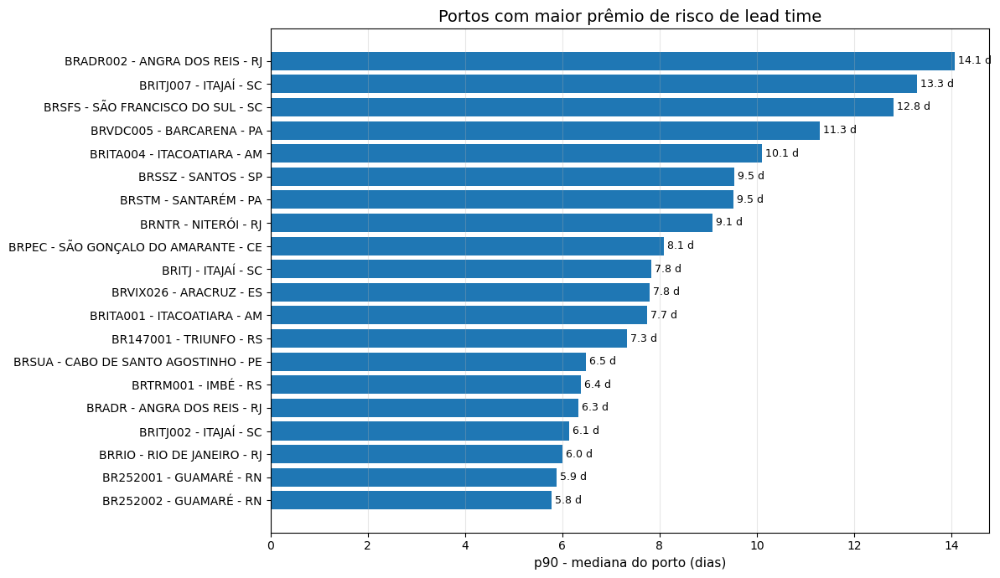

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_12_ports_lead_time_risk_premium.png')

In [261]:
plot_data = (
    port_supply_risk
    .head(20)
    .sort_values("risk_premium_vs_port_median_d", ascending=True)
)

fig, ax = plt.subplots(figsize=(12, 7))

ax.barh(
    plot_data["port_display"],
    plot_data["risk_premium_vs_port_median_d"],
)

for index, row in enumerate(plot_data.itertuples()):
    ax.text(
        row.risk_premium_vs_port_median_d,
        index,
        f" {row.risk_premium_vs_port_median_d:.1f} d",
        va="center",
        fontsize=9,
    )

ax.set_title("Portos com maior prêmio de risco de lead time")
ax.set_xlabel("p90 - mediana do porto (dias)")
ax.set_ylabel("")
ax.grid(axis="x", alpha=0.3)

figure_path = save_figure("eda_12_ports_lead_time_risk_premium.png")
plt.show()

figure_path

O prêmio de risco por porto mostra quanto o cenário p90 se distancia do comportamento típico daquele próprio porto.

Portos com alto prêmio de risco são especialmente importantes para planejamento. Eles podem parecer controlados quando observados pela mediana, mas apresentam uma cauda relevante de permanências mais longas.

Em uma política estática, esses portos poderiam receber o mesmo tratamento que portos mais estáveis. Em uma política dinâmica, o buffer poderia ser ajustado conforme o risco previsto.

### 12.4 Proxy de capital empatado por dias adicionais de lead time

A base portuária não contém valores monetários de estoque, demanda ou custo de produto. Portanto, não é possível calcular diretamente o capital de giro real associado a cada escala.

Mesmo assim, podemos criar uma tradução conceitual:

$$
Capital\ adicional \approx Dias\ adicionais\ de\ lead\ time \times Demanda\ média\ diária \times Custo\ unitário
$$

Essa fórmula mostra que cada dia adicional de incerteza pode exigir mais estoque em trânsito, estoque de segurança ou antecipação de compras.

Nesta seção, usamos valores hipotéticos apenas para ilustrar a sensibilidade econômica do lead time.

In [262]:
# Illustrative business parameters.
# Adjust these values if you want to simulate a specific business case.
illustrative_avg_daily_demand = 1_000
illustrative_unit_cost = 100

working_capital_params = pd.DataFrame(
    [
        {
            "parameter": "illustrative_avg_daily_demand",
            "value": illustrative_avg_daily_demand,
            "description": "Demanda média diária hipotética em unidades",
        },
        {
            "parameter": "illustrative_unit_cost",
            "value": illustrative_unit_cost,
            "description": "Custo unitário hipotético",
        },
    ]
)

working_capital_params

,parameter,value,description
0,illustrative_avg_daily_demand,1000,Demanda média diária hipotética em unidades
1,illustrative_unit_cost,100,Custo unitário hipotético


In [263]:
national_working_capital_proxy = lead_time_summary.copy()

national_working_capital_proxy["additional_days_vs_median"] = (
    national_working_capital_proxy["lead_time_days"]
    - national_median_d
)

national_working_capital_proxy["additional_units_vs_median"] = (
    national_working_capital_proxy["additional_days_vs_median"]
    * illustrative_avg_daily_demand
)

national_working_capital_proxy["additional_capital_vs_median"] = (
    national_working_capital_proxy["additional_units_vs_median"]
    * illustrative_unit_cost
)

national_working_capital_proxy

,metric,lead_time_days,extra_days_vs_median,additional_days_vs_median,additional_units_vs_median,additional_capital_vs_median
0,Mediana,1.60,0.00,0.00,0.00,0.00
1,Média,2.96,1.36,1.36,"1,361.97","136,196.68"
2,p75,3.37,1.77,1.77,"1,767.36","176,736.11"
3,p90,6.80,5.19,5.19,"5,194.44","519,444.44"
4,p95,10.57,8.97,8.97,"8,971.53","897,152.78"
5,p99,21.99,20.39,20.39,"20,393.17","2,039,316.67"


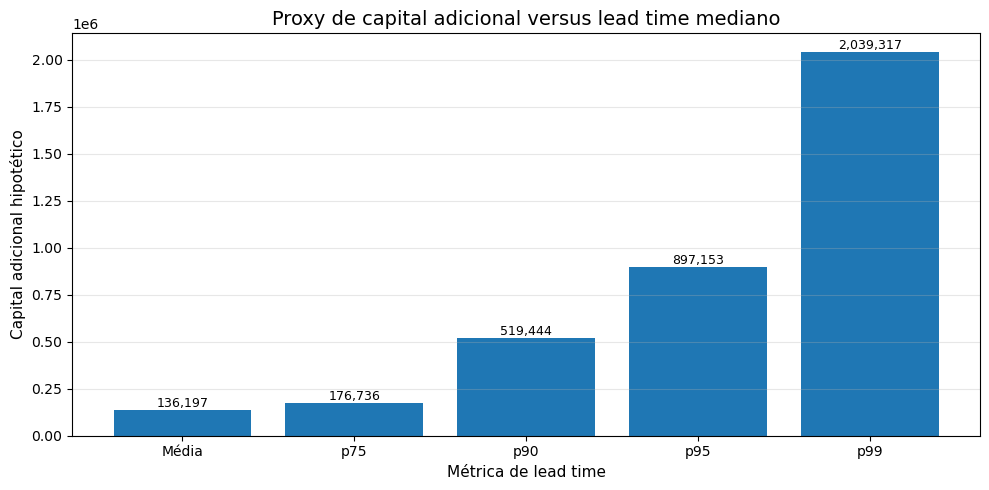

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_12_working_capital_proxy_by_percentile.png')

In [264]:
plot_data = national_working_capital_proxy.loc[
    national_working_capital_proxy["metric"].isin(["Média", "p75", "p90", "p95", "p99"])
].copy()

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    plot_data["metric"],
    plot_data["additional_capital_vs_median"],
)

for index, row in plot_data.reset_index(drop=True).iterrows():
    ax.text(
        index,
        row["additional_capital_vs_median"],
        f"{row['additional_capital_vs_median']:,.0f}",
        ha="center",
        va="bottom",
        fontsize=9,
    )

ax.set_title("Proxy de capital adicional versus lead time mediano")
ax.set_xlabel("Métrica de lead time")
ax.set_ylabel("Capital adicional hipotético")
ax.grid(axis="y", alpha=0.3)

figure_path = save_figure("eda_12_working_capital_proxy_by_percentile.png")
plt.show()

figure_path

O gráfico acima não deve ser interpretado como valor financeiro real do projeto. Ele é uma simulação didática para mostrar a sensibilidade do capital empatado à diferença entre lead time típico e cenários de risco.

Quanto maior o lead time usado para proteger a operação, maior tende a ser o volume de estoque ou capital necessário para cobrir esse período.

Essa relação explica por que previsões mais precisas de lead time podem gerar valor: elas permitem calibrar buffers de forma mais granular, evitando tanto excesso de capital empatado quanto risco de ruptura.

### 12.5 Políticas de buffer: média nacional, p90 nacional e p90 por porto

Para tornar a discussão mais concreta, comparamos três políticas simplificadas:

1. **Média nacional:** usar o lead time médio da base como referência única.
2. **p90 nacional:** usar um buffer conservador único para todos os casos.
3. **p90 por porto:** usar um buffer diferenciado por porto, capturando heterogeneidade local.

A terceira política ainda não é um modelo preditivo completo, mas já representa uma política mais granular do que um único número nacional.

In [265]:
policy_comparison = df_supply[
    [
        "port_call_id",
        "port",
        "port_display",
        "region",
        supply_target_d,
    ]
].copy()

policy_comparison = policy_comparison.merge(
    port_supply_risk[
        [
            "port",
            "median_lead_time_d",
            "p90_lead_time_d",
        ]
    ],
    on="port",
    how="left",
)

policy_comparison["policy_mean_national_d"] = df_supply[supply_target_d].mean()
policy_comparison["policy_p90_national_d"] = df_supply[supply_target_d].quantile(0.90)
policy_comparison["policy_p90_port_d"] = policy_comparison["p90_lead_time_d"]

# Fallback for ports filtered out by minimum volume
policy_comparison["policy_p90_port_d"] = policy_comparison["policy_p90_port_d"].fillna(
    policy_comparison["policy_p90_national_d"]
)

policy_summary = pd.DataFrame(
    [
        {
            "policy": "Média nacional",
            "buffer_days": policy_comparison["policy_mean_national_d"].mean(),
            "pct_cases_covered": (
                policy_comparison[supply_target_d]
                <= policy_comparison["policy_mean_national_d"]
            ).mean() * 100,
        },
        {
            "policy": "p90 nacional",
            "buffer_days": policy_comparison["policy_p90_national_d"].mean(),
            "pct_cases_covered": (
                policy_comparison[supply_target_d]
                <= policy_comparison["policy_p90_national_d"]
            ).mean() * 100,
        },
        {
            "policy": "p90 por porto",
            "buffer_days": policy_comparison["policy_p90_port_d"].mean(),
            "pct_cases_covered": (
                policy_comparison[supply_target_d]
                <= policy_comparison["policy_p90_port_d"]
            ).mean() * 100,
        },
    ]
)

policy_summary["estimated_units_buffer"] = (
    policy_summary["buffer_days"]
    * illustrative_avg_daily_demand
)

policy_summary["estimated_capital_buffer"] = (
    policy_summary["estimated_units_buffer"]
    * illustrative_unit_cost
)

policy_summary

,policy,buffer_days,pct_cases_covered,estimated_units_buffer,estimated_capital_buffer
0,Média nacional,2.96,71.02,"2,962.66","296,266.12"
1,p90 nacional,6.80,90.00,"6,795.14","679,513.89"
2,p90 por porto,6.67,89.97,"6,670.48","667,047.65"


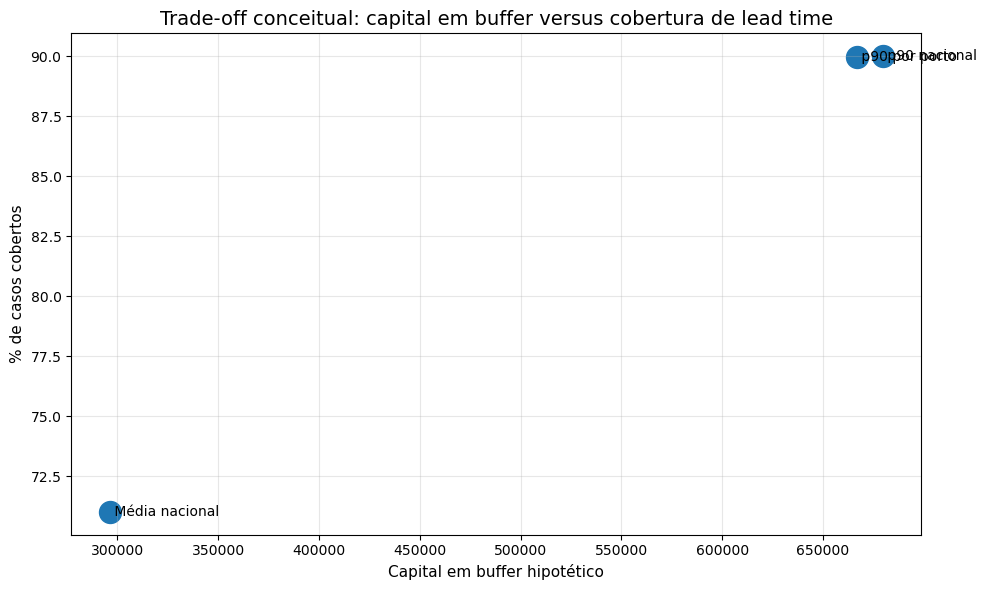

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/figures/eda_12_policy_buffer_tradeoff.png')

In [266]:
fig, ax = plt.subplots(figsize=(10, 6))

scatter = ax.scatter(
    policy_summary["estimated_capital_buffer"],
    policy_summary["pct_cases_covered"],
    s=250,
)

for _, row in policy_summary.iterrows():
    ax.text(
        row["estimated_capital_buffer"],
        row["pct_cases_covered"],
        f" {row['policy']}",
        va="center",
        fontsize=10,
    )

ax.set_title("Trade-off conceitual: capital em buffer versus cobertura de lead time")
ax.set_xlabel("Capital em buffer hipotético")
ax.set_ylabel("% de casos cobertos")
ax.grid(alpha=0.3)

figure_path = save_figure("eda_12_policy_buffer_tradeoff.png")
plt.show()

figure_path

A comparação simplificada mostra o trade-off clássico de planejamento:

- buffers menores reduzem capital empatado, mas cobrem menos casos;
- buffers maiores aumentam proteção, mas também aumentam capital;
- buffers segmentados podem melhorar o equilíbrio entre proteção e capital, desde que a segmentação capture diferenças reais de risco.

O p90 por porto já demonstra o valor de tratar contextos diferentes de forma diferente. Um modelo preditivo levaria essa lógica adiante, considerando simultaneamente porto, região, tipo de operação, calendário, clima e congestionamento.

### 12.6 Da análise exploratória à previsão dinâmica de lead time

O EDA mostrou que o lead time portuário varia conforme múltiplos fatores. Isso sugere que uma política baseada em médias históricas pode ser limitada.

Uma abordagem preditiva permitiria estimar o lead time esperado de cada escala com base em seu contexto:

$$
\hat{L} = f(porto, região, operação, calendário, clima, congestionamento)
$$

Onde $\hat{L}$ é o lead time previsto.

Com essa previsão, a empresa poderia criar buffers mais dinâmicos:

$$
Buffer_i = g(\hat{L}_i, risco_i, nível\ de\ serviço)
$$

Em vez de aplicar o mesmo buffer para todos os casos, o planejamento poderia diferenciar situações de baixo e alto risco.

In [267]:
static_vs_predictive_policy = pd.DataFrame(
    [
        {
            "dimension": "Lead time usado no planejamento",
            "static_policy": "Média ou regra fixa",
            "predictive_policy": "Previsão contextual por escala",
        },
        {
            "dimension": "Tratamento de portos diferentes",
            "static_policy": "Mesmo parâmetro ou regra simples",
            "predictive_policy": "Parâmetros aprendidos por porto, região e histórico",
        },
        {
            "dimension": "Tratamento de risco",
            "static_policy": "Buffer uniforme ou conservador",
            "predictive_policy": "Buffer ajustado ao risco previsto",
        },
        {
            "dimension": "Capital de giro",
            "static_policy": "Maior chance de excesso ou falta de estoque",
            "predictive_policy": "Potencial de reduzir excesso mantendo nível de serviço",
        },
        {
            "dimension": "Resposta a congestionamento",
            "static_policy": "Baixa sensibilidade ao estado recente do porto",
            "predictive_policy": "Uso de proxies recentes de congestionamento",
        },
        {
            "dimension": "Uso de clima e calendário",
            "static_policy": "Pouco ou nenhum uso",
            "predictive_policy": "Variáveis exógenas como features do modelo",
        },
    ]
)

static_vs_predictive_policy

,dimension,static_policy,predictive_policy
0,Lead time usado no planejamento,Média ou regra fixa,Previsão contextual por escala
1,Tratamento de portos diferentes,Mesmo parâmetro ou regra simples,"Parâmetros aprendidos por porto, região e hist..."
2,Tratamento de risco,Buffer uniforme ou conservador,Buffer ajustado ao risco previsto
3,Capital de giro,Maior chance de excesso ou falta de estoque,Potencial de reduzir excesso mantendo nível de...
4,Resposta a congestionamento,Baixa sensibilidade ao estado recente do porto,Uso de proxies recentes de congestionamento
5,Uso de clima e calendário,Pouco ou nenhum uso,Variáveis exógenas como features do modelo


### 12.7 Implicação prática para o TCC

O EDA sustenta a hipótese central do trabalho:

> A predição de lead time com técnicas de Inteligência Artificial pode apoiar decisões de Supply Chain ao estimar melhor a variabilidade operacional e permitir buffers mais ajustados ao risco.

No contexto deste projeto, a permanência portuária funciona como uma proxy de lead time logístico. A variabilidade observada nos dados públicos demonstra por que decisões baseadas apenas em médias podem ser insuficientes.

A aplicação prática pode ser descrita em quatro etapas:

1. prever o lead time de permanência portuária;
2. estimar o risco de atraso ou percentil esperado;
3. ajustar buffers de planejamento conforme o risco previsto;
4. reduzir excesso de capital empatado sem comprometer o nível de serviço.

Essa lógica conecta a análise de dados ao problema de negócio: transformar dados históricos e variáveis contextuais em decisões mais precisas de planejamento.

In [268]:
solution_flow = pd.DataFrame(
    [
        {
            "step": 1,
            "stage": "Dados históricos",
            "description": "Eventos portuários, localização, operação, calendário, clima e congestionamento.",
            "output": "Base analítica de lead time.",
        },
        {
            "step": 2,
            "stage": "EDA",
            "description": "Identificação de variabilidade, cauda longa e drivers de risco.",
            "output": "Hipóteses e features candidatas.",
        },
        {
            "step": 3,
            "stage": "Modelo preditivo",
            "description": "Estimativa do lead time esperado ou de percentis de risco.",
            "output": "Lead time previsto por contexto.",
        },
        {
            "step": 4,
            "stage": "Política de buffer",
            "description": "Conversão do lead time previsto em estoque de segurança ou janela logística.",
            "output": "Buffer ajustado ao risco.",
        },
        {
            "step": 5,
            "stage": "Impacto de negócio",
            "description": "Redução de excesso de estoque e melhor proteção contra atrasos.",
            "output": "Menor capital empatado com manutenção do nível de serviço.",
        },
    ]
)

solution_flow

,step,stage,description,output
0,1,Dados históricos,"Eventos portuários, localização, operação, cal...",Base analítica de lead time.
1,2,EDA,"Identificação de variabilidade, cauda longa e ...",Hipóteses e features candidatas.
2,3,Modelo preditivo,Estimativa do lead time esperado ou de percent...,Lead time previsto por contexto.
3,4,Política de buffer,Conversão do lead time previsto em estoque de ...,Buffer ajustado ao risco.
4,5,Impacto de negócio,Redução de excesso de estoque e melhor proteçã...,Menor capital empatado com manutenção do nível...


A contribuição do projeto não está apenas em prever uma duração.

A contribuição está em demonstrar como uma previsão mais contextualizada de lead time pode ser incorporada ao processo decisório de Supply Chain. A previsão se torna uma entrada para políticas de estoque, planejamento logístico, avaliação de risco e capital de giro.

In [269]:
median_lt = df_supply[supply_target_d].median()
mean_lt = df_supply[supply_target_d].mean()
p90_lt = df_supply[supply_target_d].quantile(0.90)
p95_lt = df_supply[supply_target_d].quantile(0.95)

risk_premium_p90 = p90_lt - median_lt
risk_premium_p95 = p95_lt - median_lt

policy_best_coverage = policy_summary.sort_values(
    "pct_cases_covered",
    ascending=False,
).iloc[0]

policy_lowest_buffer = policy_summary.sort_values(
    "estimated_capital_buffer",
    ascending=True,
).iloc[0]

section_12_narrative = f"""
A permanência portuária apresenta implicações diretas para decisões de Supply Chain.

A mediana nacional do lead time portuário é de {median_lt:.2f} dias, enquanto a média é de {mean_lt:.2f} dias.
O p90 é de {p90_lt:.2f} dias e o p95 é de {p95_lt:.2f} dias.

Isso significa que o prêmio de risco em relação à mediana é de {risk_premium_p90:.2f} dias no p90 e {risk_premium_p95:.2f} dias no p95.

Em termos de planejamento, essa diferença representa o intervalo adicional que a cadeia precisa cobrir para se proteger contra atrasos.
Políticas mais conservadoras aumentam cobertura, mas também aumentam capital em buffer. Políticas mais granulares, como p90 por porto ou modelos preditivos, podem melhorar esse equilíbrio ao diferenciar contextos de maior e menor risco.

Na comparação simplificada, a política com maior cobertura foi '{policy_best_coverage['policy']}', cobrindo {policy_best_coverage['pct_cases_covered']:.1f}% dos casos.
A política com menor buffer estimado foi '{policy_lowest_buffer['policy']}'.

Esses resultados reforçam a hipótese do TCC: modelos preditivos de lead time podem apoiar a redução de capital de giro ao calibrar buffers de forma mais precisa, sem depender apenas de médias históricas.
"""

print(section_12_narrative)


A permanência portuária apresenta implicações diretas para decisões de Supply Chain.

A mediana nacional do lead time portuário é de 1.60 dias, enquanto a média é de 2.96 dias.
O p90 é de 6.80 dias e o p95 é de 10.57 dias.

Isso significa que o prêmio de risco em relação à mediana é de 5.19 dias no p90 e 8.97 dias no p95.

Em termos de planejamento, essa diferença representa o intervalo adicional que a cadeia precisa cobrir para se proteger contra atrasos.
Políticas mais conservadoras aumentam cobertura, mas também aumentam capital em buffer. Políticas mais granulares, como p90 por porto ou modelos preditivos, podem melhorar esse equilíbrio ao diferenciar contextos de maior e menor risco.

Na comparação simplificada, a política com maior cobertura foi 'p90 nacional', cobrindo 90.0% dos casos.
A política com menor buffer estimado foi 'Média nacional'.

Esses resultados reforçam a hipótese do TCC: modelos preditivos de lead time podem apoiar a redução de capital de giro ao calibrar buff

In [270]:
lead_time_summary_path = TABLES_DIR / "eda_12_lead_time_summary.csv"
safety_stock_example_path = TABLES_DIR / "eda_12_safety_stock_example.csv"
port_supply_risk_path = TABLES_DIR / "eda_12_port_supply_risk.csv"
working_capital_params_path = TABLES_DIR / "eda_12_working_capital_params.csv"
national_working_capital_proxy_path = TABLES_DIR / "eda_12_national_working_capital_proxy.csv"
policy_summary_path = TABLES_DIR / "eda_12_policy_summary.csv"
static_vs_predictive_policy_path = TABLES_DIR / "eda_12_static_vs_predictive_policy.csv"
solution_flow_path = TABLES_DIR / "eda_12_solution_flow.csv"

lead_time_summary.to_csv(lead_time_summary_path, index=False)
safety_stock_example.to_csv(safety_stock_example_path, index=False)
port_supply_risk.to_csv(port_supply_risk_path, index=False)
working_capital_params.to_csv(working_capital_params_path, index=False)
national_working_capital_proxy.to_csv(national_working_capital_proxy_path, index=False)
policy_summary.to_csv(policy_summary_path, index=False)
static_vs_predictive_policy.to_csv(static_vs_predictive_policy_path, index=False)
solution_flow.to_csv(solution_flow_path, index=False)

[
    lead_time_summary_path,
    safety_stock_example_path,
    port_supply_risk_path,
    working_capital_params_path,
    national_working_capital_proxy_path,
    policy_summary_path,
    static_vs_predictive_policy_path,
    solution_flow_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_lead_time_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_safety_stock_example.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_port_supply_risk.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_working_capital_params.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_national_working_capital_proxy.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_policy_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_12_

### Principais mensagens da seção

A variabilidade da permanência portuária tem implicações diretas para Supply Chain.

Quando o lead time é incerto, empresas precisam se proteger contra atrasos por meio de estoques de segurança, buffers logísticos, antecipação de pedidos ou maior capital empatado. A diferença entre mediana, média e percentis superiores representa o risco operacional que precisa ser absorvido pelo planejamento.

O EDA mostrou que esse risco não é homogêneo. Ele varia por porto, região, tipo de operação, calendário, clima e congestionamento recente. Portanto, uma política única baseada em média nacional tende a ser limitada.

A principal implicação para o TCC é que modelos preditivos de lead time podem apoiar decisões mais inteligentes de planejamento. Em vez de usar buffers fixos, a empresa poderia ajustar o buffer conforme o risco previsto de cada contexto.

Essa abordagem tem potencial para reduzir excesso de capital de giro sem comprometer o nível de serviço, pois desloca o planejamento de uma lógica estática para uma lógica dinâmica e orientada por dados.

A próxima seção encerra o EDA, consolidando as conclusões gerais e criando a ponte para a etapa de modelagem preditiva.

---

## 13. Conclusão do EDA e ponte para modelagem

Este capítulo explorou a permanência de embarcações nos portos brasileiros como uma proxy de lead time logístico.

A análise partiu dos eventos principais da escala portuária — chegada ao porto, atracação, desatracação e saída — e decompôs a permanência total em três componentes:

1. espera para atracação;
2. operação atracada;
3. pós-operação.

Ao longo do EDA, foram analisadas dimensões estruturais, operacionais, temporais e externas que podem influenciar a permanência portuária:

- porto e localização geográfica;
- região e Unidade Federativa;
- tipo de operação;
- componentes do lead time;
- sazonalidade e calendário;
- clima;
- congestionamento e memória operacional.

O objetivo desta seção final é consolidar os principais achados e preparar a transição para a etapa de modelagem preditiva.

In [271]:
df_final = df.copy()

TARGET_H = "t_total_port_stay_h"
TARGET_D = "t_total_port_stay_d"

if TARGET_D not in df_final.columns:
    df_final[TARGET_D] = df_final[TARGET_H] / 24

eda_final_summary = {
    "n_port_calls": df_final["port_call_id"].nunique(),
    "n_ports": df_final["port"].nunique() if "port" in df_final.columns else np.nan,
    "n_regions": df_final["region"].nunique() if "region" in df_final.columns else np.nan,
    "period_start": df_final["arrival_port_ts"].min() if "arrival_port_ts" in df_final.columns else pd.NaT,
    "period_end": df_final["arrival_port_ts"].max() if "arrival_port_ts" in df_final.columns else pd.NaT,
    "median_total_stay_d": df_final[TARGET_D].median(),
    "mean_total_stay_d": df_final[TARGET_D].mean(),
    "p90_total_stay_d": df_final[TARGET_D].quantile(0.90),
    "p95_total_stay_d": df_final[TARGET_D].quantile(0.95),
    "p99_total_stay_d": df_final[TARGET_D].quantile(0.99),
}

eda_final_summary["p90_minus_median_d"] = (
    eda_final_summary["p90_total_stay_d"]
    - eda_final_summary["median_total_stay_d"]
)

eda_final_summary["p95_minus_median_d"] = (
    eda_final_summary["p95_total_stay_d"]
    - eda_final_summary["median_total_stay_d"]
)

eda_final_summary_df = pd.DataFrame(
    [{"metric": key, "value": value} for key, value in eda_final_summary.items()]
)

eda_final_summary_df

,metric,value
0,n_port_calls,129625
1,n_ports,109
2,n_regions,4
3,period_start,2023-01-01 00:08:00
4,period_end,2025-12-31 23:00:00
5,median_total_stay_d,1.60
6,mean_total_stay_d,2.96
7,p90_total_stay_d,6.80
8,p95_total_stay_d,10.57
9,p99_total_stay_d,21.99


In [272]:
n_port_calls = eda_final_summary["n_port_calls"]
n_ports = eda_final_summary["n_ports"]
n_regions = eda_final_summary["n_regions"]
period_start = eda_final_summary["period_start"]
period_end = eda_final_summary["period_end"]

median_d = eda_final_summary["median_total_stay_d"]
mean_d = eda_final_summary["mean_total_stay_d"]
p90_d = eda_final_summary["p90_total_stay_d"]
p95_d = eda_final_summary["p95_total_stay_d"]
p90_gap_d = eda_final_summary["p90_minus_median_d"]
p95_gap_d = eda_final_summary["p95_minus_median_d"]

executive_summary_text = f"""
A base final analisada contém {n_port_calls:,.0f} escalas portuárias elegíveis, distribuídas em {n_ports:,.0f} portos e {n_regions:,.0f} regiões.

O período analisado vai de {period_start.date() if pd.notna(period_start) else 'N/A'} a {period_end.date() if pd.notna(period_end) else 'N/A'}.

A mediana nacional da permanência total no porto é de {median_d:.2f} dias, enquanto a média é de {mean_d:.2f} dias.
O p90 é de {p90_d:.2f} dias e o p95 é de {p95_d:.2f} dias.

Isso significa que o cenário p90 adiciona {p90_gap_d:.2f} dias em relação ao comportamento mediano, enquanto o p95 adiciona {p95_gap_d:.2f} dias.

Essa diferença entre comportamento típico e cenários de risco confirma que a permanência portuária apresenta variabilidade relevante, com implicações diretas para planejamento logístico, estoques de segurança e capital de giro.
"""

print(executive_summary_text)


A base final analisada contém 129,625 escalas portuárias elegíveis, distribuídas em 109 portos e 4 regiões.

O período analisado vai de 2023-01-01 a 2025-12-31.

A mediana nacional da permanência total no porto é de 1.60 dias, enquanto a média é de 2.96 dias.
O p90 é de 6.80 dias e o p95 é de 10.57 dias.

Isso significa que o cenário p90 adiciona 5.19 dias em relação ao comportamento mediano, enquanto o p95 adiciona 8.97 dias.

Essa diferença entre comportamento típico e cenários de risco confirma que a permanência portuária apresenta variabilidade relevante, com implicações diretas para planejamento logístico, estoques de segurança e capital de giro.



O resumo executivo mostra que a permanência portuária não deve ser tratada apenas por médias históricas.

A diferença entre mediana, p90 e p95 indica que existe uma distância relevante entre o comportamento típico e os cenários de risco. Em Supply Chain, essa distância é justamente o espaço que precisa ser coberto por buffers, estoques de segurança, janelas logísticas ou capital adicional.

Portanto, a variabilidade observada no EDA é o principal argumento para avançar para modelos preditivos.

In [273]:
eda_key_findings = pd.DataFrame(
    [
        {
            "dimension": "Qualidade dos dados",
            "key_finding": "A base final do EDA contém apenas registros com eventos suficientes e consistentes para análise completa dos tempos.",
            "evidence": "Critério de elegibilidade baseado nos quatro eventos principais e consistência temporal.",
            "modeling_implication": "A modelagem deve partir da base elegível, mantendo rastreabilidade sobre registros excluídos.",
        },
        {
            "dimension": "Distribuição nacional",
            "key_finding": "A permanência total apresenta diferença relevante entre comportamento típico e cenários de risco.",
            "evidence": "Distância entre mediana, p90 e p95 da permanência total.",
            "modeling_implication": "Avaliar transformações no target e métricas robustas a cauda longa.",
        },
        {
            "dimension": "Geografia",
            "key_finding": "Portos e regiões apresentam perfis distintos de volume, tempo típico e variabilidade.",
            "evidence": "Mapas, rankings e matriz volume × variabilidade.",
            "modeling_implication": "Incluir porto, região, UF e coordenadas como features candidatas.",
        },
        {
            "dimension": "Portos críticos",
            "key_finding": "Alguns portos combinam alto volume operacional com alto risco de cauda.",
            "evidence": "Score exploratório de criticidade por porto.",
            "modeling_implication": "Avaliar desempenho do modelo por porto e não apenas no agregado nacional.",
        },
        {
            "dimension": "Componentes do lead time",
            "key_finding": "Espera, operação e pós-operação contribuem de formas diferentes para o tempo total.",
            "evidence": "Decomposição dos componentes e análise dos casos extremos.",
            "modeling_implication": "Usar permanência total como target principal e componentes para interpretação ou modelos auxiliares.",
        },
        {
            "dimension": "Tipo de operação",
            "key_finding": "Tipos de operação apresentam distribuições distintas de permanência total e componentes.",
            "evidence": "Flags operacionais, rankings por mediana, p90 e casos extremos.",
            "modeling_implication": "Representar operações como flags binárias independentes.",
        },
        {
            "dimension": "Calendário",
            "key_finding": "Há variações temporais por mês, dia da semana, turno ou estação.",
            "evidence": "Séries mensais, heatmaps e comparações por calendário.",
            "modeling_implication": "Incluir variáveis de calendário e testar interações com porto e região.",
        },
        {
            "dimension": "Clima",
            "key_finding": "Variáveis climáticas podem contribuir como fatores exógenos, especialmente em interações ou eventos extremos.",
            "evidence": "Cobertura climática, faixas de chuva/vento e correlações exploratórias.",
            "modeling_implication": "Manter clima como feature candidata, avaliando importância em modelos multivariados.",
        },
        {
            "dimension": "Congestionamento",
            "key_finding": "O histórico recente do porto pode representar memória operacional e pressão de volume.",
            "evidence": "Proxies de chegadas recentes, espera anterior e variabilidade recente.",
            "modeling_implication": "Usar apenas features disponíveis antes da previsão para evitar vazamento temporal.",
        },
        {
            "dimension": "Supply Chain",
            "key_finding": "A variabilidade do lead time se traduz em necessidade de buffers e capital de giro.",
            "evidence": "Prêmio de risco entre mediana, p90 e p95; simulações conceituais de buffer.",
            "modeling_implication": "Conectar previsões de lead time a políticas dinâmicas de estoque de segurança.",
        },
    ]
)

eda_key_findings

,dimension,key_finding,evidence,modeling_implication
0,Qualidade dos dados,A base final do EDA contém apenas registros co...,Critério de elegibilidade baseado nos quatro e...,"A modelagem deve partir da base elegível, mant..."
1,Distribuição nacional,A permanência total apresenta diferença releva...,"Distância entre mediana, p90 e p95 da permanên...",Avaliar transformações no target e métricas ro...
2,Geografia,Portos e regiões apresentam perfis distintos d...,"Mapas, rankings e matriz volume × variabilidade.","Incluir porto, região, UF e coordenadas como f..."
3,Portos críticos,Alguns portos combinam alto volume operacional...,Score exploratório de criticidade por porto.,Avaliar desempenho do modelo por porto e não a...
4,Componentes do lead time,"Espera, operação e pós-operação contribuem de ...",Decomposição dos componentes e análise dos cas...,Usar permanência total como target principal e...
5,Tipo de operação,Tipos de operação apresentam distribuições dis...,"Flags operacionais, rankings por mediana, p90 ...",Representar operações como flags binárias inde...
6,Calendário,"Há variações temporais por mês, dia da semana,...","Séries mensais, heatmaps e comparações por cal...",Incluir variáveis de calendário e testar inter...
7,Clima,Variáveis climáticas podem contribuir como fat...,"Cobertura climática, faixas de chuva/vento e c...","Manter clima como feature candidata, avaliando..."
8,Congestionamento,O histórico recente do porto pode representar ...,"Proxies de chegadas recentes, espera anterior ...",Usar apenas features disponíveis antes da prev...
9,Supply Chain,A variabilidade do lead time se traduz em nece...,"Prêmio de risco entre mediana, p90 e p95; simu...",Conectar previsões de lead time a políticas di...


In [274]:
eda_key_findings_path = TABLES_DIR / "eda_13_key_findings.csv"
eda_key_findings.to_csv(eda_key_findings_path, index=False)

eda_key_findings_path

WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_key_findings.csv')

### 13.3 Target principal e targets auxiliares

A análise exploratória indica que a **permanência total no porto** deve ser o target principal da modelagem.

Essa variável representa o lead time completo da escala portuária e está diretamente conectada ao problema de Supply Chain: quanto tempo uma carga, embarcação ou fluxo logístico fica sujeito ao processo portuário.

Os componentes internos continuam importantes, mas possuem papel diferente:

- ajudam a interpretar onde o tempo total é gerado;
- permitem diagnósticos operacionais;
- podem ser usados em modelos auxiliares;
- não devem ser usados como features para prever o total se não forem conhecidos no momento da previsão.

Portanto, a recomendação é:

> Target principal: `t_total_port_stay_h` ou sua versão transformada `log_t_total_port_stay_h`.

> Targets auxiliares: `t_wait_for_berthing_h`, `t_operation_h`, `t_post_operation_h`.

In [275]:
final_target_strategy = pd.DataFrame(
    [
        {
            "target": "t_total_port_stay_h",
            "label": "Permanência total no porto",
            "recommended_use": "Target principal",
            "business_meaning": "Lead time completo da escala portuária.",
            "modeling_notes": "Avaliar modelos em horas e também transformação log1p por causa de assimetria.",
        },
        {
            "target": "log_t_total_port_stay_h",
            "label": "Log da permanência total",
            "recommended_use": "Target alternativo",
            "business_meaning": "Versão transformada para reduzir influência da cauda longa.",
            "modeling_notes": "Usar np.log1p no treino e np.expm1 para retornar à escala original.",
        },
        {
            "target": "t_wait_for_berthing_h",
            "label": "Espera para atracação",
            "recommended_use": "Target auxiliar",
            "business_meaning": "Fila, disponibilidade de berço e congestionamento antes da atracação.",
            "modeling_notes": "Cuidado com excesso de zeros e granularidade do dado.",
        },
        {
            "target": "t_operation_h",
            "label": "Operação atracada",
            "recommended_use": "Target auxiliar possível",
            "business_meaning": "Tempo efetivo em operação atracada.",
            "modeling_notes": "Pode ser fortemente influenciado pelo tipo de operação.",
        },
        {
            "target": "t_post_operation_h",
            "label": "Pós-operação",
            "recommended_use": "Target auxiliar",
            "business_meaning": "Tempo entre desatracação e saída do porto.",
            "modeling_notes": "Cuidado com excesso de zeros e granularidade do dado.",
        },
    ]
)

final_target_strategy

,target,label,recommended_use,business_meaning,modeling_notes
0,t_total_port_stay_h,Permanência total no porto,Target principal,Lead time completo da escala portuária.,Avaliar modelos em horas e também transformaçã...
1,log_t_total_port_stay_h,Log da permanência total,Target alternativo,Versão transformada para reduzir influência da...,Usar np.log1p no treino e np.expm1 para retorn...
2,t_wait_for_berthing_h,Espera para atracação,Target auxiliar,"Fila, disponibilidade de berço e congestioname...",Cuidado com excesso de zeros e granularidade d...
3,t_operation_h,Operação atracada,Target auxiliar possível,Tempo efetivo em operação atracada.,Pode ser fortemente influenciado pelo tipo de ...
4,t_post_operation_h,Pós-operação,Target auxiliar,Tempo entre desatracação e saída do porto.,Cuidado com excesso de zeros e granularidade d...


### 13.4 Features recomendadas para modelagem

Com base no EDA, a modelagem deve considerar uma combinação de features estruturais, operacionais, temporais e dinâmicas.

O ponto mais importante é garantir que todas as features usadas no modelo estejam disponíveis no momento em que a previsão seria feita.

Isso evita vazamento de informação e torna a avaliação mais próxima de um cenário real de uso.

In [276]:
final_feature_groups = pd.DataFrame(
    [
        {
            "feature_family": "Identificação geográfica",
            "examples": "port, state, region, latitude, longitude",
            "priority": "Alta",
            "reason": "Captura heterogeneidade estrutural entre portos e regiões.",
            "leakage_risk": "Baixo",
        },
        {
            "feature_family": "Tipo de operação",
            "examples": "op_carga, op_descarga, op_fundeio, op_offshore, op_reparo_manutencao",
            "priority": "Alta",
            "reason": "Operações diferentes apresentam perfis distintos de tempo e risco.",
            "leakage_risk": "Baixo, se conhecido no planejamento da escala.",
        },
        {
            "feature_family": "Calendário",
            "examples": "arrival_month, arrival_dayofweek, arrival_hour, arrival_shift, arrival_season",
            "priority": "Média",
            "reason": "Captura sazonalidade e padrões operacionais no tempo.",
            "leakage_risk": "Baixo",
        },
        {
            "feature_family": "Clima",
            "examples": "rain_sum, precipitation_hours, wind_speed_10m_max, wind_gusts_10m_max",
            "priority": "Média",
            "reason": "Representa condições externas que podem afetar operação e risco.",
            "leakage_risk": "Médio; em produção, usar previsão do tempo ou clima observado disponível no momento.",
        },
        {
            "feature_family": "Histórico climático",
            "examples": "rain_sum_prev_3d, wind_speed_10m_max_prev_7d, precipitation_hours_prev_7d",
            "priority": "Média",
            "reason": "Captura efeitos acumulados antes da chegada.",
            "leakage_risk": "Baixo, se baseado apenas em datas anteriores.",
        },
        {
            "feature_family": "Congestionamento recente",
            "examples": "avg_wait_prev_20_calls_port, arrivals_prev_7d_avg_port, std_wait_prev_20_calls_port",
            "priority": "Alta",
            "reason": "Representa memória operacional e estado recente do porto.",
            "leakage_risk": "Médio; garantir uso apenas de histórico anterior à escala.",
        },
        {
            "feature_family": "Volume no mesmo dia",
            "examples": "arrivals_same_day_port",
            "priority": "Experimental",
            "reason": "Pode capturar pressão operacional do dia.",
            "leakage_risk": "Alto se calculado com informação não disponível no momento da previsão.",
        },
    ]
)

final_feature_groups

,feature_family,examples,priority,reason,leakage_risk
0,Identificação geográfica,"port, state, region, latitude, longitude",Alta,Captura heterogeneidade estrutural entre porto...,Baixo
1,Tipo de operação,"op_carga, op_descarga, op_fundeio, op_offshore...",Alta,Operações diferentes apresentam perfis distint...,"Baixo, se conhecido no planejamento da escala."
2,Calendário,"arrival_month, arrival_dayofweek, arrival_hour...",Média,Captura sazonalidade e padrões operacionais no...,Baixo
3,Clima,"rain_sum, precipitation_hours, wind_speed_10m_...",Média,Representa condições externas que podem afetar...,"Médio; em produção, usar previsão do tempo ou ..."
4,Histórico climático,"rain_sum_prev_3d, wind_speed_10m_max_prev_7d, ...",Média,Captura efeitos acumulados antes da chegada.,"Baixo, se baseado apenas em datas anteriores."
5,Congestionamento recente,"avg_wait_prev_20_calls_port, arrivals_prev_7d_...",Alta,Representa memória operacional e estado recent...,Médio; garantir uso apenas de histórico anteri...
6,Volume no mesmo dia,arrivals_same_day_port,Experimental,Pode capturar pressão operacional do dia.,Alto se calculado com informação não disponíve...


### 13.5 Estratégia recomendada de validação

Como o problema envolve eventos ao longo do tempo, a validação do modelo deve respeitar a ordem temporal.

Uma divisão aleatória simples pode gerar avaliação otimista, porque o modelo pode aprender padrões de períodos futuros e aplicá-los no passado. Para um problema de previsão de lead time, a validação mais adequada é temporal.

A recomendação é usar uma estratégia como:

- treino em períodos mais antigos;
- validação em período posterior;
- teste final em período mais recente.

Essa abordagem simula melhor o uso real do modelo: aprender com o histórico e prever eventos futuros.

In [277]:
validation_strategy = pd.DataFrame(
    [
        {
            "step": "Ordenação temporal",
            "description": "Ordenar os registros por arrival_port_ts.",
            "reason": "Preservar a sequência real dos eventos.",
        },
        {
            "step": "Treino",
            "description": "Usar os primeiros 70% dos registros no tempo.",
            "reason": "Aprender padrões históricos.",
        },
        {
            "step": "Validação",
            "description": "Usar os próximos 15% dos registros no tempo.",
            "reason": "Ajustar hiperparâmetros e comparar modelos.",
        },
        {
            "step": "Teste",
            "description": "Usar os últimos 15% dos registros no tempo.",
            "reason": "Avaliar generalização em período mais recente.",
        },
        {
            "step": "Avaliação segmentada",
            "description": "Medir performance por porto, região, operação e faixas de lead time.",
            "reason": "Evitar que boa performance média esconda erros em segmentos críticos.",
        },
    ]
)

validation_strategy

,step,description,reason
0,Ordenação temporal,Ordenar os registros por arrival_port_ts.,Preservar a sequência real dos eventos.
1,Treino,Usar os primeiros 70% dos registros no tempo.,Aprender padrões históricos.
2,Validação,Usar os próximos 15% dos registros no tempo.,Ajustar hiperparâmetros e comparar modelos.
3,Teste,Usar os últimos 15% dos registros no tempo.,Avaliar generalização em período mais recente.
4,Avaliação segmentada,"Medir performance por porto, região, operação ...",Evitar que boa performance média esconda erros...


In [278]:
df_modeling_split = df_final.dropna(subset=["arrival_port_ts", TARGET_H]).copy()
df_modeling_split["arrival_port_ts"] = pd.to_datetime(
    df_modeling_split["arrival_port_ts"],
    errors="coerce",
)

df_modeling_split = df_modeling_split.sort_values("arrival_port_ts").reset_index(drop=True)

n = len(df_modeling_split)
train_end = int(n * 0.70)
valid_end = int(n * 0.85)

df_modeling_split["split"] = "test"
df_modeling_split.loc[:train_end - 1, "split"] = "train"
df_modeling_split.loc[train_end:valid_end - 1, "split"] = "validation"

split_summary = (
    df_modeling_split
    .groupby("split")
    .agg(
        n_rows=("port_call_id", "count"),
        period_start=("arrival_port_ts", "min"),
        period_end=("arrival_port_ts", "max"),
        median_target_d=(TARGET_D, "median"),
        p90_target_d=(TARGET_D, lambda x: x.quantile(0.90)),
    )
    .reset_index()
)

split_summary

,split,n_rows,period_start,period_end,median_target_d,p90_target_d
0,test,19444,2025-07-15 06:12:00,2025-12-31 23:00:00,1.66,6.69
1,train,90737,2023-01-01 00:08:00,2025-01-30 15:30:00,1.59,6.88
2,validation,19444,2025-01-30 15:35:00,2025-07-15 06:10:00,1.60,6.54


### 13.6 Métricas recomendadas para modelagem

Como o target apresenta assimetria e cauda longa, a avaliação do modelo não deve depender de uma única métrica.

Métricas como RMSE penalizam fortemente erros grandes, o que pode ser útil para capturar atrasos extremos, mas também pode tornar a avaliação muito sensível a outliers. Métricas como MAE e MedAE são mais robustas e mais fáceis de interpretar em horas ou dias.

Além disso, como o problema envolve risco de atraso, pode ser interessante avaliar também modelos ou métricas baseadas em quantis.

In [279]:
model_metrics_recommendation = pd.DataFrame(
    [
        {
            "metric": "MAE",
            "full_name": "Mean Absolute Error",
            "interpretation": "Erro absoluto médio em horas ou dias.",
            "why_use": "Fácil interpretação operacional.",
        },
        {
            "metric": "MedAE",
            "full_name": "Median Absolute Error",
            "interpretation": "Erro absoluto mediano.",
            "why_use": "Robusto a outliers e cauda longa.",
        },
        {
            "metric": "RMSE",
            "full_name": "Root Mean Squared Error",
            "interpretation": "Erro quadrático médio na escala original.",
            "why_use": "Penaliza fortemente grandes erros.",
        },
        {
            "metric": "RMSLE",
            "full_name": "Root Mean Squared Log Error",
            "interpretation": "Erro em escala logarítmica.",
            "why_use": "Útil para target assimétrico e positivo.",
        },
        {
            "metric": "Pinball Loss",
            "full_name": "Quantile Loss",
            "interpretation": "Erro para previsão de quantis, como p50 ou p90.",
            "why_use": "Permite modelar risco, não apenas valor esperado.",
        },
        {
            "metric": "Coverage p90",
            "full_name": "Cobertura do quantil p90",
            "interpretation": "Percentual de casos abaixo da previsão p90.",
            "why_use": "Avalia se o quantil previsto está calibrado.",
        },
    ]
)

model_metrics_recommendation

,metric,full_name,interpretation,why_use
0,MAE,Mean Absolute Error,Erro absoluto médio em horas ou dias.,Fácil interpretação operacional.
1,MedAE,Median Absolute Error,Erro absoluto mediano.,Robusto a outliers e cauda longa.
2,RMSE,Root Mean Squared Error,Erro quadrático médio na escala original.,Penaliza fortemente grandes erros.
3,RMSLE,Root Mean Squared Log Error,Erro em escala logarítmica.,Útil para target assimétrico e positivo.
4,Pinball Loss,Quantile Loss,"Erro para previsão de quantis, como p50 ou p90.","Permite modelar risco, não apenas valor esperado."
5,Coverage p90,Cobertura do quantil p90,Percentual de casos abaixo da previsão p90.,Avalia se o quantil previsto está calibrado.


### 13.7 Modelos candidatos

A etapa de modelagem deve começar simples e evoluir gradualmente.

Primeiro, é importante criar baselines interpretáveis. Depois, modelos mais flexíveis podem ser testados para capturar não linearidades e interações entre porto, operação, calendário, clima e congestionamento.

A recomendação é comparar pelo menos três níveis de modelo:

1. **Baselines estatísticos**, como média global, mediana global, média por porto e mediana por porto.
2. **Modelos lineares regularizados**, para criar uma referência interpretável.
3. **Modelos de árvore/boosting**, como Random Forest, XGBoost, LightGBM ou CatBoost, para capturar relações não lineares.

In [280]:
candidate_models = pd.DataFrame(
    [
        {
            "model_group": "Baseline global",
            "examples": "Média global, mediana global",
            "purpose": "Criar referência mínima de desempenho.",
            "expected_strength": "Simplicidade e interpretabilidade.",
            "limitation": "Ignora diferenças entre portos, operações e períodos.",
        },
        {
            "model_group": "Baseline segmentado",
            "examples": "Mediana por porto, mediana por porto + operação",
            "purpose": "Testar ganho de segmentação simples.",
            "expected_strength": "Fácil de explicar para público de negócio.",
            "limitation": "Pouca flexibilidade e problemas em segmentos com poucos dados.",
        },
        {
            "model_group": "Modelo linear",
            "examples": "Linear Regression, Ridge, Lasso, Elastic Net",
            "purpose": "Avaliar relações lineares entre features e lead time.",
            "expected_strength": "Interpretação dos coeficientes.",
            "limitation": "Pode não capturar cauda longa e interações complexas.",
        },
        {
            "model_group": "Árvores",
            "examples": "Decision Tree, Random Forest",
            "purpose": "Capturar não linearidades e interações.",
            "expected_strength": "Boa flexibilidade e interpretação por importância de variáveis.",
            "limitation": "Pode exigir cuidado com overfitting.",
        },
        {
            "model_group": "Gradient Boosting",
            "examples": "XGBoost, LightGBM, CatBoost, HistGradientBoosting",
            "purpose": "Obter melhor desempenho preditivo em dados tabulares.",
            "expected_strength": "Geralmente forte para problemas tabulares com interações.",
            "limitation": "Menos interpretável que modelos simples.",
        },
        {
            "model_group": "Modelos de quantil",
            "examples": "Quantile Regression, Gradient Boosting Quantile",
            "purpose": "Prever p50, p90 ou p95 do lead time.",
            "expected_strength": "Conecta diretamente com risco e buffers.",
            "limitation": "Requer avaliação específica de calibração dos quantis.",
        },
    ]
)

candidate_models

,model_group,examples,purpose,expected_strength,limitation
0,Baseline global,"Média global, mediana global",Criar referência mínima de desempenho.,Simplicidade e interpretabilidade.,"Ignora diferenças entre portos, operações e pe..."
1,Baseline segmentado,"Mediana por porto, mediana por porto + operação",Testar ganho de segmentação simples.,Fácil de explicar para público de negócio.,Pouca flexibilidade e problemas em segmentos c...
2,Modelo linear,"Linear Regression, Ridge, Lasso, Elastic Net",Avaliar relações lineares entre features e lea...,Interpretação dos coeficientes.,Pode não capturar cauda longa e interações com...
3,Árvores,"Decision Tree, Random Forest",Capturar não linearidades e interações.,Boa flexibilidade e interpretação por importân...,Pode exigir cuidado com overfitting.
4,Gradient Boosting,"XGBoost, LightGBM, CatBoost, HistGradientBoosting",Obter melhor desempenho preditivo em dados tab...,Geralmente forte para problemas tabulares com ...,Menos interpretável que modelos simples.
5,Modelos de quantil,"Quantile Regression, Gradient Boosting Quantile","Prever p50, p90 ou p95 do lead time.",Conecta diretamente com risco e buffers.,Requer avaliação específica de calibração dos ...


### 13.8 Ponte para o próximo notebook de modelagem

Com o EDA concluído, a próxima etapa do projeto deve transformar os achados exploratórios em um pipeline de modelagem.

A sugestão é criar um novo notebook:

`notebooks/08_modeling_port_leadtime.ipynb`

Esse notebook deve ter como objetivo construir, comparar e avaliar modelos preditivos para a permanência total no porto.

In [281]:
modeling_notebook_outline = pd.DataFrame(
    [
        {
            "section": "0. Setup",
            "description": "Imports, paths, leitura da eda_base e configurações.",
        },
        {
            "section": "1. Definição do problema",
            "description": "Target principal, horizonte de previsão e restrições de disponibilidade das features.",
        },
        {
            "section": "2. Seleção de features",
            "description": "Features geográficas, operacionais, temporais, climáticas e de congestionamento.",
        },
        {
            "section": "3. Split temporal",
            "description": "Separação treino/validação/teste respeitando arrival_port_ts.",
        },
        {
            "section": "4. Baselines",
            "description": "Média global, mediana global, mediana por porto e por segmentos.",
        },
        {
            "section": "5. Pré-processamento",
            "description": "Tratamento de categóricas, numéricas, missing values e transformações do target.",
        },
        {
            "section": "6. Modelos supervisionados",
            "description": "Modelos lineares, árvores, Random Forest e boosting.",
        },
        {
            "section": "7. Avaliação",
            "description": "MAE, RMSE, RMSLE, MedAE, avaliação por porto, região, operação e tempo.",
        },
        {
            "section": "8. Interpretabilidade",
            "description": "Importância de variáveis, partial dependence, SHAP se aplicável.",
        },
        {
            "section": "9. Quantis e risco",
            "description": "Modelagem de p50/p90/p95 ou análise dos erros em casos extremos.",
        },
        {
            "section": "10. Conclusão",
            "description": "Modelo recomendado, limitações e conexão com estoques de segurança.",
        },
    ]
)

modeling_notebook_outline

,section,description
0,0. Setup,"Imports, paths, leitura da eda_base e configur..."
1,1. Definição do problema,"Target principal, horizonte de previsão e rest..."
2,2. Seleção de features,"Features geográficas, operacionais, temporais,..."
3,3. Split temporal,Separação treino/validação/teste respeitando a...
4,4. Baselines,"Média global, mediana global, mediana por port..."
5,5. Pré-processamento,"Tratamento de categóricas, numéricas, missing ..."
6,6. Modelos supervisionados,"Modelos lineares, árvores, Random Forest e boo..."
7,7. Avaliação,"MAE, RMSE, RMSLE, MedAE, avaliação por porto, ..."
8,8. Interpretabilidade,"Importância de variáveis, partial dependence, ..."
9,9. Quantis e risco,Modelagem de p50/p90/p95 ou análise dos erros ...


### 13.9 Conclusão final do capítulo

A análise exploratória demonstrou que a permanência portuária no Brasil apresenta variabilidade relevante e heterogeneidade entre diferentes contextos operacionais.

Os resultados indicam que o lead time portuário não deve ser tratado como um valor fixo ou homogêneo. A permanência total varia conforme o porto, a região, o tipo de operação, o período do calendário, as condições climáticas e o estado recente de congestionamento do porto.

Além disso, a distribuição apresenta diferença importante entre comportamento típico e cenários de risco. Essa distância entre mediana, p90 e p95 tem implicações diretas para Supply Chain, pois representa o intervalo adicional que precisa ser coberto por estoques de segurança, buffers logísticos ou capital de giro.

Do ponto de vista metodológico, o EDA sustenta três conclusões centrais:

1. **A permanência total no porto é o target mais adequado para a modelagem principal**, pois representa o lead time completo da escala portuária.
2. **Os componentes internos do lead time são fundamentais para interpretação**, pois ajudam a entender se o atraso está associado à espera, à operação ou ao pós-operação.
3. **A modelagem deve ser contextual**, incorporando variáveis estruturais, operacionais, temporais, climáticas e de congestionamento.

Esses achados justificam a próxima etapa do projeto: desenvolver modelos preditivos capazes de estimar a permanência portuária esperada e, idealmente, o risco de atraso.

A contribuição para Supply Chain está em transformar dados históricos em uma visão dinâmica de lead time. Ao prever melhor a variabilidade, torna-se possível apoiar políticas mais inteligentes de estoque de segurança e capital de giro, reduzindo buffers excessivos sem aumentar de forma descontrolada o risco operacional.

In [282]:
final_eda_narrative = f"""
Este EDA analisou {n_port_calls:,.0f} escalas portuárias elegíveis, distribuídas em {n_ports:,.0f} portos.

A permanência total no porto foi tratada como proxy de lead time logístico.
A mediana nacional foi de {median_d:.2f} dias, enquanto o p90 foi de {p90_d:.2f} dias e o p95 foi de {p95_d:.2f} dias.

A diferença entre mediana e p90, de {p90_gap_d:.2f} dias, representa uma medida prática do risco de cauda do lead time.
Essa diferença é relevante para Supply Chain porque buffers e estoques de segurança precisam proteger a operação contra atrasos, não apenas contra o comportamento médio.

O EDA mostrou que essa variabilidade não é homogênea. Ela muda por porto, região, tipo de operação, calendário, clima e congestionamento recente.
Portanto, uma política baseada apenas em médias históricas tende a ser limitada.

A próxima etapa recomendada é construir modelos preditivos para estimar a permanência total no porto, usando validação temporal e métricas robustas.
Além de prever o valor esperado, será importante avaliar o risco de atraso, especialmente por meio de percentis como p90 ou p95.

Com isso, o projeto avança da análise exploratória para uma abordagem orientada à decisão: usar Inteligência Artificial para prever lead time e apoiar políticas dinâmicas de estoque de segurança e capital de giro.
"""

print(final_eda_narrative)


Este EDA analisou 129,625 escalas portuárias elegíveis, distribuídas em 109 portos.

A permanência total no porto foi tratada como proxy de lead time logístico.
A mediana nacional foi de 1.60 dias, enquanto o p90 foi de 6.80 dias e o p95 foi de 10.57 dias.

A diferença entre mediana e p90, de 5.19 dias, representa uma medida prática do risco de cauda do lead time.
Essa diferença é relevante para Supply Chain porque buffers e estoques de segurança precisam proteger a operação contra atrasos, não apenas contra o comportamento médio.

O EDA mostrou que essa variabilidade não é homogênea. Ela muda por porto, região, tipo de operação, calendário, clima e congestionamento recente.
Portanto, uma política baseada apenas em médias históricas tende a ser limitada.

A próxima etapa recomendada é construir modelos preditivos para estimar a permanência total no porto, usando validação temporal e métricas robustas.
Além de prever o valor esperado, será importante avaliar o risco de atraso, especial

In [283]:
eda_final_summary_path = TABLES_DIR / "eda_13_final_summary.csv"
final_target_strategy_path = TABLES_DIR / "eda_13_final_target_strategy.csv"
final_feature_groups_path = TABLES_DIR / "eda_13_final_feature_groups.csv"
validation_strategy_path = TABLES_DIR / "eda_13_validation_strategy.csv"
split_summary_path = TABLES_DIR / "eda_13_temporal_split_summary.csv"
model_metrics_recommendation_path = TABLES_DIR / "eda_13_model_metrics_recommendation.csv"
candidate_models_path = TABLES_DIR / "eda_13_candidate_models.csv"
modeling_notebook_outline_path = TABLES_DIR / "eda_13_modeling_notebook_outline.csv"

eda_final_summary_df.to_csv(eda_final_summary_path, index=False)
final_target_strategy.to_csv(final_target_strategy_path, index=False)
final_feature_groups.to_csv(final_feature_groups_path, index=False)
validation_strategy.to_csv(validation_strategy_path, index=False)
split_summary.to_csv(split_summary_path, index=False)
model_metrics_recommendation.to_csv(model_metrics_recommendation_path, index=False)
candidate_models.to_csv(candidate_models_path, index=False)
modeling_notebook_outline.to_csv(modeling_notebook_outline_path, index=False)

[
    eda_final_summary_path,
    eda_key_findings_path,
    final_target_strategy_path,
    final_feature_groups_path,
    validation_strategy_path,
    split_summary_path,
    model_metrics_recommendation_path,
    candidate_models_path,
    modeling_notebook_outline_path,
]

[WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_final_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_key_findings.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_final_target_strategy.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_final_feature_groups.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_validation_strategy.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_temporal_split_summary.csv'),
 WindowsPath('G:/My Drive/Graduação e Pós/USP/MBA USP IA e Big Data/TCC/port_leadtime_prediction/outputs/tables/eda_13_model_metric

## Fechamento do EDA

Este notebook conclui a etapa exploratória do projeto.

A principal conclusão é que o lead time portuário apresenta variabilidade suficiente para justificar uma abordagem preditiva. A permanência total no porto é influenciada por múltiplas dimensões e apresenta diferença relevante entre comportamento típico e cenários de risco.

Esses resultados criam a base analítica para a próxima fase do TCC: desenvolver modelos de predição de lead time e avaliar como suas previsões podem apoiar decisões de Supply Chain, especialmente na definição de buffers, estoques de segurança e capital de giro.

O próximo notebook recomendado é:

`notebooks/08_modeling_port_leadtime.ipynb`